<a href="https://colab.research.google.com/github/smlra-kjsce/Introduction-to-VAEs-and-GANs/blob/master/VAE%20Intuition.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [0]:
import torch
import torch.nn.functional as nn
import torch.autograd as autograd
import torch.optim as optim
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import os
from torch.autograd import Variable
import numpy as np
from torchvision import transforms

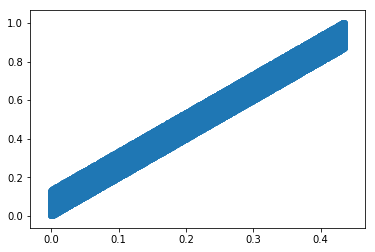

In [0]:
# Data Generation
import numpy as np
import matplotlib.pyplot as plt

x = np.array([i/100 for i in range(100000)])
y = 2*x + 5 + np.array([np.random.rand()*300 for i in range(100000)])
XX = np.array([x,y]).T
XX = XX/np.max(XX)
plt.scatter(XX.T[0],XX.T[1])
XX = torch.Tensor(XX)

In [0]:
mb_size = 10000
Z_dim = 2
X_dim = 2
h_dim = 100
c = 0
lr = 1e-2

In [0]:
def xavier_init(size):
    in_dim = size[0]
    xavier_stddev = 1. / np.sqrt(in_dim / 2.)
    return Variable(torch.randn(*size) * xavier_stddev, requires_grad=True)

In [0]:

# Encoder

Wxh = xavier_init(size=[X_dim, h_dim])
bxh = Variable(torch.zeros(h_dim), requires_grad=True)

Whz_mu = xavier_init(size=[h_dim, Z_dim])
bhz_mu = Variable(torch.zeros(Z_dim), requires_grad=True)

Whz_var = xavier_init(size=[h_dim, Z_dim])
bhz_var = Variable(torch.zeros(Z_dim), requires_grad=True)


def Q(X):
    h = nn.relu(X @ Wxh + bxh.repeat(X.size(0), 1))
    z_mu = h @ Whz_mu + bhz_mu.repeat(h.size(0), 1)
    z_var = h @ Whz_var + bhz_var.repeat(h.size(0), 1)
    return z_mu, z_var


def sample_z(mu, log_var):
    eps = Variable(torch.randn(mb_size, Z_dim))
    return mu + torch.exp(log_var / 2) * eps

In [0]:
# Decoder

Wzh = xavier_init(size=[Z_dim, h_dim])
bzh = Variable(torch.zeros(h_dim), requires_grad=True)

Whx = xavier_init(size=[h_dim, X_dim])
bhx = Variable(torch.zeros(X_dim), requires_grad=True)


def P(z):
    h = nn.relu(z @ Wzh + bzh.repeat(z.size(0), 1))
    X = nn.sigmoid(h @ Whx + bhx.repeat(h.size(0), 1))
    return X

/usr/local/lib/python3.6/dist-packages/torch/nn/functional.py:1350: UserWarning: nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.
  warnings.warn("nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.")
/usr/local/lib/python3.6/dist-packages/torch/nn/_reduction.py:43: UserWarning: size_average and reduce args will be deprecated, please use reduction='sum' instead.
  warnings.warn(warning.format(ret))


tensor(25.2939, grad_fn=<AddBackward0>)
X_sample tensor([[0.3569, 0.9117],
        [0.1070, 0.9430],
        [0.0120, 0.9996],
        ...,
        [0.8478, 0.8018],
        [0.8844, 0.6191],
        [0.0495, 0.9938]])


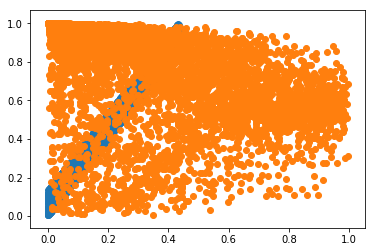

idx tensor([ 4263, 14388, 31328,  ..., 96002, 19689, 96229])
X tensor([[0.0185, 0.1203],
        [0.0624, 0.2256],
        [0.1360, 0.3437],
        ...,
        [0.4166, 0.8561],
        [0.0854, 0.2601],
        [0.4176, 0.9168]])
X_sample tensor([[0.8466, 0.3943],
        [0.8067, 0.5124],
        [0.0858, 0.9495],
        ...,
        [0.1150, 0.9233],
        [0.8412, 0.4752],
        [0.4835, 0.7852]], grad_fn=<SigmoidBackward>)
tensor(17.9145, grad_fn=<AddBackward0>)
X_sample tensor([[0.8466, 0.3943],
        [0.8067, 0.5124],
        [0.0858, 0.9495],
        ...,
        [0.1150, 0.9233],
        [0.8412, 0.4752],
        [0.4835, 0.7852]])


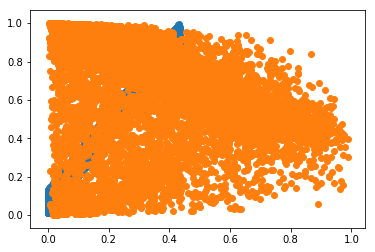

tensor(15.2297, grad_fn=<AddBackward0>)
X_sample tensor([[0.2878, 0.1468],
        [0.5237, 0.5424],
        [0.2794, 0.8650],
        ...,
        [0.4172, 0.6779],
        [0.1487, 0.9574],
        [0.2963, 0.8315]])


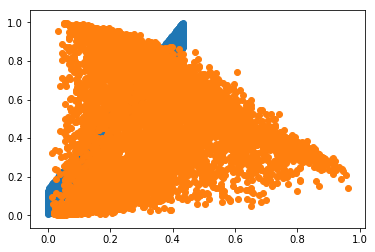

tensor(14.7440, grad_fn=<AddBackward0>)
X_sample tensor([[0.5170, 0.4289],
        [0.4790, 0.4927],
        [0.3282, 0.2218],
        ...,
        [0.5634, 0.3982],
        [0.3126, 0.7898],
        [0.2560, 0.1862]])


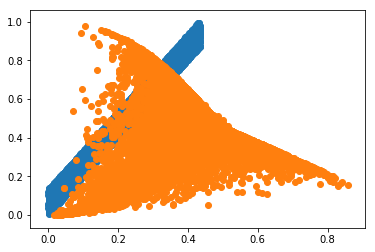

tensor(14.3446, grad_fn=<AddBackward0>)
X_sample tensor([[0.5394, 0.2942],
        [0.3527, 0.3379],
        [0.4098, 0.5948],
        ...,
        [0.4233, 0.5238],
        [0.1543, 0.1023],
        [0.6011, 0.1784]])


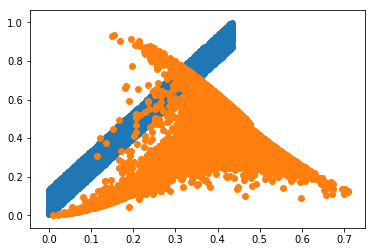

tensor(13.8095, grad_fn=<AddBackward0>)
X_sample tensor([[0.4293, 0.4358],
        [0.4665, 0.3340],
        [0.4158, 0.3929],
        ...,
        [0.4184, 0.3806],
        [0.4355, 0.5005],
        [0.4024, 0.5836]])


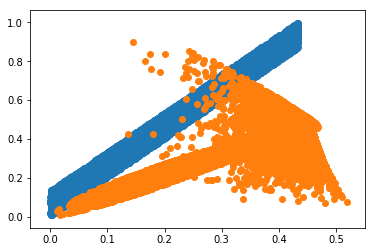

tensor(13.5174, grad_fn=<AddBackward0>)
X_sample tensor([[0.3883, 0.3064],
        [0.0993, 0.2924],
        [0.2560, 0.3421],
        ...,
        [0.4046, 0.4267],
        [0.4420, 0.4420],
        [0.4038, 0.3286]])


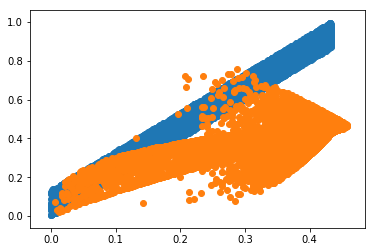

tensor(13.4015, grad_fn=<AddBackward0>)
X_sample tensor([[0.2949, 0.3912],
        [0.3745, 0.4824],
        [0.3077, 0.2878],
        ...,
        [0.4279, 0.4987],
        [0.3615, 0.3886],
        [0.3686, 0.4072]])


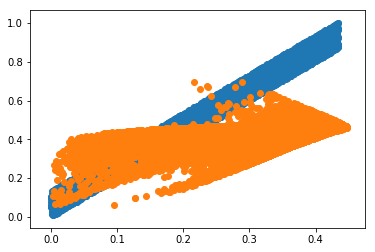

tensor(13.2985, grad_fn=<AddBackward0>)
X_sample tensor([[0.3572, 0.4359],
        [0.2278, 0.5061],
        [0.1636, 0.2531],
        ...,
        [0.3485, 0.4105],
        [0.1267, 0.3449],
        [0.3185, 0.3788]])


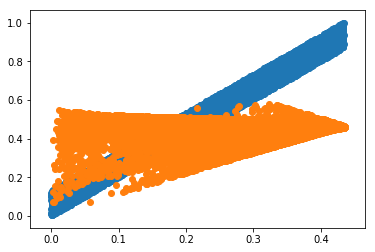

tensor(13.3309, grad_fn=<AddBackward0>)
X_sample tensor([[0.2323, 0.4832],
        [0.2604, 0.3641],
        [0.3086, 0.3978],
        ...,
        [0.2536, 0.4645],
        [0.3618, 0.4116],
        [0.1350, 0.2633]])


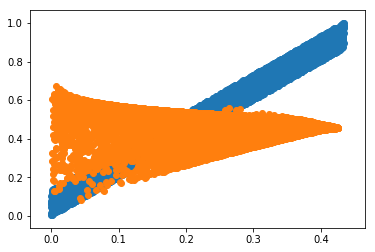

tensor(13.3542, grad_fn=<AddBackward0>)
X_sample tensor([[0.1085, 0.3364],
        [0.2202, 0.5009],
        [0.1093, 0.5901],
        ...,
        [0.1250, 0.4656],
        [0.2372, 0.4245],
        [0.2043, 0.5547]])


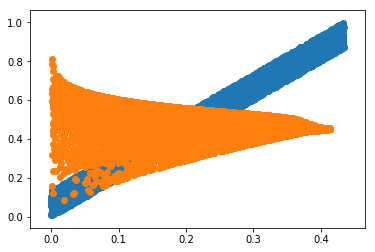

tensor(13.5430, grad_fn=<AddBackward0>)
X_sample tensor([[0.0198, 0.5175],
        [0.3515, 0.4736],
        [0.2563, 0.3647],
        ...,
        [0.2770, 0.4816],
        [0.1077, 0.6118],
        [0.2704, 0.5239]])


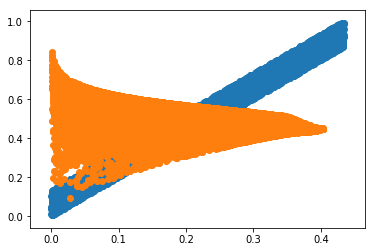

tensor(13.5095, grad_fn=<AddBackward0>)
X_sample tensor([[0.0425, 0.6134],
        [0.0982, 0.5214],
        [0.0962, 0.4333],
        ...,
        [0.1874, 0.4661],
        [0.2666, 0.3838],
        [0.1250, 0.5955]])


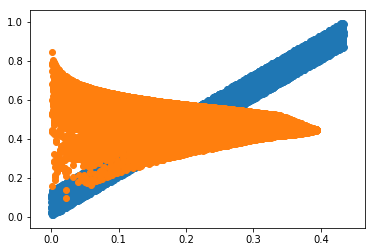

tensor(13.4366, grad_fn=<AddBackward0>)
X_sample tensor([[0.1952, 0.5563],
        [0.1759, 0.5371],
        [0.2253, 0.5249],
        ...,
        [0.2873, 0.4955],
        [0.1076, 0.4571],
        [0.0592, 0.5856]])


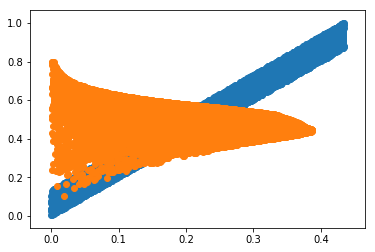

tensor(13.3370, grad_fn=<AddBackward0>)
X_sample tensor([[0.1575, 0.5697],
        [0.1568, 0.5706],
        [0.3277, 0.4054],
        ...,
        [0.1433, 0.5336],
        [0.1005, 0.6067],
        [0.2890, 0.3783]])


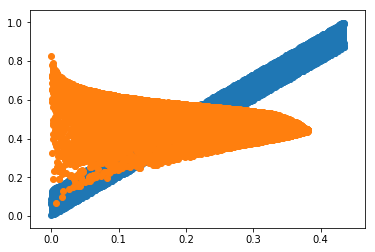

tensor(13.2823, grad_fn=<AddBackward0>)
X_sample tensor([[0.3322, 0.4647],
        [0.3171, 0.3949],
        [0.1550, 0.3892],
        ...,
        [0.3532, 0.4221],
        [0.0799, 0.6164],
        [0.2937, 0.3703]])


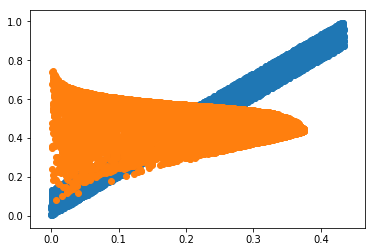

tensor(13.1857, grad_fn=<AddBackward0>)
X_sample tensor([[0.2550, 0.5122],
        [0.2238, 0.4380],
        [0.0833, 0.4464],
        ...,
        [0.0320, 0.1528],
        [0.3304, 0.3977],
        [0.1747, 0.4110]])


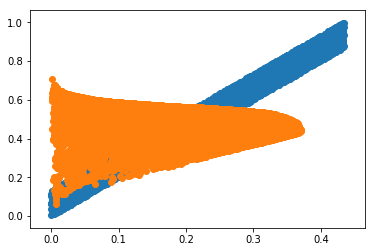

tensor(13.1646, grad_fn=<AddBackward0>)
X_sample tensor([[0.2833, 0.3625],
        [0.2162, 0.4756],
        [0.0609, 0.5290],
        ...,
        [0.2567, 0.3942],
        [0.1580, 0.5574],
        [0.3412, 0.4866]])


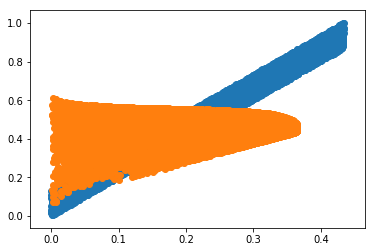

tensor(13.0163, grad_fn=<AddBackward0>)
X_sample tensor([[0.1208, 0.3228],
        [0.2678, 0.3806],
        [0.3281, 0.4140],
        ...,
        [0.2819, 0.3665],
        [0.0995, 0.4874],
        [0.2825, 0.4825]])


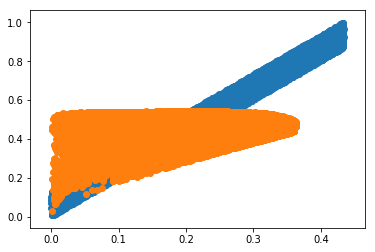

tensor(12.9907, grad_fn=<AddBackward0>)
X_sample tensor([[0.2692, 0.5081],
        [0.3113, 0.4034],
        [0.2587, 0.5346],
        ...,
        [0.0792, 0.4718],
        [0.2925, 0.4230],
        [0.1249, 0.4792]])


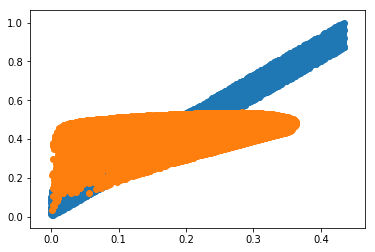

tensor(12.8967, grad_fn=<AddBackward0>)
X_sample tensor([[0.2976, 0.4121],
        [0.2816, 0.4285],
        [0.1085, 0.2506],
        ...,
        [0.2425, 0.4008],
        [0.3127, 0.4141],
        [0.1487, 0.3400]])


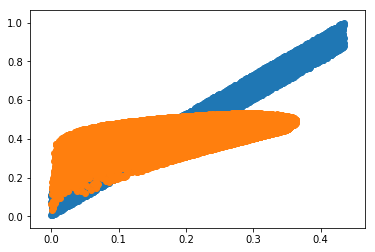

tensor(12.9074, grad_fn=<AddBackward0>)
X_sample tensor([[0.2373, 0.3671],
        [0.1739, 0.3085],
        [0.2352, 0.4411],
        ...,
        [0.1311, 0.3332],
        [0.0950, 0.4490],
        [0.1224, 0.3706]])


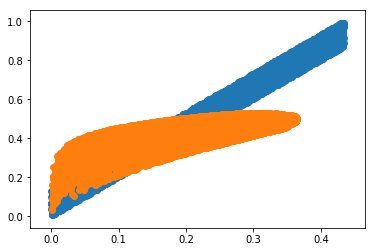

tensor(12.8026, grad_fn=<AddBackward0>)
X_sample tensor([[0.2312, 0.3699],
        [0.1426, 0.3480],
        [0.2751, 0.5200],
        ...,
        [0.1472, 0.3156],
        [0.1883, 0.4545],
        [0.1783, 0.4354]])


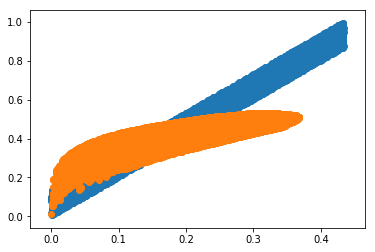

tensor(12.7126, grad_fn=<AddBackward0>)
X_sample tensor([[0.0663, 0.2440],
        [0.1840, 0.4657],
        [0.2521, 0.5100],
        ...,
        [0.2808, 0.4299],
        [0.1011, 0.3438],
        [0.1065, 0.3757]])


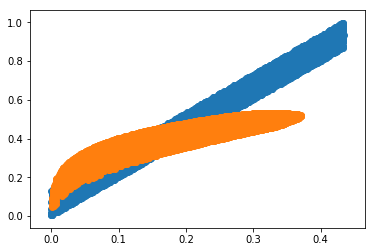

tensor(12.6544, grad_fn=<AddBackward0>)
X_sample tensor([[0.0642, 0.2910],
        [0.2797, 0.4949],
        [0.2566, 0.4367],
        ...,
        [0.2384, 0.4217],
        [0.3101, 0.5324],
        [0.0643, 0.2712]])


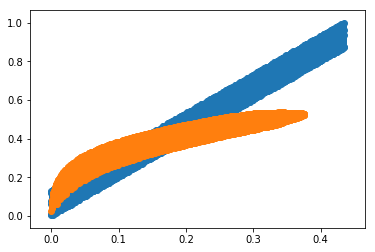

tensor(12.6528, grad_fn=<AddBackward0>)
X_sample tensor([[0.2862, 0.4850],
        [0.2323, 0.4542],
        [0.3235, 0.5001],
        ...,
        [0.1782, 0.4453],
        [0.0508, 0.2796],
        [0.2403, 0.4927]])


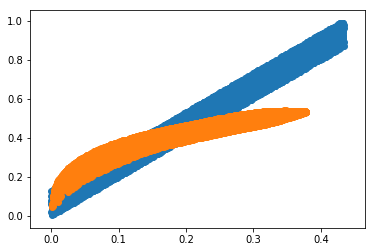

tensor(12.6072, grad_fn=<AddBackward0>)
X_sample tensor([[0.1498, 0.4188],
        [0.1233, 0.3183],
        [0.2631, 0.4597],
        ...,
        [0.2209, 0.4769],
        [0.1016, 0.3184],
        [0.1436, 0.4139]])


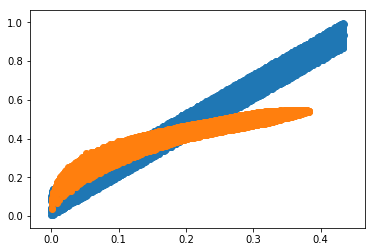

tensor(12.5486, grad_fn=<AddBackward0>)
X_sample tensor([[0.2139, 0.4257],
        [0.3510, 0.5213],
        [0.1810, 0.3833],
        ...,
        [0.1731, 0.3757],
        [0.3004, 0.5123],
        [0.1899, 0.4672]])


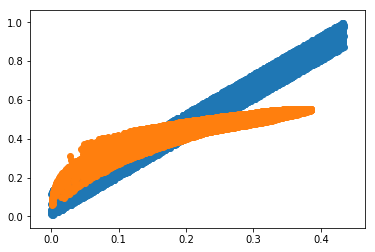

tensor(12.4779, grad_fn=<AddBackward0>)
X_sample tensor([[0.1838, 0.4327],
        [0.1476, 0.3933],
        [0.3171, 0.5242],
        ...,
        [0.2050, 0.4007],
        [0.1723, 0.4263],
        [0.0508, 0.2906]])


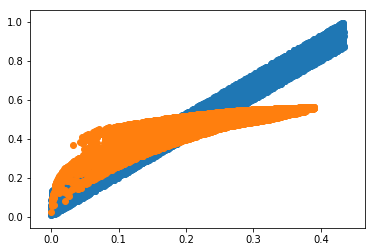

tensor(12.3749, grad_fn=<AddBackward0>)
X_sample tensor([[0.1336, 0.4872],
        [0.1378, 0.4072],
        [0.3126, 0.5314],
        ...,
        [0.2889, 0.5068],
        [0.2963, 0.5045],
        [0.1746, 0.3629]])


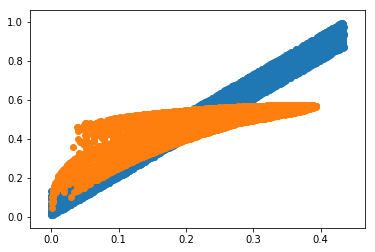

tensor(12.3966, grad_fn=<AddBackward0>)
X_sample tensor([[0.2002, 0.3968],
        [0.2889, 0.5357],
        [0.1738, 0.3585],
        ...,
        [0.2406, 0.5740],
        [0.3779, 0.5751],
        [0.2332, 0.4665]])


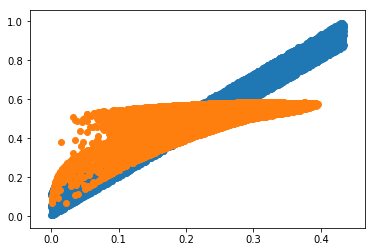

tensor(12.4162, grad_fn=<AddBackward0>)
X_sample tensor([[0.0288, 0.2462],
        [0.2889, 0.5710],
        [0.3165, 0.5660],
        ...,
        [0.2215, 0.5963],
        [0.2444, 0.5899],
        [0.1471, 0.4807]])


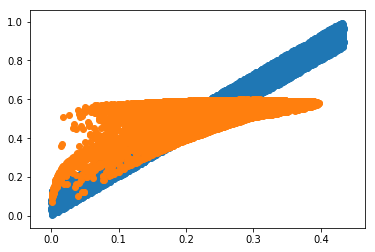

tensor(12.3918, grad_fn=<AddBackward0>)
X_sample tensor([[0.2102, 0.6074],
        [0.1797, 0.5441],
        [0.2413, 0.4428],
        ...,
        [0.2332, 0.5971],
        [0.3670, 0.5961],
        [0.0824, 0.3642]])


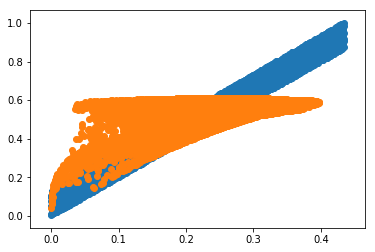

tensor(12.3736, grad_fn=<AddBackward0>)
X_sample tensor([[0.2889, 0.5732],
        [0.2240, 0.5682],
        [0.1325, 0.5857],
        ...,
        [0.2771, 0.5344],
        [0.2741, 0.5129],
        [0.1516, 0.4460]])


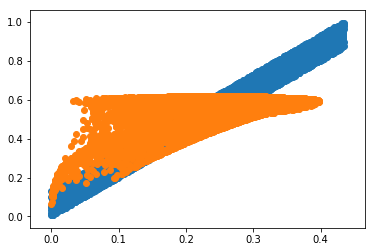

tensor(12.3814, grad_fn=<AddBackward0>)
X_sample tensor([[0.2499, 0.5004],
        [0.2965, 0.5346],
        [0.1347, 0.4277],
        ...,
        [0.0758, 0.4872],
        [0.2928, 0.5552],
        [0.2870, 0.5777]])


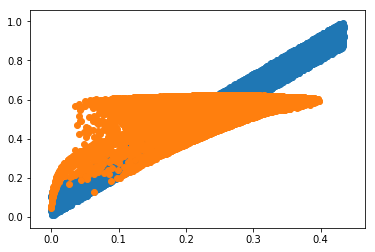

tensor(12.3782, grad_fn=<AddBackward0>)
X_sample tensor([[0.2530, 0.5742],
        [0.1359, 0.2949],
        [0.1108, 0.2474],
        ...,
        [0.2679, 0.5313],
        [0.2175, 0.6051],
        [0.3801, 0.6092]])


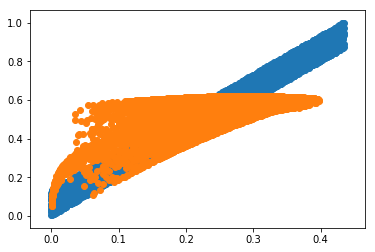

tensor(12.3691, grad_fn=<AddBackward0>)
X_sample tensor([[0.2403, 0.5899],
        [0.2306, 0.6067],
        [0.2873, 0.5935],
        ...,
        [0.3836, 0.6044],
        [0.3331, 0.5640],
        [0.0315, 0.2800]])


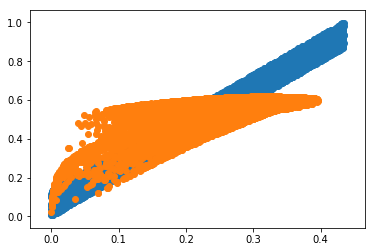

tensor(12.2908, grad_fn=<AddBackward0>)
X_sample tensor([[0.1418, 0.4466],
        [0.1799, 0.4651],
        [0.2531, 0.5828],
        ...,
        [0.2306, 0.5018],
        [0.1634, 0.3952],
        [0.1354, 0.3923]])


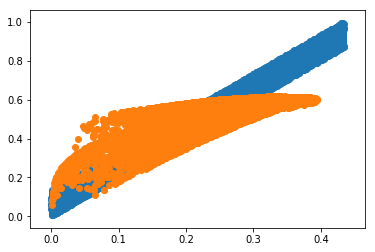

tensor(12.2900, grad_fn=<AddBackward0>)
X_sample tensor([[0.2871, 0.5882],
        [0.3643, 0.5912],
        [0.2480, 0.5132],
        ...,
        [0.2365, 0.5597],
        [0.2714, 0.5726],
        [0.2664, 0.5190]])


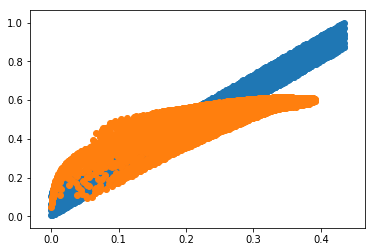

tensor(12.2651, grad_fn=<AddBackward0>)
X_sample tensor([[0.3296, 0.5693],
        [0.3065, 0.5365],
        [0.2395, 0.5079],
        ...,
        [0.1312, 0.3218],
        [0.2759, 0.5747],
        [0.1309, 0.4524]])


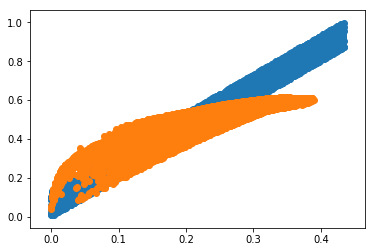

tensor(12.2584, grad_fn=<AddBackward0>)
X_sample tensor([[0.2355, 0.4737],
        [0.2553, 0.4996],
        [0.1762, 0.4659],
        ...,
        [0.1457, 0.3909],
        [0.0903, 0.3370],
        [0.0156, 0.1931]])


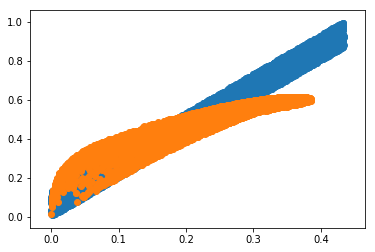

tensor(12.2074, grad_fn=<AddBackward0>)
X_sample tensor([[0.0498, 0.3091],
        [0.2613, 0.5224],
        [0.2720, 0.5767],
        ...,
        [0.1960, 0.4003],
        [0.1559, 0.4383],
        [0.0228, 0.1232]])


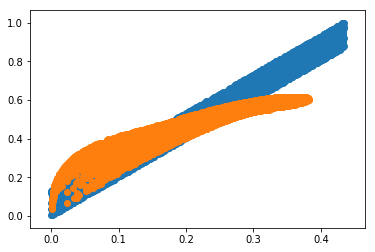

tensor(12.1900, grad_fn=<AddBackward0>)
X_sample tensor([[0.3277, 0.5909],
        [0.1993, 0.4874],
        [0.1171, 0.4232],
        ...,
        [0.2923, 0.5618],
        [0.0929, 0.3057],
        [0.1102, 0.3594]])


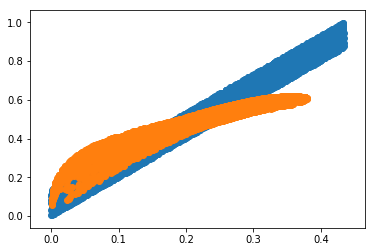

tensor(12.2086, grad_fn=<AddBackward0>)
X_sample tensor([[0.2419, 0.5043],
        [0.2162, 0.4717],
        [0.1132, 0.3796],
        ...,
        [0.2686, 0.5633],
        [0.2917, 0.5927],
        [0.1088, 0.3146]])


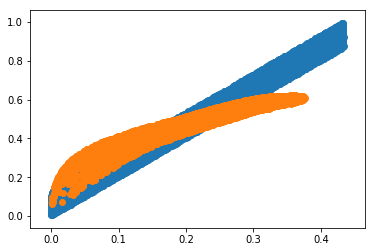

tensor(12.1653, grad_fn=<AddBackward0>)
X_sample tensor([[0.1711, 0.4470],
        [0.3232, 0.6028],
        [0.1882, 0.4268],
        ...,
        [0.3175, 0.5982],
        [0.3263, 0.5939],
        [0.1076, 0.3456]])


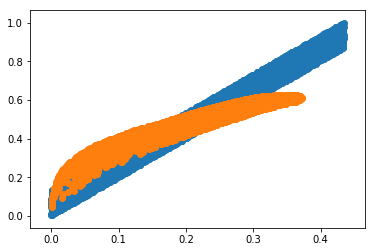

tensor(12.2081, grad_fn=<AddBackward0>)
X_sample tensor([[0.1682, 0.3848],
        [0.2789, 0.5931],
        [0.2024, 0.5029],
        ...,
        [0.0664, 0.3607],
        [0.3438, 0.6128],
        [0.3091, 0.5741]])


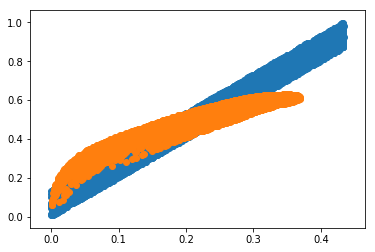

tensor(12.2029, grad_fn=<AddBackward0>)
X_sample tensor([[0.3285, 0.5960],
        [0.2204, 0.4725],
        [0.2595, 0.5724],
        ...,
        [0.2762, 0.5262],
        [0.2819, 0.5459],
        [0.2377, 0.5604]])


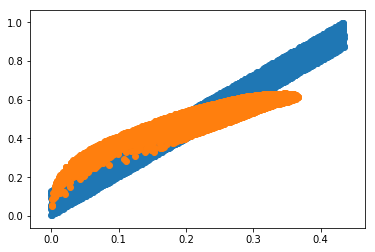

tensor(12.1749, grad_fn=<AddBackward0>)
X_sample tensor([[0.2935, 0.6049],
        [0.0902, 0.3671],
        [0.3292, 0.6091],
        ...,
        [0.1109, 0.3856],
        [0.0477, 0.3208],
        [0.1541, 0.4278]])


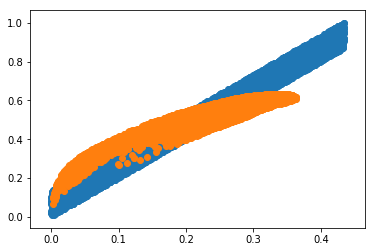

tensor(12.1239, grad_fn=<AddBackward0>)
X_sample tensor([[0.1183, 0.4083],
        [0.2648, 0.5308],
        [0.2542, 0.5882],
        ...,
        [0.2018, 0.4864],
        [0.2770, 0.6069],
        [0.2950, 0.5769]])


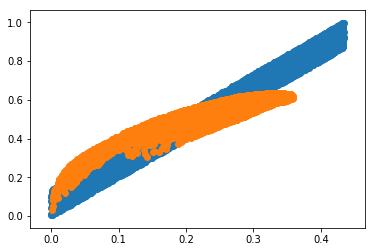

tensor(12.0717, grad_fn=<AddBackward0>)
X_sample tensor([[0.3177, 0.5975],
        [0.2590, 0.5339],
        [0.0925, 0.3571],
        ...,
        [0.2860, 0.5580],
        [0.3213, 0.6252],
        [0.2648, 0.6048]])


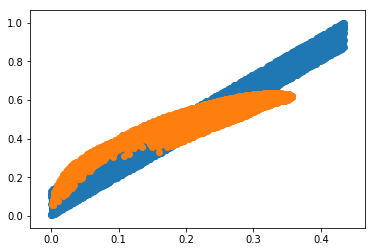

tensor(12.0998, grad_fn=<AddBackward0>)
X_sample tensor([[0.2829, 0.5828],
        [0.1825, 0.4880],
        [0.0304, 0.2400],
        ...,
        [0.0446, 0.2900],
        [0.2626, 0.5891],
        [0.1720, 0.4609]])


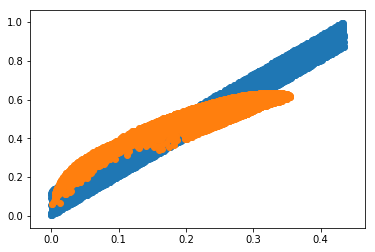

tensor(12.0373, grad_fn=<AddBackward0>)
X_sample tensor([[0.2360, 0.5274],
        [0.2983, 0.5533],
        [0.3089, 0.5664],
        ...,
        [0.2061, 0.4732],
        [0.2880, 0.5881],
        [0.1538, 0.4168]])


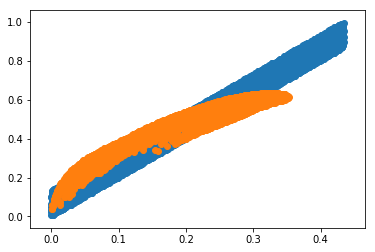

tensor(12.0655, grad_fn=<AddBackward0>)
X_sample tensor([[0.2341, 0.5174],
        [0.0960, 0.3301],
        [0.3143, 0.6128],
        ...,
        [0.2519, 0.5634],
        [0.2539, 0.5512],
        [0.3069, 0.5689]])


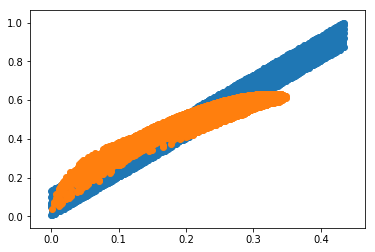

tensor(12.0337, grad_fn=<AddBackward0>)
X_sample tensor([[0.1888, 0.4525],
        [0.3126, 0.5943],
        [0.2542, 0.5623],
        ...,
        [0.1638, 0.4135],
        [0.2905, 0.5827],
        [0.1951, 0.4835]])


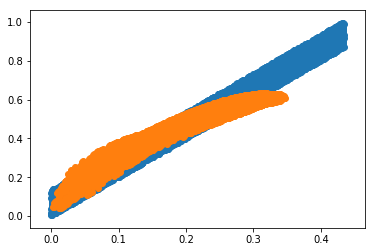

tensor(12.0169, grad_fn=<AddBackward0>)
X_sample tensor([[0.3125, 0.5858],
        [0.2123, 0.5015],
        [0.3066, 0.5807],
        ...,
        [0.2577, 0.5153],
        [0.3206, 0.6078],
        [0.1015, 0.3146]])


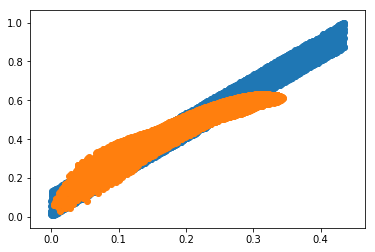

tensor(11.9749, grad_fn=<AddBackward0>)
X_sample tensor([[0.2817, 0.6057],
        [0.0611, 0.1368],
        [0.1794, 0.4256],
        ...,
        [0.2073, 0.4945],
        [0.2154, 0.4773],
        [0.2364, 0.5581]])


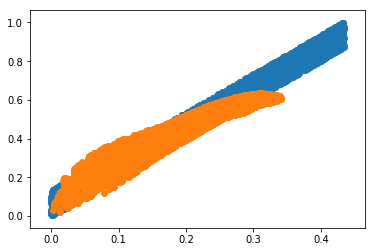

tensor(12.0162, grad_fn=<AddBackward0>)
X_sample tensor([[0.2425, 0.5242],
        [0.2829, 0.6083],
        [0.2081, 0.4792],
        ...,
        [0.2996, 0.6016],
        [0.1164, 0.3582],
        [0.2434, 0.5727]])


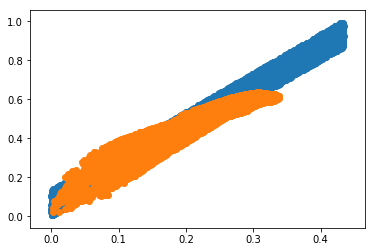

tensor(11.9541, grad_fn=<AddBackward0>)
X_sample tensor([[0.2557, 0.5371],
        [0.2610, 0.5102],
        [0.2587, 0.5946],
        ...,
        [0.1691, 0.3243],
        [0.1950, 0.4852],
        [0.3130, 0.6017]])


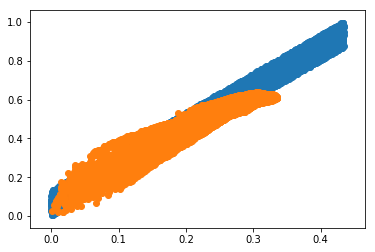

tensor(11.9432, grad_fn=<AddBackward0>)
X_sample tensor([[0.2932, 0.6163],
        [0.1033, 0.3076],
        [0.2483, 0.5713],
        ...,
        [0.2701, 0.6075],
        [0.2016, 0.5220],
        [0.2702, 0.6141]])


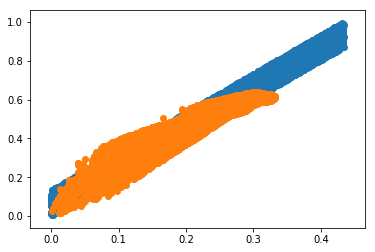

tensor(11.9887, grad_fn=<AddBackward0>)
X_sample tensor([[0.1496, 0.3632],
        [0.2745, 0.6248],
        [0.2190, 0.5465],
        ...,
        [0.1382, 0.2901],
        [0.2587, 0.6008],
        [0.2182, 0.5819]])


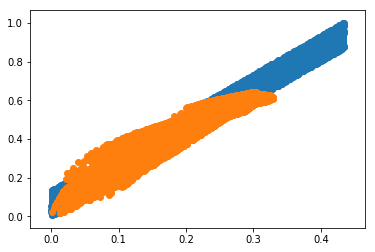

tensor(11.9421, grad_fn=<AddBackward0>)
X_sample tensor([[0.2541, 0.6015],
        [0.2344, 0.5231],
        [0.2501, 0.5137],
        ...,
        [0.1939, 0.5068],
        [0.2671, 0.5647],
        [0.3028, 0.6347]])


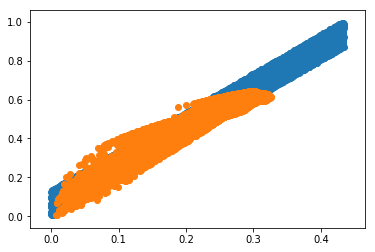

tensor(11.9082, grad_fn=<AddBackward0>)
X_sample tensor([[0.1033, 0.2906],
        [0.2860, 0.5894],
        [0.2961, 0.5993],
        ...,
        [0.2502, 0.5967],
        [0.2751, 0.6261],
        [0.2488, 0.5927]])


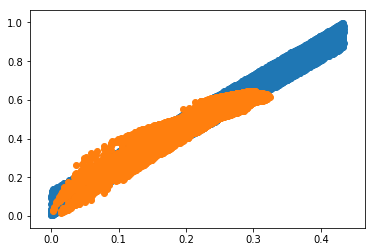

tensor(11.9264, grad_fn=<AddBackward0>)
X_sample tensor([[0.1346, 0.3071],
        [0.2088, 0.5224],
        [0.2762, 0.6297],
        ...,
        [0.2574, 0.6248],
        [0.2232, 0.4750],
        [0.1826, 0.3797]])


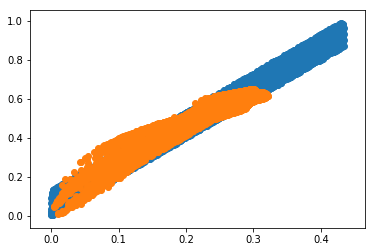

tensor(11.9460, grad_fn=<AddBackward0>)
X_sample tensor([[0.1998, 0.5195],
        [0.1779, 0.3925],
        [0.2206, 0.4828],
        ...,
        [0.2478, 0.5702],
        [0.2948, 0.6082],
        [0.2344, 0.5001]])


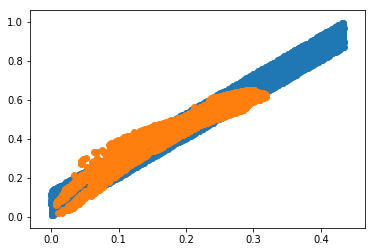

tensor(11.9455, grad_fn=<AddBackward0>)
X_sample tensor([[0.2628, 0.5930],
        [0.1801, 0.4402],
        [0.2360, 0.5506],
        ...,
        [0.2767, 0.6323],
        [0.2495, 0.5456],
        [0.3001, 0.6253]])


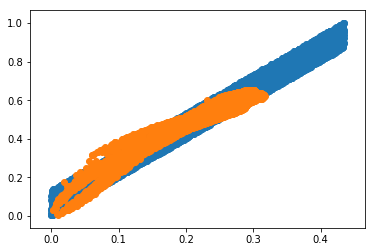

tensor(11.9179, grad_fn=<AddBackward0>)
X_sample tensor([[0.1507, 0.4084],
        [0.2449, 0.5941],
        [0.2488, 0.5764],
        ...,
        [0.2748, 0.6019],
        [0.1812, 0.4748],
        [0.2416, 0.5888]])


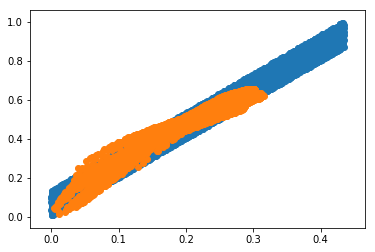

tensor(11.8866, grad_fn=<AddBackward0>)
X_sample tensor([[0.1460, 0.3820],
        [0.2818, 0.6409],
        [0.1595, 0.3813],
        ...,
        [0.2891, 0.5999],
        [0.2922, 0.6038],
        [0.2938, 0.6531]])


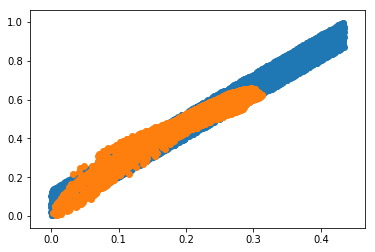

tensor(11.9186, grad_fn=<AddBackward0>)
X_sample tensor([[0.2571, 0.5961],
        [0.1459, 0.3760],
        [0.1829, 0.4911],
        ...,
        [0.2973, 0.6429],
        [0.2232, 0.5466],
        [0.2535, 0.5826]])


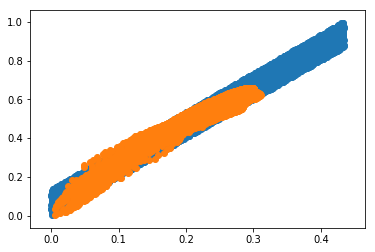

tensor(11.9043, grad_fn=<AddBackward0>)
X_sample tensor([[0.1853, 0.4894],
        [0.0950, 0.2123],
        [0.1967, 0.5199],
        ...,
        [0.2853, 0.6096],
        [0.2502, 0.5473],
        [0.1412, 0.3893]])


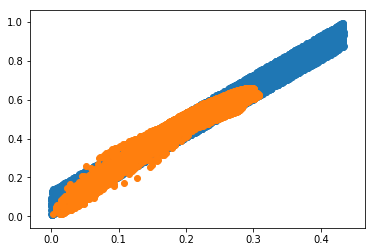

tensor(11.9003, grad_fn=<AddBackward0>)
X_sample tensor([[0.1561, 0.4434],
        [0.1078, 0.3218],
        [0.2794, 0.6338],
        ...,
        [0.2372, 0.5395],
        [0.2744, 0.6071],
        [0.2158, 0.5159]])


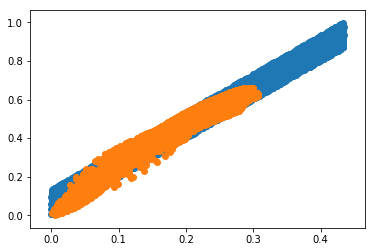

tensor(11.9020, grad_fn=<AddBackward0>)
X_sample tensor([[0.2338, 0.5120],
        [0.1510, 0.3646],
        [0.2699, 0.6124],
        ...,
        [0.2885, 0.6367],
        [0.1129, 0.3149],
        [0.1684, 0.4257]])


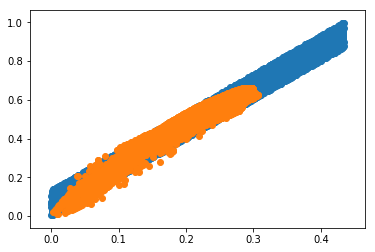

tensor(11.8825, grad_fn=<AddBackward0>)
X_sample tensor([[0.2854, 0.6071],
        [0.2282, 0.5344],
        [0.2170, 0.5195],
        ...,
        [0.2913, 0.6352],
        [0.2927, 0.6586],
        [0.2977, 0.6512]])


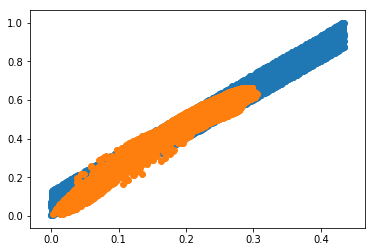

tensor(11.8967, grad_fn=<AddBackward0>)
X_sample tensor([[0.1610, 0.4040],
        [0.0855, 0.2331],
        [0.1791, 0.4793],
        ...,
        [0.0742, 0.2121],
        [0.2022, 0.4528],
        [0.2712, 0.6171]])


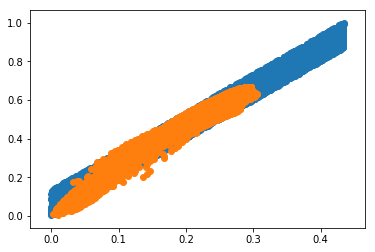

tensor(11.8814, grad_fn=<AddBackward0>)
X_sample tensor([[0.2674, 0.6364],
        [0.2789, 0.5757],
        [0.0959, 0.2086],
        ...,
        [0.1689, 0.4251],
        [0.2415, 0.5829],
        [0.2882, 0.6552]])


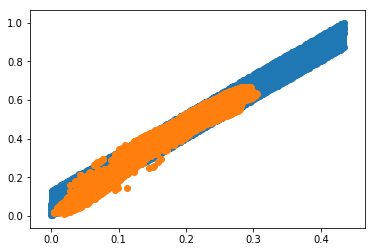

tensor(11.9240, grad_fn=<AddBackward0>)
X_sample tensor([[0.1655, 0.3953],
        [0.2784, 0.6432],
        [0.2818, 0.6097],
        ...,
        [0.2795, 0.6459],
        [0.2007, 0.4435],
        [0.2439, 0.6052]])


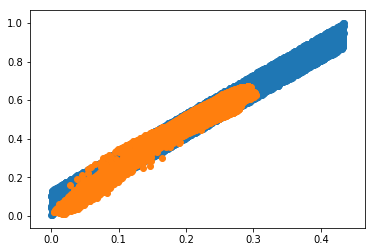

tensor(11.8721, grad_fn=<AddBackward0>)
X_sample tensor([[0.2371, 0.5615],
        [0.2397, 0.5226],
        [0.2606, 0.5228],
        ...,
        [0.2622, 0.6389],
        [0.2196, 0.5254],
        [0.2880, 0.6292]])


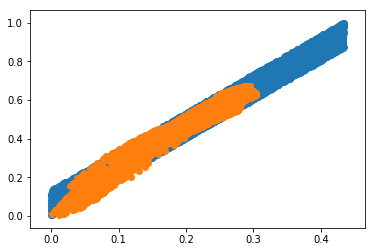

tensor(11.9001, grad_fn=<AddBackward0>)
X_sample tensor([[0.2909, 0.6326],
        [0.2890, 0.6340],
        [0.2930, 0.6660],
        ...,
        [0.2882, 0.6546],
        [0.1089, 0.2819],
        [0.2531, 0.5436]])


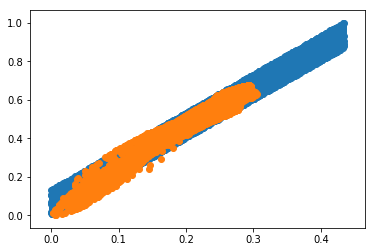

tensor(11.8698, grad_fn=<AddBackward0>)
X_sample tensor([[0.0981, 0.3317],
        [0.0966, 0.2578],
        [0.0606, 0.1175],
        ...,
        [0.2125, 0.5240],
        [0.0921, 0.2213],
        [0.2714, 0.6080]])


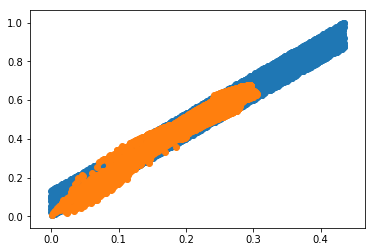

tensor(11.8926, grad_fn=<AddBackward0>)
X_sample tensor([[0.2770, 0.6041],
        [0.2876, 0.6624],
        [0.1429, 0.3577],
        ...,
        [0.1297, 0.3245],
        [0.2513, 0.5130],
        [0.1379, 0.3115]])


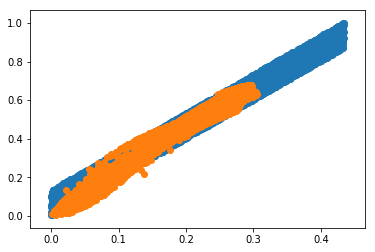

tensor(11.8505, grad_fn=<AddBackward0>)
X_sample tensor([[0.2920, 0.6354],
        [0.2952, 0.6434],
        [0.1148, 0.3057],
        ...,
        [0.2070, 0.4688],
        [0.0432, 0.1540],
        [0.1376, 0.3750]])


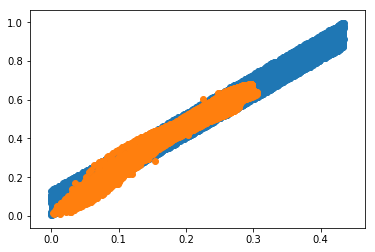

tensor(11.8383, grad_fn=<AddBackward0>)
X_sample tensor([[0.1210, 0.3693],
        [0.2989, 0.6798],
        [0.0465, 0.1652],
        ...,
        [0.2990, 0.6722],
        [0.2593, 0.6039],
        [0.2869, 0.6208]])


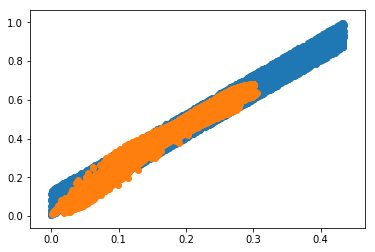

tensor(11.8898, grad_fn=<AddBackward0>)
X_sample tensor([[0.1448, 0.4139],
        [0.2483, 0.6067],
        [0.1541, 0.4140],
        ...,
        [0.1976, 0.4917],
        [0.2584, 0.6146],
        [0.1839, 0.4281]])


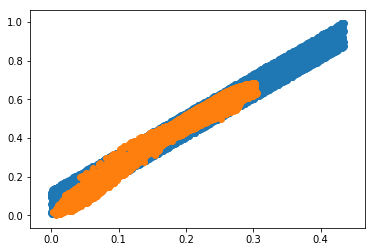

tensor(11.8385, grad_fn=<AddBackward0>)
X_sample tensor([[0.2680, 0.5920],
        [0.1656, 0.4543],
        [0.2598, 0.5398],
        ...,
        [0.2200, 0.4827],
        [0.1787, 0.4170],
        [0.3010, 0.6725]])


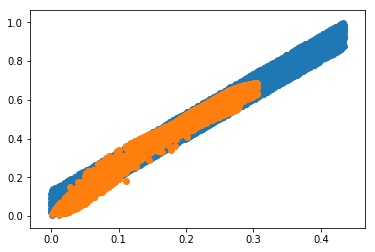

tensor(11.8469, grad_fn=<AddBackward0>)
X_sample tensor([[0.1415, 0.3342],
        [0.2280, 0.5385],
        [0.2558, 0.6110],
        ...,
        [0.1975, 0.4848],
        [0.2219, 0.5618],
        [0.2711, 0.5988]])


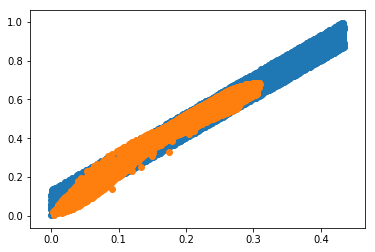

tensor(11.8727, grad_fn=<AddBackward0>)
X_sample tensor([[0.2971, 0.6799],
        [0.2832, 0.6364],
        [0.2750, 0.6003],
        ...,
        [0.2720, 0.5685],
        [0.3120, 0.6838],
        [0.2344, 0.5862]])


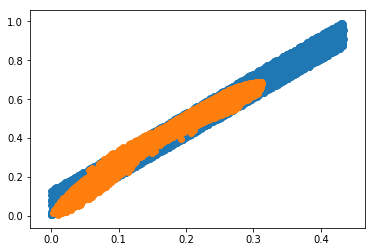

tensor(11.8328, grad_fn=<AddBackward0>)
X_sample tensor([[0.2220, 0.5129],
        [0.2367, 0.5927],
        [0.0655, 0.2210],
        ...,
        [0.3116, 0.6882],
        [0.1713, 0.4338],
        [0.0435, 0.1079]])


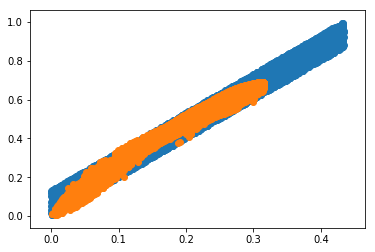

tensor(11.8382, grad_fn=<AddBackward0>)
X_sample tensor([[0.2874, 0.6532],
        [0.0249, 0.0836],
        [0.2964, 0.6574],
        ...,
        [0.2813, 0.6442],
        [0.2354, 0.5057],
        [0.2957, 0.6351]])


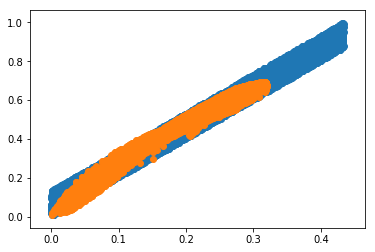

tensor(11.8694, grad_fn=<AddBackward0>)
X_sample tensor([[0.2742, 0.6355],
        [0.3091, 0.6616],
        [0.2668, 0.6441],
        ...,
        [0.2935, 0.6792],
        [0.2417, 0.5433],
        [0.2293, 0.5393]])


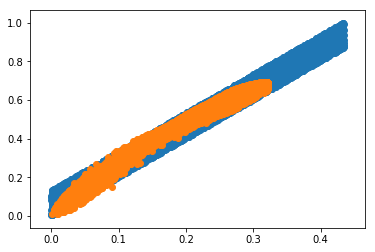

tensor(11.8287, grad_fn=<AddBackward0>)
X_sample tensor([[0.2855, 0.6403],
        [0.2627, 0.5610],
        [0.2895, 0.6431],
        ...,
        [0.3107, 0.6687],
        [0.2263, 0.4985],
        [0.2217, 0.5476]])


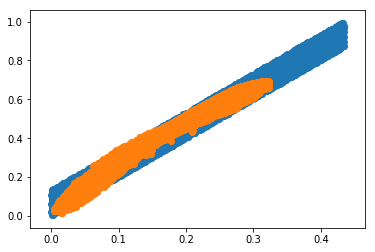

tensor(11.8440, grad_fn=<AddBackward0>)
X_sample tensor([[0.2905, 0.6551],
        [0.0794, 0.2662],
        [0.1995, 0.4759],
        ...,
        [0.1317, 0.3716],
        [0.0531, 0.1347],
        [0.1796, 0.4743]])


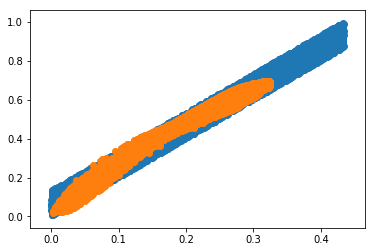

tensor(11.7883, grad_fn=<AddBackward0>)
X_sample tensor([[0.3134, 0.6655],
        [0.2515, 0.5618],
        [0.1492, 0.4078],
        ...,
        [0.0953, 0.2691],
        [0.1126, 0.3075],
        [0.3051, 0.6457]])


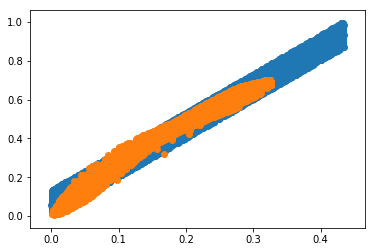

tensor(11.8302, grad_fn=<AddBackward0>)
X_sample tensor([[0.2450, 0.5915],
        [0.1170, 0.3022],
        [0.3014, 0.6762],
        ...,
        [0.1519, 0.3893],
        [0.2756, 0.5919],
        [0.1094, 0.2816]])


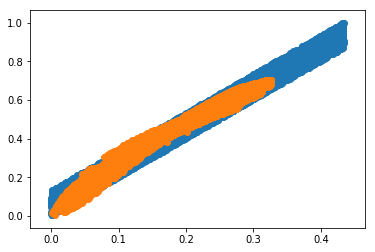

tensor(11.8439, grad_fn=<AddBackward0>)
X_sample tensor([[0.2148, 0.5188],
        [0.0705, 0.1786],
        [0.2910, 0.6699],
        ...,
        [0.2960, 0.6683],
        [0.2052, 0.4631],
        [0.2968, 0.6578]])


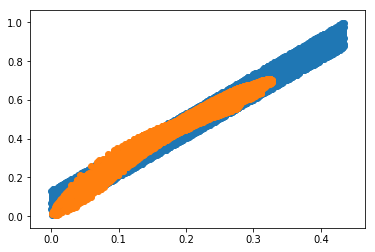

tensor(11.8289, grad_fn=<AddBackward0>)
X_sample tensor([[0.0689, 0.2451],
        [0.3170, 0.6973],
        [0.0491, 0.1629],
        ...,
        [0.2039, 0.5045],
        [0.2871, 0.6079],
        [0.3223, 0.7059]])


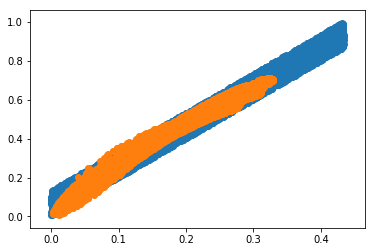

tensor(11.8471, grad_fn=<AddBackward0>)
X_sample tensor([[0.3184, 0.7030],
        [0.2112, 0.5248],
        [0.0623, 0.1508],
        ...,
        [0.2662, 0.6230],
        [0.3094, 0.6546],
        [0.0608, 0.1326]])


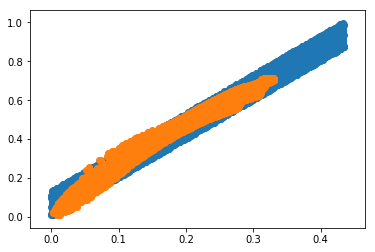

tensor(11.8103, grad_fn=<AddBackward0>)
X_sample tensor([[0.1255, 0.3202],
        [0.3292, 0.7166],
        [0.2904, 0.6648],
        ...,
        [0.2481, 0.5918],
        [0.0328, 0.1080],
        [0.3121, 0.6512]])


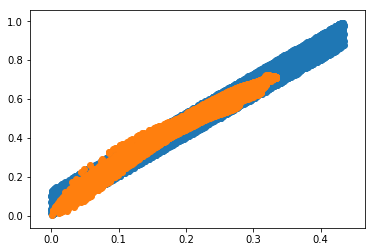

tensor(11.8297, grad_fn=<AddBackward0>)
X_sample tensor([[0.2528, 0.5805],
        [0.3309, 0.7155],
        [0.1743, 0.4466],
        ...,
        [0.2947, 0.6050],
        [0.0920, 0.2087],
        [0.2349, 0.5542]])


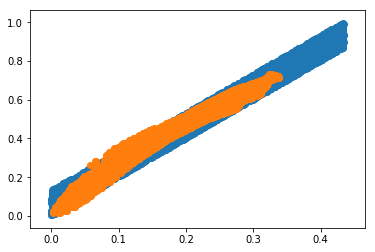

tensor(11.7684, grad_fn=<AddBackward0>)
X_sample tensor([[0.2282, 0.5537],
        [0.1911, 0.4744],
        [0.2971, 0.6676],
        ...,
        [0.2693, 0.6298],
        [0.1495, 0.3562],
        [0.1152, 0.2955]])


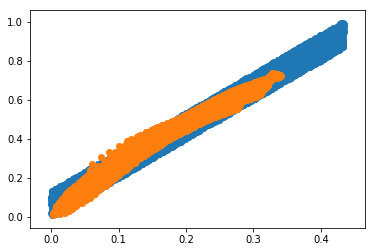

tensor(11.8081, grad_fn=<AddBackward0>)
X_sample tensor([[0.3134, 0.6680],
        [0.2175, 0.5373],
        [0.2254, 0.5694],
        ...,
        [0.2284, 0.5545],
        [0.2498, 0.6119],
        [0.1748, 0.4486]])


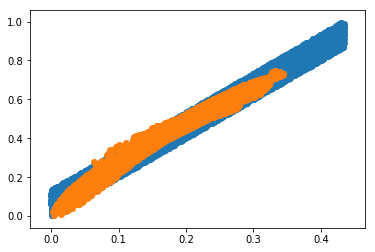

tensor(11.7862, grad_fn=<AddBackward0>)
X_sample tensor([[0.2888, 0.6443],
        [0.1955, 0.4529],
        [0.2122, 0.4999],
        ...,
        [0.0717, 0.1826],
        [0.3255, 0.6915],
        [0.2133, 0.4789]])


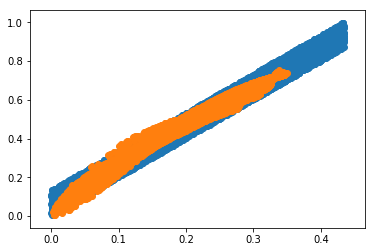

tensor(11.7562, grad_fn=<AddBackward0>)
X_sample tensor([[0.0931, 0.2988],
        [0.2137, 0.5290],
        [0.3249, 0.7078],
        ...,
        [0.2908, 0.6465],
        [0.3396, 0.7403],
        [0.1216, 0.3026]])


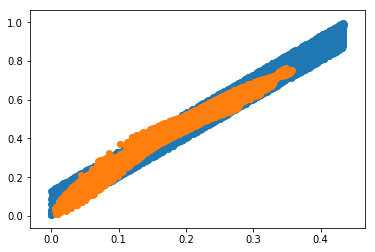

tensor(11.7756, grad_fn=<AddBackward0>)
X_sample tensor([[0.2653, 0.6316],
        [0.0966, 0.2496],
        [0.3171, 0.6944],
        ...,
        [0.1835, 0.4456],
        [0.1607, 0.3930],
        [0.3018, 0.6616]])


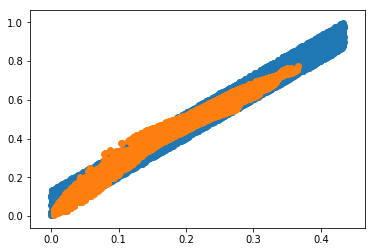

tensor(11.7463, grad_fn=<AddBackward0>)
X_sample tensor([[0.2502, 0.5235],
        [0.2739, 0.6126],
        [0.3262, 0.7123],
        ...,
        [0.2124, 0.5328],
        [0.1942, 0.5014],
        [0.2343, 0.5613]])


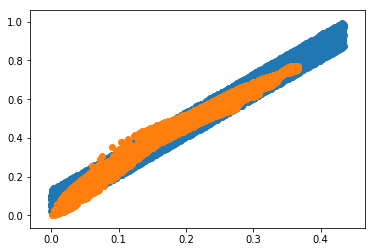

tensor(11.7672, grad_fn=<AddBackward0>)
X_sample tensor([[0.1780, 0.4099],
        [0.1024, 0.2733],
        [0.2327, 0.5601],
        ...,
        [0.3445, 0.7474],
        [0.3246, 0.6914],
        [0.1928, 0.4386]])


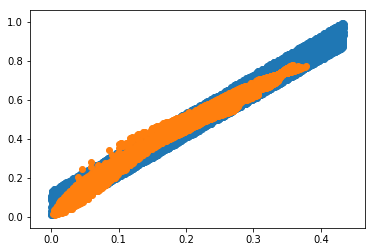

tensor(11.7708, grad_fn=<AddBackward0>)
X_sample tensor([[0.3265, 0.7060],
        [0.0621, 0.2010],
        [0.2589, 0.5901],
        ...,
        [0.0322, 0.1049],
        [0.3179, 0.7104],
        [0.1947, 0.4996]])


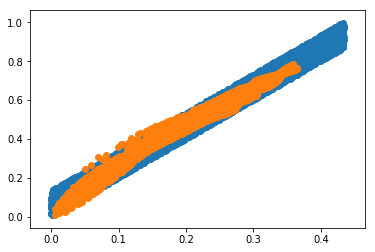

tensor(11.7384, grad_fn=<AddBackward0>)
X_sample tensor([[0.3366, 0.7356],
        [0.2266, 0.4927],
        [0.3301, 0.7245],
        ...,
        [0.1907, 0.4414],
        [0.3019, 0.6553],
        [0.2089, 0.5335]])


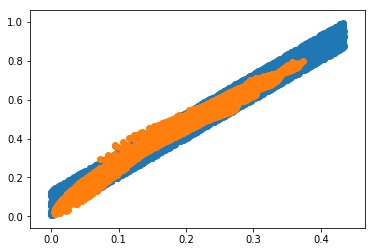

tensor(11.7128, grad_fn=<AddBackward0>)
X_sample tensor([[0.0721, 0.1958],
        [0.1263, 0.3517],
        [0.1273, 0.3345],
        ...,
        [0.2239, 0.4825],
        [0.2052, 0.4655],
        [0.3479, 0.7496]])


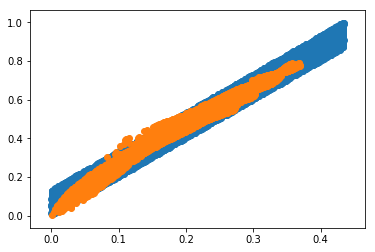

tensor(11.6970, grad_fn=<AddBackward0>)
X_sample tensor([[0.1855, 0.4761],
        [0.1315, 0.3197],
        [0.0883, 0.2360],
        ...,
        [0.1768, 0.4615],
        [0.3221, 0.7040],
        [0.0556, 0.1458]])


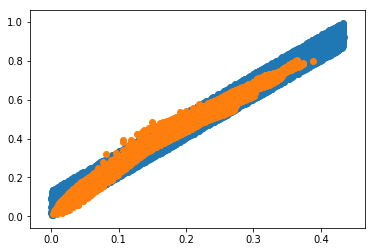

tensor(11.7037, grad_fn=<AddBackward0>)
X_sample tensor([[0.1632, 0.4365],
        [0.2742, 0.6052],
        [0.2218, 0.4843],
        ...,
        [0.3265, 0.7132],
        [0.0300, 0.0437],
        [0.3456, 0.7524]])


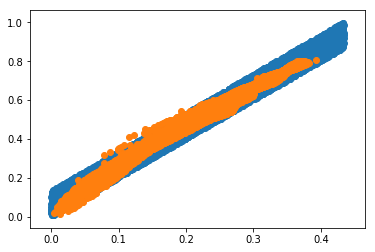

tensor(11.7244, grad_fn=<AddBackward0>)
X_sample tensor([[0.1901, 0.4432],
        [0.2360, 0.5175],
        [0.1884, 0.4862],
        ...,
        [0.2725, 0.6422],
        [0.3584, 0.7783],
        [0.2929, 0.6668]])


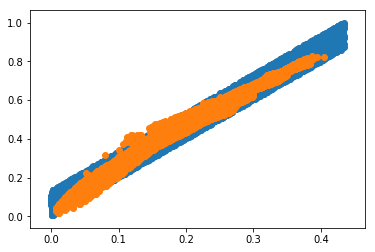

tensor(11.7026, grad_fn=<AddBackward0>)
X_sample tensor([[0.1520, 0.4125],
        [0.3488, 0.7517],
        [0.3290, 0.7145],
        ...,
        [0.3385, 0.7382],
        [0.1799, 0.4378],
        [0.1985, 0.5016]])


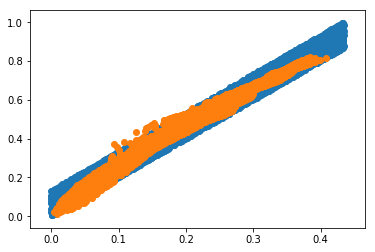

tensor(11.6515, grad_fn=<AddBackward0>)
X_sample tensor([[0.1870, 0.4170],
        [0.2003, 0.4910],
        [0.0198, 0.0584],
        ...,
        [0.1439, 0.3262],
        [0.1241, 0.2696],
        [0.2095, 0.4737]])


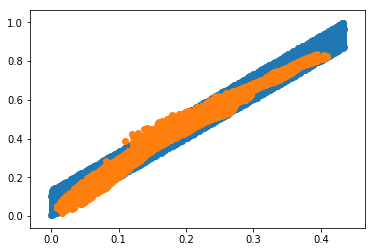

tensor(11.6572, grad_fn=<AddBackward0>)
X_sample tensor([[0.0576, 0.1990],
        [0.3264, 0.6941],
        [0.0735, 0.2160],
        ...,
        [0.3006, 0.6654],
        [0.1332, 0.3293],
        [0.0692, 0.2164]])


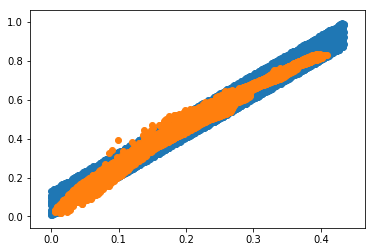

tensor(11.6859, grad_fn=<AddBackward0>)
X_sample tensor([[0.3473, 0.7604],
        [0.2570, 0.5970],
        [0.3495, 0.7331],
        ...,
        [0.3296, 0.7326],
        [0.2548, 0.6103],
        [0.2906, 0.6703]])


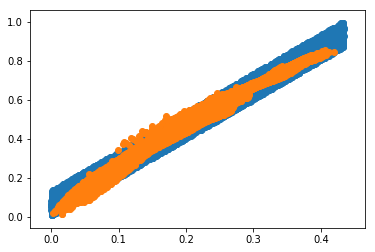

tensor(11.6884, grad_fn=<AddBackward0>)
X_sample tensor([[0.2968, 0.6662],
        [0.0706, 0.1498],
        [0.2583, 0.5983],
        ...,
        [0.1185, 0.2795],
        [0.2615, 0.5863],
        [0.3301, 0.7330]])


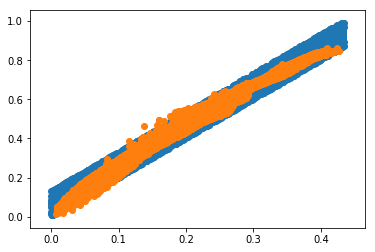

tensor(11.6716, grad_fn=<AddBackward0>)
X_sample tensor([[0.0648, 0.1822],
        [0.0314, 0.0936],
        [0.1976, 0.4492],
        ...,
        [0.3233, 0.7170],
        [0.0992, 0.2242],
        [0.3274, 0.7262]])


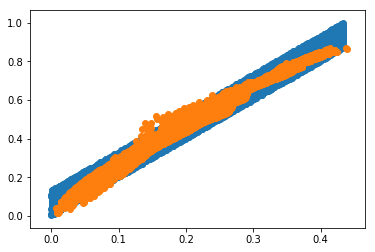

tensor(11.6857, grad_fn=<AddBackward0>)
X_sample tensor([[0.1167, 0.2606],
        [0.1404, 0.3338],
        [0.2872, 0.6404],
        ...,
        [0.0800, 0.1488],
        [0.2181, 0.4767],
        [0.1593, 0.4014]])


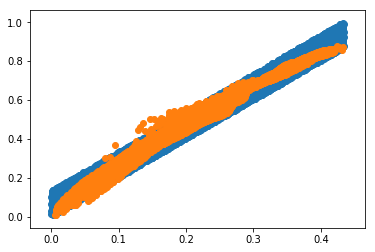

tensor(11.6538, grad_fn=<AddBackward0>)
X_sample tensor([[0.1562, 0.4173],
        [0.3115, 0.7001],
        [0.1683, 0.4439],
        ...,
        [0.2856, 0.6630],
        [0.1025, 0.2873],
        [0.0542, 0.1522]])


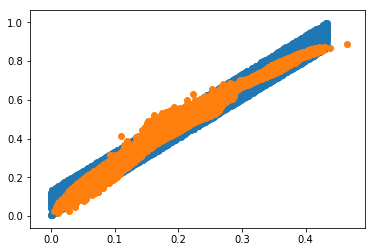

tensor(11.6501, grad_fn=<AddBackward0>)
X_sample tensor([[0.2274, 0.4935],
        [0.1913, 0.4984],
        [0.1823, 0.4554],
        ...,
        [0.3061, 0.6878],
        [0.3672, 0.8064],
        [0.1407, 0.3532]])


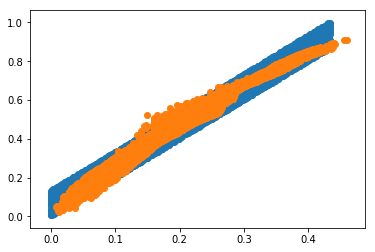

tensor(11.6157, grad_fn=<AddBackward0>)
X_sample tensor([[0.1766, 0.4230],
        [0.2484, 0.5681],
        [0.3893, 0.8176],
        ...,
        [0.2585, 0.5333],
        [0.3080, 0.6834],
        [0.0903, 0.2567]])


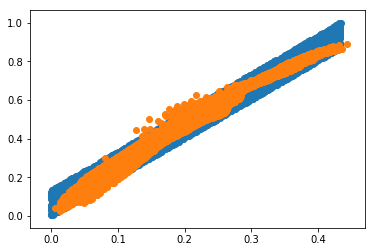

tensor(11.6180, grad_fn=<AddBackward0>)
X_sample tensor([[0.2500, 0.5747],
        [0.2663, 0.5859],
        [0.3676, 0.8080],
        ...,
        [0.2156, 0.5053],
        [0.3226, 0.7181],
        [0.2888, 0.6537]])


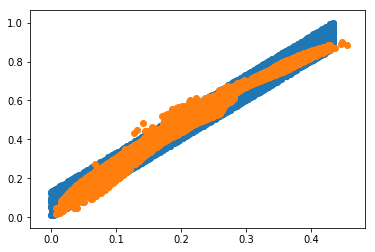

tensor(11.6227, grad_fn=<AddBackward0>)
X_sample tensor([[0.3250, 0.7198],
        [0.3407, 0.7574],
        [0.1306, 0.3367],
        ...,
        [0.2680, 0.6360],
        [0.2027, 0.4866],
        [0.0665, 0.1990]])


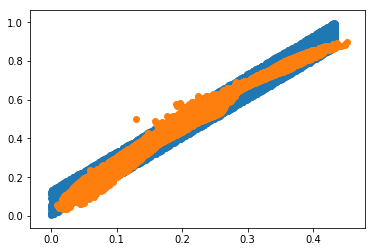

tensor(11.6030, grad_fn=<AddBackward0>)
X_sample tensor([[0.3309, 0.7462],
        [0.2160, 0.5014],
        [0.1108, 0.3056],
        ...,
        [0.1965, 0.4695],
        [0.0368, 0.1170],
        [0.2714, 0.6254]])


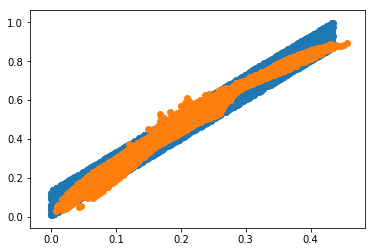

tensor(11.6179, grad_fn=<AddBackward0>)
X_sample tensor([[0.2033, 0.5250],
        [0.3153, 0.7103],
        [0.3243, 0.7290],
        ...,
        [0.3080, 0.6930],
        [0.2914, 0.6605],
        [0.2595, 0.5863]])


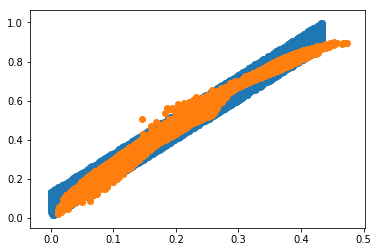

tensor(11.5942, grad_fn=<AddBackward0>)
X_sample tensor([[0.3537, 0.7814],
        [0.2488, 0.5297],
        [0.1287, 0.3492],
        ...,
        [0.3503, 0.7384],
        [0.0367, 0.0950],
        [0.1614, 0.3658]])


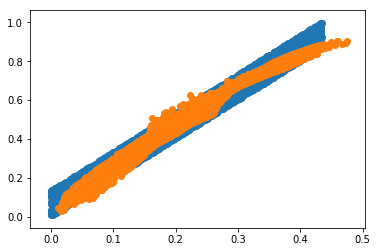

tensor(11.6053, grad_fn=<AddBackward0>)
X_sample tensor([[0.1784, 0.4290],
        [0.0763, 0.1864],
        [0.3173, 0.6989],
        ...,
        [0.1372, 0.3470],
        [0.1228, 0.2666],
        [0.0659, 0.1568]])


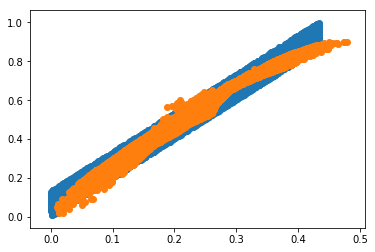

tensor(11.5683, grad_fn=<AddBackward0>)
X_sample tensor([[0.3528, 0.7606],
        [0.3668, 0.7804],
        [0.0531, 0.1547],
        ...,
        [0.0712, 0.1952],
        [0.2891, 0.6692],
        [0.3418, 0.7331]])


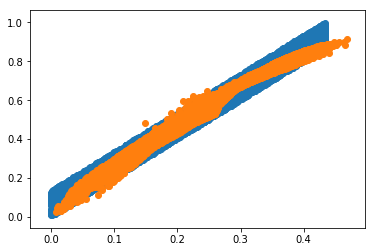

tensor(11.5582, grad_fn=<AddBackward0>)
X_sample tensor([[0.1974, 0.4650],
        [0.3775, 0.7727],
        [0.3643, 0.7994],
        ...,
        [0.1798, 0.4627],
        [0.3381, 0.7466],
        [0.3201, 0.7142]])


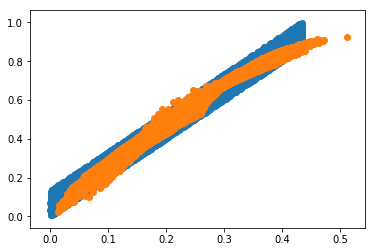

tensor(11.5755, grad_fn=<AddBackward0>)
X_sample tensor([[0.1955, 0.4554],
        [0.0869, 0.2441],
        [0.1579, 0.3851],
        ...,
        [0.0568, 0.1717],
        [0.1701, 0.3988],
        [0.3958, 0.8452]])


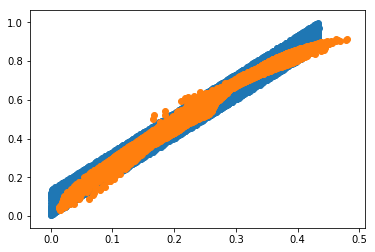

tensor(11.5547, grad_fn=<AddBackward0>)
X_sample tensor([[0.3287, 0.7570],
        [0.4073, 0.8650],
        [0.2920, 0.6621],
        ...,
        [0.1249, 0.3164],
        [0.1678, 0.4440],
        [0.3107, 0.7136]])


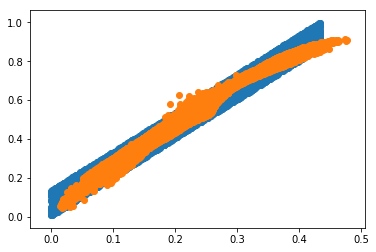

tensor(11.5322, grad_fn=<AddBackward0>)
X_sample tensor([[0.0843, 0.2089],
        [0.0620, 0.1933],
        [0.2429, 0.5609],
        ...,
        [0.2642, 0.6335],
        [0.0611, 0.1915],
        [0.3398, 0.7471]])


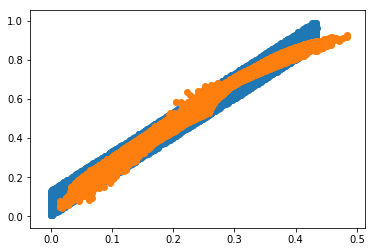

tensor(11.5295, grad_fn=<AddBackward0>)
X_sample tensor([[0.1292, 0.3670],
        [0.1344, 0.3442],
        [0.3119, 0.7075],
        ...,
        [0.3518, 0.7639],
        [0.3341, 0.7605],
        [0.2111, 0.5160]])


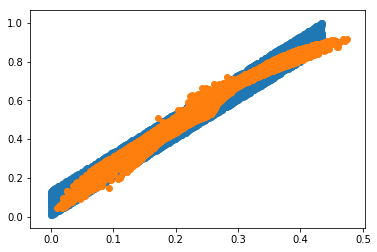

tensor(11.5314, grad_fn=<AddBackward0>)
X_sample tensor([[0.3543, 0.7808],
        [0.2204, 0.5259],
        [0.1783, 0.4366],
        ...,
        [0.0608, 0.1842],
        [0.1647, 0.4136],
        [0.3039, 0.6967]])


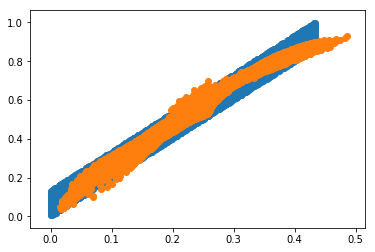

tensor(11.5079, grad_fn=<AddBackward0>)
X_sample tensor([[0.2685, 0.6420],
        [0.1875, 0.4622],
        [0.1814, 0.4699],
        ...,
        [0.1466, 0.3955],
        [0.1020, 0.2532],
        [0.0804, 0.2033]])


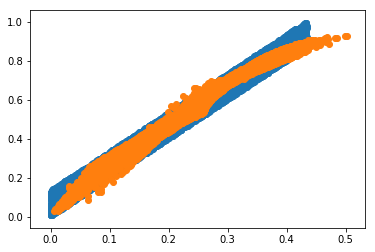

tensor(11.5496, grad_fn=<AddBackward0>)
X_sample tensor([[0.0968, 0.2717],
        [0.2352, 0.5064],
        [0.1813, 0.4413],
        ...,
        [0.2709, 0.6245],
        [0.1639, 0.3923],
        [0.1594, 0.4243]])


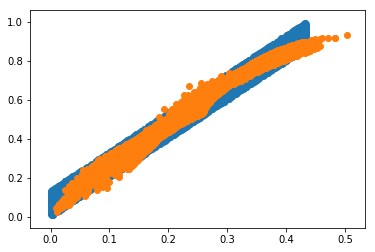

tensor(11.5028, grad_fn=<AddBackward0>)
X_sample tensor([[0.2498, 0.5480],
        [0.1463, 0.3978],
        [0.1373, 0.3239],
        ...,
        [0.1378, 0.3528],
        [0.2576, 0.5711],
        [0.1835, 0.4242]])


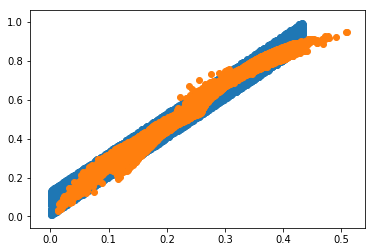

tensor(11.5355, grad_fn=<AddBackward0>)
X_sample tensor([[0.2837, 0.6694],
        [0.1760, 0.4153],
        [0.2676, 0.6273],
        ...,
        [0.0516, 0.1753],
        [0.3811, 0.8372],
        [0.1327, 0.3609]])


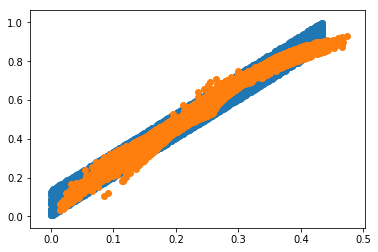

tensor(11.4607, grad_fn=<AddBackward0>)
X_sample tensor([[0.0652, 0.2062],
        [0.2898, 0.6715],
        [0.0656, 0.1867],
        ...,
        [0.3383, 0.7759],
        [0.2344, 0.5089],
        [0.2439, 0.5113]])


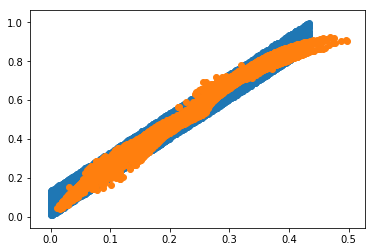

tensor(11.4762, grad_fn=<AddBackward0>)
X_sample tensor([[0.3443, 0.7832],
        [0.3316, 0.7656],
        [0.1563, 0.3874],
        ...,
        [0.1374, 0.3726],
        [0.2255, 0.4822],
        [0.3131, 0.7085]])


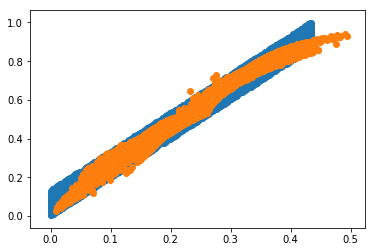

tensor(11.5158, grad_fn=<AddBackward0>)
X_sample tensor([[0.1924, 0.4227],
        [0.1640, 0.3828],
        [0.2771, 0.6480],
        ...,
        [0.1506, 0.3526],
        [0.3609, 0.8160],
        [0.3268, 0.7163]])


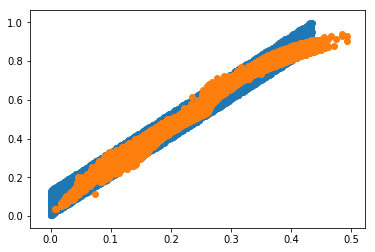

tensor(11.5054, grad_fn=<AddBackward0>)
X_sample tensor([[0.2769, 0.6606],
        [0.2340, 0.5601],
        [0.4034, 0.8687],
        ...,
        [0.1935, 0.4197],
        [0.1678, 0.3891],
        [0.2968, 0.6877]])


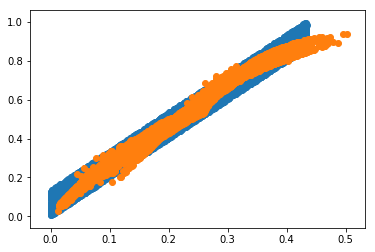

tensor(11.4743, grad_fn=<AddBackward0>)
X_sample tensor([[0.3355, 0.7447],
        [0.0983, 0.2690],
        [0.1851, 0.4528],
        ...,
        [0.2192, 0.5268],
        [0.2894, 0.6401],
        [0.0715, 0.2095]])


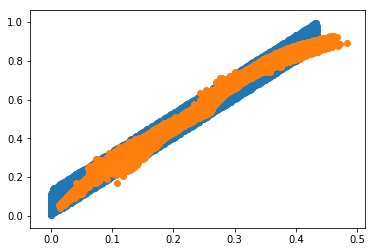

tensor(11.4868, grad_fn=<AddBackward0>)
X_sample tensor([[0.3086, 0.7007],
        [0.0398, 0.1310],
        [0.2738, 0.6260],
        ...,
        [0.2642, 0.6413],
        [0.0731, 0.2053],
        [0.3483, 0.7479]])


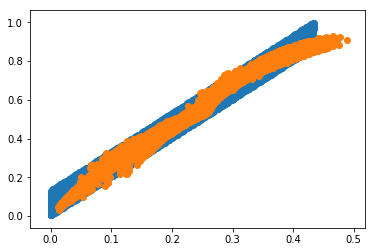

tensor(11.4717, grad_fn=<AddBackward0>)
X_sample tensor([[0.2910, 0.6417],
        [0.3083, 0.6939],
        [0.1064, 0.2859],
        ...,
        [0.2294, 0.4886],
        [0.1715, 0.4131],
        [0.2748, 0.6048]])


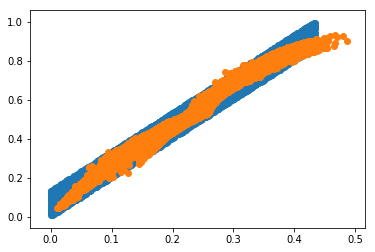

tensor(11.4742, grad_fn=<AddBackward0>)
X_sample tensor([[0.2080, 0.4915],
        [0.2235, 0.4761],
        [0.1030, 0.2856],
        ...,
        [0.1940, 0.4558],
        [0.1283, 0.3329],
        [0.3007, 0.6830]])


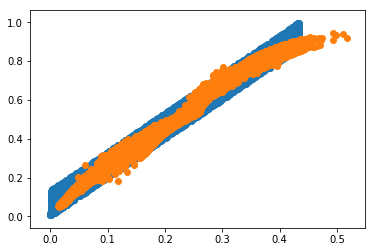

tensor(11.4584, grad_fn=<AddBackward0>)
X_sample tensor([[0.4387, 0.9054],
        [0.3287, 0.7332],
        [0.3818, 0.8278],
        ...,
        [0.0340, 0.1212],
        [0.1733, 0.4514],
        [0.3124, 0.7154]])


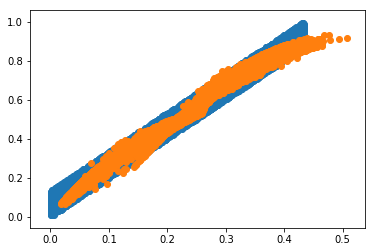

tensor(11.4675, grad_fn=<AddBackward0>)
X_sample tensor([[0.0930, 0.2790],
        [0.0391, 0.1401],
        [0.0784, 0.2340],
        ...,
        [0.3358, 0.7410],
        [0.1142, 0.3028],
        [0.3148, 0.7325]])


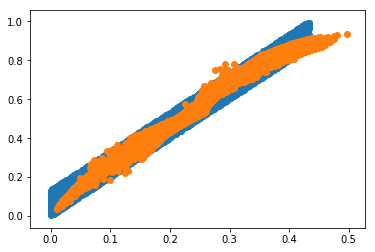

tensor(11.4555, grad_fn=<AddBackward0>)
X_sample tensor([[0.1123, 0.3163],
        [0.0573, 0.1752],
        [0.3163, 0.7041],
        ...,
        [0.1149, 0.2859],
        [0.3105, 0.6952],
        [0.0441, 0.1419]])


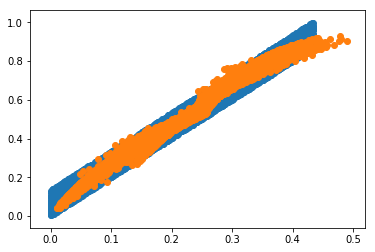

tensor(11.4720, grad_fn=<AddBackward0>)
X_sample tensor([[0.2161, 0.4889],
        [0.1292, 0.2847],
        [0.1290, 0.3042],
        ...,
        [0.1243, 0.3203],
        [0.1905, 0.4264],
        [0.2713, 0.6177]])


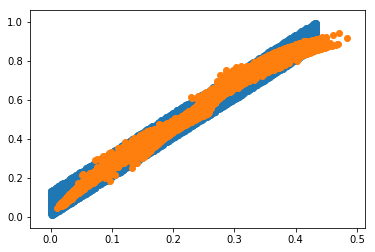

tensor(11.4718, grad_fn=<AddBackward0>)
X_sample tensor([[0.2043, 0.4605],
        [0.2963, 0.6999],
        [0.1425, 0.3505],
        ...,
        [0.1372, 0.3503],
        [0.3261, 0.7353],
        [0.2887, 0.6509]])


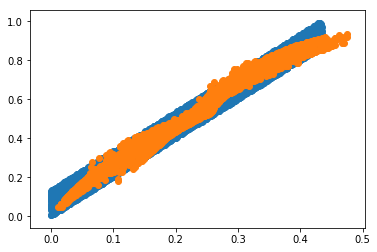

tensor(11.4898, grad_fn=<AddBackward0>)
X_sample tensor([[0.3318, 0.7507],
        [0.1430, 0.3838],
        [0.3227, 0.7053],
        ...,
        [0.2908, 0.6690],
        [0.3633, 0.7904],
        [0.1020, 0.2496]])


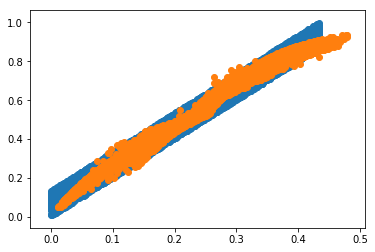

tensor(11.4677, grad_fn=<AddBackward0>)
X_sample tensor([[0.2453, 0.5196],
        [0.2959, 0.7397],
        [0.3507, 0.7449],
        ...,
        [0.2352, 0.5459],
        [0.2943, 0.6798],
        [0.1283, 0.3320]])


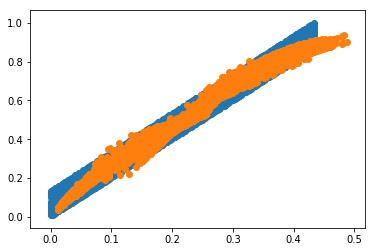

tensor(11.4556, grad_fn=<AddBackward0>)
X_sample tensor([[0.1839, 0.3873],
        [0.1380, 0.3609],
        [0.2577, 0.6027],
        ...,
        [0.0773, 0.2030],
        [0.2630, 0.5729],
        [0.3557, 0.8050]])


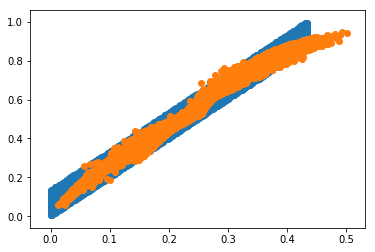

tensor(11.4519, grad_fn=<AddBackward0>)
X_sample tensor([[0.1255, 0.3195],
        [0.2459, 0.5699],
        [0.0336, 0.1184],
        ...,
        [0.3483, 0.7529],
        [0.3534, 0.8006],
        [0.2871, 0.6833]])


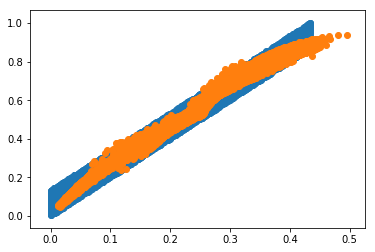

tensor(11.4768, grad_fn=<AddBackward0>)
X_sample tensor([[0.2722, 0.6203],
        [0.2773, 0.6173],
        [0.2797, 0.6459],
        ...,
        [0.3260, 0.7165],
        [0.1943, 0.4266],
        [0.2635, 0.5835]])


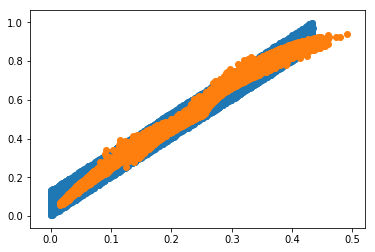

tensor(11.4354, grad_fn=<AddBackward0>)
X_sample tensor([[0.1511, 0.3536],
        [0.2391, 0.5072],
        [0.1809, 0.3982],
        ...,
        [0.0939, 0.2685],
        [0.2702, 0.6535],
        [0.3387, 0.7372]])


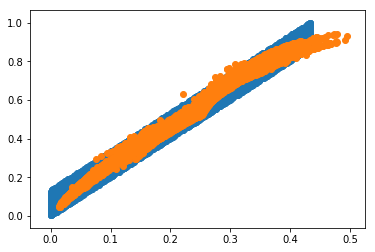

tensor(11.4984, grad_fn=<AddBackward0>)
X_sample tensor([[0.1189, 0.3627],
        [0.1129, 0.3160],
        [0.1315, 0.3094],
        ...,
        [0.3574, 0.8124],
        [0.3309, 0.7277],
        [0.3263, 0.7279]])


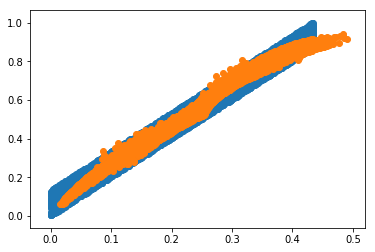

tensor(11.4448, grad_fn=<AddBackward0>)
X_sample tensor([[0.1297, 0.3375],
        [0.0682, 0.2024],
        [0.2658, 0.6121],
        ...,
        [0.3710, 0.8275],
        [0.1838, 0.4353],
        [0.2657, 0.6196]])


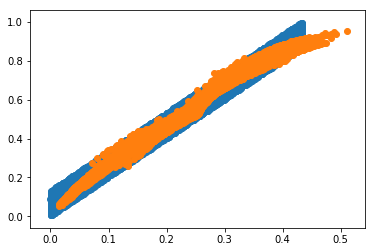

tensor(11.4305, grad_fn=<AddBackward0>)
X_sample tensor([[0.1154, 0.3091],
        [0.2124, 0.4785],
        [0.1636, 0.4170],
        ...,
        [0.3708, 0.8299],
        [0.0874, 0.2351],
        [0.1088, 0.2836]])


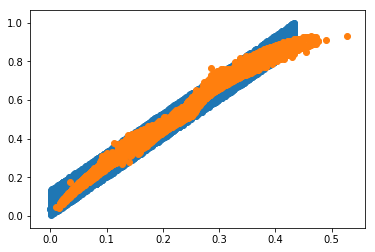

tensor(11.4487, grad_fn=<AddBackward0>)
X_sample tensor([[0.1465, 0.3574],
        [0.1229, 0.3354],
        [0.2656, 0.5932],
        ...,
        [0.1755, 0.4279],
        [0.1092, 0.3005],
        [0.2854, 0.6378]])


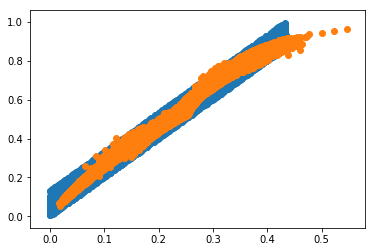

tensor(11.4290, grad_fn=<AddBackward0>)
X_sample tensor([[0.1924, 0.4473],
        [0.2830, 0.6635],
        [0.3320, 0.7223],
        ...,
        [0.1120, 0.2845],
        [0.2385, 0.5516],
        [0.2130, 0.4804]])


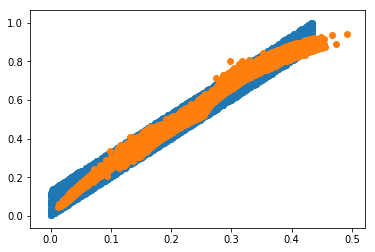

tensor(11.4391, grad_fn=<AddBackward0>)
X_sample tensor([[0.2482, 0.5768],
        [0.4070, 0.8257],
        [0.3158, 0.7356],
        ...,
        [0.4088, 0.8774],
        [0.3120, 0.7100],
        [0.1954, 0.4648]])


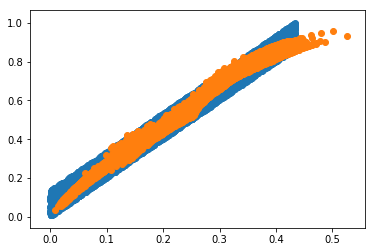

tensor(11.4354, grad_fn=<AddBackward0>)
X_sample tensor([[0.1608, 0.3791],
        [0.1363, 0.3526],
        [0.3925, 0.8594],
        ...,
        [0.1846, 0.4313],
        [0.0507, 0.1620],
        [0.0285, 0.0998]])


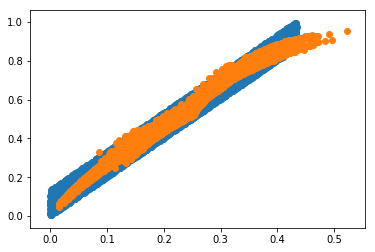

tensor(11.4354, grad_fn=<AddBackward0>)
X_sample tensor([[0.1998, 0.4470],
        [0.3165, 0.7420],
        [0.1679, 0.4050],
        ...,
        [0.1330, 0.3205],
        [0.0752, 0.2308],
        [0.3685, 0.7943]])


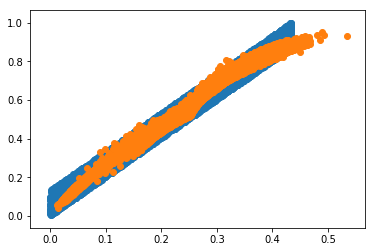

tensor(11.4519, grad_fn=<AddBackward0>)
X_sample tensor([[0.0617, 0.1873],
        [0.4136, 0.8322],
        [0.3235, 0.7129],
        ...,
        [0.0995, 0.2725],
        [0.2497, 0.5685],
        [0.1400, 0.3456]])


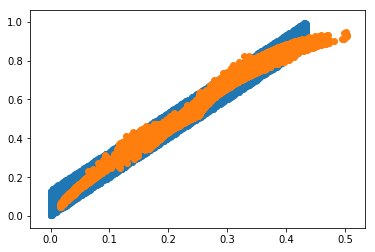

tensor(11.4218, grad_fn=<AddBackward0>)
X_sample tensor([[0.2998, 0.6776],
        [0.0874, 0.2382],
        [0.4215, 0.8848],
        ...,
        [0.1956, 0.4325],
        [0.1507, 0.3956],
        [0.2622, 0.5737]])


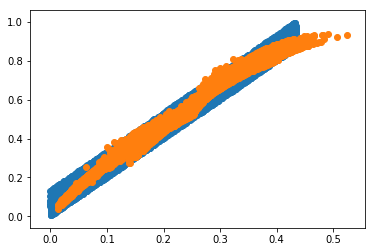

tensor(11.4851, grad_fn=<AddBackward0>)
X_sample tensor([[0.0925, 0.2544],
        [0.2315, 0.5427],
        [0.1295, 0.3351],
        ...,
        [0.1300, 0.3372],
        [0.0888, 0.2436],
        [0.2294, 0.5322]])


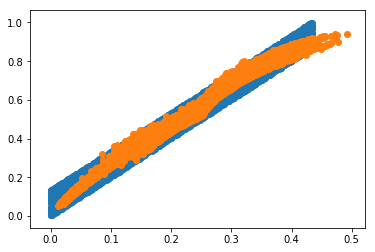

tensor(11.4178, grad_fn=<AddBackward0>)
X_sample tensor([[0.2631, 0.6058],
        [0.1369, 0.3407],
        [0.2997, 0.6797],
        ...,
        [0.2335, 0.5153],
        [0.4110, 0.8496],
        [0.3256, 0.7172]])


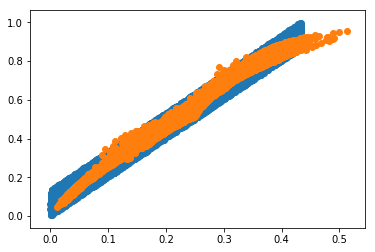

tensor(11.4424, grad_fn=<AddBackward0>)
X_sample tensor([[0.3714, 0.8382],
        [0.3843, 0.8618],
        [0.2650, 0.6344],
        ...,
        [0.4225, 0.9034],
        [0.1468, 0.3711],
        [0.2765, 0.6307]])


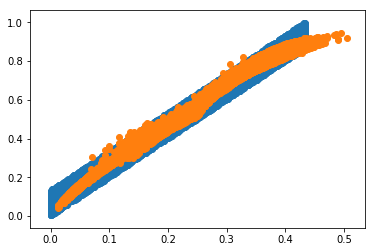

tensor(11.4423, grad_fn=<AddBackward0>)
X_sample tensor([[0.2508, 0.6155],
        [0.3456, 0.7409],
        [0.2913, 0.6515],
        ...,
        [0.1052, 0.2799],
        [0.0508, 0.1585],
        [0.0651, 0.2083]])


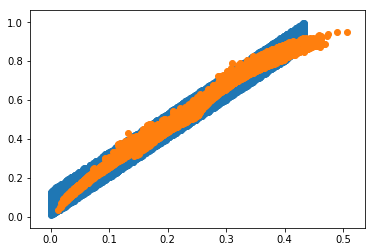

tensor(11.4414, grad_fn=<AddBackward0>)
X_sample tensor([[0.2047, 0.4580],
        [0.3439, 0.7374],
        [0.1362, 0.3379],
        ...,
        [0.2357, 0.5343],
        [0.1014, 0.2899],
        [0.1623, 0.3852]])


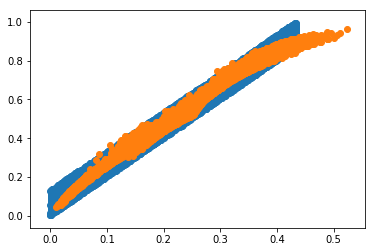

tensor(11.4329, grad_fn=<AddBackward0>)
X_sample tensor([[0.4474, 0.9033],
        [0.3483, 0.8055],
        [0.3720, 0.7996],
        ...,
        [0.0665, 0.2046],
        [0.0502, 0.1604],
        [0.1854, 0.4307]])


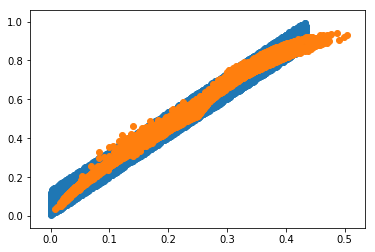

tensor(11.4233, grad_fn=<AddBackward0>)
X_sample tensor([[0.0793, 0.2404],
        [0.3313, 0.7444],
        [0.3129, 0.6862],
        ...,
        [0.3504, 0.7529],
        [0.2491, 0.5717],
        [0.0765, 0.2269]])


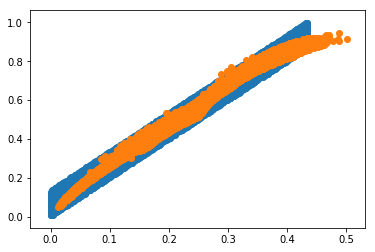

tensor(11.4280, grad_fn=<AddBackward0>)
X_sample tensor([[0.3504, 0.8080],
        [0.0933, 0.2599],
        [0.1845, 0.4117],
        ...,
        [0.1594, 0.3772],
        [0.1227, 0.3093],
        [0.1941, 0.4572]])


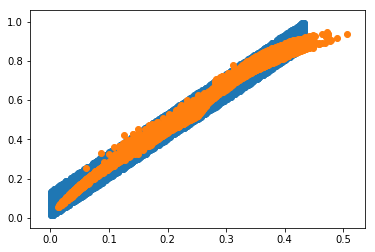

tensor(11.4457, grad_fn=<AddBackward0>)
X_sample tensor([[0.1735, 0.3931],
        [0.1279, 0.3297],
        [0.2333, 0.5490],
        ...,
        [0.2752, 0.6254],
        [0.2294, 0.5450],
        [0.2430, 0.5764]])


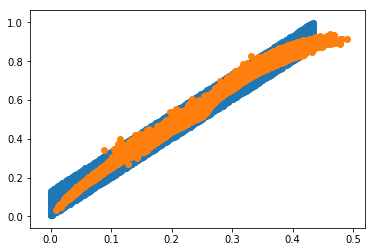

tensor(11.4509, grad_fn=<AddBackward0>)
X_sample tensor([[0.2808, 0.6521],
        [0.3312, 0.7423],
        [0.0230, 0.0877],
        ...,
        [0.2628, 0.5785],
        [0.2254, 0.4781],
        [0.2765, 0.6118]])


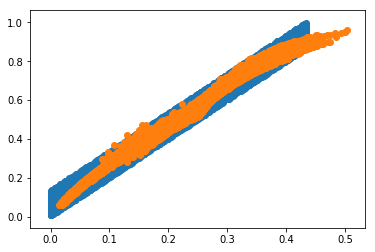

tensor(11.4656, grad_fn=<AddBackward0>)
X_sample tensor([[0.1285, 0.3275],
        [0.0639, 0.1840],
        [0.1716, 0.3883],
        ...,
        [0.3143, 0.6904],
        [0.2953, 0.6581],
        [0.1758, 0.4299]])


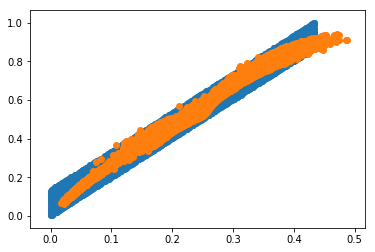

tensor(11.4615, grad_fn=<AddBackward0>)
X_sample tensor([[0.0852, 0.2349],
        [0.2262, 0.5037],
        [0.3626, 0.7779],
        ...,
        [0.2450, 0.5479],
        [0.2184, 0.4895],
        [0.0759, 0.2211]])


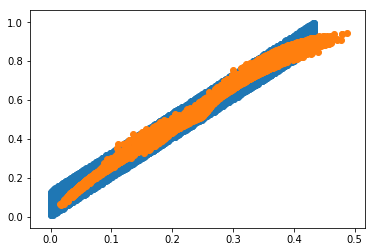

tensor(11.3970, grad_fn=<AddBackward0>)
X_sample tensor([[0.3495, 0.7493],
        [0.1966, 0.4465],
        [0.1216, 0.3214],
        ...,
        [0.2205, 0.4859],
        [0.2918, 0.6468],
        [0.1454, 0.3527]])


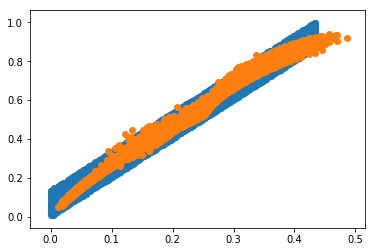

tensor(11.4294, grad_fn=<AddBackward0>)
X_sample tensor([[0.3253, 0.7147],
        [0.1365, 0.3440],
        [0.1465, 0.3727],
        ...,
        [0.1654, 0.3913],
        [0.1806, 0.3914],
        [0.3034, 0.6767]])


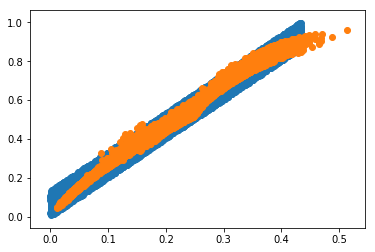

tensor(11.4371, grad_fn=<AddBackward0>)
X_sample tensor([[0.0768, 0.2155],
        [0.3481, 0.7476],
        [0.1375, 0.3350],
        ...,
        [0.3228, 0.7077],
        [0.1507, 0.3890],
        [0.3233, 0.7555]])


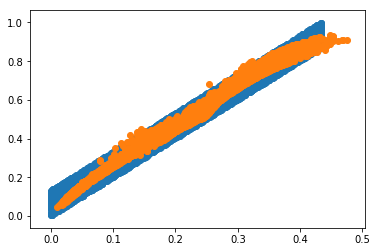

tensor(11.4257, grad_fn=<AddBackward0>)
X_sample tensor([[0.2442, 0.5689],
        [0.1116, 0.2785],
        [0.2188, 0.4875],
        ...,
        [0.0722, 0.2074],
        [0.2117, 0.4618],
        [0.3049, 0.6851]])


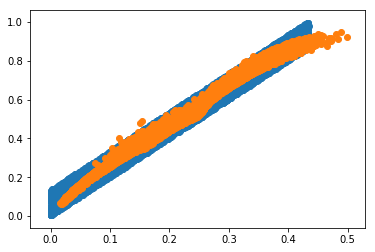

tensor(11.4487, grad_fn=<AddBackward0>)
X_sample tensor([[0.0961, 0.2683],
        [0.2722, 0.6189],
        [0.3856, 0.8281],
        ...,
        [0.2977, 0.6837],
        [0.1876, 0.4216],
        [0.3385, 0.7942]])


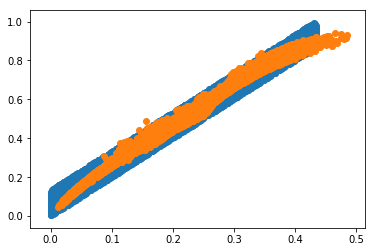

tensor(11.4263, grad_fn=<AddBackward0>)
X_sample tensor([[0.3262, 0.7052],
        [0.1077, 0.2835],
        [0.3018, 0.6822],
        ...,
        [0.1278, 0.3394],
        [0.2222, 0.5078],
        [0.3767, 0.7922]])


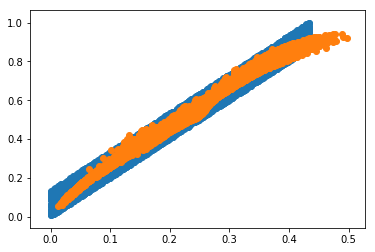

tensor(11.4189, grad_fn=<AddBackward0>)
X_sample tensor([[0.3117, 0.7122],
        [0.1279, 0.3193],
        [0.2353, 0.5232],
        ...,
        [0.3132, 0.7188],
        [0.2248, 0.4942],
        [0.2949, 0.6465]])


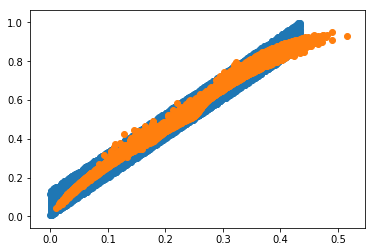

tensor(11.4419, grad_fn=<AddBackward0>)
X_sample tensor([[0.0501, 0.1685],
        [0.1271, 0.3371],
        [0.3131, 0.6954],
        ...,
        [0.2543, 0.6296],
        [0.2946, 0.6540],
        [0.0748, 0.2183]])


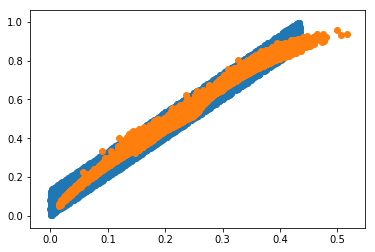

tensor(11.4027, grad_fn=<AddBackward0>)
X_sample tensor([[0.2171, 0.4901],
        [0.3341, 0.7777],
        [0.1447, 0.3509],
        ...,
        [0.0569, 0.1844],
        [0.1930, 0.4417],
        [0.2644, 0.5984]])


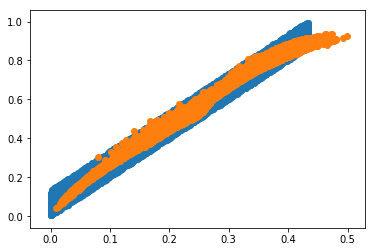

tensor(11.4454, grad_fn=<AddBackward0>)
X_sample tensor([[0.0851, 0.2452],
        [0.3632, 0.7914],
        [0.3455, 0.7812],
        ...,
        [0.1804, 0.4222],
        [0.3321, 0.7280],
        [0.0748, 0.2290]])


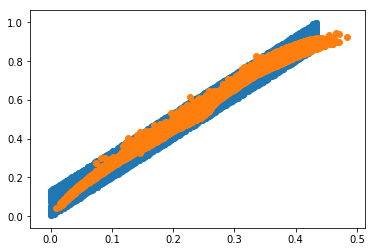

tensor(11.4089, grad_fn=<AddBackward0>)
X_sample tensor([[0.3204, 0.7151],
        [0.3374, 0.7487],
        [0.2114, 0.4831],
        ...,
        [0.2705, 0.6031],
        [0.3821, 0.8586],
        [0.2465, 0.5678]])


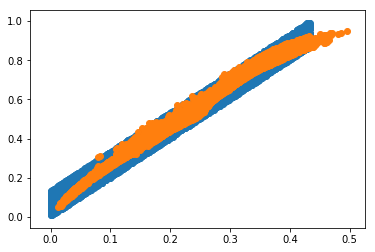

tensor(11.4419, grad_fn=<AddBackward0>)
X_sample tensor([[0.1613, 0.3850],
        [0.3283, 0.7278],
        [0.1507, 0.3829],
        ...,
        [0.1772, 0.4255],
        [0.2064, 0.4534],
        [0.3864, 0.8046]])


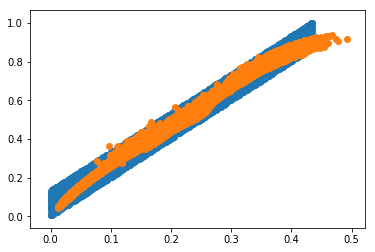

tensor(11.4425, grad_fn=<AddBackward0>)
X_sample tensor([[0.2125, 0.4832],
        [0.3138, 0.7012],
        [0.0993, 0.2717],
        ...,
        [0.3437, 0.7752],
        [0.1819, 0.4164],
        [0.0685, 0.2000]])


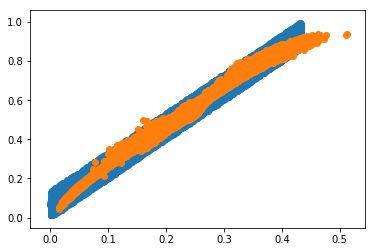

tensor(11.4622, grad_fn=<AddBackward0>)
X_sample tensor([[0.3182, 0.6932],
        [0.3946, 0.8390],
        [0.3199, 0.7057],
        ...,
        [0.1886, 0.4268],
        [0.1903, 0.4261],
        [0.3363, 0.7631]])


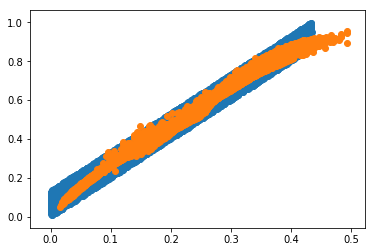

tensor(11.4079, grad_fn=<AddBackward0>)
X_sample tensor([[0.3187, 0.7103],
        [0.3043, 0.6707],
        [0.2833, 0.6524],
        ...,
        [0.3790, 0.7982],
        [0.3336, 0.7553],
        [0.2614, 0.5998]])


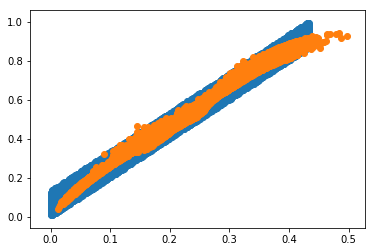

tensor(11.4737, grad_fn=<AddBackward0>)
X_sample tensor([[0.2418, 0.5728],
        [0.2360, 0.5288],
        [0.3910, 0.8668],
        ...,
        [0.2342, 0.4976],
        [0.2329, 0.5413],
        [0.2194, 0.4754]])


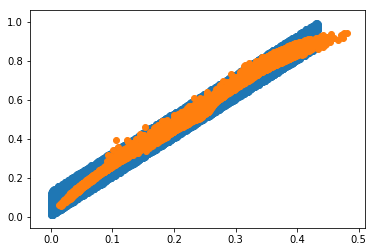

tensor(11.4283, grad_fn=<AddBackward0>)
X_sample tensor([[0.3746, 0.8399],
        [0.1718, 0.4021],
        [0.1008, 0.2823],
        ...,
        [0.2058, 0.4586],
        [0.2956, 0.6673],
        [0.1296, 0.3261]])


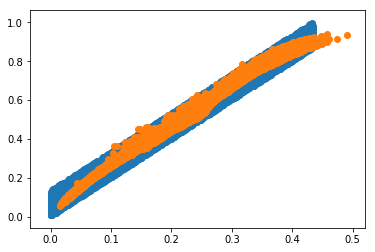

tensor(11.4531, grad_fn=<AddBackward0>)
X_sample tensor([[0.1451, 0.3615],
        [0.2945, 0.6552],
        [0.1976, 0.4413],
        ...,
        [0.3471, 0.7620],
        [0.0791, 0.2217],
        [0.2711, 0.6079]])


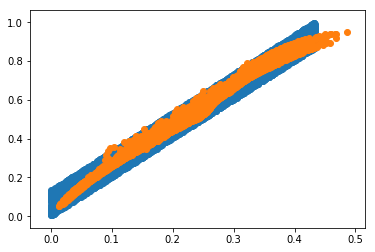

tensor(11.4494, grad_fn=<AddBackward0>)
X_sample tensor([[0.1397, 0.3735],
        [0.3809, 0.8376],
        [0.0820, 0.2311],
        ...,
        [0.3371, 0.7812],
        [0.2523, 0.5691],
        [0.0428, 0.1337]])


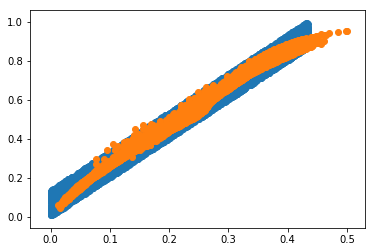

tensor(11.4544, grad_fn=<AddBackward0>)
X_sample tensor([[0.1648, 0.3961],
        [0.1920, 0.4482],
        [0.1656, 0.4256],
        ...,
        [0.2426, 0.5475],
        [0.0664, 0.2030],
        [0.2129, 0.4717]])


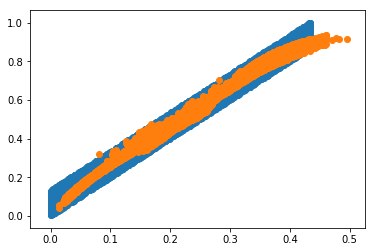

tensor(11.4334, grad_fn=<AddBackward0>)
X_sample tensor([[0.1111, 0.2881],
        [0.1131, 0.2961],
        [0.1547, 0.3573],
        ...,
        [0.3164, 0.6859],
        [0.2984, 0.6635],
        [0.2325, 0.5028]])


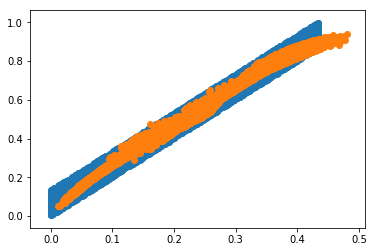

tensor(11.4166, grad_fn=<AddBackward0>)
X_sample tensor([[0.3340, 0.7314],
        [0.0516, 0.1630],
        [0.3091, 0.7090],
        ...,
        [0.0471, 0.1381],
        [0.1626, 0.3862],
        [0.1242, 0.3199]])


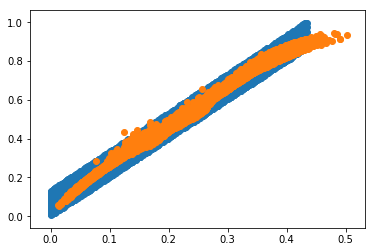

tensor(11.3801, grad_fn=<AddBackward0>)
X_sample tensor([[0.1698, 0.4316],
        [0.3400, 0.7780],
        [0.3812, 0.8625],
        ...,
        [0.2790, 0.6311],
        [0.1882, 0.4217],
        [0.0940, 0.2620]])


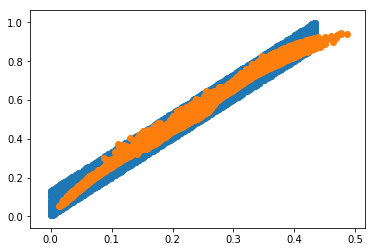

tensor(11.4282, grad_fn=<AddBackward0>)
X_sample tensor([[0.3153, 0.7237],
        [0.2230, 0.4872],
        [0.2289, 0.5132],
        ...,
        [0.2292, 0.5184],
        [0.2530, 0.5375],
        [0.3892, 0.8424]])


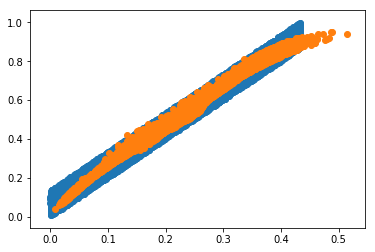

tensor(11.5004, grad_fn=<AddBackward0>)
X_sample tensor([[0.3615, 0.7751],
        [0.2402, 0.5412],
        [0.2508, 0.5405],
        ...,
        [0.1193, 0.3048],
        [0.2478, 0.5652],
        [0.2189, 0.4858]])


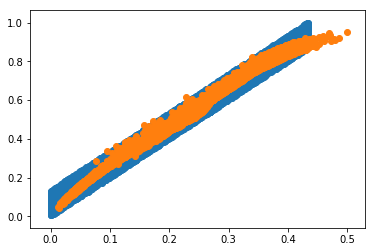

tensor(11.4138, grad_fn=<AddBackward0>)
X_sample tensor([[0.1655, 0.3823],
        [0.1114, 0.3211],
        [0.0991, 0.2711],
        ...,
        [0.0780, 0.2236],
        [0.2242, 0.4957],
        [0.3062, 0.6777]])


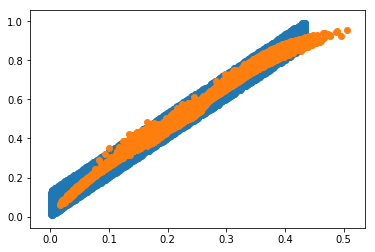

tensor(11.4508, grad_fn=<AddBackward0>)
X_sample tensor([[0.2657, 0.5883],
        [0.3494, 0.7778],
        [0.3260, 0.7414],
        ...,
        [0.1684, 0.4002],
        [0.1768, 0.4246],
        [0.0963, 0.2657]])


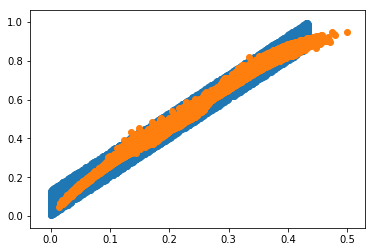

tensor(11.4133, grad_fn=<AddBackward0>)
X_sample tensor([[0.2226, 0.4912],
        [0.3244, 0.7248],
        [0.2622, 0.5907],
        ...,
        [0.1568, 0.3791],
        [0.2084, 0.4644],
        [0.1794, 0.4088]])


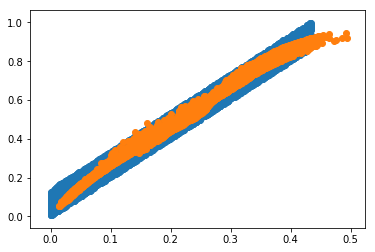

tensor(11.4213, grad_fn=<AddBackward0>)
X_sample tensor([[0.0688, 0.1979],
        [0.3255, 0.7135],
        [0.1219, 0.3201],
        ...,
        [0.3660, 0.7840],
        [0.2047, 0.4682],
        [0.3033, 0.6729]])


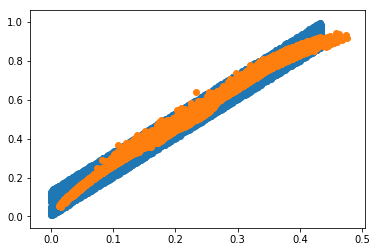

tensor(11.4050, grad_fn=<AddBackward0>)
X_sample tensor([[0.0567, 0.1810],
        [0.1416, 0.3522],
        [0.3949, 0.8420],
        ...,
        [0.3157, 0.7231],
        [0.1909, 0.4344],
        [0.0549, 0.1739]])


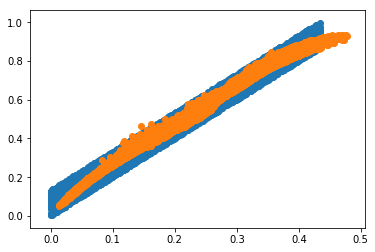

tensor(11.4375, grad_fn=<AddBackward0>)
X_sample tensor([[0.1508, 0.3809],
        [0.1190, 0.3159],
        [0.2401, 0.5523],
        ...,
        [0.1645, 0.3821],
        [0.2616, 0.5618],
        [0.1053, 0.2882]])


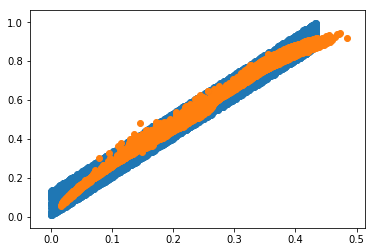

tensor(11.4246, grad_fn=<AddBackward0>)
X_sample tensor([[0.0653, 0.2011],
        [0.2602, 0.5849],
        [0.3595, 0.8132],
        ...,
        [0.0519, 0.1646],
        [0.2170, 0.4775],
        [0.1492, 0.3621]])


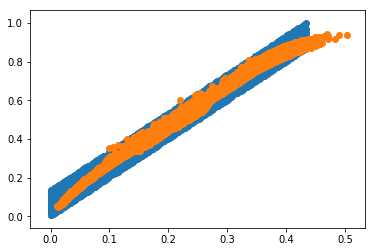

tensor(11.4522, grad_fn=<AddBackward0>)
X_sample tensor([[0.0957, 0.2662],
        [0.1281, 0.3281],
        [0.1630, 0.3799],
        ...,
        [0.1498, 0.3944],
        [0.3318, 0.7373],
        [0.3527, 0.7794]])


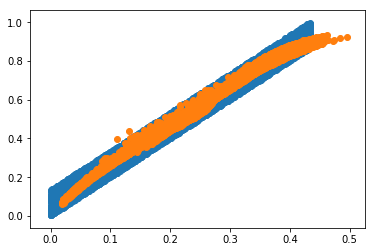

tensor(11.4212, grad_fn=<AddBackward0>)
X_sample tensor([[0.1829, 0.4296],
        [0.0348, 0.1155],
        [0.1338, 0.3474],
        ...,
        [0.2114, 0.4643],
        [0.3552, 0.8116],
        [0.1202, 0.3108]])


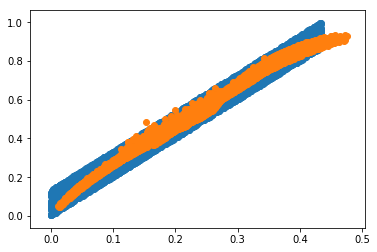

tensor(11.4556, grad_fn=<AddBackward0>)
X_sample tensor([[0.1208, 0.3262],
        [0.0827, 0.2411],
        [0.3064, 0.6761],
        ...,
        [0.1049, 0.2965],
        [0.0868, 0.2478],
        [0.1134, 0.2984]])


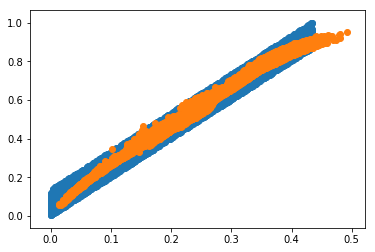

tensor(11.4187, grad_fn=<AddBackward0>)
X_sample tensor([[0.2910, 0.6353],
        [0.3145, 0.6869],
        [0.3762, 0.8090],
        ...,
        [0.3097, 0.6732],
        [0.3824, 0.8322],
        [0.0489, 0.1552]])


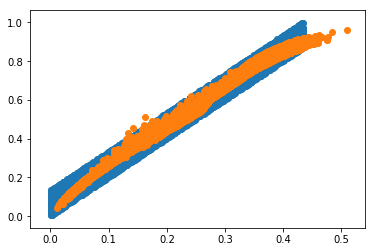

tensor(11.3953, grad_fn=<AddBackward0>)
X_sample tensor([[0.3121, 0.6757],
        [0.2160, 0.4723],
        [0.3313, 0.7460],
        ...,
        [0.2983, 0.6707],
        [0.2507, 0.5744],
        [0.3338, 0.7318]])


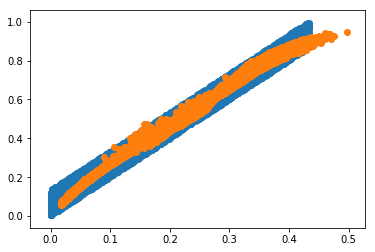

tensor(11.4391, grad_fn=<AddBackward0>)
X_sample tensor([[0.3567, 0.7930],
        [0.1353, 0.3418],
        [0.1290, 0.3270],
        ...,
        [0.2305, 0.4941],
        [0.2611, 0.5623],
        [0.2645, 0.5689]])


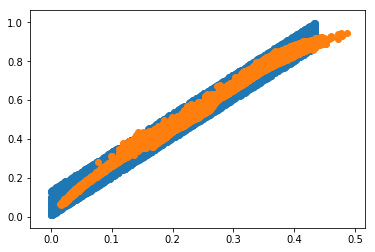

tensor(11.4388, grad_fn=<AddBackward0>)
X_sample tensor([[0.3150, 0.7266],
        [0.3497, 0.7618],
        [0.0907, 0.2495],
        ...,
        [0.1217, 0.3033],
        [0.3670, 0.8393],
        [0.2990, 0.6708]])


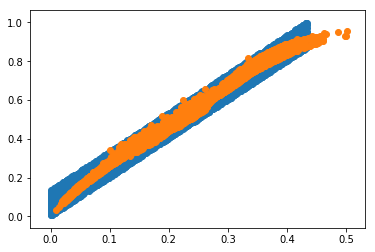

tensor(11.4415, grad_fn=<AddBackward0>)
X_sample tensor([[0.0733, 0.2183],
        [0.3361, 0.7480],
        [0.1777, 0.4149],
        ...,
        [0.1673, 0.4019],
        [0.1013, 0.2679],
        [0.1935, 0.4274]])


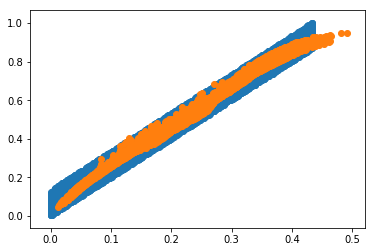

tensor(11.4252, grad_fn=<AddBackward0>)
X_sample tensor([[0.0346, 0.1084],
        [0.3487, 0.7840],
        [0.2450, 0.5208],
        ...,
        [0.1203, 0.3350],
        [0.1954, 0.4357],
        [0.0608, 0.1809]])


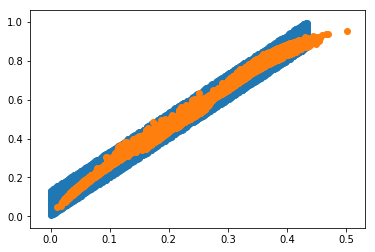

tensor(11.4376, grad_fn=<AddBackward0>)
X_sample tensor([[0.0763, 0.2123],
        [0.2661, 0.5933],
        [0.2709, 0.6249],
        ...,
        [0.0697, 0.2023],
        [0.3617, 0.8148],
        [0.3057, 0.6665]])


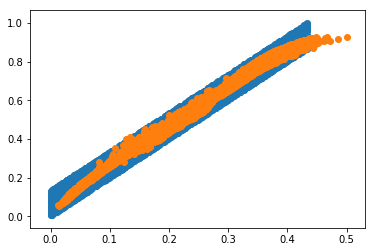

tensor(11.4167, grad_fn=<AddBackward0>)
X_sample tensor([[0.1392, 0.3524],
        [0.1033, 0.2860],
        [0.1089, 0.2844],
        ...,
        [0.1720, 0.4049],
        [0.0713, 0.2061],
        [0.4194, 0.8742]])


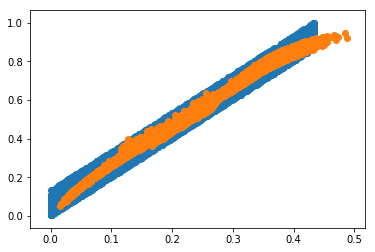

tensor(11.4405, grad_fn=<AddBackward0>)
X_sample tensor([[0.1717, 0.3996],
        [0.3566, 0.8054],
        [0.1154, 0.2892],
        ...,
        [0.0433, 0.1412],
        [0.3031, 0.6920],
        [0.2952, 0.6698]])


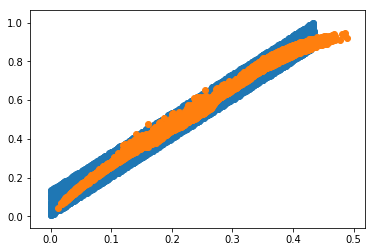

tensor(11.4156, grad_fn=<AddBackward0>)
X_sample tensor([[0.3446, 0.7774],
        [0.1372, 0.3540],
        [0.3218, 0.7209],
        ...,
        [0.3670, 0.8068],
        [0.2395, 0.5088],
        [0.2468, 0.5303]])


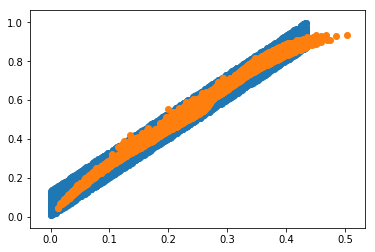

tensor(11.4644, grad_fn=<AddBackward0>)
X_sample tensor([[0.0346, 0.1101],
        [0.3250, 0.7302],
        [0.0983, 0.2712],
        ...,
        [0.2715, 0.6007],
        [0.3906, 0.8729],
        [0.3198, 0.7156]])


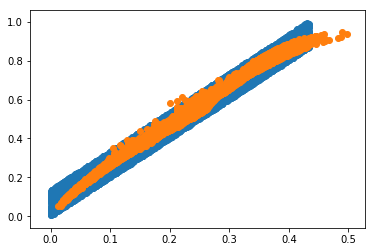

tensor(11.4682, grad_fn=<AddBackward0>)
X_sample tensor([[0.0328, 0.1075],
        [0.2427, 0.5165],
        [0.1206, 0.3154],
        ...,
        [0.2314, 0.5575],
        [0.3039, 0.6944],
        [0.0930, 0.2545]])


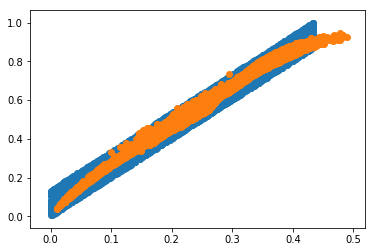

tensor(11.4090, grad_fn=<AddBackward0>)
X_sample tensor([[0.2722, 0.6097],
        [0.3392, 0.7689],
        [0.4143, 0.8794],
        ...,
        [0.3344, 0.7430],
        [0.3107, 0.6918],
        [0.2518, 0.5511]])


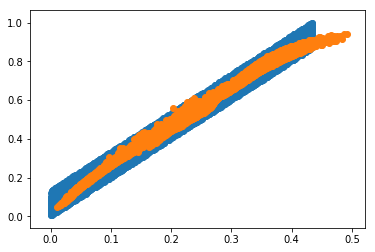

tensor(11.4614, grad_fn=<AddBackward0>)
X_sample tensor([[0.2779, 0.6118],
        [0.0554, 0.1693],
        [0.2557, 0.5636],
        ...,
        [0.1910, 0.4302],
        [0.4657, 0.9180],
        [0.0893, 0.2444]])


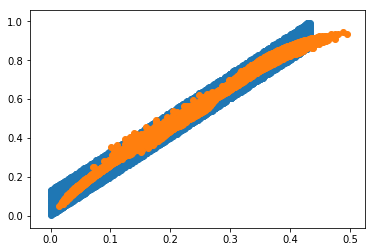

tensor(11.4193, grad_fn=<AddBackward0>)
X_sample tensor([[0.1323, 0.3310],
        [0.1794, 0.4700],
        [0.2913, 0.6459],
        ...,
        [0.1992, 0.4386],
        [0.0836, 0.2758],
        [0.0815, 0.2326]])


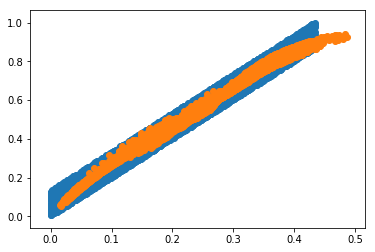

tensor(11.3780, grad_fn=<AddBackward0>)
X_sample tensor([[0.2984, 0.6512],
        [0.2871, 0.6280],
        [0.2529, 0.5432],
        ...,
        [0.2244, 0.5173],
        [0.3469, 0.7871],
        [0.1171, 0.3031]])


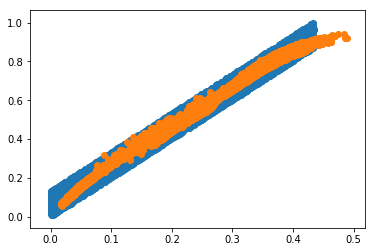

tensor(11.3925, grad_fn=<AddBackward0>)
X_sample tensor([[0.1512, 0.3742],
        [0.1217, 0.3197],
        [0.0722, 0.2165],
        ...,
        [0.0924, 0.2523],
        [0.1731, 0.3989],
        [0.0776, 0.2246]])


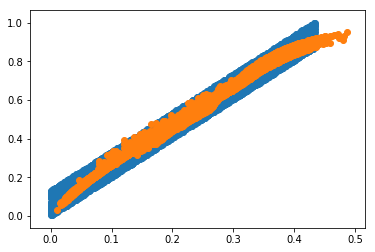

tensor(11.4243, grad_fn=<AddBackward0>)
X_sample tensor([[0.2322, 0.5529],
        [0.3583, 0.8177],
        [0.1299, 0.3391],
        ...,
        [0.0825, 0.2271],
        [0.3475, 0.8028],
        [0.2246, 0.5189]])


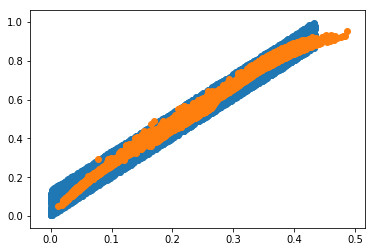

tensor(11.4179, grad_fn=<AddBackward0>)
X_sample tensor([[0.3790, 0.8349],
        [0.0685, 0.1958],
        [0.0977, 0.2648],
        ...,
        [0.2247, 0.5329],
        [0.0499, 0.1495],
        [0.3134, 0.7019]])


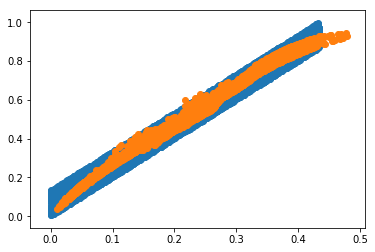

tensor(11.4163, grad_fn=<AddBackward0>)
X_sample tensor([[0.3865, 0.8689],
        [0.3327, 0.7604],
        [0.0652, 0.1869],
        ...,
        [0.3493, 0.7911],
        [0.2876, 0.6411],
        [0.2836, 0.6404]])


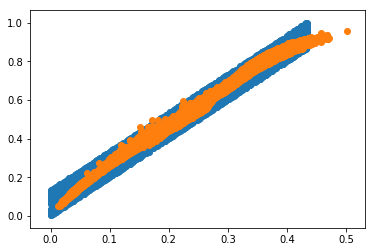

tensor(11.4590, grad_fn=<AddBackward0>)
X_sample tensor([[0.3005, 0.6662],
        [0.3688, 0.8256],
        [0.1223, 0.3187],
        ...,
        [0.0740, 0.2060],
        [0.1046, 0.2797],
        [0.2271, 0.4972]])


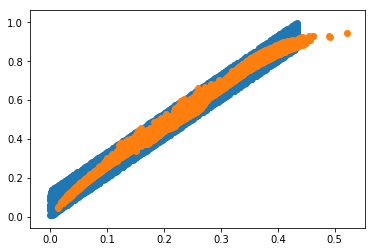

tensor(11.4398, grad_fn=<AddBackward0>)
X_sample tensor([[0.2784, 0.6204],
        [0.3239, 0.7333],
        [0.1114, 0.2904],
        ...,
        [0.3107, 0.7063],
        [0.4086, 0.8657],
        [0.2319, 0.5395]])


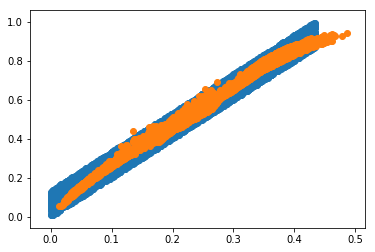

tensor(11.3868, grad_fn=<AddBackward0>)
X_sample tensor([[0.2064, 0.4949],
        [0.2764, 0.6191],
        [0.0846, 0.2348],
        ...,
        [0.2093, 0.5073],
        [0.1274, 0.3248],
        [0.2412, 0.5329]])


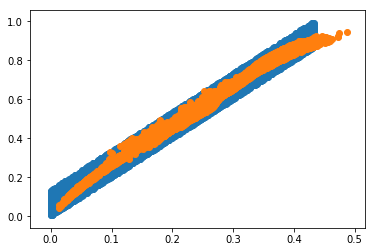

tensor(11.4204, grad_fn=<AddBackward0>)
X_sample tensor([[0.3662, 0.8322],
        [0.3214, 0.7298],
        [0.2929, 0.6507],
        ...,
        [0.0685, 0.1972],
        [0.0822, 0.2325],
        [0.3316, 0.7271]])


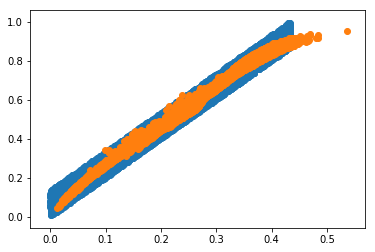

tensor(11.4592, grad_fn=<AddBackward0>)
X_sample tensor([[0.3147, 0.7120],
        [0.1429, 0.3424],
        [0.1698, 0.4036],
        ...,
        [0.3283, 0.7338],
        [0.0583, 0.1674],
        [0.3534, 0.8022]])


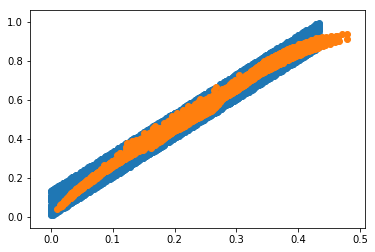

tensor(11.4203, grad_fn=<AddBackward0>)
X_sample tensor([[0.0649, 0.1968],
        [0.3119, 0.6813],
        [0.1667, 0.4028],
        ...,
        [0.2841, 0.6303],
        [0.3468, 0.7508],
        [0.0773, 0.2230]])


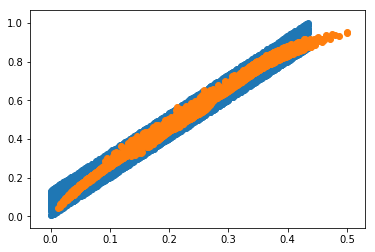

tensor(11.4179, grad_fn=<AddBackward0>)
X_sample tensor([[0.2889, 0.6556],
        [0.2220, 0.4845],
        [0.3373, 0.7333],
        ...,
        [0.0503, 0.1595],
        [0.2857, 0.6376],
        [0.3183, 0.7192]])


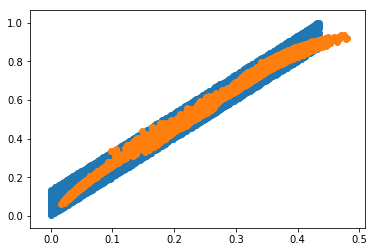

tensor(11.4638, grad_fn=<AddBackward0>)
X_sample tensor([[0.3017, 0.6833],
        [0.0893, 0.2404],
        [0.0891, 0.2449],
        ...,
        [0.2421, 0.5734],
        [0.3511, 0.7816],
        [0.0661, 0.1920]])


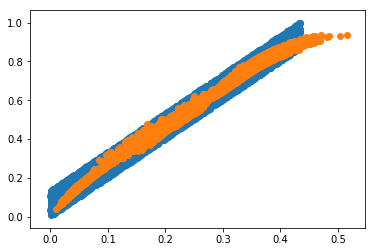

tensor(11.4355, grad_fn=<AddBackward0>)
X_sample tensor([[0.1908, 0.4401],
        [0.3839, 0.8383],
        [0.1940, 0.4575],
        ...,
        [0.2610, 0.6489],
        [0.0923, 0.2606],
        [0.2970, 0.6836]])


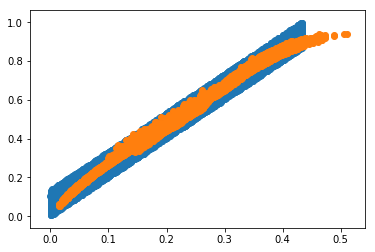

tensor(11.4683, grad_fn=<AddBackward0>)
X_sample tensor([[0.3539, 0.7813],
        [0.1149, 0.3044],
        [0.1021, 0.2857],
        ...,
        [0.2900, 0.6428],
        [0.3067, 0.6793],
        [0.3571, 0.7822]])


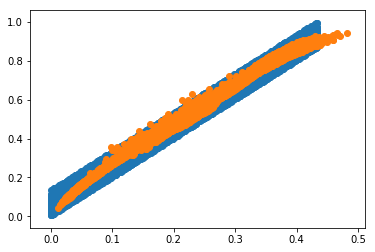

tensor(11.4360, grad_fn=<AddBackward0>)
X_sample tensor([[0.2998, 0.6854],
        [0.0740, 0.2150],
        [0.3338, 0.7419],
        ...,
        [0.1364, 0.3439],
        [0.2491, 0.6469],
        [0.0786, 0.2213]])


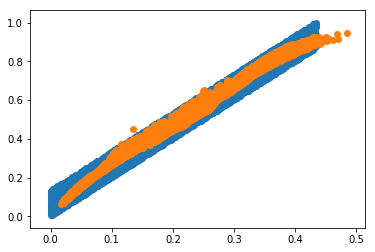

tensor(11.4553, grad_fn=<AddBackward0>)
X_sample tensor([[0.3070, 0.6740],
        [0.2354, 0.5407],
        [0.0678, 0.2111],
        ...,
        [0.3269, 0.7223],
        [0.4478, 0.8852],
        [0.1662, 0.4288]])


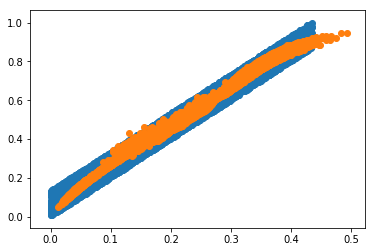

tensor(11.4188, grad_fn=<AddBackward0>)
X_sample tensor([[0.3145, 0.7014],
        [0.2049, 0.4513],
        [0.3207, 0.6982],
        ...,
        [0.0988, 0.2668],
        [0.2782, 0.6273],
        [0.2180, 0.5203]])


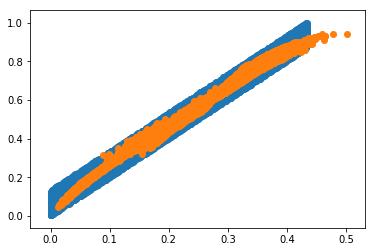

tensor(11.4253, grad_fn=<AddBackward0>)
X_sample tensor([[0.3454, 0.7820],
        [0.1736, 0.4062],
        [0.3439, 0.7904],
        ...,
        [0.3624, 0.8055],
        [0.2050, 0.4615],
        [0.2894, 0.6333]])


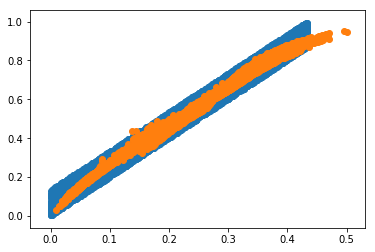

tensor(11.4268, grad_fn=<AddBackward0>)
X_sample tensor([[0.0591, 0.1763],
        [0.1133, 0.2899],
        [0.4234, 0.8748],
        ...,
        [0.2963, 0.6418],
        [0.0393, 0.1254],
        [0.2972, 0.6600]])


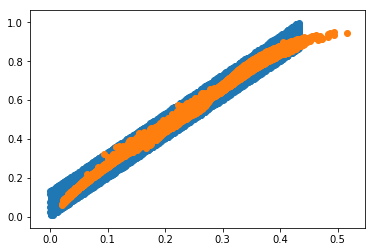

tensor(11.4229, grad_fn=<AddBackward0>)
X_sample tensor([[0.3013, 0.6751],
        [0.2793, 0.6337],
        [0.2292, 0.5089],
        ...,
        [0.0732, 0.2167],
        [0.3356, 0.7562],
        [0.2746, 0.6082]])


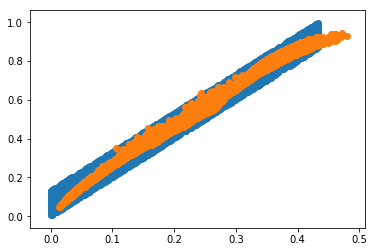

tensor(11.4149, grad_fn=<AddBackward0>)
X_sample tensor([[0.3231, 0.7361],
        [0.0721, 0.2075],
        [0.0692, 0.2172],
        ...,
        [0.2260, 0.4881],
        [0.3126, 0.7134],
        [0.0896, 0.2525]])


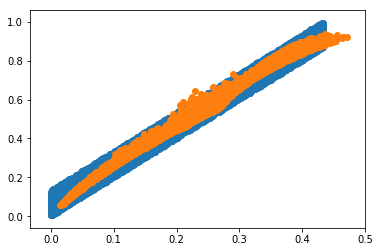

tensor(11.4273, grad_fn=<AddBackward0>)
X_sample tensor([[0.2792, 0.6552],
        [0.0955, 0.2685],
        [0.0432, 0.1421],
        ...,
        [0.2294, 0.5050],
        [0.2240, 0.5068],
        [0.1290, 0.3225]])


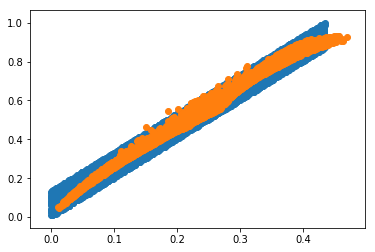

tensor(11.4262, grad_fn=<AddBackward0>)
X_sample tensor([[0.1113, 0.2910],
        [0.2909, 0.6517],
        [0.1788, 0.4271],
        ...,
        [0.1451, 0.3642],
        [0.4323, 0.9077],
        [0.1500, 0.3773]])


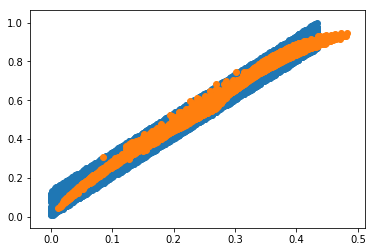

tensor(11.4462, grad_fn=<AddBackward0>)
X_sample tensor([[0.1720, 0.4157],
        [0.3084, 0.6838],
        [0.3536, 0.7602],
        ...,
        [0.1208, 0.3078],
        [0.3493, 0.7694],
        [0.0595, 0.1812]])


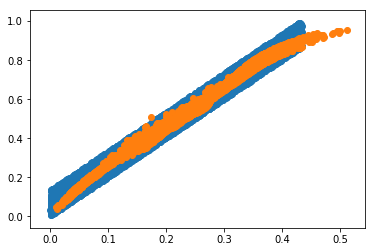

tensor(11.4453, grad_fn=<AddBackward0>)
X_sample tensor([[0.2764, 0.6026],
        [0.0743, 0.2125],
        [0.2978, 0.6759],
        ...,
        [0.3863, 0.8369],
        [0.0715, 0.2036],
        [0.3623, 0.7766]])


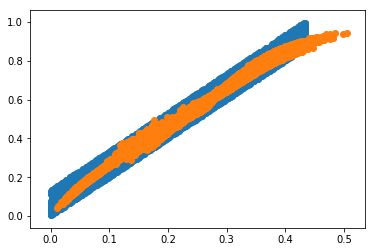

tensor(11.4236, grad_fn=<AddBackward0>)
X_sample tensor([[0.1561, 0.4244],
        [0.2085, 0.4637],
        [0.2507, 0.5506],
        ...,
        [0.1257, 0.3192],
        [0.1131, 0.2969],
        [0.0491, 0.1508]])


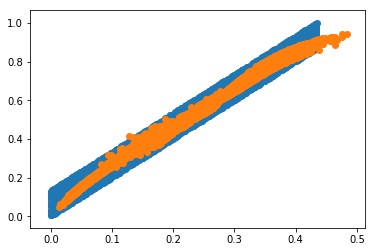

tensor(11.4328, grad_fn=<AddBackward0>)
X_sample tensor([[0.1558, 0.3724],
        [0.3942, 0.8613],
        [0.0665, 0.1928],
        ...,
        [0.4086, 0.8808],
        [0.3810, 0.8501],
        [0.0960, 0.2667]])


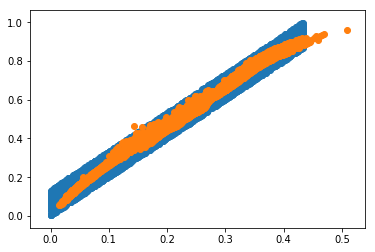

tensor(11.4269, grad_fn=<AddBackward0>)
X_sample tensor([[0.1275, 0.3385],
        [0.3680, 0.8430],
        [0.1320, 0.3473],
        ...,
        [0.2858, 0.6522],
        [0.0627, 0.1915],
        [0.0876, 0.2496]])


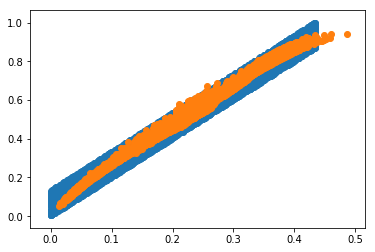

tensor(11.4220, grad_fn=<AddBackward0>)
X_sample tensor([[0.0853, 0.2451],
        [0.0938, 0.2650],
        [0.1208, 0.3083],
        ...,
        [0.1138, 0.2986],
        [0.3487, 0.7800],
        [0.2834, 0.6368]])


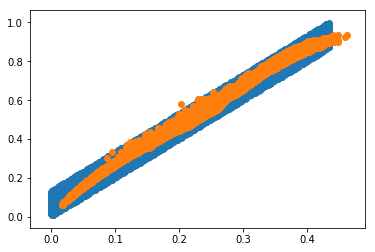

tensor(11.4471, grad_fn=<AddBackward0>)
X_sample tensor([[0.0261, 0.0917],
        [0.0451, 0.1472],
        [0.2113, 0.4740],
        ...,
        [0.1482, 0.3558],
        [0.1107, 0.2944],
        [0.1050, 0.2734]])


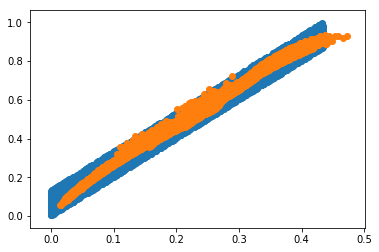

tensor(11.4488, grad_fn=<AddBackward0>)
X_sample tensor([[0.2145, 0.4919],
        [0.2172, 0.5002],
        [0.0992, 0.2670],
        ...,
        [0.4255, 0.9022],
        [0.0991, 0.2751],
        [0.1695, 0.4025]])


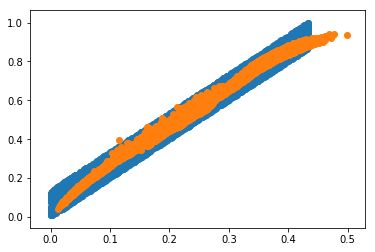

tensor(11.4627, grad_fn=<AddBackward0>)
X_sample tensor([[0.2947, 0.6595],
        [0.1737, 0.4206],
        [0.1954, 0.4330],
        ...,
        [0.0903, 0.2541],
        [0.3504, 0.7556],
        [0.3217, 0.7102]])


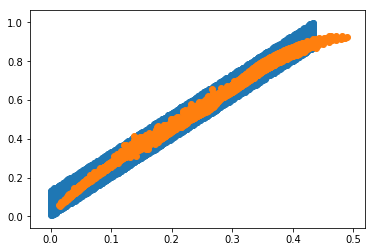

tensor(11.4280, grad_fn=<AddBackward0>)
X_sample tensor([[0.0397, 0.1237],
        [0.1577, 0.3791],
        [0.1223, 0.3175],
        ...,
        [0.0310, 0.0957],
        [0.3009, 0.6580],
        [0.1533, 0.3779]])


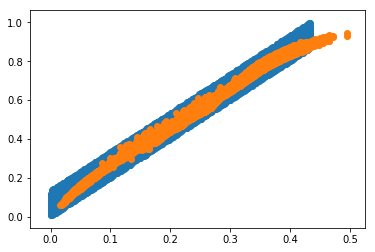

tensor(11.4306, grad_fn=<AddBackward0>)
X_sample tensor([[0.2557, 0.5780],
        [0.4260, 0.8895],
        [0.2214, 0.4913],
        ...,
        [0.2361, 0.5429],
        [0.2798, 0.6035],
        [0.4245, 0.9136]])


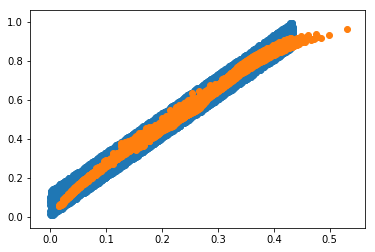

tensor(11.4214, grad_fn=<AddBackward0>)
X_sample tensor([[0.0507, 0.1522],
        [0.3154, 0.7061],
        [0.3110, 0.6831],
        ...,
        [0.3696, 0.8004],
        [0.3194, 0.7068],
        [0.0328, 0.1114]])


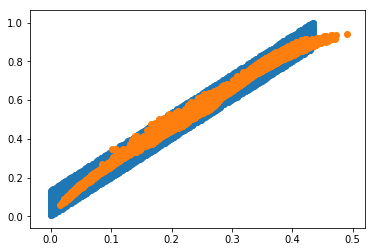

tensor(11.4245, grad_fn=<AddBackward0>)
X_sample tensor([[0.3050, 0.6921],
        [0.3364, 0.7441],
        [0.3708, 0.8070],
        ...,
        [0.2447, 0.5435],
        [0.1051, 0.2864],
        [0.1754, 0.4210]])


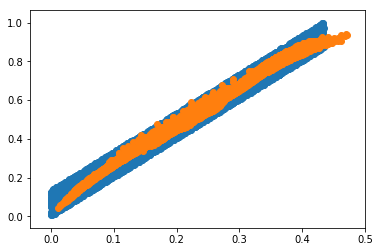

tensor(11.4321, grad_fn=<AddBackward0>)
X_sample tensor([[0.1225, 0.3169],
        [0.0993, 0.2730],
        [0.0589, 0.1881],
        ...,
        [0.1293, 0.3390],
        [0.3606, 0.8008],
        [0.1213, 0.3050]])


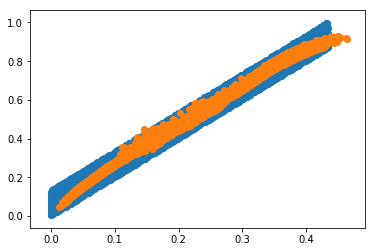

tensor(11.4302, grad_fn=<AddBackward0>)
X_sample tensor([[0.1168, 0.2976],
        [0.1424, 0.3498],
        [0.2892, 0.6498],
        ...,
        [0.3257, 0.7166],
        [0.3782, 0.8427],
        [0.3095, 0.6984]])


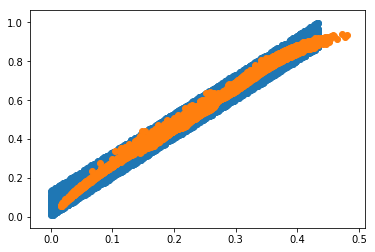

tensor(11.3981, grad_fn=<AddBackward0>)
X_sample tensor([[0.1093, 0.2806],
        [0.3337, 0.7345],
        [0.0706, 0.1995],
        ...,
        [0.1208, 0.3155],
        [0.2501, 0.5378],
        [0.1734, 0.4030]])


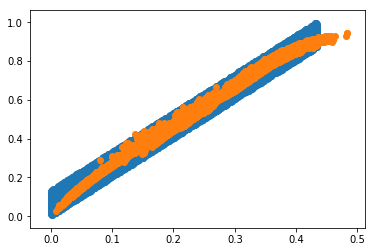

tensor(11.4470, grad_fn=<AddBackward0>)
X_sample tensor([[0.3143, 0.7038],
        [0.2581, 0.5697],
        [0.1071, 0.2808],
        ...,
        [0.1175, 0.3052],
        [0.3557, 0.7962],
        [0.3803, 0.8539]])


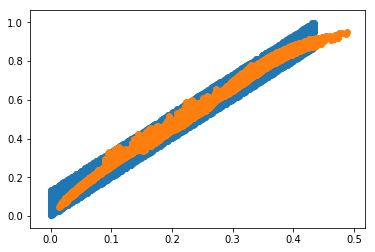

tensor(11.4209, grad_fn=<AddBackward0>)
X_sample tensor([[0.2705, 0.6044],
        [0.3009, 0.6532],
        [0.2080, 0.4680],
        ...,
        [0.1505, 0.3607],
        [0.0569, 0.1707],
        [0.3021, 0.6634]])


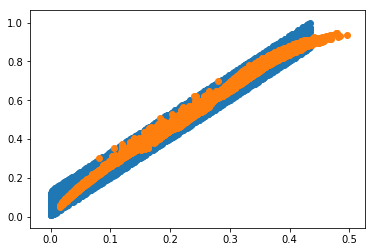

tensor(11.4230, grad_fn=<AddBackward0>)
X_sample tensor([[0.1720, 0.4090],
        [0.3088, 0.6677],
        [0.2844, 0.6419],
        ...,
        [0.3357, 0.7495],
        [0.3112, 0.6761],
        [0.2710, 0.6165]])


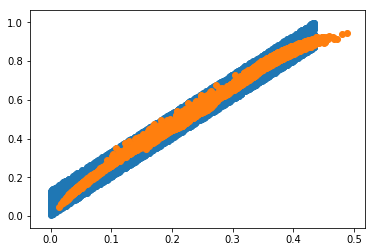

tensor(11.4360, grad_fn=<AddBackward0>)
X_sample tensor([[0.2737, 0.6100],
        [0.2810, 0.6181],
        [0.2275, 0.5364],
        ...,
        [0.0663, 0.2023],
        [0.3392, 0.7588],
        [0.2114, 0.4813]])


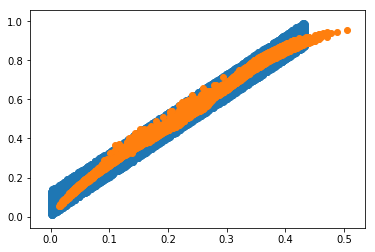

tensor(11.3985, grad_fn=<AddBackward0>)
X_sample tensor([[0.3447, 0.7725],
        [0.3045, 0.7138],
        [0.3798, 0.8214],
        ...,
        [0.2239, 0.5177],
        [0.2648, 0.5777],
        [0.1614, 0.3910]])


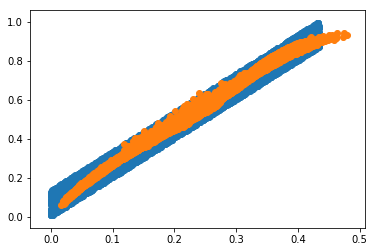

tensor(11.4390, grad_fn=<AddBackward0>)
X_sample tensor([[0.3403, 0.7779],
        [0.1150, 0.3053],
        [0.3268, 0.7479],
        ...,
        [0.2125, 0.4839],
        [0.0665, 0.1999],
        [0.3274, 0.7437]])


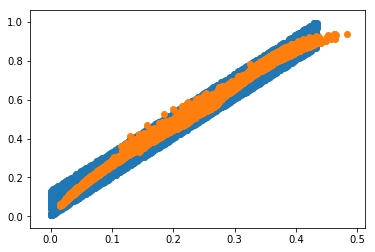

tensor(11.4091, grad_fn=<AddBackward0>)
X_sample tensor([[0.3534, 0.7738],
        [0.3253, 0.7266],
        [0.3068, 0.6797],
        ...,
        [0.2868, 0.6435],
        [0.2030, 0.4680],
        [0.2123, 0.4601]])


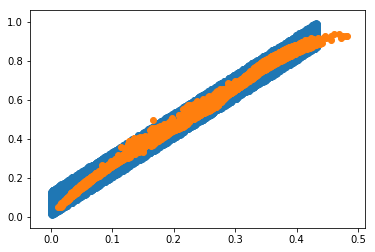

tensor(11.4210, grad_fn=<AddBackward0>)
X_sample tensor([[0.0548, 0.1676],
        [0.4331, 0.9075],
        [0.3553, 0.8101],
        ...,
        [0.2246, 0.4973],
        [0.3281, 0.7013],
        [0.0523, 0.1609]])


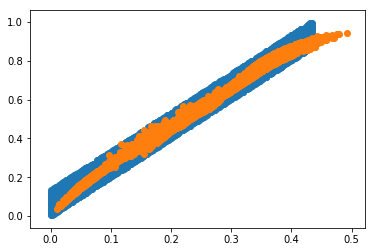

tensor(11.4469, grad_fn=<AddBackward0>)
X_sample tensor([[0.1939, 0.4479],
        [0.2474, 0.5413],
        [0.3451, 0.7800],
        ...,
        [0.1121, 0.2957],
        [0.1609, 0.3900],
        [0.2837, 0.6250]])


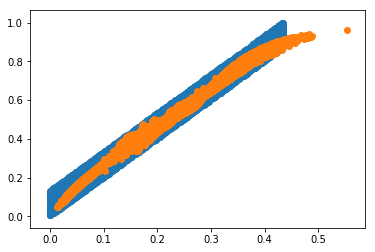

tensor(11.4573, grad_fn=<AddBackward0>)
X_sample tensor([[0.1620, 0.4054],
        [0.1278, 0.3270],
        [0.0922, 0.2596],
        ...,
        [0.1499, 0.3775],
        [0.2590, 0.6008],
        [0.2176, 0.4860]])


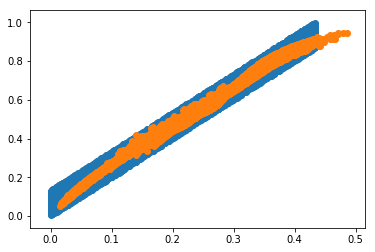

tensor(11.4239, grad_fn=<AddBackward0>)
X_sample tensor([[0.3592, 0.8043],
        [0.3127, 0.7058],
        [0.2225, 0.4960],
        ...,
        [0.0539, 0.1681],
        [0.1809, 0.4217],
        [0.1899, 0.4528]])


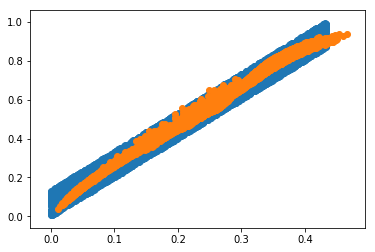

tensor(11.4767, grad_fn=<AddBackward0>)
X_sample tensor([[0.0857, 0.2309],
        [0.2992, 0.6704],
        [0.0880, 0.2484],
        ...,
        [0.2200, 0.4766],
        [0.1604, 0.4002],
        [0.3765, 0.8172]])


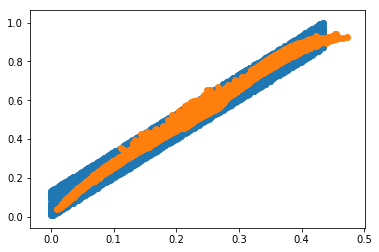

tensor(11.4550, grad_fn=<AddBackward0>)
X_sample tensor([[0.1718, 0.4237],
        [0.1506, 0.3797],
        [0.2970, 0.6738],
        ...,
        [0.1090, 0.3006],
        [0.1735, 0.4069],
        [0.2932, 0.6641]])


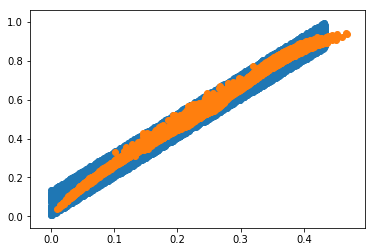

tensor(11.4401, grad_fn=<AddBackward0>)
X_sample tensor([[0.1541, 0.3853],
        [0.3192, 0.7263],
        [0.0337, 0.1043],
        ...,
        [0.1222, 0.3195],
        [0.0621, 0.1774],
        [0.2682, 0.5848]])


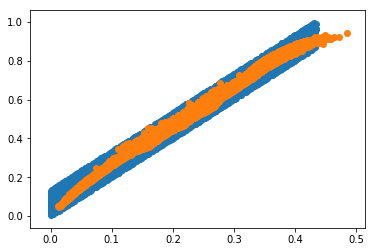

tensor(11.4412, grad_fn=<AddBackward0>)
X_sample tensor([[0.3715, 0.8193],
        [0.1092, 0.2979],
        [0.0932, 0.2507],
        ...,
        [0.0636, 0.1939],
        [0.3657, 0.7876],
        [0.2154, 0.4758]])


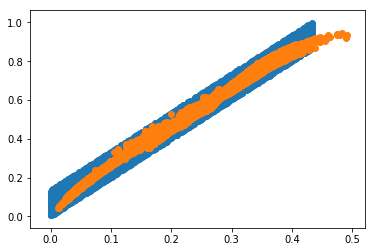

tensor(11.4525, grad_fn=<AddBackward0>)
X_sample tensor([[0.0843, 0.2257],
        [0.2337, 0.5172],
        [0.2821, 0.6227],
        ...,
        [0.3581, 0.7642],
        [0.3248, 0.7035],
        [0.0359, 0.1116]])


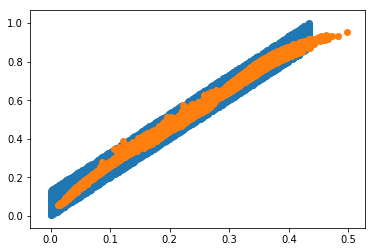

tensor(11.4588, grad_fn=<AddBackward0>)
X_sample tensor([[0.3050, 0.6776],
        [0.1221, 0.3071],
        [0.1281, 0.3187],
        ...,
        [0.2936, 0.6382],
        [0.0433, 0.1364],
        [0.0837, 0.2329]])


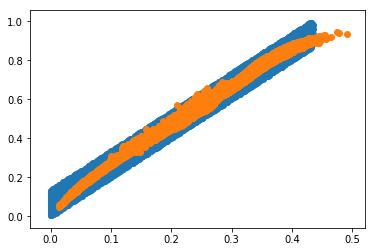

tensor(11.4180, grad_fn=<AddBackward0>)
X_sample tensor([[0.2286, 0.4977],
        [0.1684, 0.4057],
        [0.0546, 0.1801],
        ...,
        [0.3572, 0.7864],
        [0.0755, 0.2160],
        [0.0559, 0.1742]])


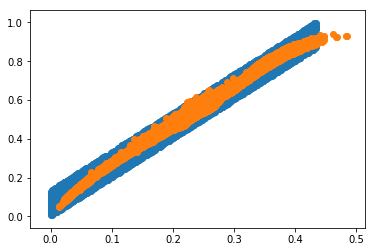

tensor(11.4653, grad_fn=<AddBackward0>)
X_sample tensor([[0.1218, 0.3196],
        [0.2054, 0.4799],
        [0.1816, 0.4216],
        ...,
        [0.0357, 0.1148],
        [0.1246, 0.3483],
        [0.1035, 0.2795]])


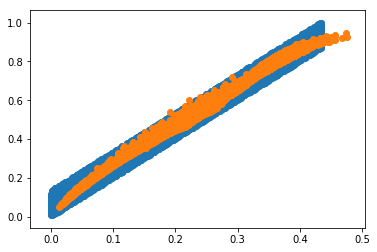

tensor(11.4328, grad_fn=<AddBackward0>)
X_sample tensor([[0.0415, 0.1276],
        [0.1540, 0.3783],
        [0.0950, 0.2685],
        ...,
        [0.0529, 0.1657],
        [0.3079, 0.6872],
        [0.3384, 0.7356]])


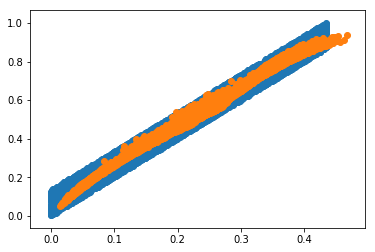

tensor(11.4172, grad_fn=<AddBackward0>)
X_sample tensor([[0.2582, 0.5927],
        [0.0608, 0.1821],
        [0.2723, 0.6113],
        ...,
        [0.3544, 0.7920],
        [0.2284, 0.5106],
        [0.3008, 0.6788]])


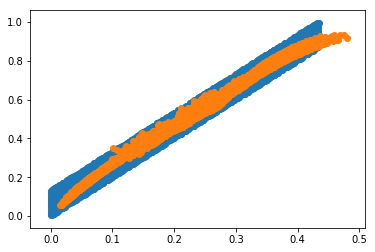

tensor(11.4047, grad_fn=<AddBackward0>)
X_sample tensor([[0.1560, 0.3806],
        [0.0921, 0.2536],
        [0.0860, 0.2432],
        ...,
        [0.3449, 0.7688],
        [0.1364, 0.3620],
        [0.1347, 0.3299]])


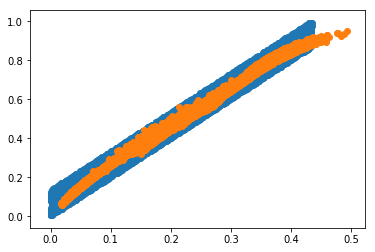

tensor(11.4071, grad_fn=<AddBackward0>)
X_sample tensor([[0.1670, 0.4046],
        [0.2171, 0.4816],
        [0.1410, 0.3533],
        ...,
        [0.0679, 0.1975],
        [0.1250, 0.3203],
        [0.3215, 0.7101]])


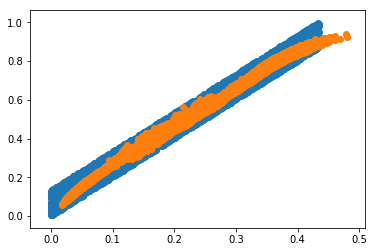

tensor(11.4405, grad_fn=<AddBackward0>)
X_sample tensor([[0.2073, 0.4663],
        [0.2349, 0.5169],
        [0.3426, 0.7374],
        ...,
        [0.2926, 0.6578],
        [0.1321, 0.3348],
        [0.2446, 0.5393]])


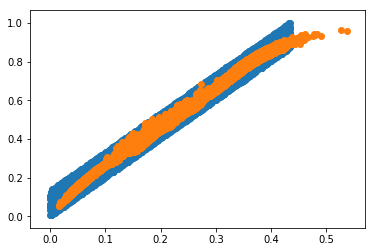

tensor(11.4142, grad_fn=<AddBackward0>)
X_sample tensor([[0.1095, 0.2900],
        [0.3870, 0.8657],
        [0.3489, 0.7693],
        ...,
        [0.3423, 0.7817],
        [0.1417, 0.3588],
        [0.0544, 0.1587]])


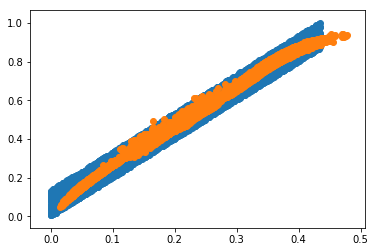

tensor(11.4588, grad_fn=<AddBackward0>)
X_sample tensor([[0.1661, 0.3998],
        [0.1662, 0.3983],
        [0.2514, 0.5676],
        ...,
        [0.1894, 0.4408],
        [0.1371, 0.3503],
        [0.3661, 0.8077]])


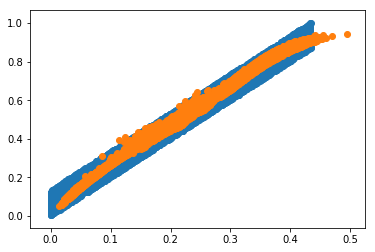

tensor(11.4329, grad_fn=<AddBackward0>)
X_sample tensor([[0.1375, 0.3884],
        [0.3130, 0.7027],
        [0.3836, 0.8470],
        ...,
        [0.3422, 0.7798],
        [0.3003, 0.6735],
        [0.2249, 0.5299]])


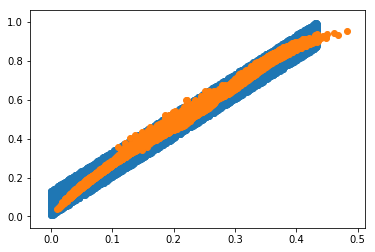

tensor(11.4168, grad_fn=<AddBackward0>)
X_sample tensor([[0.3031, 0.6658],
        [0.1122, 0.2921],
        [0.1143, 0.2972],
        ...,
        [0.1701, 0.4078],
        [0.1138, 0.2936],
        [0.1272, 0.3261]])


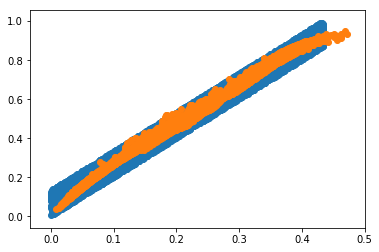

tensor(11.3950, grad_fn=<AddBackward0>)
X_sample tensor([[0.3100, 0.7098],
        [0.1161, 0.3081],
        [0.2668, 0.5981],
        ...,
        [0.0648, 0.1877],
        [0.3384, 0.7538],
        [0.3294, 0.7239]])


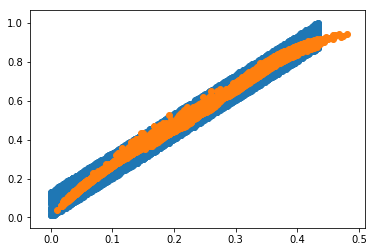

tensor(11.3902, grad_fn=<AddBackward0>)
X_sample tensor([[0.1952, 0.4614],
        [0.1510, 0.3717],
        [0.1990, 0.4766],
        ...,
        [0.3814, 0.8301],
        [0.0877, 0.2386],
        [0.3285, 0.7274]])


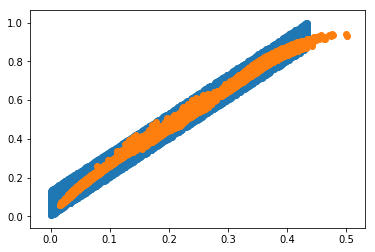

tensor(11.4167, grad_fn=<AddBackward0>)
X_sample tensor([[0.3488, 0.7538],
        [0.1637, 0.4052],
        [0.3142, 0.6867],
        ...,
        [0.2447, 0.5312],
        [0.1108, 0.2887],
        [0.3928, 0.8457]])


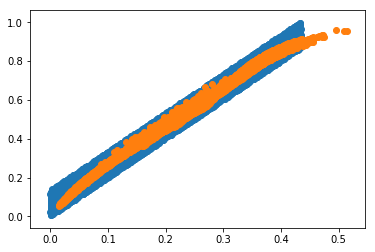

tensor(11.4698, grad_fn=<AddBackward0>)
X_sample tensor([[0.3656, 0.7941],
        [0.0524, 0.1619],
        [0.1384, 0.3525],
        ...,
        [0.2418, 0.5377],
        [0.1892, 0.4523],
        [0.2262, 0.5012]])


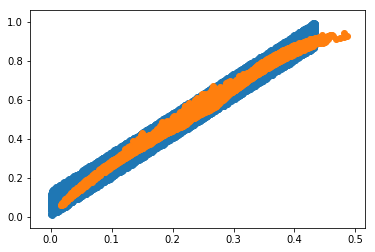

tensor(11.4434, grad_fn=<AddBackward0>)
X_sample tensor([[0.0958, 0.2662],
        [0.2591, 0.5952],
        [0.0764, 0.2187],
        ...,
        [0.0901, 0.2436],
        [0.0884, 0.2510],
        [0.2332, 0.5487]])


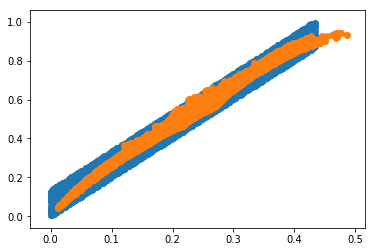

tensor(11.4443, grad_fn=<AddBackward0>)
X_sample tensor([[0.0315, 0.1092],
        [0.0474, 0.1444],
        [0.1616, 0.3973],
        ...,
        [0.2832, 0.6329],
        [0.2790, 0.6247],
        [0.3395, 0.7594]])


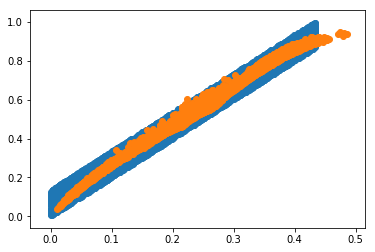

tensor(11.4097, grad_fn=<AddBackward0>)
X_sample tensor([[0.2100, 0.4697],
        [0.2462, 0.5848],
        [0.1983, 0.4829],
        ...,
        [0.1957, 0.4449],
        [0.1525, 0.3686],
        [0.0488, 0.1484]])


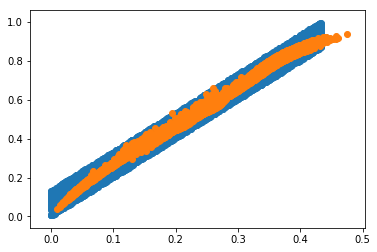

tensor(11.4666, grad_fn=<AddBackward0>)
X_sample tensor([[0.2171, 0.4880],
        [0.3167, 0.7099],
        [0.3453, 0.7625],
        ...,
        [0.3958, 0.8689],
        [0.1471, 0.3559],
        [0.3017, 0.6611]])


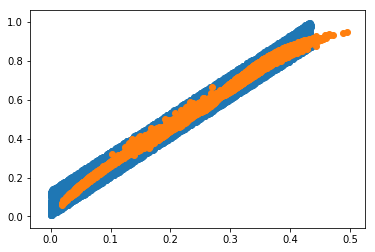

tensor(11.4421, grad_fn=<AddBackward0>)
X_sample tensor([[0.3744, 0.8302],
        [0.0182, 0.0694],
        [0.1374, 0.3467],
        ...,
        [0.1153, 0.3014],
        [0.2601, 0.5698],
        [0.3383, 0.7591]])


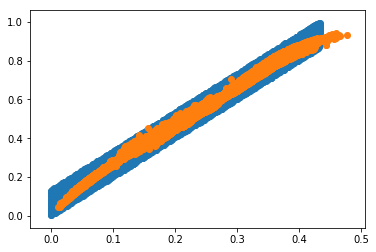

tensor(11.4569, grad_fn=<AddBackward0>)
X_sample tensor([[0.0779, 0.2240],
        [0.1955, 0.4569],
        [0.1824, 0.4333],
        ...,
        [0.3434, 0.7733],
        [0.1031, 0.2827],
        [0.3078, 0.6861]])


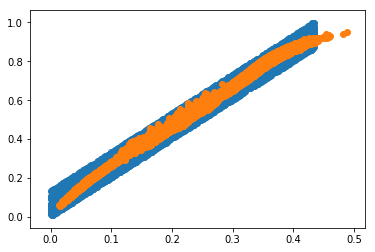

tensor(11.4270, grad_fn=<AddBackward0>)
X_sample tensor([[0.2361, 0.5143],
        [0.3104, 0.6767],
        [0.2489, 0.5424],
        ...,
        [0.0440, 0.1359],
        [0.2835, 0.6413],
        [0.1717, 0.4203]])


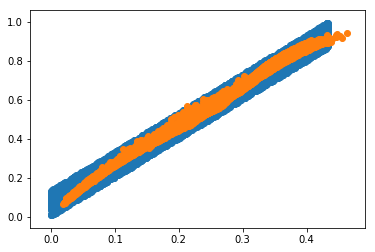

tensor(11.4415, grad_fn=<AddBackward0>)
X_sample tensor([[0.3016, 0.6754],
        [0.3109, 0.6986],
        [0.2030, 0.4732],
        ...,
        [0.0581, 0.1746],
        [0.3098, 0.6858],
        [0.2145, 0.4664]])


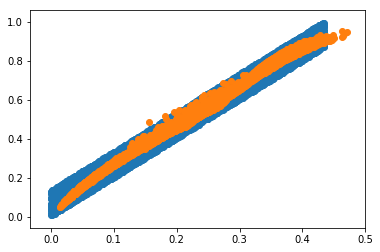

tensor(11.4307, grad_fn=<AddBackward0>)
X_sample tensor([[0.2839, 0.6381],
        [0.1947, 0.4523],
        [0.1601, 0.4003],
        ...,
        [0.3660, 0.8166],
        [0.3879, 0.8652],
        [0.1021, 0.2765]])


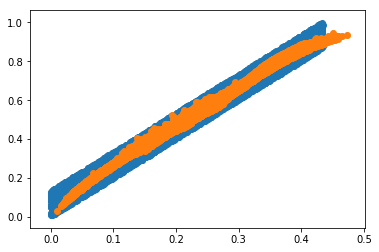

tensor(11.4732, grad_fn=<AddBackward0>)
X_sample tensor([[0.3203, 0.6961],
        [0.3596, 0.7703],
        [0.1055, 0.2846],
        ...,
        [0.1754, 0.3916],
        [0.3382, 0.7372],
        [0.3324, 0.7308]])


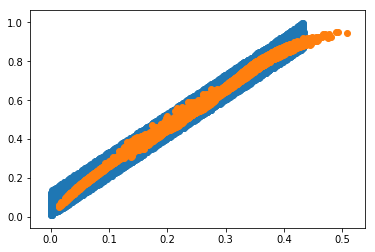

tensor(11.4269, grad_fn=<AddBackward0>)
X_sample tensor([[0.3658, 0.7830],
        [0.2938, 0.6605],
        [0.1144, 0.2990],
        ...,
        [0.2212, 0.5084],
        [0.3809, 0.8307],
        [0.3700, 0.8025]])


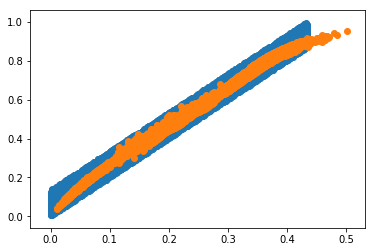

tensor(11.4205, grad_fn=<AddBackward0>)
X_sample tensor([[0.4013, 0.8580],
        [0.4368, 0.8987],
        [0.0895, 0.2395],
        ...,
        [0.4257, 0.8843],
        [0.1434, 0.3369],
        [0.1572, 0.3799]])


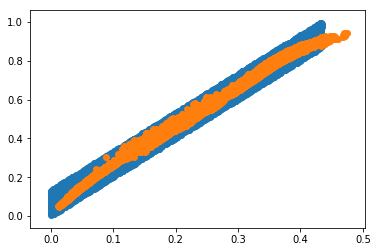

tensor(11.4668, grad_fn=<AddBackward0>)
X_sample tensor([[0.1638, 0.3961],
        [0.1279, 0.3214],
        [0.2792, 0.6184],
        ...,
        [0.1191, 0.3187],
        [0.1280, 0.3273],
        [0.2212, 0.4958]])


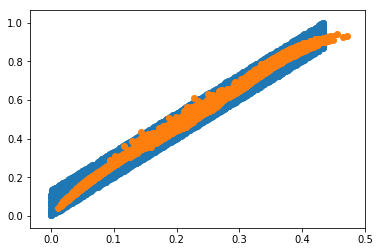

tensor(11.4682, grad_fn=<AddBackward0>)
X_sample tensor([[0.3900, 0.8404],
        [0.3703, 0.8172],
        [0.3453, 0.7793],
        ...,
        [0.2956, 0.6752],
        [0.2945, 0.6623],
        [0.0553, 0.1695]])


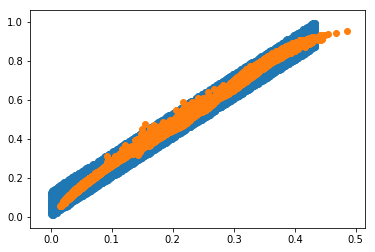

tensor(11.4074, grad_fn=<AddBackward0>)
X_sample tensor([[0.3379, 0.7618],
        [0.2033, 0.4608],
        [0.3134, 0.7020],
        ...,
        [0.3261, 0.7350],
        [0.1189, 0.3118],
        [0.0882, 0.2434]])


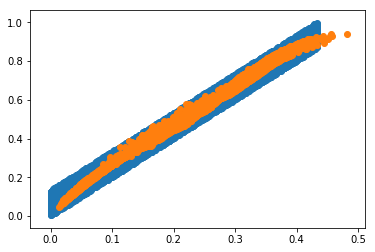

tensor(11.4743, grad_fn=<AddBackward0>)
X_sample tensor([[0.1075, 0.2908],
        [0.2352, 0.5134],
        [0.3567, 0.7915],
        ...,
        [0.3109, 0.7134],
        [0.0973, 0.2582],
        [0.3078, 0.6884]])


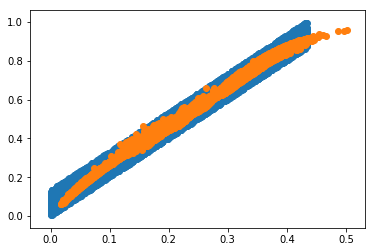

tensor(11.4134, grad_fn=<AddBackward0>)
X_sample tensor([[0.3359, 0.7440],
        [0.3073, 0.6708],
        [0.2803, 0.6262],
        ...,
        [0.3527, 0.7803],
        [0.0497, 0.1550],
        [0.1541, 0.3841]])


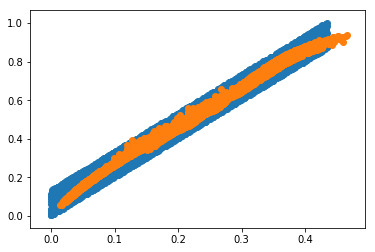

tensor(11.4541, grad_fn=<AddBackward0>)
X_sample tensor([[0.3234, 0.7125],
        [0.2642, 0.5826],
        [0.3491, 0.7685],
        ...,
        [0.1265, 0.3212],
        [0.3730, 0.8386],
        [0.3397, 0.7522]])


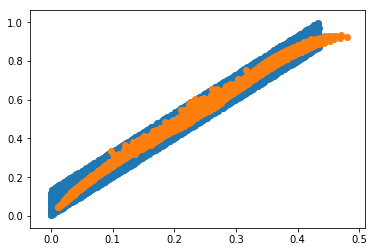

tensor(11.4115, grad_fn=<AddBackward0>)
X_sample tensor([[0.3214, 0.7110],
        [0.3437, 0.7770],
        [0.2188, 0.4870],
        ...,
        [0.3749, 0.8423],
        [0.2609, 0.5926],
        [0.0945, 0.2571]])


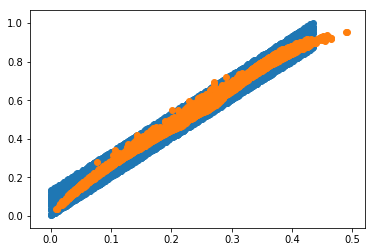

tensor(11.4472, grad_fn=<AddBackward0>)
X_sample tensor([[0.1901, 0.4313],
        [0.1527, 0.3848],
        [0.3047, 0.6684],
        ...,
        [0.2965, 0.6634],
        [0.2892, 0.6513],
        [0.2057, 0.5145]])


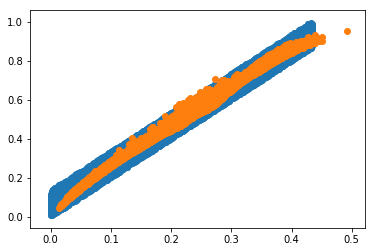

tensor(11.4196, grad_fn=<AddBackward0>)
X_sample tensor([[0.3072, 0.6829],
        [0.3142, 0.6890],
        [0.3063, 0.6836],
        ...,
        [0.1927, 0.4389],
        [0.3836, 0.8641],
        [0.1511, 0.4029]])


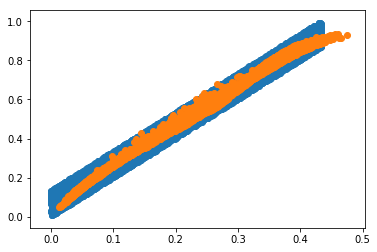

tensor(11.4426, grad_fn=<AddBackward0>)
X_sample tensor([[0.3865, 0.8372],
        [0.0473, 0.1455],
        [0.3526, 0.7890],
        ...,
        [0.2178, 0.5036],
        [0.0221, 0.0778],
        [0.4295, 0.9040]])


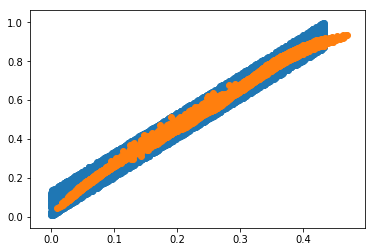

tensor(11.4380, grad_fn=<AddBackward0>)
X_sample tensor([[0.0230, 0.0805],
        [0.3942, 0.8331],
        [0.0615, 0.1844],
        ...,
        [0.1911, 0.4338],
        [0.2283, 0.5064],
        [0.1636, 0.3910]])


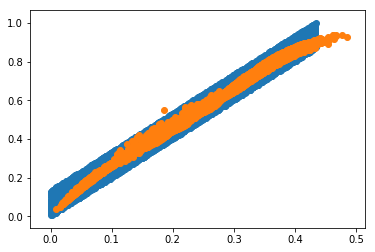

tensor(11.4819, grad_fn=<AddBackward0>)
X_sample tensor([[0.0740, 0.2126],
        [0.3383, 0.7472],
        [0.2524, 0.5882],
        ...,
        [0.3363, 0.7253],
        [0.1964, 0.4585],
        [0.1480, 0.3708]])


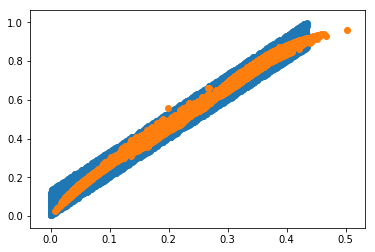

tensor(11.4523, grad_fn=<AddBackward0>)
X_sample tensor([[0.2814, 0.6310],
        [0.3416, 0.7640],
        [0.0342, 0.1115],
        ...,
        [0.3391, 0.7843],
        [0.3497, 0.7625],
        [0.2130, 0.4792]])


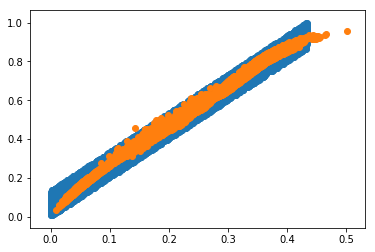

tensor(11.4277, grad_fn=<AddBackward0>)
X_sample tensor([[0.2951, 0.6465],
        [0.0463, 0.1453],
        [0.2654, 0.6021],
        ...,
        [0.1912, 0.4503],
        [0.3853, 0.8392],
        [0.3973, 0.8599]])


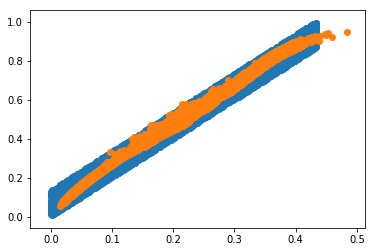

tensor(11.4440, grad_fn=<AddBackward0>)
X_sample tensor([[0.1918, 0.4368],
        [0.1385, 0.3756],
        [0.1904, 0.4582],
        ...,
        [0.1833, 0.4208],
        [0.3789, 0.8513],
        [0.2406, 0.5442]])


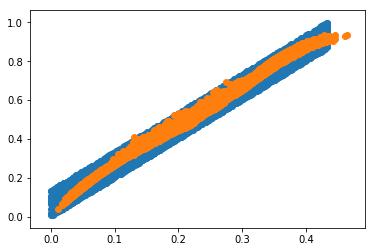

tensor(11.4707, grad_fn=<AddBackward0>)
X_sample tensor([[0.2492, 0.5400],
        [0.1790, 0.4327],
        [0.1425, 0.3554],
        ...,
        [0.3727, 0.8421],
        [0.1758, 0.4155],
        [0.2542, 0.5790]])


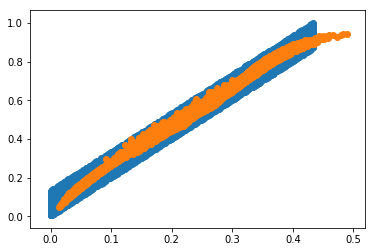

tensor(11.4004, grad_fn=<AddBackward0>)
X_sample tensor([[0.2256, 0.5144],
        [0.2622, 0.5735],
        [0.1215, 0.3085],
        ...,
        [0.2597, 0.5645],
        [0.0818, 0.2270],
        [0.0530, 0.1738]])


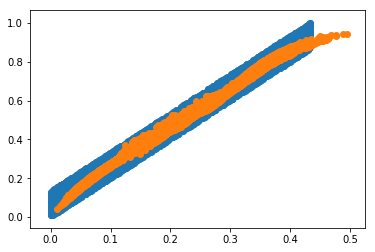

tensor(11.4492, grad_fn=<AddBackward0>)
X_sample tensor([[0.1890, 0.4193],
        [0.0838, 0.2359],
        [0.1529, 0.3687],
        ...,
        [0.1193, 0.3105],
        [0.2747, 0.6028],
        [0.0513, 0.1580]])


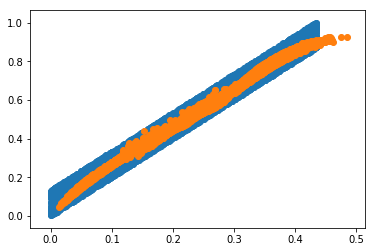

tensor(11.4075, grad_fn=<AddBackward0>)
X_sample tensor([[0.3837, 0.8490],
        [0.3413, 0.7492],
        [0.0737, 0.2040],
        ...,
        [0.0438, 0.1302],
        [0.3687, 0.8054],
        [0.1373, 0.3331]])


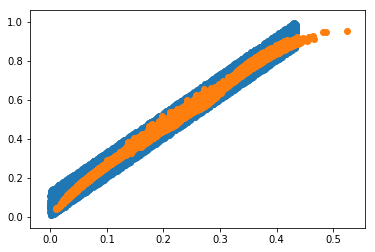

tensor(11.4512, grad_fn=<AddBackward0>)
X_sample tensor([[0.3459, 0.7738],
        [0.3169, 0.7037],
        [0.0646, 0.1883],
        ...,
        [0.0470, 0.1408],
        [0.3264, 0.7117],
        [0.2903, 0.6521]])


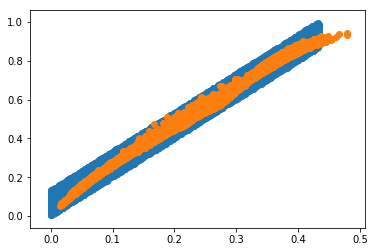

tensor(11.4683, grad_fn=<AddBackward0>)
X_sample tensor([[0.1415, 0.3454],
        [0.3075, 0.6735],
        [0.0819, 0.2292],
        ...,
        [0.0672, 0.1985],
        [0.1413, 0.3610],
        [0.1171, 0.3093]])


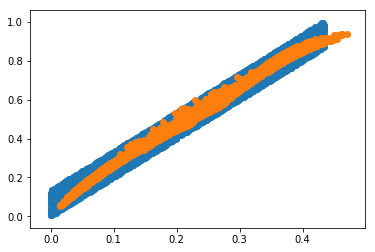

tensor(11.4089, grad_fn=<AddBackward0>)
X_sample tensor([[0.0461, 0.1453],
        [0.3442, 0.7659],
        [0.3045, 0.6724],
        ...,
        [0.0731, 0.2105],
        [0.1754, 0.4022],
        [0.0432, 0.1349]])


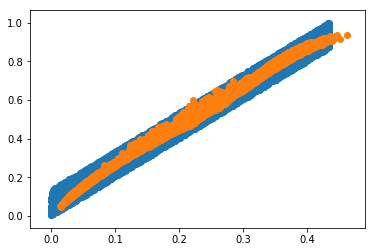

tensor(11.4381, grad_fn=<AddBackward0>)
X_sample tensor([[0.4192, 0.9075],
        [0.2146, 0.4795],
        [0.0512, 0.1550],
        ...,
        [0.4142, 0.9028],
        [0.1199, 0.3190],
        [0.3513, 0.7757]])


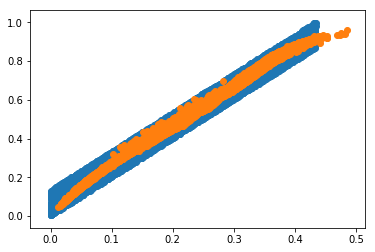

tensor(11.4538, grad_fn=<AddBackward0>)
X_sample tensor([[0.3608, 0.7887],
        [0.1744, 0.4093],
        [0.2780, 0.6164],
        ...,
        [0.1338, 0.3344],
        [0.3305, 0.7303],
        [0.3229, 0.7377]])


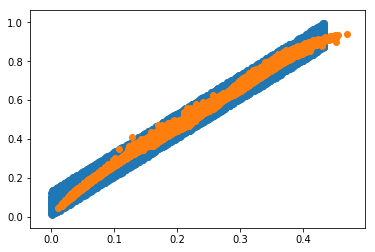

tensor(11.4309, grad_fn=<AddBackward0>)
X_sample tensor([[0.0563, 0.1741],
        [0.2564, 0.5592],
        [0.2039, 0.4737],
        ...,
        [0.2398, 0.5517],
        [0.0694, 0.2048],
        [0.3356, 0.7532]])


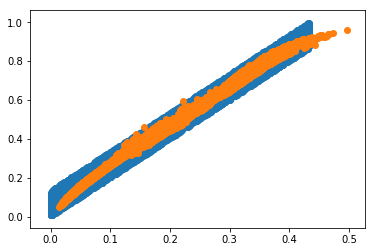

tensor(11.4552, grad_fn=<AddBackward0>)
X_sample tensor([[0.3327, 0.7180],
        [0.2759, 0.6214],
        [0.3376, 0.7514],
        ...,
        [0.0599, 0.1754],
        [0.3450, 0.7760],
        [0.1089, 0.3010]])


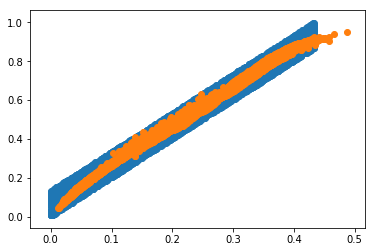

tensor(11.4237, grad_fn=<AddBackward0>)
X_sample tensor([[0.2098, 0.4862],
        [0.1508, 0.3795],
        [0.3288, 0.7142],
        ...,
        [0.3291, 0.7447],
        [0.3825, 0.8326],
        [0.3241, 0.7318]])


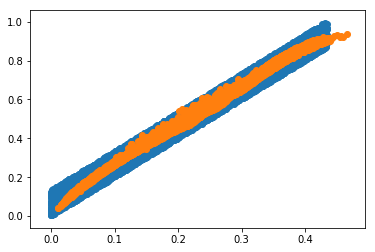

tensor(11.4254, grad_fn=<AddBackward0>)
X_sample tensor([[0.2963, 0.6397],
        [0.3383, 0.7423],
        [0.1178, 0.3149],
        ...,
        [0.3634, 0.7942],
        [0.2085, 0.4704],
        [0.0342, 0.1156]])


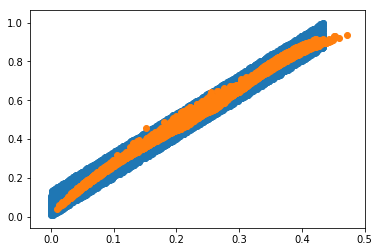

tensor(11.4435, grad_fn=<AddBackward0>)
X_sample tensor([[0.2385, 0.5207],
        [0.3293, 0.7269],
        [0.3671, 0.8046],
        ...,
        [0.2240, 0.5014],
        [0.3491, 0.7716],
        [0.1211, 0.3193]])


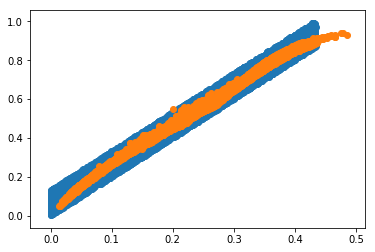

tensor(11.4486, grad_fn=<AddBackward0>)
X_sample tensor([[0.1783, 0.4296],
        [0.3477, 0.7457],
        [0.3068, 0.6710],
        ...,
        [0.4275, 0.8880],
        [0.1079, 0.2814],
        [0.4112, 0.8827]])


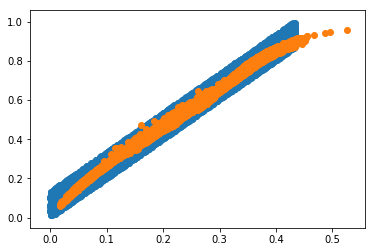

tensor(11.4228, grad_fn=<AddBackward0>)
X_sample tensor([[0.2074, 0.4716],
        [0.0304, 0.1042],
        [0.0574, 0.1764],
        ...,
        [0.2324, 0.5197],
        [0.0435, 0.1349],
        [0.0549, 0.1621]])


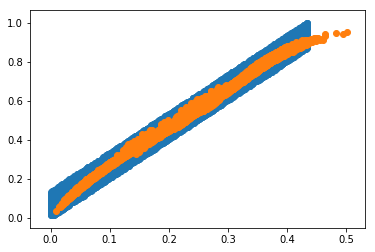

tensor(11.3922, grad_fn=<AddBackward0>)
X_sample tensor([[0.1717, 0.4219],
        [0.3895, 0.8391],
        [0.3915, 0.8392],
        ...,
        [0.1946, 0.4457],
        [0.1483, 0.3654],
        [0.1689, 0.4094]])


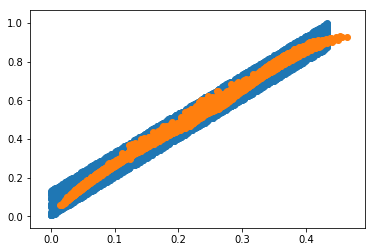

tensor(11.4674, grad_fn=<AddBackward0>)
X_sample tensor([[0.2252, 0.5151],
        [0.2855, 0.6437],
        [0.1837, 0.4238],
        ...,
        [0.0590, 0.1756],
        [0.3013, 0.6735],
        [0.3209, 0.7197]])


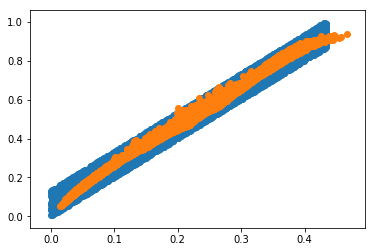

tensor(11.4396, grad_fn=<AddBackward0>)
X_sample tensor([[0.0674, 0.1942],
        [0.1923, 0.4614],
        [0.1750, 0.4644],
        ...,
        [0.3568, 0.8019],
        [0.3013, 0.6849],
        [0.3566, 0.8079]])


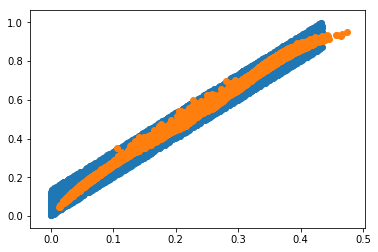

tensor(11.4491, grad_fn=<AddBackward0>)
X_sample tensor([[0.1019, 0.2750],
        [0.2474, 0.5597],
        [0.2825, 0.6400],
        ...,
        [0.3575, 0.7992],
        [0.3572, 0.8137],
        [0.2013, 0.4670]])


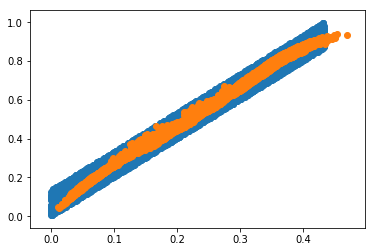

tensor(11.4022, grad_fn=<AddBackward0>)
X_sample tensor([[0.0951, 0.2568],
        [0.3738, 0.8231],
        [0.2965, 0.6728],
        ...,
        [0.0595, 0.1836],
        [0.3240, 0.7273],
        [0.2234, 0.4962]])


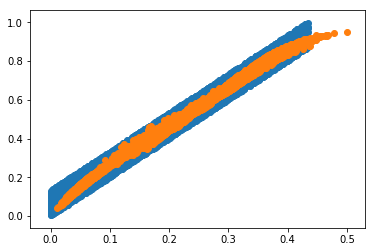

tensor(11.4046, grad_fn=<AddBackward0>)
X_sample tensor([[0.3540, 0.7841],
        [0.3621, 0.7983],
        [0.0702, 0.2111],
        ...,
        [0.1841, 0.4429],
        [0.3696, 0.8171],
        [0.3802, 0.8502]])


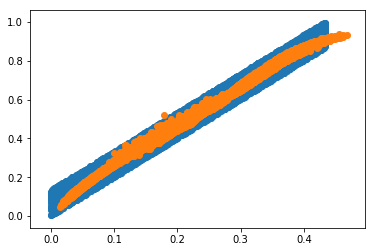

tensor(11.4056, grad_fn=<AddBackward0>)
X_sample tensor([[0.3782, 0.8299],
        [0.3531, 0.8004],
        [0.0945, 0.2614],
        ...,
        [0.2599, 0.5599],
        [0.1329, 0.3678],
        [0.3447, 0.7607]])


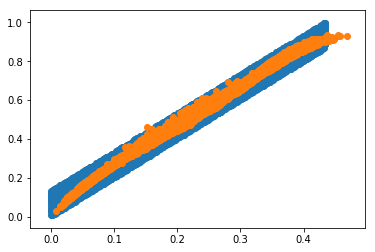

tensor(11.4187, grad_fn=<AddBackward0>)
X_sample tensor([[0.0307, 0.1015],
        [0.3239, 0.7151],
        [0.1857, 0.4274],
        ...,
        [0.2642, 0.5986],
        [0.2672, 0.5971],
        [0.1013, 0.2779]])


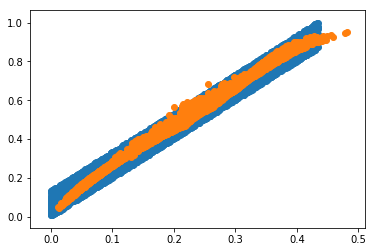

tensor(11.4238, grad_fn=<AddBackward0>)
X_sample tensor([[0.1007, 0.2652],
        [0.2471, 0.5453],
        [0.3555, 0.7725],
        ...,
        [0.1118, 0.3029],
        [0.3431, 0.7541],
        [0.1961, 0.4423]])


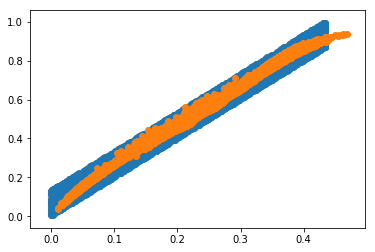

tensor(11.4590, grad_fn=<AddBackward0>)
X_sample tensor([[0.2924, 0.6489],
        [0.1811, 0.4197],
        [0.1280, 0.3338],
        ...,
        [0.1647, 0.3675],
        [0.1737, 0.4101],
        [0.3006, 0.6750]])


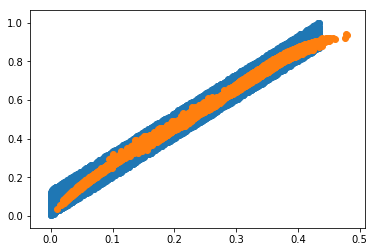

tensor(11.4292, grad_fn=<AddBackward0>)
X_sample tensor([[0.3156, 0.6977],
        [0.0848, 0.2411],
        [0.0818, 0.2353],
        ...,
        [0.0939, 0.2653],
        [0.3116, 0.6749],
        [0.3025, 0.6473]])


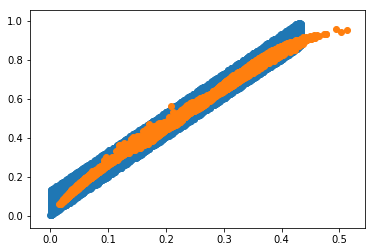

tensor(11.4775, grad_fn=<AddBackward0>)
X_sample tensor([[0.2966, 0.6563],
        [0.2032, 0.4723],
        [0.0409, 0.1294],
        ...,
        [0.3236, 0.7100],
        [0.2615, 0.5816],
        [0.0964, 0.2699]])


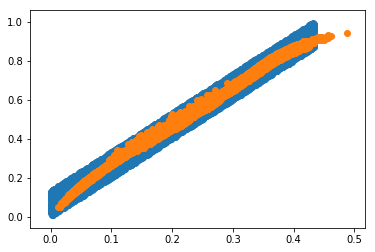

tensor(11.4369, grad_fn=<AddBackward0>)
X_sample tensor([[0.1221, 0.3225],
        [0.1156, 0.3123],
        [0.1801, 0.4274],
        ...,
        [0.3268, 0.7352],
        [0.1130, 0.3061],
        [0.1587, 0.3895]])


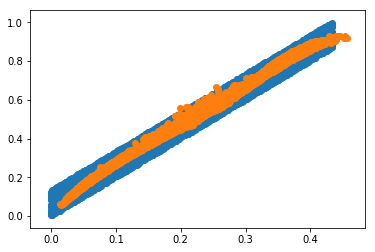

tensor(11.4169, grad_fn=<AddBackward0>)
X_sample tensor([[0.2934, 0.6539],
        [0.3519, 0.7873],
        [0.1514, 0.3755],
        ...,
        [0.0659, 0.1990],
        [0.3280, 0.7486],
        [0.3502, 0.7655]])


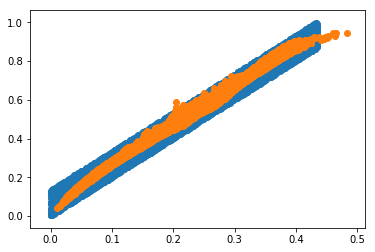

tensor(11.4315, grad_fn=<AddBackward0>)
X_sample tensor([[0.4028, 0.8562],
        [0.0758, 0.2218],
        [0.3554, 0.8044],
        ...,
        [0.3640, 0.8058],
        [0.0744, 0.2173],
        [0.2773, 0.6209]])


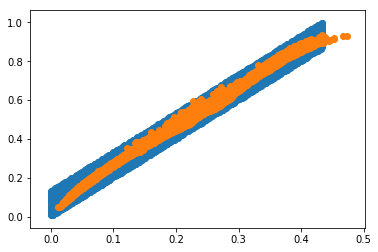

tensor(11.4181, grad_fn=<AddBackward0>)
X_sample tensor([[0.1358, 0.3384],
        [0.3098, 0.6724],
        [0.1150, 0.2996],
        ...,
        [0.3585, 0.8006],
        [0.3668, 0.8165],
        [0.3245, 0.7077]])


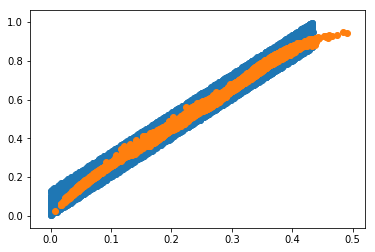

tensor(11.3962, grad_fn=<AddBackward0>)
X_sample tensor([[0.2495, 0.5861],
        [0.1133, 0.2967],
        [0.0763, 0.2073],
        ...,
        [0.2883, 0.6431],
        [0.2056, 0.4622],
        [0.2887, 0.6412]])


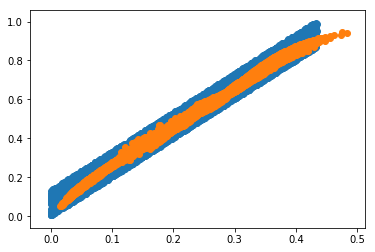

tensor(11.4288, grad_fn=<AddBackward0>)
X_sample tensor([[0.2479, 0.5563],
        [0.1434, 0.3579],
        [0.1727, 0.3850],
        ...,
        [0.3175, 0.6877],
        [0.2304, 0.5150],
        [0.0707, 0.2021]])


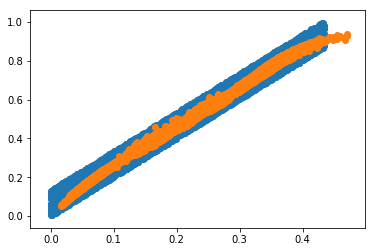

tensor(11.4408, grad_fn=<AddBackward0>)
X_sample tensor([[0.2911, 0.6561],
        [0.3411, 0.7659],
        [0.0478, 0.1471],
        ...,
        [0.3002, 0.6828],
        [0.2809, 0.6322],
        [0.3598, 0.7889]])


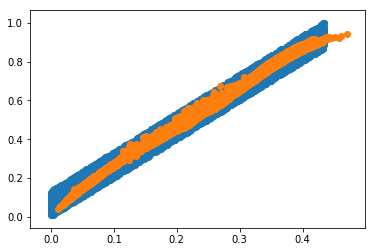

tensor(11.4214, grad_fn=<AddBackward0>)
X_sample tensor([[0.1980, 0.4620],
        [0.3529, 0.7995],
        [0.2274, 0.5274],
        ...,
        [0.2563, 0.5759],
        [0.2789, 0.6265],
        [0.2955, 0.6473]])


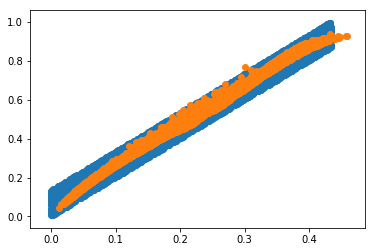

tensor(11.4209, grad_fn=<AddBackward0>)
X_sample tensor([[0.0792, 0.2276],
        [0.0878, 0.2503],
        [0.2484, 0.5857],
        ...,
        [0.2268, 0.5298],
        [0.0944, 0.2556],
        [0.2267, 0.5322]])


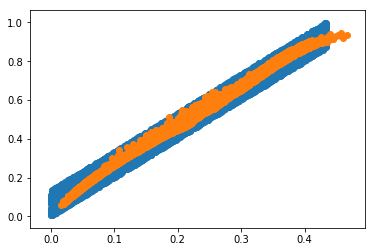

tensor(11.4423, grad_fn=<AddBackward0>)
X_sample tensor([[0.3621, 0.7812],
        [0.0880, 0.2401],
        [0.3806, 0.8455],
        ...,
        [0.0282, 0.0923],
        [0.1953, 0.4487],
        [0.2782, 0.6456]])


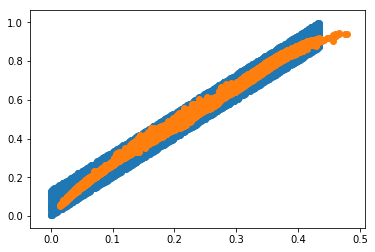

tensor(11.4394, grad_fn=<AddBackward0>)
X_sample tensor([[0.0826, 0.2392],
        [0.0355, 0.1205],
        [0.2233, 0.5026],
        ...,
        [0.2853, 0.6491],
        [0.2018, 0.4771],
        [0.1023, 0.2706]])


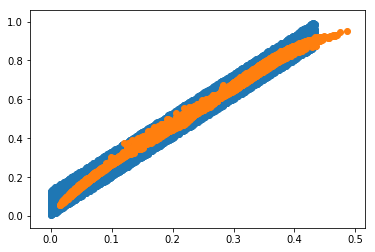

tensor(11.4569, grad_fn=<AddBackward0>)
X_sample tensor([[0.1598, 0.3817],
        [0.1540, 0.3704],
        [0.0360, 0.1190],
        ...,
        [0.3839, 0.8329],
        [0.1444, 0.3670],
        [0.3410, 0.7538]])


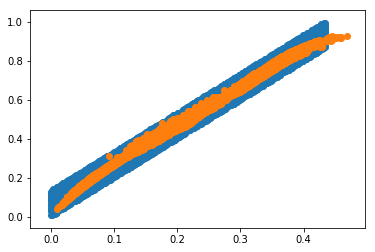

tensor(11.4260, grad_fn=<AddBackward0>)
X_sample tensor([[0.1503, 0.3638],
        [0.1756, 0.4012],
        [0.0687, 0.2145],
        ...,
        [0.3140, 0.6990],
        [0.3774, 0.8265],
        [0.0612, 0.1755]])


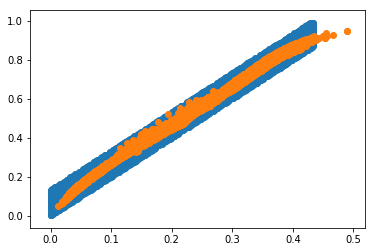

tensor(11.4166, grad_fn=<AddBackward0>)
X_sample tensor([[0.2234, 0.5049],
        [0.3823, 0.8423],
        [0.3662, 0.8082],
        ...,
        [0.2065, 0.4761],
        [0.0533, 0.1629],
        [0.3812, 0.8378]])


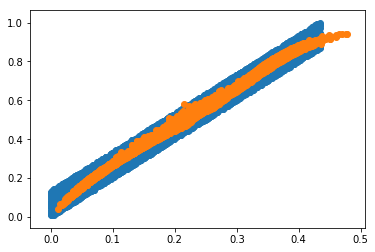

tensor(11.4562, grad_fn=<AddBackward0>)
X_sample tensor([[0.1651, 0.3966],
        [0.2589, 0.6468],
        [0.2582, 0.5917],
        ...,
        [0.2043, 0.4511],
        [0.2586, 0.5574],
        [0.0923, 0.2554]])


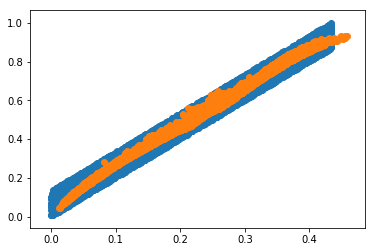

tensor(11.4234, grad_fn=<AddBackward0>)
X_sample tensor([[0.2492, 0.5796],
        [0.2992, 0.6666],
        [0.2379, 0.5240],
        ...,
        [0.0962, 0.2657],
        [0.2357, 0.5439],
        [0.2758, 0.6176]])


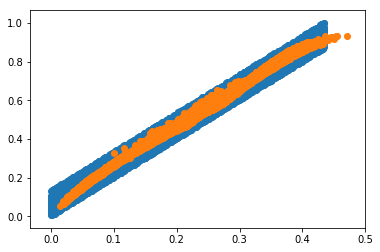

tensor(11.4579, grad_fn=<AddBackward0>)
X_sample tensor([[0.0553, 0.1647],
        [0.2947, 0.6507],
        [0.0672, 0.1865],
        ...,
        [0.2916, 0.6451],
        [0.3434, 0.7538],
        [0.1686, 0.4037]])


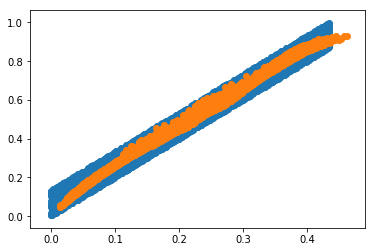

tensor(11.3977, grad_fn=<AddBackward0>)
X_sample tensor([[0.1557, 0.3713],
        [0.3195, 0.7151],
        [0.2428, 0.5454],
        ...,
        [0.1901, 0.4466],
        [0.1937, 0.4576],
        [0.1669, 0.4060]])


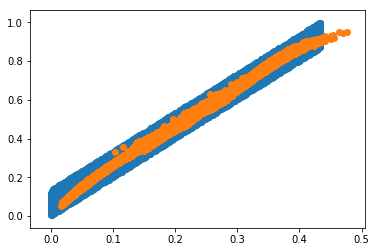

tensor(11.4565, grad_fn=<AddBackward0>)
X_sample tensor([[0.3456, 0.7814],
        [0.1989, 0.4485],
        [0.3543, 0.7902],
        ...,
        [0.0731, 0.2140],
        [0.2211, 0.4992],
        [0.2034, 0.4508]])


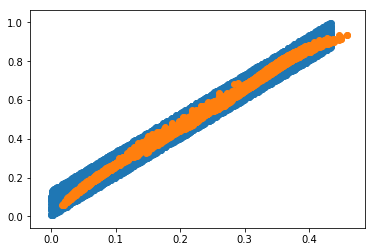

tensor(11.4364, grad_fn=<AddBackward0>)
X_sample tensor([[0.0887, 0.2456],
        [0.2200, 0.4927],
        [0.1153, 0.3035],
        ...,
        [0.3475, 0.7689],
        [0.0633, 0.1769],
        [0.3917, 0.8564]])


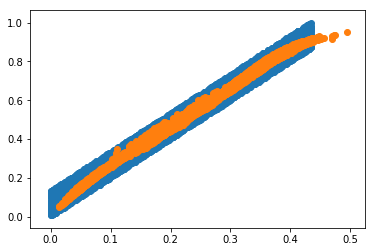

tensor(11.4770, grad_fn=<AddBackward0>)
X_sample tensor([[0.1626, 0.3818],
        [0.1620, 0.3761],
        [0.3479, 0.7615],
        ...,
        [0.3464, 0.7765],
        [0.3580, 0.7921],
        [0.1301, 0.3721]])


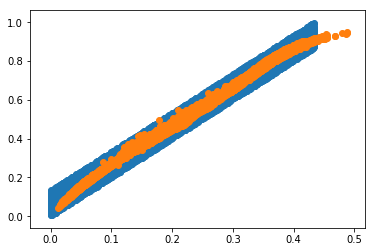

tensor(11.4529, grad_fn=<AddBackward0>)
X_sample tensor([[0.3836, 0.8394],
        [0.3118, 0.6956],
        [0.3121, 0.7144],
        ...,
        [0.3255, 0.7194],
        [0.2914, 0.6533],
        [0.2085, 0.4720]])


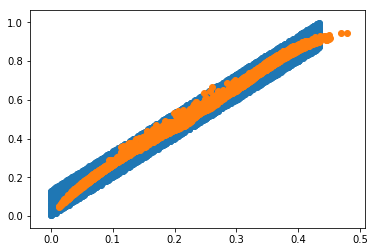

tensor(11.4541, grad_fn=<AddBackward0>)
X_sample tensor([[0.1174, 0.3161],
        [0.0450, 0.1511],
        [0.3361, 0.7608],
        ...,
        [0.1155, 0.3126],
        [0.3023, 0.6669],
        [0.0688, 0.2066]])


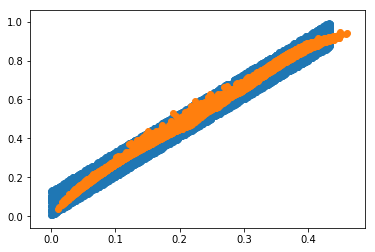

tensor(11.4300, grad_fn=<AddBackward0>)
X_sample tensor([[0.3560, 0.7873],
        [0.3466, 0.7532],
        [0.1361, 0.3460],
        ...,
        [0.3426, 0.7744],
        [0.3476, 0.7918],
        [0.3442, 0.7638]])


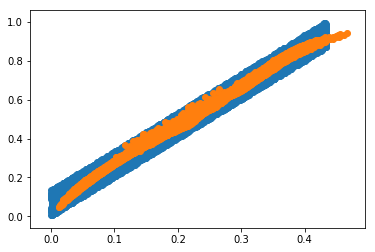

tensor(11.4477, grad_fn=<AddBackward0>)
X_sample tensor([[0.2948, 0.6489],
        [0.3745, 0.8366],
        [0.0441, 0.1439],
        ...,
        [0.2450, 0.5695],
        [0.1565, 0.3896],
        [0.2980, 0.6629]])


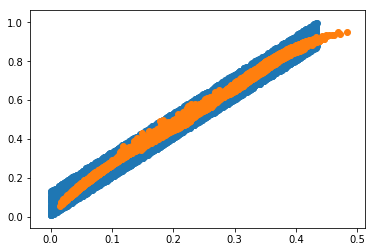

tensor(11.4177, grad_fn=<AddBackward0>)
X_sample tensor([[0.1616, 0.4153],
        [0.2880, 0.6367],
        [0.2976, 0.6419],
        ...,
        [0.3762, 0.8386],
        [0.3639, 0.7991],
        [0.1771, 0.4318]])


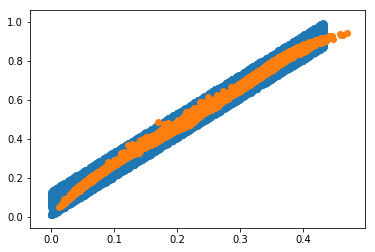

tensor(11.3909, grad_fn=<AddBackward0>)
X_sample tensor([[0.2018, 0.4741],
        [0.0662, 0.1875],
        [0.3221, 0.7086],
        ...,
        [0.3120, 0.6940],
        [0.2855, 0.6396],
        [0.2957, 0.6425]])


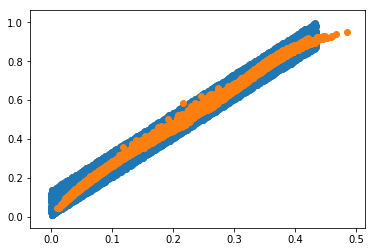

tensor(11.4050, grad_fn=<AddBackward0>)
X_sample tensor([[0.1422, 0.3622],
        [0.2939, 0.6386],
        [0.3287, 0.7122],
        ...,
        [0.1987, 0.4667],
        [0.2453, 0.5691],
        [0.0620, 0.1858]])


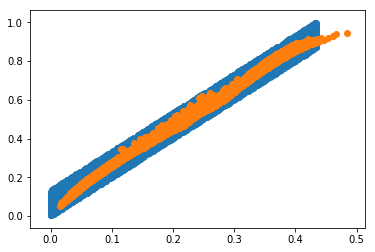

tensor(11.4432, grad_fn=<AddBackward0>)
X_sample tensor([[0.1304, 0.3299],
        [0.3030, 0.6491],
        [0.2811, 0.6318],
        ...,
        [0.0744, 0.2223],
        [0.1411, 0.3519],
        [0.3001, 0.6619]])


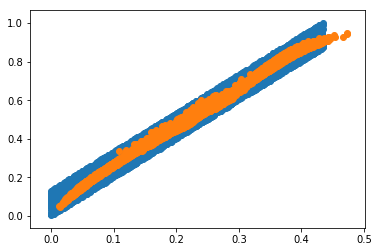

tensor(11.3846, grad_fn=<AddBackward0>)
X_sample tensor([[0.3477, 0.7609],
        [0.1326, 0.3267],
        [0.1501, 0.3710],
        ...,
        [0.1306, 0.3362],
        [0.3624, 0.7834],
        [0.2028, 0.4602]])


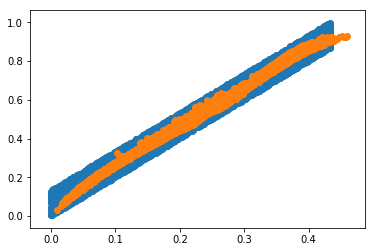

tensor(11.4403, grad_fn=<AddBackward0>)
X_sample tensor([[0.3458, 0.7672],
        [0.3955, 0.8512],
        [0.1437, 0.3591],
        ...,
        [0.3435, 0.7657],
        [0.3646, 0.8257],
        [0.2446, 0.5357]])


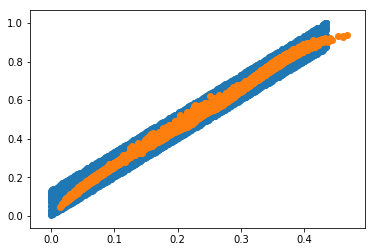

tensor(11.4474, grad_fn=<AddBackward0>)
X_sample tensor([[0.2615, 0.5756],
        [0.2222, 0.4990],
        [0.1432, 0.3557],
        ...,
        [0.1811, 0.4187],
        [0.1073, 0.2876],
        [0.3712, 0.8169]])


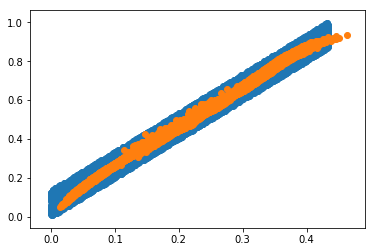

tensor(11.4292, grad_fn=<AddBackward0>)
X_sample tensor([[0.0816, 0.2332],
        [0.2398, 0.5543],
        [0.1170, 0.3055],
        ...,
        [0.1794, 0.4308],
        [0.0647, 0.1845],
        [0.1064, 0.2896]])


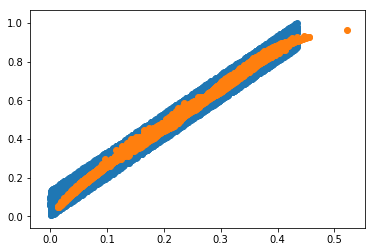

tensor(11.4435, grad_fn=<AddBackward0>)
X_sample tensor([[0.1451, 0.3549],
        [0.4066, 0.8759],
        [0.2908, 0.6350],
        ...,
        [0.3525, 0.7800],
        [0.2313, 0.5190],
        [0.3938, 0.8730]])


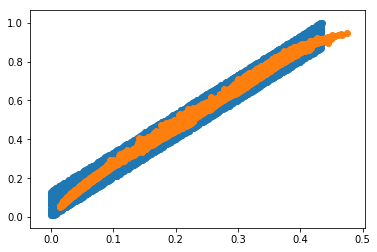

tensor(11.4534, grad_fn=<AddBackward0>)
X_sample tensor([[0.1391, 0.3529],
        [0.3587, 0.7890],
        [0.2853, 0.6523],
        ...,
        [0.3182, 0.7055],
        [0.2086, 0.4871],
        [0.2142, 0.5075]])


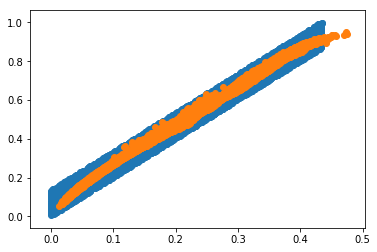

tensor(11.4510, grad_fn=<AddBackward0>)
X_sample tensor([[0.2758, 0.6325],
        [0.1276, 0.3277],
        [0.2329, 0.5487],
        ...,
        [0.1369, 0.3502],
        [0.3737, 0.8113],
        [0.3082, 0.6879]])


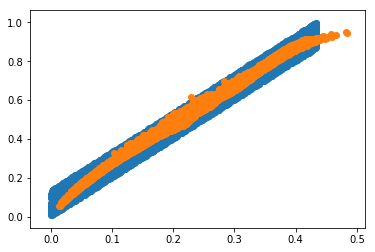

tensor(11.4883, grad_fn=<AddBackward0>)
X_sample tensor([[0.1298, 0.3483],
        [0.1075, 0.2953],
        [0.1792, 0.4339],
        ...,
        [0.1900, 0.4409],
        [0.3531, 0.7842],
        [0.0338, 0.1148]])


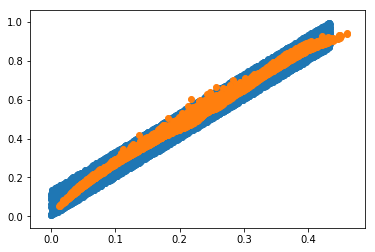

tensor(11.4425, grad_fn=<AddBackward0>)
X_sample tensor([[0.2963, 0.6567],
        [0.3784, 0.8137],
        [0.1396, 0.3476],
        ...,
        [0.0934, 0.2645],
        [0.3064, 0.6740],
        [0.3587, 0.7975]])


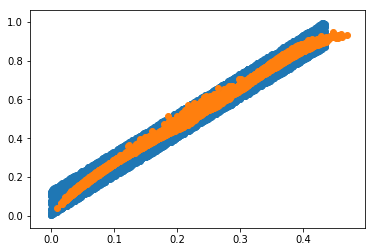

tensor(11.4164, grad_fn=<AddBackward0>)
X_sample tensor([[0.0963, 0.2656],
        [0.2660, 0.5889],
        [0.1872, 0.4253],
        ...,
        [0.3411, 0.7509],
        [0.0898, 0.2436],
        [0.3927, 0.8564]])


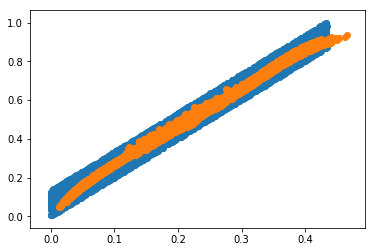

tensor(11.4033, grad_fn=<AddBackward0>)
X_sample tensor([[0.1576, 0.3813],
        [0.0754, 0.2107],
        [0.1608, 0.3799],
        ...,
        [0.1573, 0.3728],
        [0.1037, 0.2762],
        [0.1046, 0.2776]])


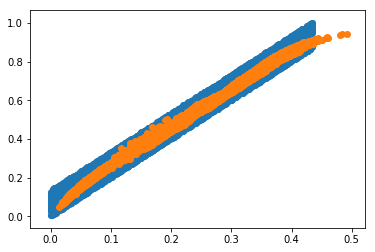

tensor(11.4243, grad_fn=<AddBackward0>)
X_sample tensor([[0.2551, 0.5827],
        [0.3494, 0.7803],
        [0.2757, 0.6110],
        ...,
        [0.3425, 0.7469],
        [0.1857, 0.4260],
        [0.2632, 0.5893]])


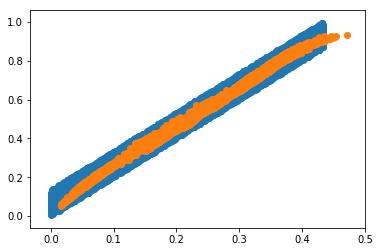

tensor(11.4047, grad_fn=<AddBackward0>)
X_sample tensor([[0.0654, 0.1880],
        [0.1051, 0.2760],
        [0.3027, 0.6868],
        ...,
        [0.1202, 0.3088],
        [0.1046, 0.2693],
        [0.3465, 0.7924]])


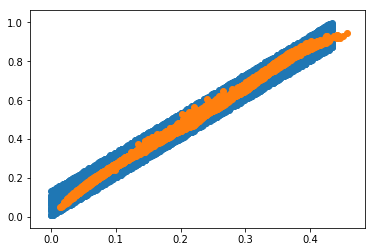

tensor(11.4309, grad_fn=<AddBackward0>)
X_sample tensor([[0.3479, 0.7809],
        [0.0792, 0.2229],
        [0.1705, 0.4028],
        ...,
        [0.0787, 0.2144],
        [0.3706, 0.8243],
        [0.1218, 0.3117]])


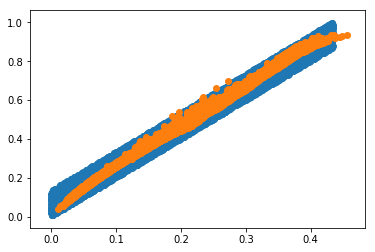

tensor(11.4261, grad_fn=<AddBackward0>)
X_sample tensor([[0.3239, 0.7186],
        [0.1933, 0.4381],
        [0.1340, 0.3310],
        ...,
        [0.3123, 0.6974],
        [0.3862, 0.8753],
        [0.2254, 0.4994]])


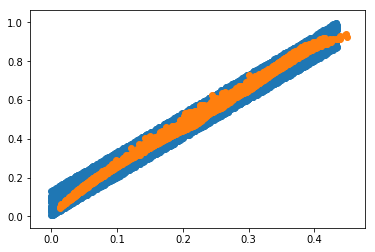

tensor(11.4383, grad_fn=<AddBackward0>)
X_sample tensor([[0.2897, 0.6602],
        [0.2391, 0.5357],
        [0.2679, 0.6022],
        ...,
        [0.3226, 0.7117],
        [0.3874, 0.8467],
        [0.1048, 0.2852]])


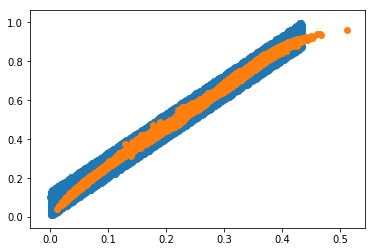

tensor(11.4749, grad_fn=<AddBackward0>)
X_sample tensor([[0.2242, 0.5035],
        [0.2643, 0.5873],
        [0.3320, 0.7384],
        ...,
        [0.1271, 0.3215],
        [0.0851, 0.2390],
        [0.2197, 0.4923]])


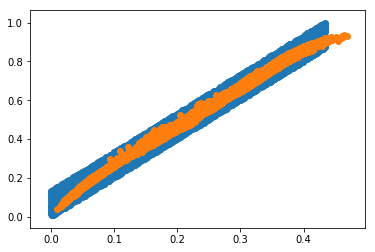

tensor(11.4566, grad_fn=<AddBackward0>)
X_sample tensor([[0.2491, 0.5478],
        [0.3551, 0.7832],
        [0.2165, 0.4918],
        ...,
        [0.2865, 0.6408],
        [0.3330, 0.7361],
        [0.0772, 0.2278]])


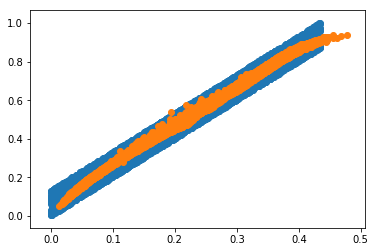

tensor(11.4363, grad_fn=<AddBackward0>)
X_sample tensor([[0.3084, 0.6707],
        [0.1822, 0.4278],
        [0.0430, 0.1394],
        ...,
        [0.2601, 0.6025],
        [0.1554, 0.3745],
        [0.1558, 0.3766]])


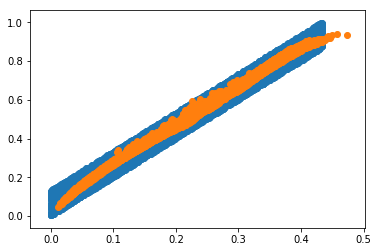

tensor(11.4537, grad_fn=<AddBackward0>)
X_sample tensor([[0.0885, 0.2925],
        [0.0867, 0.2406],
        [0.2941, 0.6588],
        ...,
        [0.3101, 0.6763],
        [0.1754, 0.4180],
        [0.1206, 0.3083]])


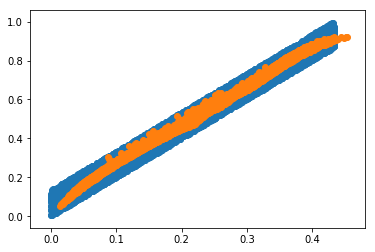

tensor(11.4325, grad_fn=<AddBackward0>)
X_sample tensor([[0.3671, 0.8131],
        [0.1051, 0.2880],
        [0.0963, 0.2616],
        ...,
        [0.0888, 0.2451],
        [0.1660, 0.4123],
        [0.0545, 0.1761]])


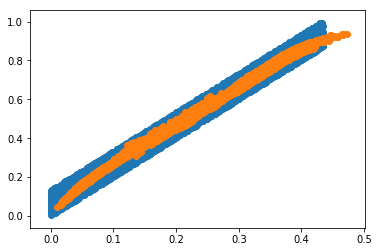

tensor(11.4098, grad_fn=<AddBackward0>)
X_sample tensor([[0.3902, 0.8532],
        [0.3114, 0.6861],
        [0.3227, 0.6890],
        ...,
        [0.0537, 0.1679],
        [0.0582, 0.1772],
        [0.3505, 0.7687]])


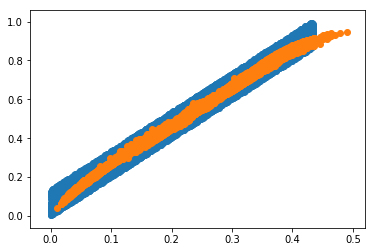

tensor(11.4186, grad_fn=<AddBackward0>)
X_sample tensor([[0.1035, 0.2815],
        [0.3368, 0.7440],
        [0.3075, 0.6713],
        ...,
        [0.3032, 0.6882],
        [0.2122, 0.4877],
        [0.4169, 0.8928]])


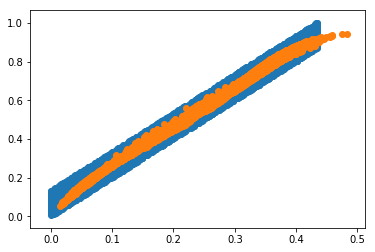

tensor(11.3788, grad_fn=<AddBackward0>)
X_sample tensor([[0.2013, 0.4546],
        [0.0277, 0.0941],
        [0.2469, 0.5574],
        ...,
        [0.0932, 0.2540],
        [0.1091, 0.2828],
        [0.3506, 0.7718]])


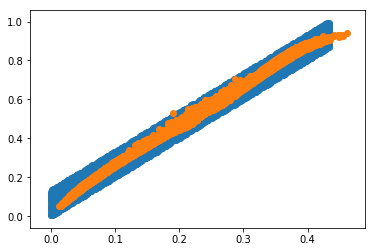

tensor(11.3923, grad_fn=<AddBackward0>)
X_sample tensor([[0.3305, 0.7415],
        [0.3840, 0.8707],
        [0.3633, 0.8176],
        ...,
        [0.0835, 0.2362],
        [0.3536, 0.8027],
        [0.0795, 0.2162]])


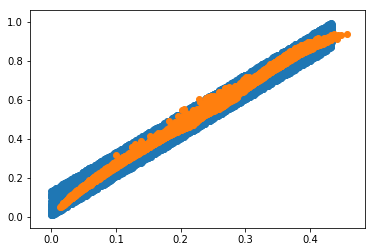

tensor(11.4496, grad_fn=<AddBackward0>)
X_sample tensor([[0.1106, 0.2920],
        [0.3687, 0.8318],
        [0.3409, 0.7563],
        ...,
        [0.3864, 0.8519],
        [0.1294, 0.3302],
        [0.1299, 0.3268]])


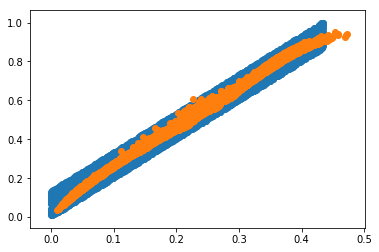

tensor(11.4109, grad_fn=<AddBackward0>)
X_sample tensor([[0.1740, 0.4080],
        [0.0938, 0.2483],
        [0.1012, 0.2729],
        ...,
        [0.2978, 0.6627],
        [0.3142, 0.7022],
        [0.3452, 0.7565]])


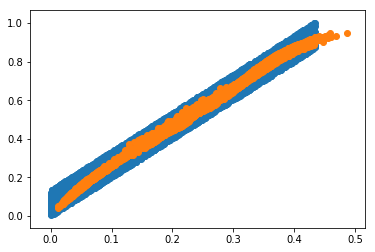

tensor(11.3836, grad_fn=<AddBackward0>)
X_sample tensor([[0.1330, 0.3355],
        [0.0544, 0.1768],
        [0.3056, 0.6617],
        ...,
        [0.2884, 0.6322],
        [0.3698, 0.8270],
        [0.2476, 0.5662]])


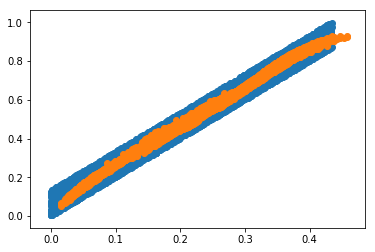

tensor(11.4370, grad_fn=<AddBackward0>)
X_sample tensor([[0.1096, 0.2912],
        [0.2513, 0.5663],
        [0.0886, 0.2580],
        ...,
        [0.1208, 0.3126],
        [0.3251, 0.7178],
        [0.3696, 0.8153]])


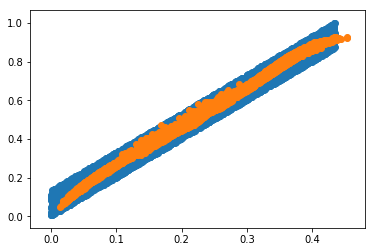

tensor(11.4232, grad_fn=<AddBackward0>)
X_sample tensor([[0.0990, 0.2691],
        [0.1911, 0.4592],
        [0.2711, 0.6054],
        ...,
        [0.0422, 0.1372],
        [0.3889, 0.8702],
        [0.1385, 0.3522]])


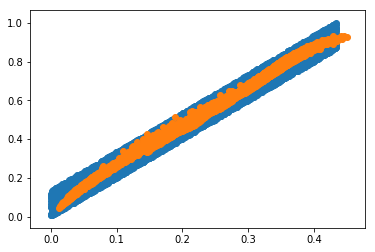

tensor(11.4186, grad_fn=<AddBackward0>)
X_sample tensor([[0.2429, 0.5446],
        [0.1390, 0.3507],
        [0.0559, 0.1727],
        ...,
        [0.1280, 0.3220],
        [0.1132, 0.2960],
        [0.4239, 0.8957]])


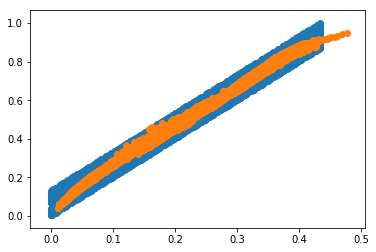

tensor(11.4538, grad_fn=<AddBackward0>)
X_sample tensor([[0.0723, 0.2101],
        [0.1617, 0.3977],
        [0.0371, 0.1198],
        ...,
        [0.3822, 0.8331],
        [0.1236, 0.3275],
        [0.3918, 0.8540]])


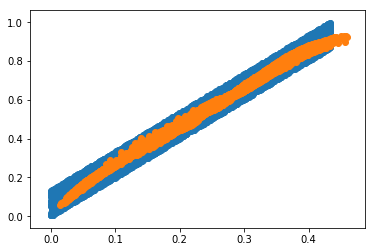

tensor(11.4323, grad_fn=<AddBackward0>)
X_sample tensor([[0.1963, 0.4710],
        [0.1789, 0.4174],
        [0.3181, 0.6916],
        ...,
        [0.2433, 0.5665],
        [0.1008, 0.2794],
        [0.3340, 0.7560]])


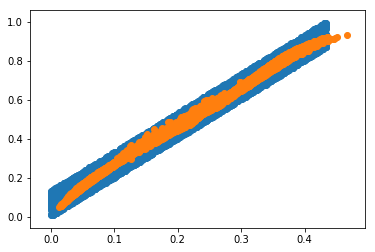

tensor(11.4578, grad_fn=<AddBackward0>)
X_sample tensor([[0.2571, 0.5745],
        [0.2149, 0.4961],
        [0.0828, 0.2378],
        ...,
        [0.0378, 0.1226],
        [0.0357, 0.1197],
        [0.3084, 0.6823]])


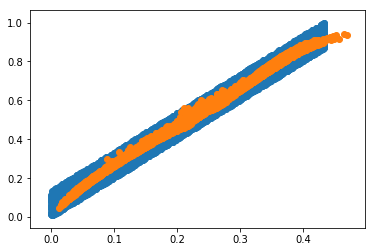

tensor(11.4615, grad_fn=<AddBackward0>)
X_sample tensor([[0.1929, 0.4580],
        [0.1829, 0.4298],
        [0.3481, 0.7694],
        ...,
        [0.2757, 0.5933],
        [0.3640, 0.7882],
        [0.3006, 0.6741]])


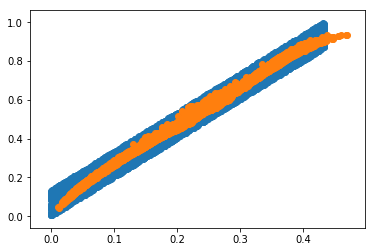

tensor(11.4274, grad_fn=<AddBackward0>)
X_sample tensor([[0.0556, 0.1712],
        [0.3828, 0.8311],
        [0.1112, 0.2942],
        ...,
        [0.1279, 0.3346],
        [0.0390, 0.1360],
        [0.3577, 0.7898]])


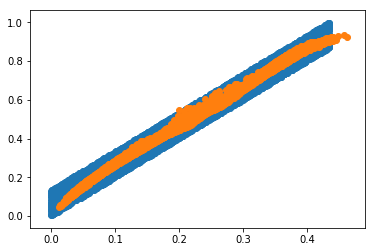

tensor(11.4365, grad_fn=<AddBackward0>)
X_sample tensor([[0.2978, 0.6655],
        [0.3146, 0.6987],
        [0.3588, 0.7964],
        ...,
        [0.2507, 0.5628],
        [0.2072, 0.5311],
        [0.2013, 0.4657]])


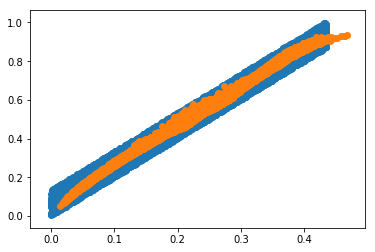

tensor(11.4126, grad_fn=<AddBackward0>)
X_sample tensor([[0.0549, 0.1749],
        [0.3003, 0.6643],
        [0.3572, 0.7858],
        ...,
        [0.2584, 0.5733],
        [0.1013, 0.2661],
        [0.3433, 0.7465]])


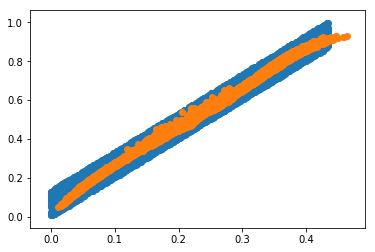

tensor(11.4093, grad_fn=<AddBackward0>)
X_sample tensor([[0.1236, 0.3091],
        [0.2638, 0.5882],
        [0.3893, 0.8418],
        ...,
        [0.3188, 0.7004],
        [0.0825, 0.2344],
        [0.0778, 0.2218]])


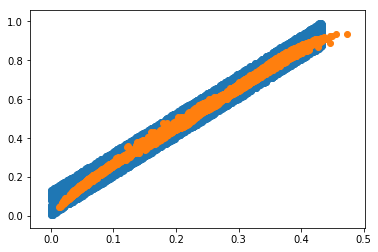

tensor(11.4070, grad_fn=<AddBackward0>)
X_sample tensor([[0.1386, 0.3460],
        [0.3889, 0.8583],
        [0.2047, 0.4664],
        ...,
        [0.2897, 0.6445],
        [0.1247, 0.3125],
        [0.1473, 0.3752]])


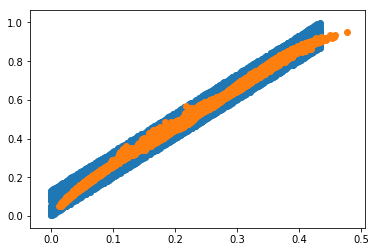

tensor(11.3988, grad_fn=<AddBackward0>)
X_sample tensor([[0.3871, 0.8394],
        [0.3156, 0.7185],
        [0.1880, 0.4287],
        ...,
        [0.2986, 0.6607],
        [0.1998, 0.4595],
        [0.2341, 0.5349]])


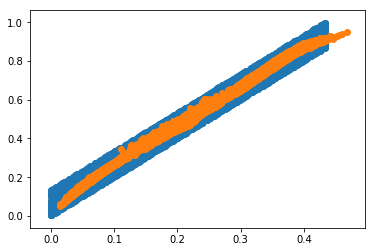

tensor(11.4706, grad_fn=<AddBackward0>)
X_sample tensor([[0.3278, 0.7453],
        [0.1904, 0.4389],
        [0.3736, 0.8375],
        ...,
        [0.0494, 0.1566],
        [0.3520, 0.8061],
        [0.3132, 0.6975]])


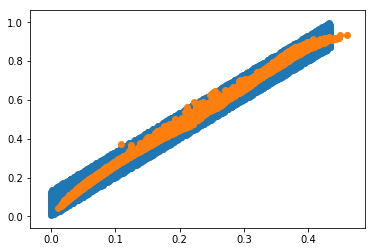

tensor(11.4435, grad_fn=<AddBackward0>)
X_sample tensor([[0.3762, 0.8637],
        [0.1813, 0.4223],
        [0.2033, 0.4600],
        ...,
        [0.1254, 0.3284],
        [0.2854, 0.6391],
        [0.1903, 0.4339]])


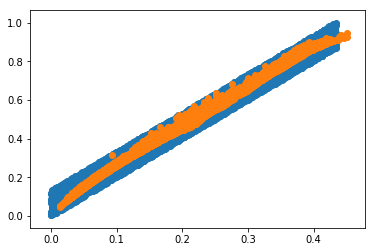

tensor(11.4484, grad_fn=<AddBackward0>)
X_sample tensor([[0.3525, 0.7933],
        [0.3187, 0.7054],
        [0.3103, 0.6841],
        ...,
        [0.0771, 0.2185],
        [0.3989, 0.8761],
        [0.0953, 0.2524]])


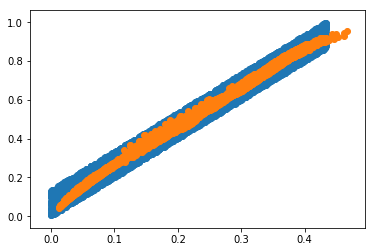

tensor(11.4176, grad_fn=<AddBackward0>)
X_sample tensor([[0.2568, 0.5616],
        [0.3232, 0.6877],
        [0.2841, 0.6428],
        ...,
        [0.2703, 0.6051],
        [0.2595, 0.5661],
        [0.3980, 0.8546]])


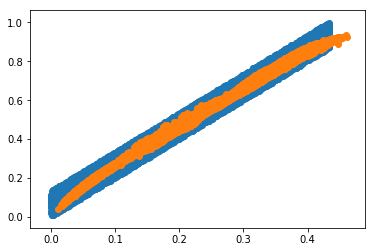

tensor(11.4503, grad_fn=<AddBackward0>)
X_sample tensor([[0.1322, 0.3408],
        [0.0754, 0.2255],
        [0.3773, 0.8007],
        ...,
        [0.2503, 0.5628],
        [0.2847, 0.6398],
        [0.3591, 0.7850]])


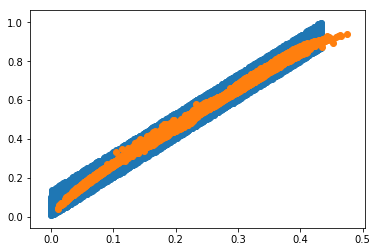

tensor(11.4516, grad_fn=<AddBackward0>)
X_sample tensor([[0.1570, 0.3752],
        [0.2759, 0.6104],
        [0.0984, 0.2728],
        ...,
        [0.3096, 0.6697],
        [0.2976, 0.6602],
        [0.1927, 0.4489]])


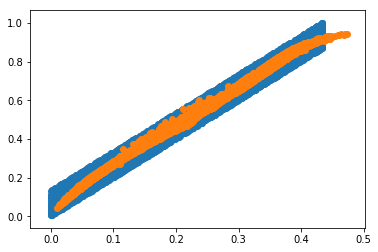

tensor(11.4267, grad_fn=<AddBackward0>)
X_sample tensor([[0.1947, 0.4700],
        [0.1927, 0.4603],
        [0.1476, 0.3573],
        ...,
        [0.3652, 0.8015],
        [0.3253, 0.7260],
        [0.1649, 0.3994]])


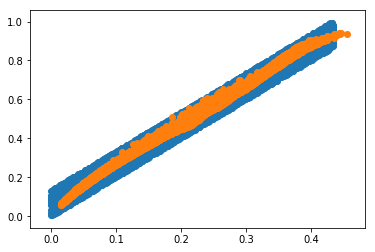

tensor(11.4280, grad_fn=<AddBackward0>)
X_sample tensor([[0.2029, 0.4503],
        [0.3649, 0.8207],
        [0.3559, 0.7929],
        ...,
        [0.2024, 0.4822],
        [0.1827, 0.4345],
        [0.2923, 0.6585]])


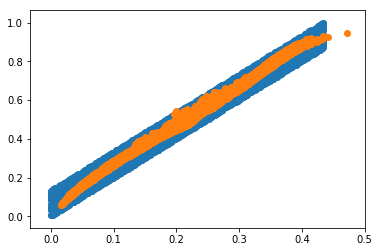

tensor(11.3802, grad_fn=<AddBackward0>)
X_sample tensor([[0.3361, 0.7514],
        [0.1990, 0.4614],
        [0.1678, 0.3909],
        ...,
        [0.0905, 0.2565],
        [0.2061, 0.4652],
        [0.3467, 0.7895]])


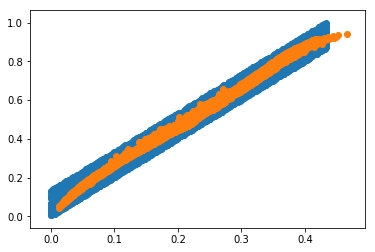

tensor(11.4145, grad_fn=<AddBackward0>)
X_sample tensor([[0.0779, 0.2203],
        [0.3771, 0.8413],
        [0.1268, 0.3241],
        ...,
        [0.3057, 0.6852],
        [0.3353, 0.7492],
        [0.0417, 0.1261]])


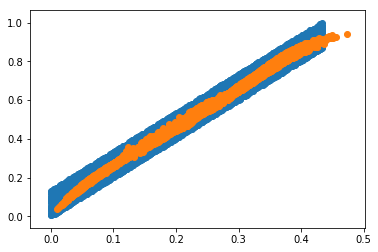

tensor(11.4636, grad_fn=<AddBackward0>)
X_sample tensor([[0.2325, 0.5279],
        [0.2212, 0.4895],
        [0.3011, 0.6745],
        ...,
        [0.1474, 0.3640],
        [0.2218, 0.5014],
        [0.2590, 0.5871]])


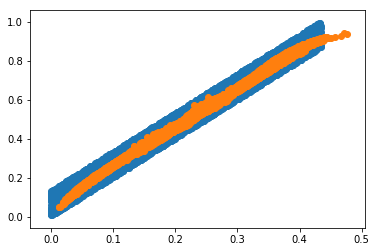

tensor(11.4092, grad_fn=<AddBackward0>)
X_sample tensor([[0.3583, 0.7995],
        [0.3578, 0.7956],
        [0.0693, 0.1974],
        ...,
        [0.3472, 0.7588],
        [0.0995, 0.2620],
        [0.2200, 0.4954]])


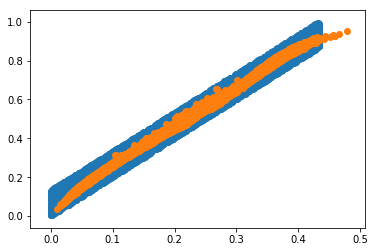

tensor(11.4149, grad_fn=<AddBackward0>)
X_sample tensor([[0.1993, 0.4693],
        [0.3399, 0.7405],
        [0.3059, 0.6764],
        ...,
        [0.2468, 0.5735],
        [0.1452, 0.3687],
        [0.1304, 0.3328]])


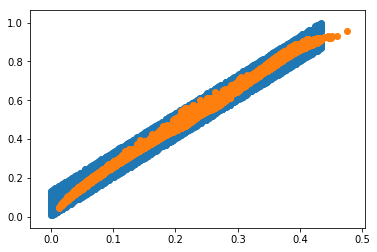

tensor(11.4468, grad_fn=<AddBackward0>)
X_sample tensor([[0.0992, 0.2728],
        [0.3589, 0.8218],
        [0.3535, 0.8004],
        ...,
        [0.0981, 0.2699],
        [0.0772, 0.2138],
        [0.3027, 0.6787]])


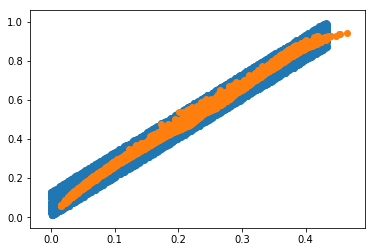

tensor(11.4077, grad_fn=<AddBackward0>)
X_sample tensor([[0.3566, 0.7862],
        [0.3435, 0.7686],
        [0.0807, 0.2240],
        ...,
        [0.1904, 0.4592],
        [0.2947, 0.6537],
        [0.3058, 0.6640]])


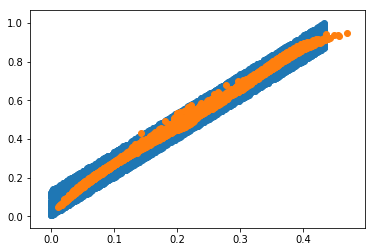

tensor(11.4247, grad_fn=<AddBackward0>)
X_sample tensor([[0.0640, 0.1871],
        [0.0834, 0.2400],
        [0.2299, 0.5169],
        ...,
        [0.1827, 0.4202],
        [0.0928, 0.2607],
        [0.0951, 0.2583]])


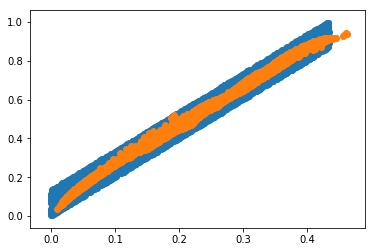

tensor(11.4250, grad_fn=<AddBackward0>)
X_sample tensor([[0.0926, 0.2659],
        [0.3287, 0.7227],
        [0.1962, 0.4448],
        ...,
        [0.2844, 0.6230],
        [0.3962, 0.8456],
        [0.3492, 0.7702]])


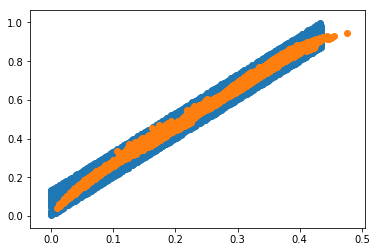

tensor(11.4416, grad_fn=<AddBackward0>)
X_sample tensor([[0.0921, 0.2576],
        [0.3757, 0.8265],
        [0.1448, 0.3638],
        ...,
        [0.3903, 0.8642],
        [0.1477, 0.3739],
        [0.3512, 0.7941]])


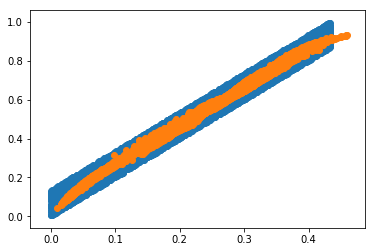

tensor(11.3953, grad_fn=<AddBackward0>)
X_sample tensor([[0.2196, 0.4923],
        [0.3608, 0.7836],
        [0.1085, 0.2863],
        ...,
        [0.2754, 0.6195],
        [0.1287, 0.3332],
        [0.1976, 0.4493]])


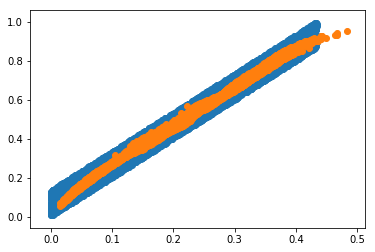

tensor(11.4681, grad_fn=<AddBackward0>)
X_sample tensor([[0.1996, 0.4636],
        [0.1593, 0.3896],
        [0.0892, 0.2446],
        ...,
        [0.1894, 0.4482],
        [0.1262, 0.3274],
        [0.1035, 0.2855]])


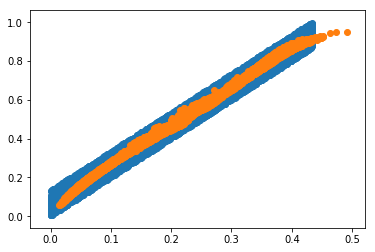

tensor(11.4633, grad_fn=<AddBackward0>)
X_sample tensor([[0.2888, 0.6254],
        [0.3599, 0.7793],
        [0.2962, 0.6766],
        ...,
        [0.1083, 0.2857],
        [0.2937, 0.6454],
        [0.1204, 0.3191]])


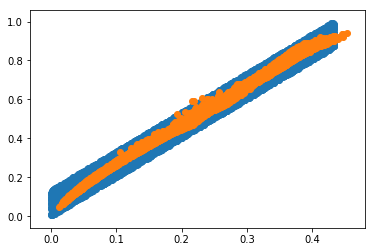

tensor(11.4422, grad_fn=<AddBackward0>)
X_sample tensor([[0.0784, 0.2283],
        [0.1516, 0.3777],
        [0.3699, 0.8313],
        ...,
        [0.1255, 0.3280],
        [0.3045, 0.6714],
        [0.1020, 0.2783]])


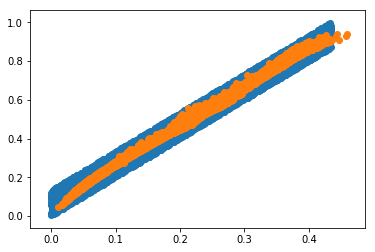

tensor(11.4694, grad_fn=<AddBackward0>)
X_sample tensor([[0.2859, 0.6386],
        [0.3413, 0.7514],
        [0.2577, 0.5710],
        ...,
        [0.2514, 0.5868],
        [0.3537, 0.7654],
        [0.1159, 0.2948]])


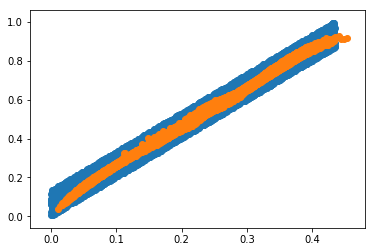

tensor(11.3991, grad_fn=<AddBackward0>)
X_sample tensor([[0.3241, 0.7049],
        [0.1623, 0.3803],
        [0.1847, 0.4301],
        ...,
        [0.3788, 0.8393],
        [0.3488, 0.7685],
        [0.0513, 0.1529]])


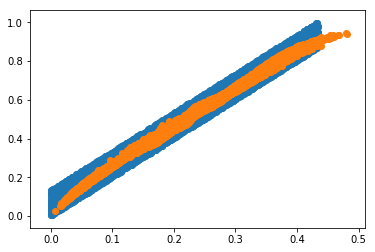

tensor(11.4526, grad_fn=<AddBackward0>)
X_sample tensor([[0.2993, 0.6569],
        [0.1219, 0.3099],
        [0.0873, 0.2399],
        ...,
        [0.3717, 0.8140],
        [0.1409, 0.3498],
        [0.1485, 0.3654]])


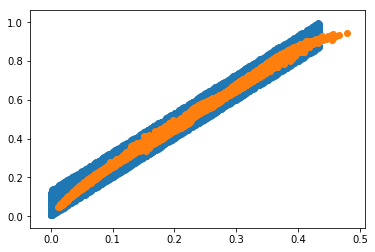

tensor(11.3991, grad_fn=<AddBackward0>)
X_sample tensor([[0.1972, 0.4502],
        [0.1580, 0.3944],
        [0.0709, 0.2033],
        ...,
        [0.1854, 0.4334],
        [0.3266, 0.7230],
        [0.2045, 0.4679]])


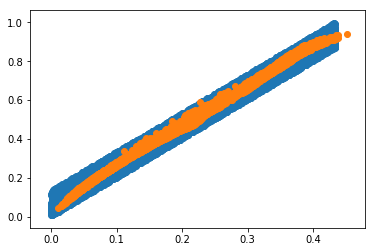

tensor(11.4390, grad_fn=<AddBackward0>)
X_sample tensor([[0.1286, 0.3339],
        [0.3287, 0.7252],
        [0.0758, 0.2186],
        ...,
        [0.2082, 0.4854],
        [0.3347, 0.7479],
        [0.2231, 0.5160]])


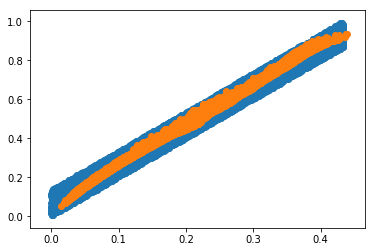

tensor(11.4473, grad_fn=<AddBackward0>)
X_sample tensor([[0.1329, 0.3469],
        [0.3962, 0.8685],
        [0.1205, 0.3075],
        ...,
        [0.2880, 0.6583],
        [0.2399, 0.5674],
        [0.0839, 0.2392]])


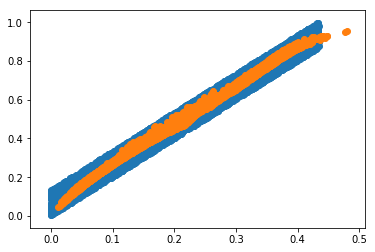

tensor(11.4326, grad_fn=<AddBackward0>)
X_sample tensor([[0.3499, 0.7736],
        [0.3935, 0.8676],
        [0.2594, 0.5798],
        ...,
        [0.3681, 0.8024],
        [0.3278, 0.7334],
        [0.1215, 0.3163]])


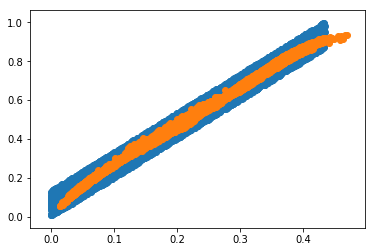

tensor(11.4471, grad_fn=<AddBackward0>)
X_sample tensor([[0.2679, 0.5961],
        [0.3800, 0.8222],
        [0.3452, 0.7509],
        ...,
        [0.3544, 0.7657],
        [0.3252, 0.7220],
        [0.3890, 0.8295]])


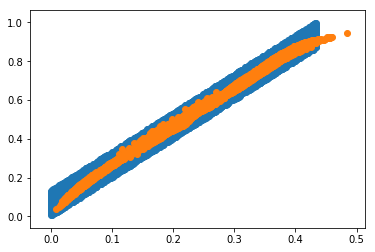

tensor(11.4209, grad_fn=<AddBackward0>)
X_sample tensor([[0.0494, 0.1515],
        [0.1961, 0.4644],
        [0.2818, 0.6221],
        ...,
        [0.3300, 0.7322],
        [0.3294, 0.7292],
        [0.3505, 0.7709]])


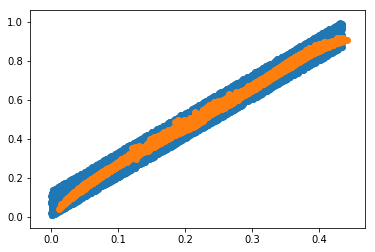

tensor(11.4448, grad_fn=<AddBackward0>)
X_sample tensor([[0.0763, 0.2114],
        [0.3242, 0.7108],
        [0.1959, 0.4419],
        ...,
        [0.1936, 0.4512],
        [0.0581, 0.1714],
        [0.1768, 0.4248]])


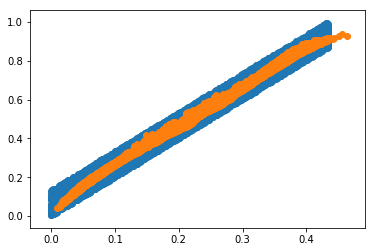

tensor(11.4231, grad_fn=<AddBackward0>)
X_sample tensor([[0.3517, 0.7586],
        [0.3035, 0.6822],
        [0.1929, 0.4379],
        ...,
        [0.0873, 0.2467],
        [0.0936, 0.2519],
        [0.3196, 0.7077]])


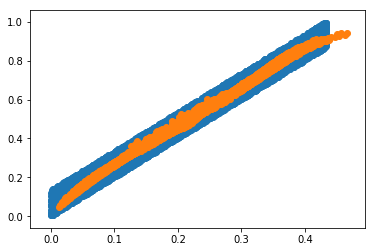

tensor(11.4026, grad_fn=<AddBackward0>)
X_sample tensor([[0.2686, 0.6016],
        [0.1706, 0.4256],
        [0.3468, 0.7632],
        ...,
        [0.1546, 0.3740],
        [0.3699, 0.8146],
        [0.0913, 0.2555]])


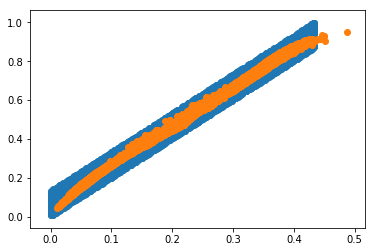

tensor(11.4491, grad_fn=<AddBackward0>)
X_sample tensor([[0.2070, 0.4592],
        [0.3421, 0.7616],
        [0.2018, 0.4618],
        ...,
        [0.2198, 0.4918],
        [0.1020, 0.2687],
        [0.2860, 0.6426]])


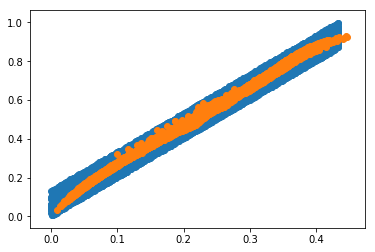

tensor(11.4528, grad_fn=<AddBackward0>)
X_sample tensor([[0.1787, 0.4201],
        [0.1472, 0.3726],
        [0.1670, 0.3923],
        ...,
        [0.1856, 0.4286],
        [0.2736, 0.6104],
        [0.1957, 0.4910]])


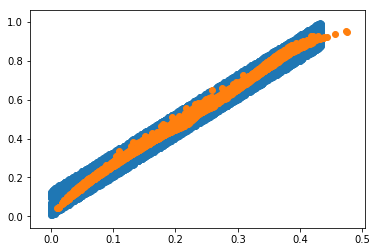

tensor(11.4376, grad_fn=<AddBackward0>)
X_sample tensor([[0.1620, 0.3861],
        [0.3710, 0.8215],
        [0.0996, 0.2622],
        ...,
        [0.1066, 0.2837],
        [0.3102, 0.6959],
        [0.3586, 0.7888]])


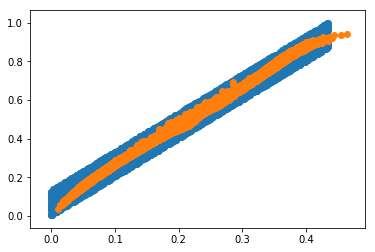

tensor(11.4058, grad_fn=<AddBackward0>)
X_sample tensor([[0.1656, 0.4023],
        [0.3169, 0.7015],
        [0.2667, 0.5936],
        ...,
        [0.1102, 0.2966],
        [0.2109, 0.4819],
        [0.3481, 0.7839]])


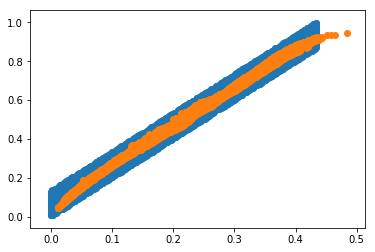

tensor(11.4246, grad_fn=<AddBackward0>)
X_sample tensor([[0.2934, 0.6618],
        [0.1446, 0.3519],
        [0.3232, 0.7143],
        ...,
        [0.2738, 0.5995],
        [0.3047, 0.6849],
        [0.2342, 0.5333]])


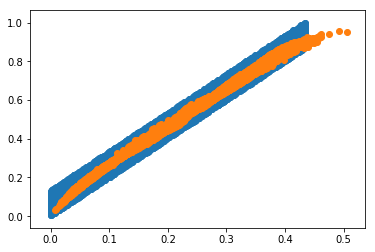

tensor(11.4430, grad_fn=<AddBackward0>)
X_sample tensor([[0.1194, 0.3166],
        [0.1342, 0.3422],
        [0.2894, 0.6335],
        ...,
        [0.3499, 0.7445],
        [0.3464, 0.7378],
        [0.0640, 0.1873]])


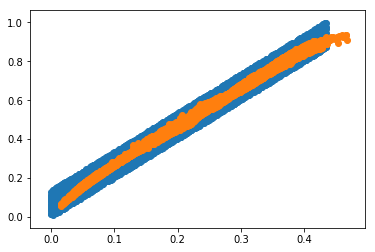

tensor(11.4186, grad_fn=<AddBackward0>)
X_sample tensor([[0.3229, 0.7062],
        [0.3123, 0.6994],
        [0.0715, 0.2029],
        ...,
        [0.0682, 0.2048],
        [0.3327, 0.7508],
        [0.1273, 0.3210]])


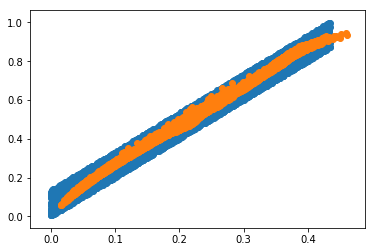

tensor(11.4342, grad_fn=<AddBackward0>)
X_sample tensor([[0.3096, 0.7152],
        [0.3191, 0.7114],
        [0.2782, 0.6651],
        ...,
        [0.0597, 0.1796],
        [0.2094, 0.4776],
        [0.0627, 0.1866]])


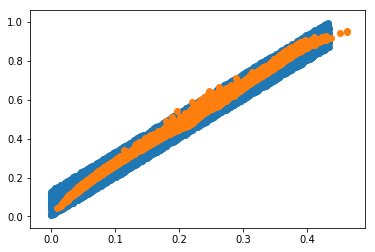

tensor(11.4273, grad_fn=<AddBackward0>)
X_sample tensor([[0.3441, 0.7708],
        [0.1532, 0.3906],
        [0.2991, 0.6544],
        ...,
        [0.1871, 0.4344],
        [0.3275, 0.7346],
        [0.3339, 0.7331]])


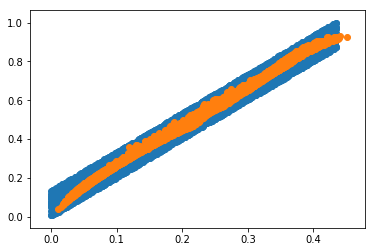

tensor(11.4555, grad_fn=<AddBackward0>)
X_sample tensor([[0.3292, 0.7069],
        [0.2634, 0.5814],
        [0.1617, 0.3974],
        ...,
        [0.1944, 0.4584],
        [0.1032, 0.2777],
        [0.2520, 0.5526]])


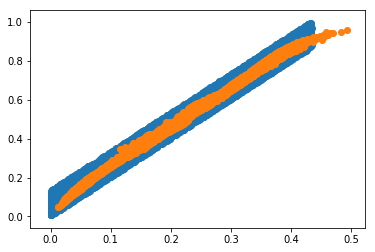

tensor(11.4232, grad_fn=<AddBackward0>)
X_sample tensor([[0.2882, 0.6432],
        [0.1000, 0.2645],
        [0.0922, 0.2432],
        ...,
        [0.3762, 0.8243],
        [0.1293, 0.3325],
        [0.2865, 0.6222]])


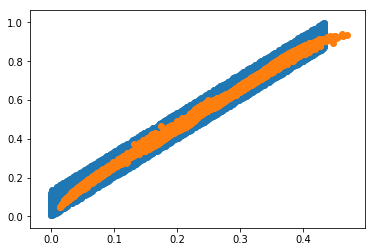

tensor(11.4208, grad_fn=<AddBackward0>)
X_sample tensor([[0.1395, 0.3420],
        [0.2194, 0.5006],
        [0.3377, 0.7320],
        ...,
        [0.3509, 0.7645],
        [0.3768, 0.8161],
        [0.2667, 0.5776]])


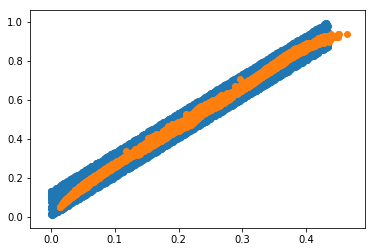

tensor(11.4148, grad_fn=<AddBackward0>)
X_sample tensor([[0.1201, 0.3155],
        [0.3416, 0.7560],
        [0.0521, 0.1703],
        ...,
        [0.1898, 0.4694],
        [0.1912, 0.4447],
        [0.1170, 0.3007]])


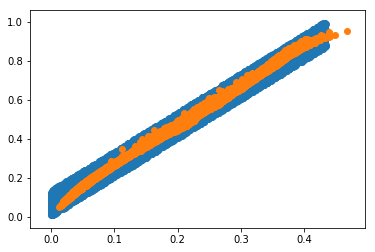

tensor(11.4344, grad_fn=<AddBackward0>)
X_sample tensor([[0.2534, 0.5789],
        [0.2647, 0.5948],
        [0.0816, 0.2224],
        ...,
        [0.1336, 0.3473],
        [0.0871, 0.2362],
        [0.0770, 0.2233]])


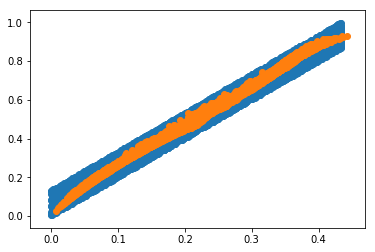

tensor(11.4308, grad_fn=<AddBackward0>)
X_sample tensor([[0.1749, 0.4145],
        [0.1867, 0.4290],
        [0.0722, 0.2133],
        ...,
        [0.2205, 0.4920],
        [0.0902, 0.2530],
        [0.3146, 0.6925]])


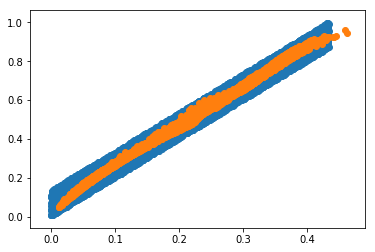

tensor(11.4396, grad_fn=<AddBackward0>)
X_sample tensor([[0.0352, 0.1206],
        [0.3261, 0.7280],
        [0.3564, 0.8058],
        ...,
        [0.0976, 0.2678],
        [0.2186, 0.5032],
        [0.2427, 0.5484]])


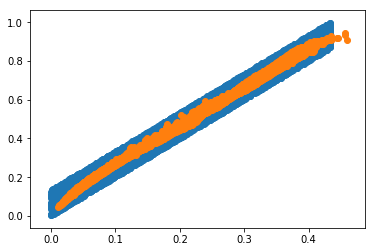

tensor(11.4835, grad_fn=<AddBackward0>)
X_sample tensor([[0.3574, 0.7899],
        [0.0943, 0.2529],
        [0.1334, 0.3332],
        ...,
        [0.1246, 0.3132],
        [0.3836, 0.8458],
        [0.2007, 0.4767]])


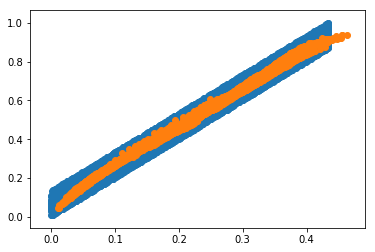

tensor(11.4395, grad_fn=<AddBackward0>)
X_sample tensor([[0.1315, 0.3432],
        [0.0784, 0.2267],
        [0.0501, 0.1551],
        ...,
        [0.3706, 0.8078],
        [0.0754, 0.2166],
        [0.2313, 0.5428]])


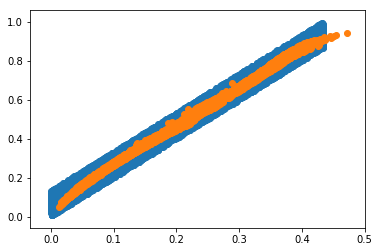

tensor(11.4136, grad_fn=<AddBackward0>)
X_sample tensor([[0.2461, 0.5426],
        [0.1571, 0.3811],
        [0.0777, 0.2179],
        ...,
        [0.1806, 0.4185],
        [0.0604, 0.1830],
        [0.3366, 0.7309]])


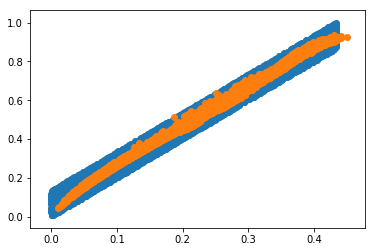

tensor(11.4603, grad_fn=<AddBackward0>)
X_sample tensor([[0.1311, 0.3256],
        [0.1311, 0.3624],
        [0.3378, 0.7590],
        ...,
        [0.3266, 0.7240],
        [0.2458, 0.5606],
        [0.1264, 0.3277]])


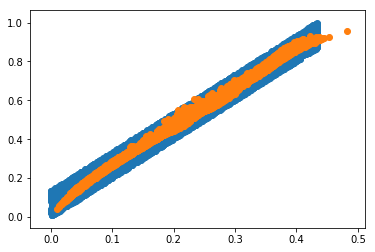

tensor(11.4221, grad_fn=<AddBackward0>)
X_sample tensor([[0.1779, 0.4301],
        [0.1864, 0.4513],
        [0.1103, 0.2845],
        ...,
        [0.1777, 0.4172],
        [0.0752, 0.2182],
        [0.2792, 0.6225]])


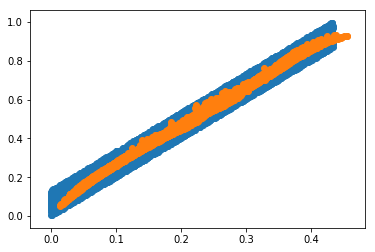

tensor(11.4154, grad_fn=<AddBackward0>)
X_sample tensor([[0.3396, 0.7562],
        [0.1556, 0.3801],
        [0.0503, 0.1475],
        ...,
        [0.2425, 0.5645],
        [0.3113, 0.6826],
        [0.1566, 0.3782]])


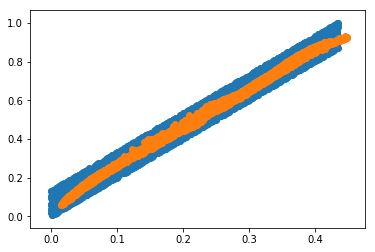

tensor(11.4356, grad_fn=<AddBackward0>)
X_sample tensor([[0.3568, 0.7606],
        [0.2495, 0.5686],
        [0.1284, 0.3453],
        ...,
        [0.3043, 0.6695],
        [0.1726, 0.4072],
        [0.1347, 0.3372]])


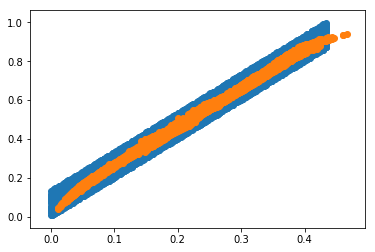

tensor(11.4328, grad_fn=<AddBackward0>)
X_sample tensor([[0.1425, 0.3602],
        [0.2913, 0.6535],
        [0.1491, 0.3624],
        ...,
        [0.3023, 0.6634],
        [0.1974, 0.4671],
        [0.3725, 0.8348]])


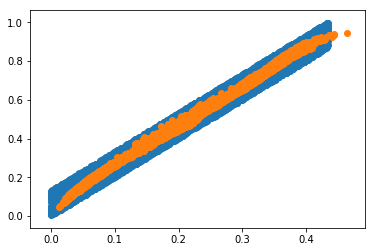

tensor(11.4388, grad_fn=<AddBackward0>)
X_sample tensor([[0.1659, 0.3984],
        [0.0369, 0.1230],
        [0.1346, 0.3362],
        ...,
        [0.0810, 0.2358],
        [0.3418, 0.7527],
        [0.0601, 0.1797]])


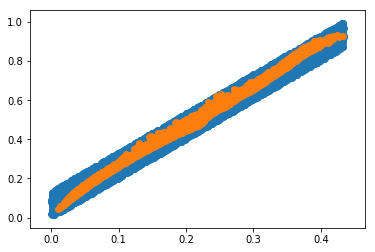

tensor(11.4420, grad_fn=<AddBackward0>)
X_sample tensor([[0.3613, 0.8157],
        [0.2944, 0.6507],
        [0.1234, 0.3229],
        ...,
        [0.1549, 0.3815],
        [0.2526, 0.5688],
        [0.0608, 0.1823]])


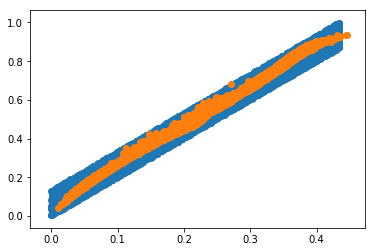

tensor(11.4439, grad_fn=<AddBackward0>)
X_sample tensor([[0.0637, 0.1898],
        [0.3140, 0.7013],
        [0.2020, 0.4585],
        ...,
        [0.2732, 0.6018],
        [0.2118, 0.4610],
        [0.2236, 0.4989]])


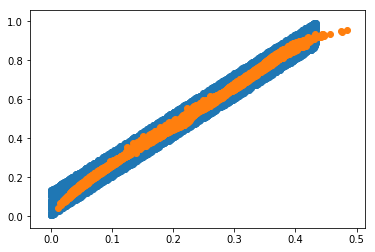

tensor(11.4057, grad_fn=<AddBackward0>)
X_sample tensor([[0.3239, 0.7071],
        [0.1759, 0.4258],
        [0.0834, 0.2323],
        ...,
        [0.1419, 0.3520],
        [0.3383, 0.7391],
        [0.2796, 0.6226]])


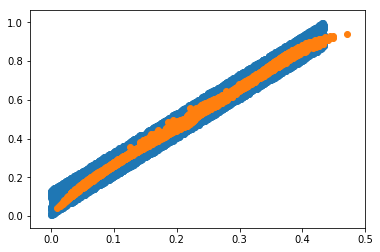

tensor(11.4182, grad_fn=<AddBackward0>)
X_sample tensor([[0.2156, 0.4988],
        [0.1845, 0.4295],
        [0.0560, 0.1624],
        ...,
        [0.0800, 0.2265],
        [0.1347, 0.3405],
        [0.1089, 0.2799]])


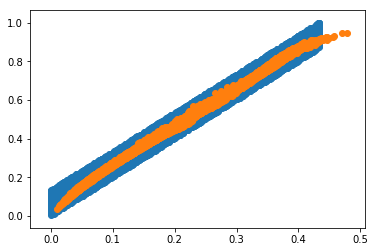

tensor(11.4247, grad_fn=<AddBackward0>)
X_sample tensor([[0.2966, 0.6634],
        [0.1551, 0.3931],
        [0.2797, 0.6254],
        ...,
        [0.3926, 0.8671],
        [0.3098, 0.6750],
        [0.3734, 0.8136]])


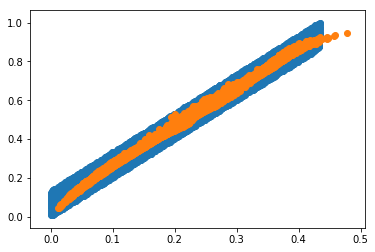

tensor(11.4089, grad_fn=<AddBackward0>)
X_sample tensor([[0.0724, 0.2098],
        [0.2822, 0.6418],
        [0.2182, 0.4895],
        ...,
        [0.1043, 0.2813],
        [0.2828, 0.6423],
        [0.0373, 0.1221]])


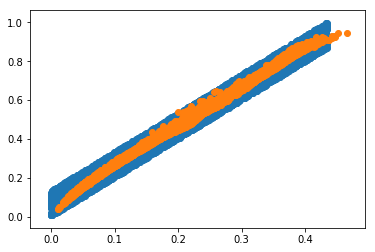

tensor(11.3945, grad_fn=<AddBackward0>)
X_sample tensor([[0.3710, 0.8130],
        [0.0993, 0.2619],
        [0.3410, 0.7576],
        ...,
        [0.3569, 0.8087],
        [0.1409, 0.3507],
        [0.2308, 0.5463]])


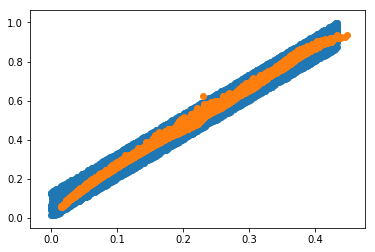

tensor(11.4224, grad_fn=<AddBackward0>)
X_sample tensor([[0.3327, 0.7204],
        [0.0579, 0.1773],
        [0.1257, 0.3211],
        ...,
        [0.1351, 0.3385],
        [0.2147, 0.4932],
        [0.3413, 0.7611]])


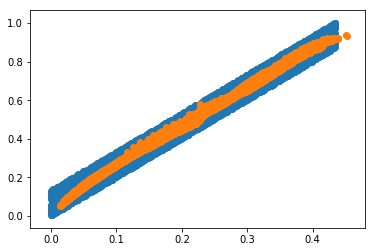

tensor(11.4290, grad_fn=<AddBackward0>)
X_sample tensor([[0.1366, 0.3461],
        [0.3726, 0.8373],
        [0.0570, 0.1706],
        ...,
        [0.3649, 0.7984],
        [0.3861, 0.8171],
        [0.3344, 0.7340]])


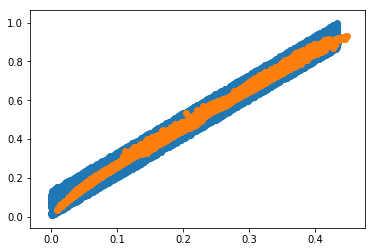

tensor(11.4771, grad_fn=<AddBackward0>)
X_sample tensor([[0.4328, 0.9007],
        [0.3947, 0.8534],
        [0.2751, 0.6209],
        ...,
        [0.1333, 0.3345],
        [0.1064, 0.2785],
        [0.2567, 0.5684]])


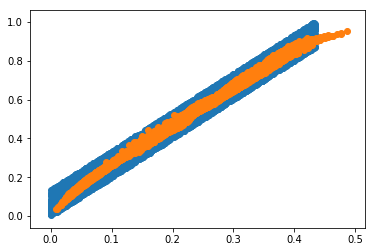

tensor(11.4074, grad_fn=<AddBackward0>)
X_sample tensor([[0.1681, 0.3982],
        [0.2771, 0.6236],
        [0.2520, 0.5872],
        ...,
        [0.0428, 0.1318],
        [0.0729, 0.2196],
        [0.0610, 0.1834]])


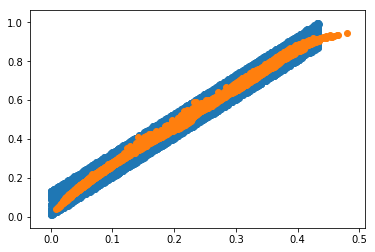

tensor(11.4744, grad_fn=<AddBackward0>)
X_sample tensor([[0.2370, 0.5369],
        [0.1943, 0.4676],
        [0.1057, 0.2772],
        ...,
        [0.3776, 0.8352],
        [0.1625, 0.3892],
        [0.3512, 0.7764]])


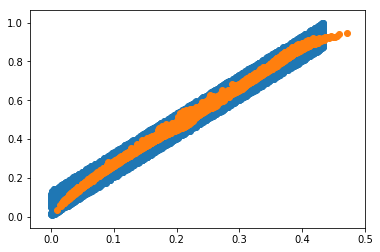

tensor(11.4614, grad_fn=<AddBackward0>)
X_sample tensor([[0.1771, 0.4150],
        [0.1834, 0.4369],
        [0.0955, 0.2585],
        ...,
        [0.2319, 0.5169],
        [0.0891, 0.2409],
        [0.1455, 0.3643]])


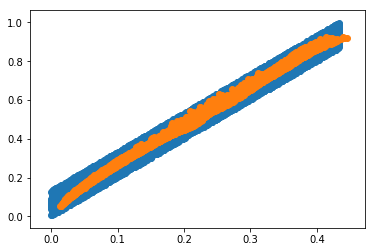

tensor(11.3980, grad_fn=<AddBackward0>)
X_sample tensor([[0.1159, 0.3102],
        [0.2727, 0.6208],
        [0.4073, 0.8800],
        ...,
        [0.0607, 0.1845],
        [0.3705, 0.8150],
        [0.3530, 0.7847]])


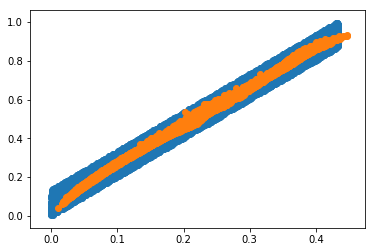

tensor(11.4026, grad_fn=<AddBackward0>)
X_sample tensor([[0.0542, 0.1760],
        [0.0444, 0.1402],
        [0.1837, 0.4375],
        ...,
        [0.0522, 0.1585],
        [0.0571, 0.1679],
        [0.1579, 0.3831]])


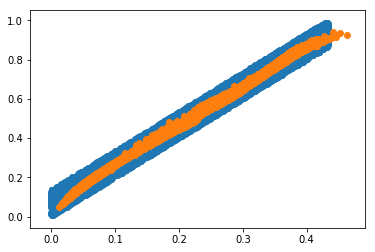

tensor(11.4395, grad_fn=<AddBackward0>)
X_sample tensor([[0.1143, 0.2943],
        [0.3770, 0.8204],
        [0.3538, 0.7690],
        ...,
        [0.3029, 0.6533],
        [0.2644, 0.5975],
        [0.0282, 0.0924]])


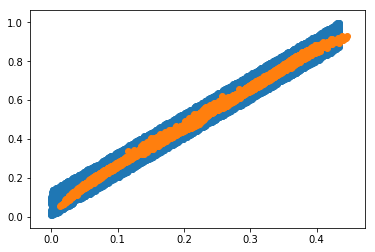

tensor(11.4137, grad_fn=<AddBackward0>)
X_sample tensor([[0.0949, 0.2615],
        [0.1384, 0.3478],
        [0.3737, 0.8151],
        ...,
        [0.3808, 0.8264],
        [0.2852, 0.6383],
        [0.1362, 0.3421]])


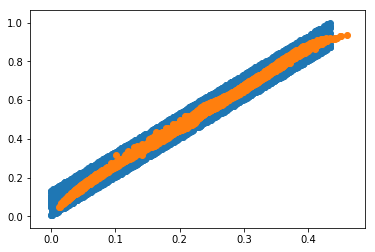

tensor(11.3953, grad_fn=<AddBackward0>)
X_sample tensor([[0.1290, 0.3223],
        [0.0874, 0.2345],
        [0.2454, 0.5548],
        ...,
        [0.1445, 0.3648],
        [0.1357, 0.3384],
        [0.2571, 0.5723]])


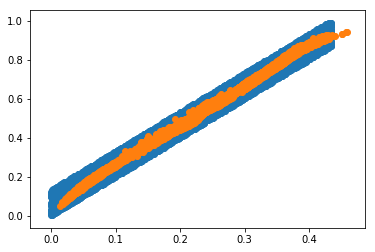

tensor(11.4367, grad_fn=<AddBackward0>)
X_sample tensor([[0.1433, 0.3465],
        [0.2578, 0.5845],
        [0.1563, 0.3794],
        ...,
        [0.0521, 0.1699],
        [0.1287, 0.3213],
        [0.3115, 0.6883]])


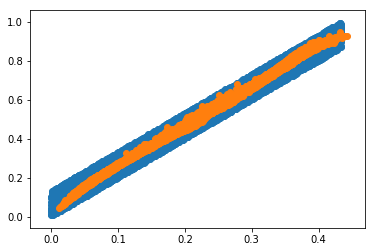

tensor(11.4160, grad_fn=<AddBackward0>)
X_sample tensor([[0.3087, 0.6843],
        [0.2810, 0.6320],
        [0.1682, 0.3968],
        ...,
        [0.0763, 0.2179],
        [0.1346, 0.3311],
        [0.3328, 0.7359]])


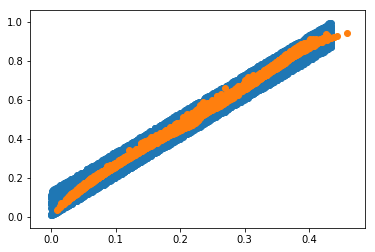

tensor(11.4253, grad_fn=<AddBackward0>)
X_sample tensor([[0.3043, 0.6870],
        [0.0529, 0.1603],
        [0.4271, 0.9085],
        ...,
        [0.2005, 0.4707],
        [0.0984, 0.2615],
        [0.3705, 0.8136]])


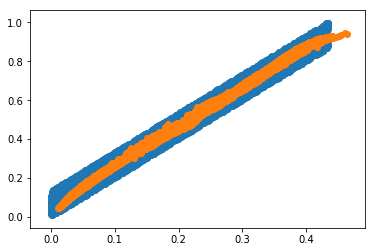

tensor(11.4356, grad_fn=<AddBackward0>)
X_sample tensor([[0.1158, 0.3035],
        [0.0897, 0.2400],
        [0.1977, 0.4529],
        ...,
        [0.2793, 0.6259],
        [0.3254, 0.7200],
        [0.1514, 0.3772]])


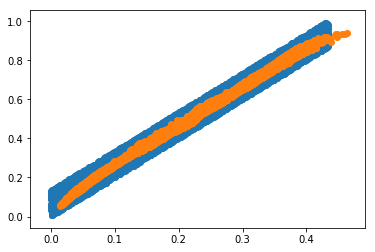

tensor(11.4351, grad_fn=<AddBackward0>)
X_sample tensor([[0.2952, 0.6436],
        [0.1504, 0.3730],
        [0.0854, 0.2403],
        ...,
        [0.1192, 0.3164],
        [0.2252, 0.5022],
        [0.3717, 0.8031]])


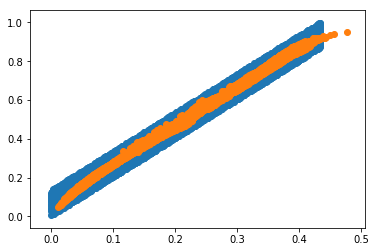

tensor(11.4562, grad_fn=<AddBackward0>)
X_sample tensor([[0.1133, 0.3056],
        [0.2499, 0.5837],
        [0.0982, 0.2650],
        ...,
        [0.3458, 0.7564],
        [0.2857, 0.6453],
        [0.2471, 0.5563]])


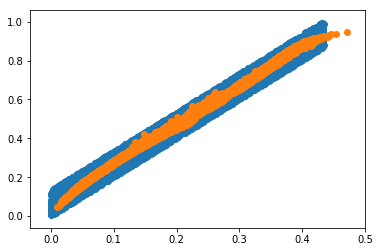

tensor(11.4033, grad_fn=<AddBackward0>)
X_sample tensor([[0.3369, 0.7469],
        [0.1517, 0.3801],
        [0.1305, 0.3292],
        ...,
        [0.0943, 0.2574],
        [0.1523, 0.3724],
        [0.3649, 0.8020]])


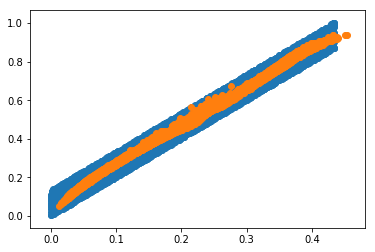

tensor(11.4222, grad_fn=<AddBackward0>)
X_sample tensor([[0.1802, 0.4223],
        [0.3444, 0.7593],
        [0.3298, 0.7264],
        ...,
        [0.3384, 0.7386],
        [0.3566, 0.7848],
        [0.3827, 0.8386]])


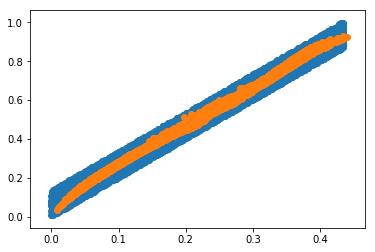

tensor(11.4172, grad_fn=<AddBackward0>)
X_sample tensor([[0.1554, 0.3794],
        [0.1269, 0.3154],
        [0.0560, 0.1751],
        ...,
        [0.2815, 0.6223],
        [0.1905, 0.4464],
        [0.2784, 0.6194]])


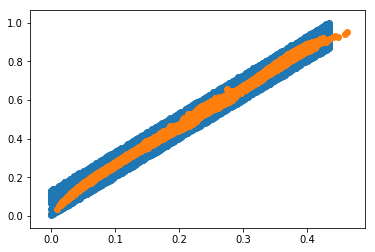

tensor(11.4343, grad_fn=<AddBackward0>)
X_sample tensor([[0.2759, 0.6142],
        [0.3419, 0.7448],
        [0.0849, 0.2369],
        ...,
        [0.1684, 0.3933],
        [0.0476, 0.1443],
        [0.0849, 0.2323]])


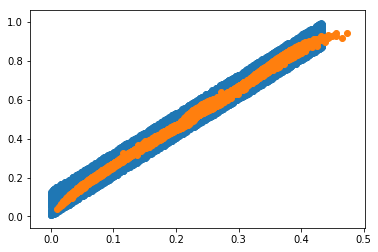

tensor(11.4777, grad_fn=<AddBackward0>)
X_sample tensor([[0.1053, 0.2806],
        [0.0879, 0.2398],
        [0.3094, 0.6893],
        ...,
        [0.1189, 0.3118],
        [0.0899, 0.2436],
        [0.0797, 0.2165]])


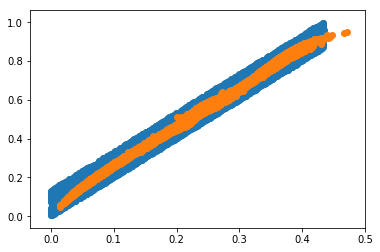

tensor(11.4179, grad_fn=<AddBackward0>)
X_sample tensor([[0.3825, 0.8576],
        [0.1393, 0.3489],
        [0.0439, 0.1374],
        ...,
        [0.0851, 0.2275],
        [0.2693, 0.6070],
        [0.3249, 0.7350]])


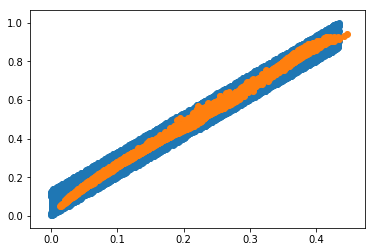

tensor(11.4204, grad_fn=<AddBackward0>)
X_sample tensor([[0.2154, 0.5212],
        [0.1616, 0.3858],
        [0.0584, 0.1755],
        ...,
        [0.0628, 0.1867],
        [0.3924, 0.8802],
        [0.3441, 0.7541]])


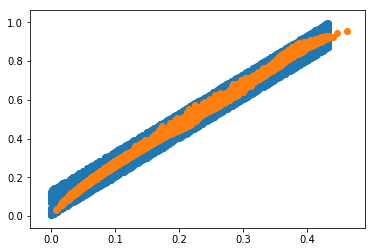

tensor(11.4296, grad_fn=<AddBackward0>)
X_sample tensor([[0.3652, 0.8044],
        [0.0646, 0.1942],
        [0.0757, 0.2176],
        ...,
        [0.2959, 0.6571],
        [0.1178, 0.3111],
        [0.3013, 0.6786]])


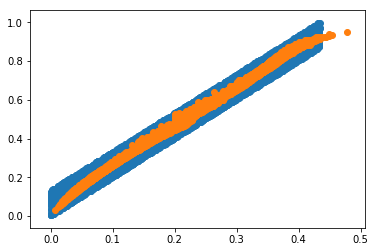

tensor(11.4372, grad_fn=<AddBackward0>)
X_sample tensor([[0.3673, 0.7871],
        [0.1578, 0.3865],
        [0.2728, 0.6122],
        ...,
        [0.0705, 0.2059],
        [0.1714, 0.4080],
        [0.0644, 0.1897]])


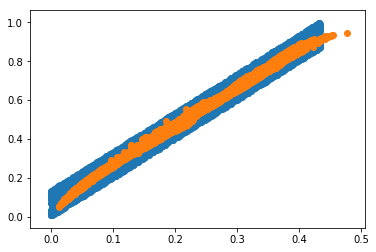

tensor(11.4524, grad_fn=<AddBackward0>)
X_sample tensor([[0.3844, 0.8175],
        [0.0606, 0.1790],
        [0.1588, 0.3763],
        ...,
        [0.4111, 0.8854],
        [0.3739, 0.7985],
        [0.3813, 0.8333]])


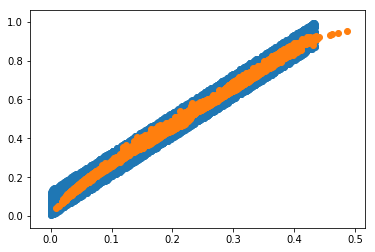

tensor(11.4391, grad_fn=<AddBackward0>)
X_sample tensor([[0.3452, 0.7666],
        [0.1866, 0.4337],
        [0.1079, 0.2835],
        ...,
        [0.1686, 0.3939],
        [0.0799, 0.2406],
        [0.2102, 0.4901]])


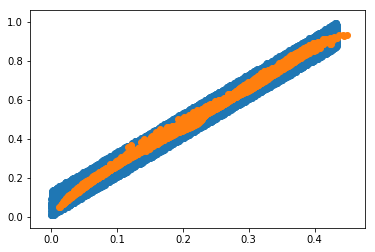

tensor(11.4648, grad_fn=<AddBackward0>)
X_sample tensor([[0.2232, 0.5119],
        [0.2925, 0.6518],
        [0.0852, 0.2412],
        ...,
        [0.3044, 0.6644],
        [0.1409, 0.3590],
        [0.2517, 0.5624]])


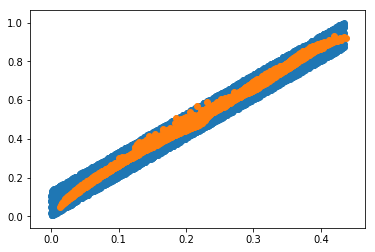

tensor(11.4430, grad_fn=<AddBackward0>)
X_sample tensor([[0.1903, 0.4812],
        [0.0612, 0.1840],
        [0.1548, 0.3855],
        ...,
        [0.1081, 0.2914],
        [0.3662, 0.7951],
        [0.1313, 0.3388]])


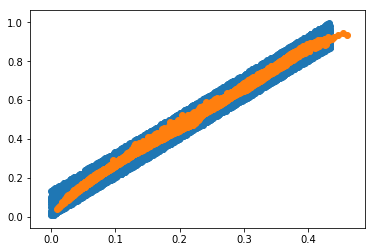

tensor(11.4211, grad_fn=<AddBackward0>)
X_sample tensor([[0.1339, 0.3340],
        [0.3316, 0.7285],
        [0.1510, 0.3648],
        ...,
        [0.0854, 0.2340],
        [0.1089, 0.2890],
        [0.2948, 0.6499]])


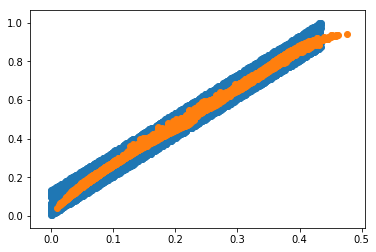

tensor(11.3838, grad_fn=<AddBackward0>)
X_sample tensor([[0.1655, 0.3976],
        [0.3232, 0.7125],
        [0.1329, 0.3264],
        ...,
        [0.1214, 0.3202],
        [0.2804, 0.6350],
        [0.3378, 0.7558]])


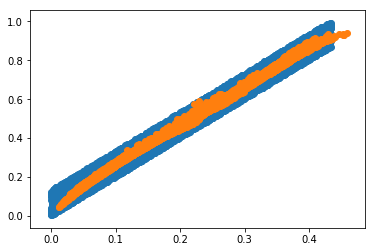

tensor(11.3996, grad_fn=<AddBackward0>)
X_sample tensor([[0.0593, 0.1779],
        [0.2137, 0.4903],
        [0.2537, 0.5863],
        ...,
        [0.3237, 0.7164],
        [0.2317, 0.5383],
        [0.1771, 0.4220]])


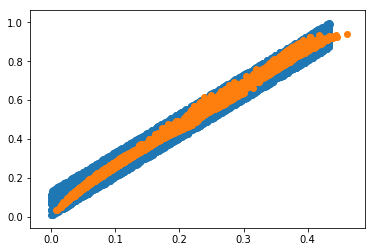

tensor(11.4093, grad_fn=<AddBackward0>)
X_sample tensor([[0.1092, 0.2876],
        [0.0971, 0.2570],
        [0.2332, 0.5301],
        ...,
        [0.3127, 0.6893],
        [0.3726, 0.8064],
        [0.3074, 0.6944]])


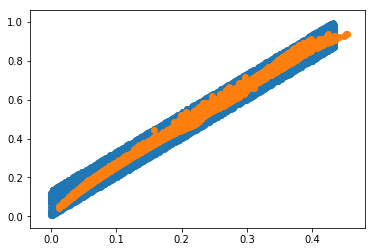

tensor(11.4445, grad_fn=<AddBackward0>)
X_sample tensor([[0.4249, 0.9157],
        [0.2353, 0.5225],
        [0.0647, 0.1871],
        ...,
        [0.2190, 0.4928],
        [0.3653, 0.7978],
        [0.2432, 0.5655]])


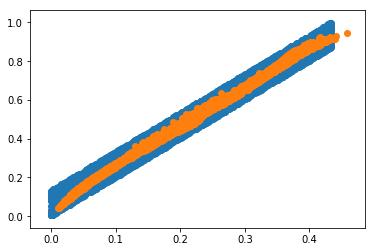

tensor(11.4279, grad_fn=<AddBackward0>)
X_sample tensor([[0.3287, 0.7188],
        [0.3667, 0.8122],
        [0.1623, 0.3964],
        ...,
        [0.0441, 0.1403],
        [0.1336, 0.3311],
        [0.3671, 0.7935]])


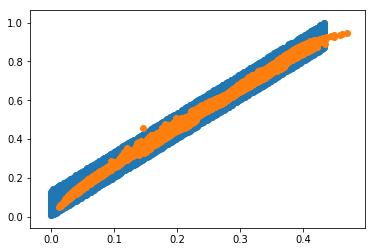

tensor(11.4116, grad_fn=<AddBackward0>)
X_sample tensor([[0.3311, 0.7245],
        [0.1307, 0.3405],
        [0.1910, 0.4300],
        ...,
        [0.3283, 0.7205],
        [0.3197, 0.7255],
        [0.1088, 0.2894]])


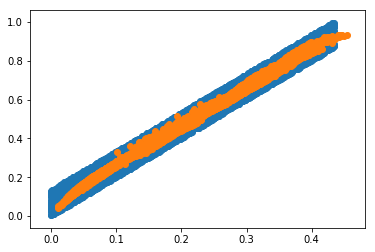

tensor(11.4297, grad_fn=<AddBackward0>)
X_sample tensor([[0.0313, 0.1107],
        [0.1730, 0.4191],
        [0.3262, 0.7213],
        ...,
        [0.0876, 0.2480],
        [0.3489, 0.7885],
        [0.4023, 0.8955]])


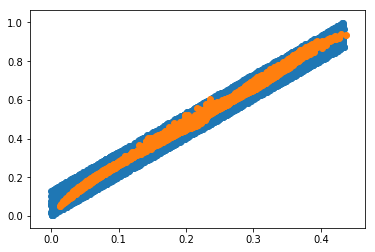

tensor(11.4534, grad_fn=<AddBackward0>)
X_sample tensor([[0.2569, 0.5775],
        [0.1005, 0.2795],
        [0.2204, 0.4999],
        ...,
        [0.0866, 0.2403],
        [0.3371, 0.7582],
        [0.0489, 0.1584]])


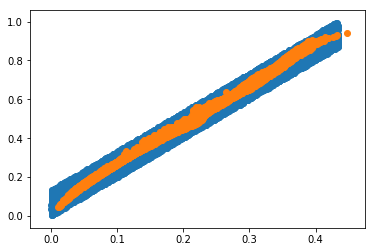

tensor(11.4230, grad_fn=<AddBackward0>)
X_sample tensor([[0.0781, 0.2296],
        [0.1361, 0.3406],
        [0.0876, 0.2500],
        ...,
        [0.0796, 0.2290],
        [0.0397, 0.1342],
        [0.3541, 0.7730]])


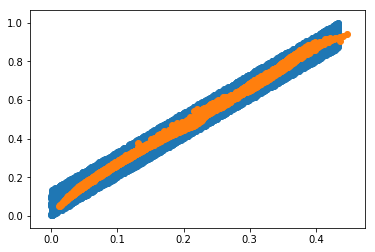

tensor(11.4059, grad_fn=<AddBackward0>)
X_sample tensor([[0.2005, 0.4697],
        [0.3629, 0.7819],
        [0.3332, 0.7208],
        ...,
        [0.2812, 0.6228],
        [0.2183, 0.4954],
        [0.3880, 0.8347]])


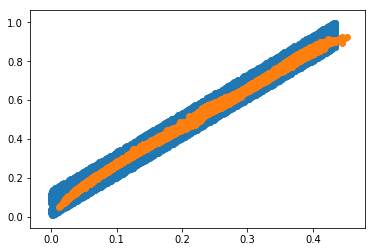

tensor(11.4169, grad_fn=<AddBackward0>)
X_sample tensor([[0.3981, 0.8461],
        [0.2652, 0.5936],
        [0.1617, 0.3967],
        ...,
        [0.1517, 0.3852],
        [0.1829, 0.4335],
        [0.0476, 0.1504]])


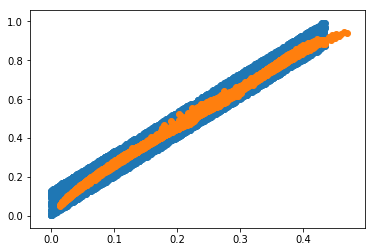

tensor(11.4099, grad_fn=<AddBackward0>)
X_sample tensor([[0.2989, 0.6637],
        [0.1476, 0.3683],
        [0.0371, 0.1251],
        ...,
        [0.3582, 0.7683],
        [0.1452, 0.3579],
        [0.3196, 0.6937]])


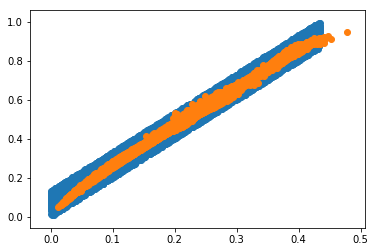

tensor(11.4488, grad_fn=<AddBackward0>)
X_sample tensor([[0.1265, 0.3237],
        [0.1135, 0.2939],
        [0.2146, 0.4897],
        ...,
        [0.3764, 0.8302],
        [0.0631, 0.1883],
        [0.1841, 0.4498]])


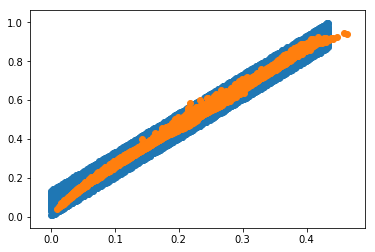

tensor(11.4304, grad_fn=<AddBackward0>)
X_sample tensor([[0.1323, 0.3348],
        [0.2901, 0.6515],
        [0.0955, 0.2499],
        ...,
        [0.3129, 0.6992],
        [0.1154, 0.2990],
        [0.1994, 0.4698]])


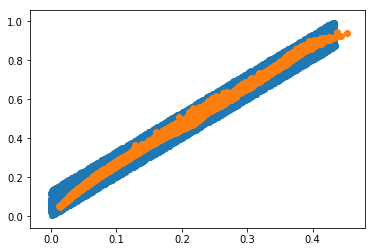

tensor(11.4098, grad_fn=<AddBackward0>)
X_sample tensor([[0.3610, 0.7872],
        [0.0454, 0.1506],
        [0.1288, 0.3297],
        ...,
        [0.1962, 0.4530],
        [0.2713, 0.6205],
        [0.2190, 0.4965]])


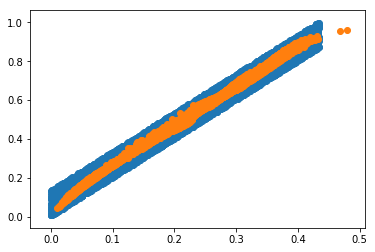

tensor(11.3895, grad_fn=<AddBackward0>)
X_sample tensor([[0.3268, 0.7345],
        [0.3474, 0.7643],
        [0.0869, 0.2379],
        ...,
        [0.2214, 0.5011],
        [0.3491, 0.7816],
        [0.2139, 0.4844]])


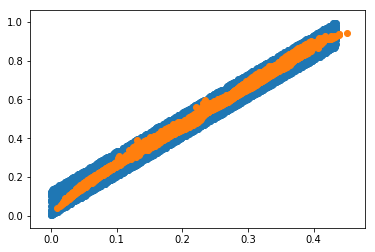

tensor(11.4202, grad_fn=<AddBackward0>)
X_sample tensor([[0.2126, 0.4837],
        [0.2271, 0.5232],
        [0.1673, 0.4231],
        ...,
        [0.0983, 0.2618],
        [0.1723, 0.4098],
        [0.2992, 0.6673]])


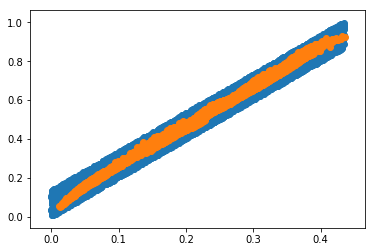

tensor(11.4123, grad_fn=<AddBackward0>)
X_sample tensor([[0.3778, 0.8550],
        [0.0760, 0.2223],
        [0.2869, 0.6456],
        ...,
        [0.0946, 0.2667],
        [0.2376, 0.5421],
        [0.1091, 0.2830]])


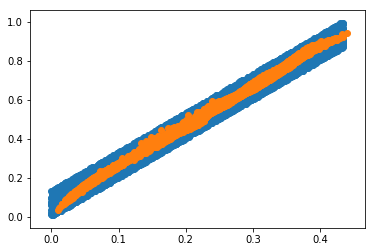

tensor(11.4481, grad_fn=<AddBackward0>)
X_sample tensor([[0.3173, 0.7018],
        [0.1656, 0.3803],
        [0.2563, 0.5790],
        ...,
        [0.2271, 0.5074],
        [0.1290, 0.3314],
        [0.3501, 0.7716]])


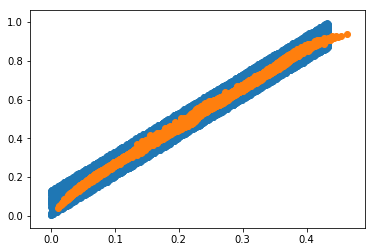

tensor(11.4282, grad_fn=<AddBackward0>)
X_sample tensor([[0.0597, 0.1811],
        [0.2500, 0.5679],
        [0.2567, 0.5759],
        ...,
        [0.4474, 0.9150],
        [0.1287, 0.3346],
        [0.3390, 0.7143]])


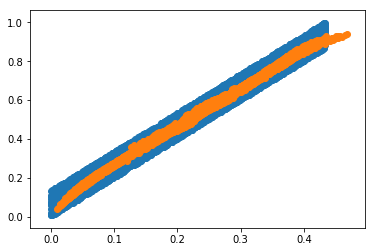

tensor(11.4269, grad_fn=<AddBackward0>)
X_sample tensor([[0.3778, 0.8464],
        [0.3693, 0.8076],
        [0.1498, 0.3619],
        ...,
        [0.0629, 0.1920],
        [0.1951, 0.4547],
        [0.0666, 0.2038]])


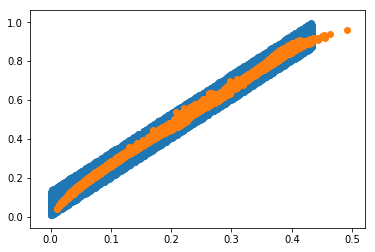

tensor(11.3995, grad_fn=<AddBackward0>)
X_sample tensor([[0.0289, 0.0976],
        [0.2401, 0.5512],
        [0.2228, 0.5103],
        ...,
        [0.2182, 0.4799],
        [0.3538, 0.7688],
        [0.3614, 0.7865]])


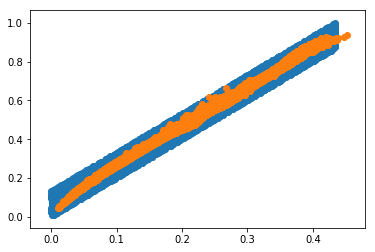

tensor(11.4253, grad_fn=<AddBackward0>)
X_sample tensor([[0.1572, 0.3766],
        [0.1378, 0.3437],
        [0.0976, 0.2647],
        ...,
        [0.2006, 0.4680],
        [0.2525, 0.5714],
        [0.3029, 0.6630]])


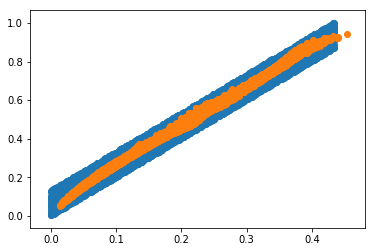

tensor(11.4273, grad_fn=<AddBackward0>)
X_sample tensor([[0.0958, 0.2622],
        [0.3600, 0.8086],
        [0.0839, 0.2331],
        ...,
        [0.2278, 0.5273],
        [0.3653, 0.8011],
        [0.2923, 0.6423]])


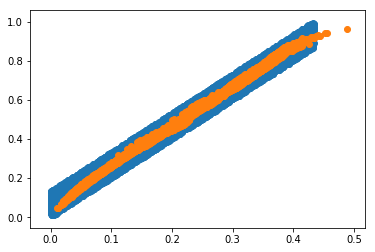

tensor(11.4532, grad_fn=<AddBackward0>)
X_sample tensor([[0.3225, 0.7114],
        [0.0454, 0.1532],
        [0.3846, 0.8673],
        ...,
        [0.1901, 0.4497],
        [0.0771, 0.2168],
        [0.3657, 0.8019]])


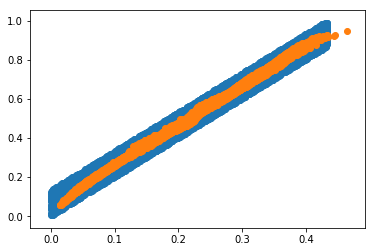

tensor(11.4044, grad_fn=<AddBackward0>)
X_sample tensor([[0.3666, 0.8048],
        [0.3404, 0.7541],
        [0.3902, 0.8662],
        ...,
        [0.1805, 0.4309],
        [0.3724, 0.8312],
        [0.0862, 0.2402]])


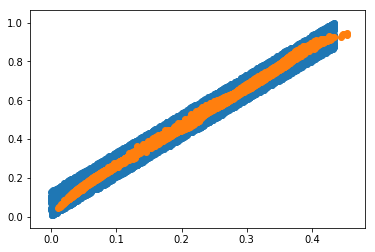

tensor(11.4629, grad_fn=<AddBackward0>)
X_sample tensor([[0.1126, 0.2945],
        [0.3486, 0.7750],
        [0.2663, 0.5879],
        ...,
        [0.1961, 0.4565],
        [0.0536, 0.1666],
        [0.3615, 0.8031]])


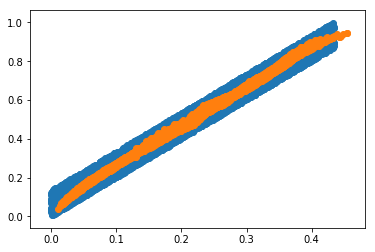

tensor(11.4341, grad_fn=<AddBackward0>)
X_sample tensor([[0.1094, 0.2812],
        [0.0469, 0.1438],
        [0.2280, 0.5525],
        ...,
        [0.3035, 0.6818],
        [0.3919, 0.8602],
        [0.3783, 0.8410]])


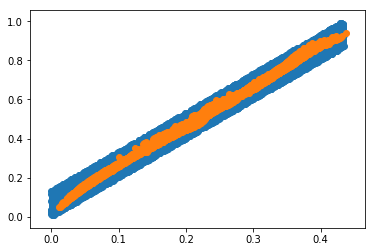

tensor(11.4394, grad_fn=<AddBackward0>)
X_sample tensor([[0.1392, 0.3404],
        [0.0889, 0.2488],
        [0.3513, 0.7776],
        ...,
        [0.2851, 0.6410],
        [0.0666, 0.1907],
        [0.3681, 0.8043]])


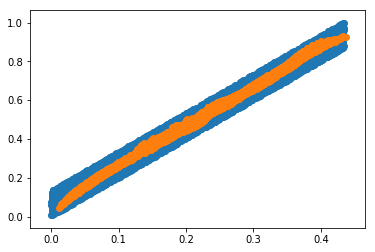

tensor(11.4236, grad_fn=<AddBackward0>)
X_sample tensor([[0.3492, 0.7662],
        [0.3115, 0.6984],
        [0.3191, 0.6971],
        ...,
        [0.2814, 0.6329],
        [0.1484, 0.3731],
        [0.2744, 0.6188]])


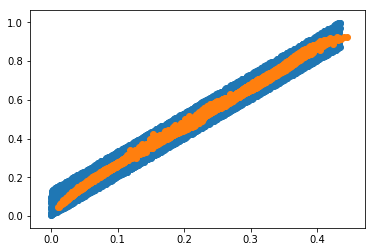

tensor(11.4117, grad_fn=<AddBackward0>)
X_sample tensor([[0.0392, 0.1346],
        [0.3591, 0.7742],
        [0.3593, 0.7745],
        ...,
        [0.1104, 0.2884],
        [0.0907, 0.2547],
        [0.2711, 0.6086]])


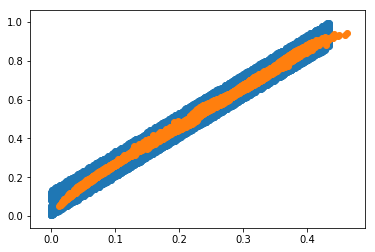

tensor(11.4397, grad_fn=<AddBackward0>)
X_sample tensor([[0.3630, 0.7813],
        [0.2447, 0.5488],
        [0.2991, 0.6711],
        ...,
        [0.0906, 0.2474],
        [0.1265, 0.3241],
        [0.0290, 0.1033]])


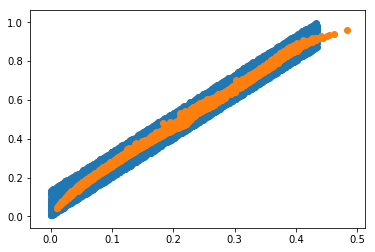

tensor(11.4354, grad_fn=<AddBackward0>)
X_sample tensor([[0.3554, 0.7980],
        [0.0734, 0.2177],
        [0.3398, 0.7446],
        ...,
        [0.0479, 0.1642],
        [0.0458, 0.1439],
        [0.2832, 0.6350]])


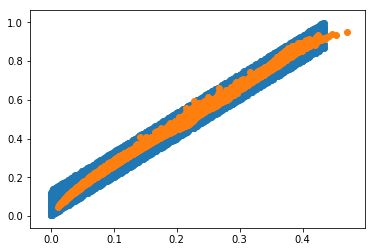

tensor(11.4307, grad_fn=<AddBackward0>)
X_sample tensor([[0.3727, 0.8451],
        [0.4139, 0.9011],
        [0.3258, 0.7350],
        ...,
        [0.2155, 0.4983],
        [0.1200, 0.3032],
        [0.0390, 0.1281]])


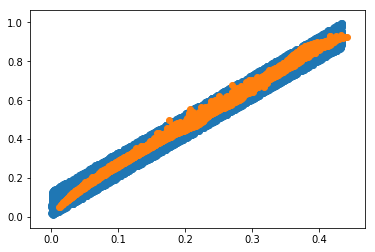

tensor(11.4264, grad_fn=<AddBackward0>)
X_sample tensor([[0.1679, 0.4035],
        [0.1762, 0.4109],
        [0.3029, 0.6828],
        ...,
        [0.1717, 0.4054],
        [0.3278, 0.7306],
        [0.1592, 0.3807]])


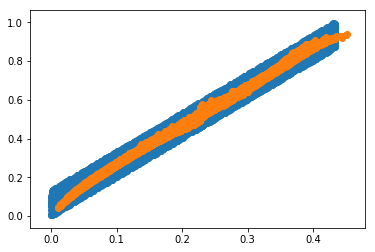

tensor(11.4258, grad_fn=<AddBackward0>)
X_sample tensor([[0.1585, 0.3782],
        [0.3932, 0.8538],
        [0.3558, 0.7760],
        ...,
        [0.1953, 0.4608],
        [0.0400, 0.1176],
        [0.2425, 0.5434]])


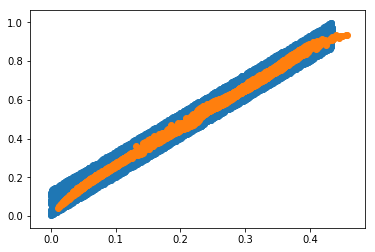

tensor(11.4256, grad_fn=<AddBackward0>)
X_sample tensor([[0.1564, 0.3743],
        [0.2229, 0.4998],
        [0.2550, 0.5818],
        ...,
        [0.2810, 0.6331],
        [0.3156, 0.6793],
        [0.3436, 0.7441]])


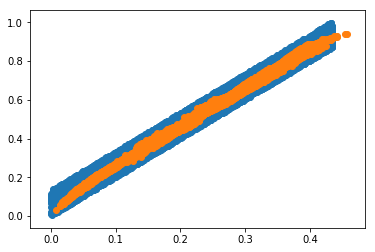

tensor(11.4645, grad_fn=<AddBackward0>)
X_sample tensor([[0.3656, 0.8120],
        [0.3467, 0.7714],
        [0.1600, 0.3822],
        ...,
        [0.1557, 0.3736],
        [0.3534, 0.7874],
        [0.0935, 0.2470]])


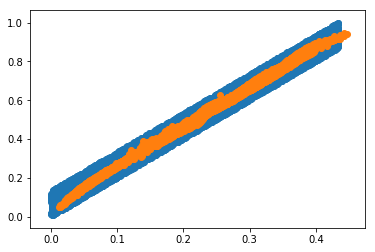

tensor(11.4281, grad_fn=<AddBackward0>)
X_sample tensor([[0.2014, 0.4646],
        [0.0978, 0.2665],
        [0.3152, 0.6957],
        ...,
        [0.0315, 0.1076],
        [0.1613, 0.3862],
        [0.3683, 0.8192]])


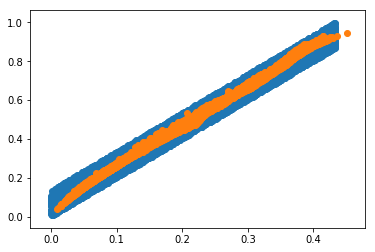

tensor(11.4642, grad_fn=<AddBackward0>)
X_sample tensor([[0.2055, 0.4757],
        [0.3579, 0.7911],
        [0.3232, 0.7185],
        ...,
        [0.3337, 0.7543],
        [0.1674, 0.3960],
        [0.0596, 0.1814]])


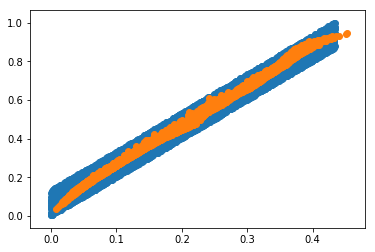

tensor(11.4154, grad_fn=<AddBackward0>)
X_sample tensor([[0.3409, 0.7512],
        [0.1042, 0.2825],
        [0.0266, 0.0927],
        ...,
        [0.3529, 0.7747],
        [0.3010, 0.6673],
        [0.1864, 0.4293]])


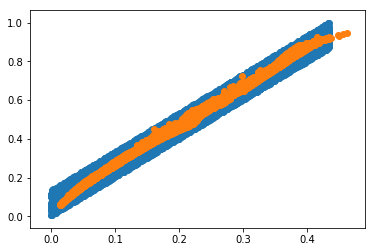

tensor(11.4247, grad_fn=<AddBackward0>)
X_sample tensor([[0.2399, 0.5393],
        [0.0724, 0.2197],
        [0.0496, 0.1582],
        ...,
        [0.0789, 0.2278],
        [0.4173, 0.8873],
        [0.4052, 0.8903]])


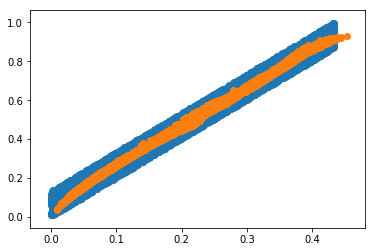

tensor(11.4628, grad_fn=<AddBackward0>)
X_sample tensor([[0.2496, 0.5676],
        [0.2423, 0.5440],
        [0.3599, 0.7776],
        ...,
        [0.0577, 0.1811],
        [0.3283, 0.7190],
        [0.3353, 0.7387]])


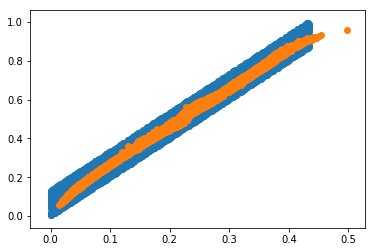

tensor(11.4747, grad_fn=<AddBackward0>)
X_sample tensor([[0.2472, 0.5607],
        [0.3487, 0.7586],
        [0.0374, 0.1193],
        ...,
        [0.0966, 0.2527],
        [0.1511, 0.3750],
        [0.0811, 0.2337]])


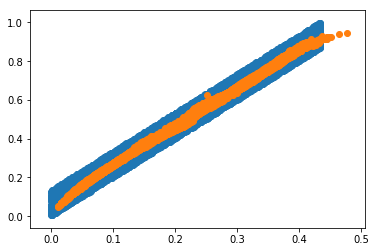

tensor(11.4531, grad_fn=<AddBackward0>)
X_sample tensor([[0.3045, 0.6738],
        [0.0599, 0.1825],
        [0.2179, 0.4950],
        ...,
        [0.2352, 0.5325],
        [0.1034, 0.2771],
        [0.0987, 0.2580]])


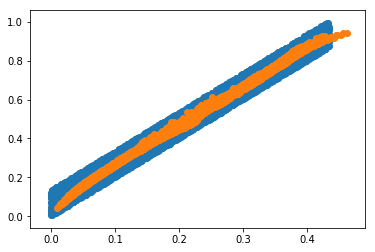

tensor(11.4369, grad_fn=<AddBackward0>)
X_sample tensor([[0.3244, 0.7273],
        [0.3087, 0.6864],
        [0.3755, 0.8435],
        ...,
        [0.1877, 0.4647],
        [0.2630, 0.6087],
        [0.2886, 0.6687]])


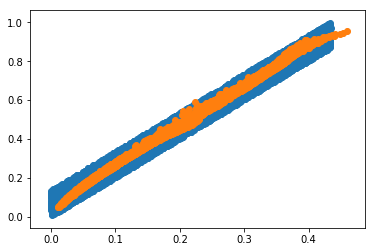

tensor(11.4423, grad_fn=<AddBackward0>)
X_sample tensor([[0.2801, 0.6349],
        [0.1036, 0.2772],
        [0.2270, 0.5401],
        ...,
        [0.3584, 0.8003],
        [0.2622, 0.5959],
        [0.2205, 0.5204]])


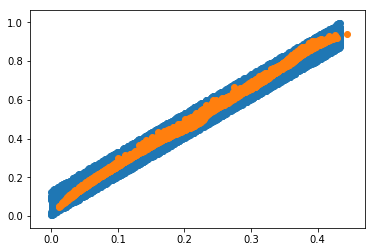

tensor(11.3947, grad_fn=<AddBackward0>)
X_sample tensor([[0.0911, 0.2477],
        [0.0482, 0.1512],
        [0.3620, 0.7992],
        ...,
        [0.3286, 0.7220],
        [0.0379, 0.1242],
        [0.1081, 0.2856]])


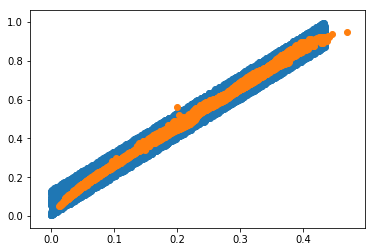

tensor(11.4474, grad_fn=<AddBackward0>)
X_sample tensor([[0.1982, 0.4536],
        [0.0856, 0.2375],
        [0.0576, 0.1832],
        ...,
        [0.3453, 0.7608],
        [0.1093, 0.2863],
        [0.3352, 0.7202]])


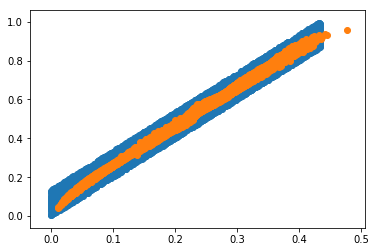

tensor(11.4371, grad_fn=<AddBackward0>)
X_sample tensor([[0.0652, 0.1930],
        [0.3283, 0.7347],
        [0.2080, 0.4770],
        ...,
        [0.1044, 0.2775],
        [0.3648, 0.8015],
        [0.0504, 0.1590]])


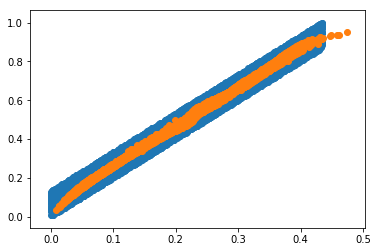

tensor(11.4464, grad_fn=<AddBackward0>)
X_sample tensor([[0.3526, 0.7814],
        [0.1669, 0.4143],
        [0.2076, 0.4738],
        ...,
        [0.2219, 0.4990],
        [0.3767, 0.8245],
        [0.0688, 0.1923]])


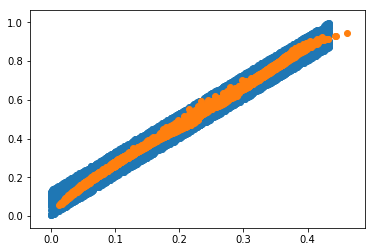

tensor(11.4202, grad_fn=<AddBackward0>)
X_sample tensor([[0.2823, 0.6297],
        [0.2806, 0.6296],
        [0.3642, 0.8026],
        ...,
        [0.0934, 0.2593],
        [0.0941, 0.2469],
        [0.1655, 0.4009]])


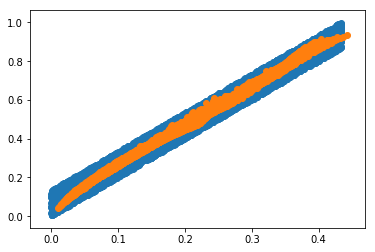

tensor(11.4208, grad_fn=<AddBackward0>)
X_sample tensor([[0.3318, 0.7303],
        [0.3377, 0.7388],
        [0.2570, 0.5817],
        ...,
        [0.3371, 0.7488],
        [0.3306, 0.7272],
        [0.0475, 0.1565]])


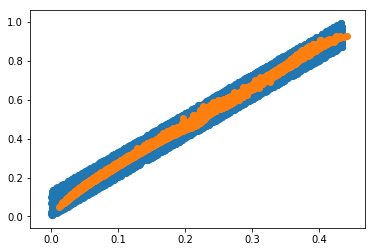

tensor(11.4415, grad_fn=<AddBackward0>)
X_sample tensor([[0.2205, 0.4959],
        [0.2217, 0.5034],
        [0.2597, 0.6014],
        ...,
        [0.2700, 0.6103],
        [0.1454, 0.3615],
        [0.3925, 0.8359]])


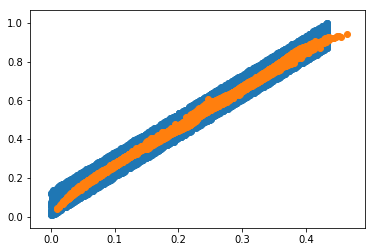

tensor(11.4152, grad_fn=<AddBackward0>)
X_sample tensor([[0.0523, 0.1602],
        [0.4068, 0.8665],
        [0.3178, 0.6923],
        ...,
        [0.3625, 0.7985],
        [0.0613, 0.1869],
        [0.3622, 0.7836]])


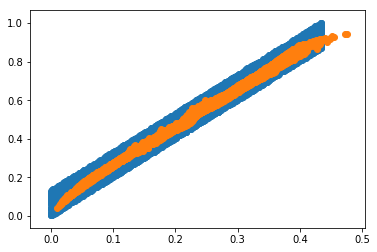

tensor(11.4242, grad_fn=<AddBackward0>)
X_sample tensor([[0.2572, 0.5793],
        [0.1520, 0.3696],
        [0.2702, 0.6150],
        ...,
        [0.1376, 0.3363],
        [0.3573, 0.7727],
        [0.0874, 0.2433]])


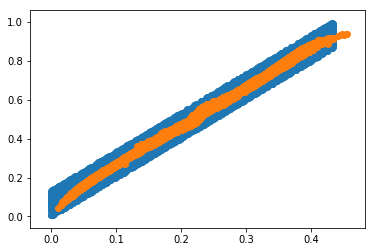

tensor(11.4529, grad_fn=<AddBackward0>)
X_sample tensor([[0.0710, 0.2110],
        [0.2920, 0.6549],
        [0.3628, 0.8167],
        ...,
        [0.3120, 0.6951],
        [0.1829, 0.4378],
        [0.1280, 0.3287]])


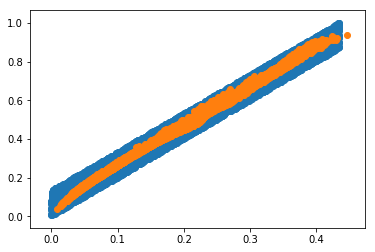

tensor(11.4148, grad_fn=<AddBackward0>)
X_sample tensor([[0.3207, 0.7320],
        [0.3023, 0.6646],
        [0.3726, 0.8197],
        ...,
        [0.3942, 0.8838],
        [0.1997, 0.4633],
        [0.2890, 0.6379]])


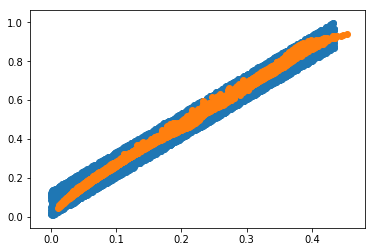

tensor(11.3822, grad_fn=<AddBackward0>)
X_sample tensor([[0.3511, 0.7712],
        [0.3135, 0.6982],
        [0.2266, 0.5164],
        ...,
        [0.0484, 0.1546],
        [0.1516, 0.3633],
        [0.2782, 0.6211]])


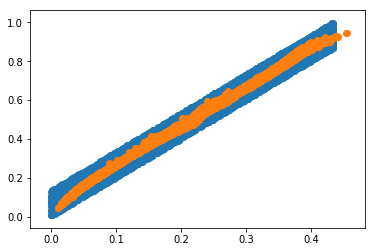

tensor(11.4626, grad_fn=<AddBackward0>)
X_sample tensor([[0.0903, 0.2467],
        [0.2680, 0.6120],
        [0.1578, 0.3847],
        ...,
        [0.4279, 0.9009],
        [0.0877, 0.2384],
        [0.1231, 0.3180]])


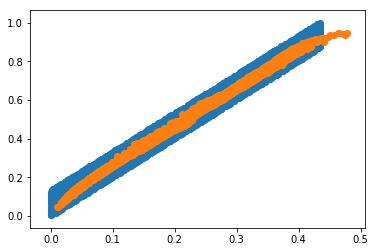

tensor(11.4239, grad_fn=<AddBackward0>)
X_sample tensor([[0.0335, 0.1198],
        [0.0709, 0.2112],
        [0.0697, 0.2020],
        ...,
        [0.1289, 0.3272],
        [0.3523, 0.7717],
        [0.3619, 0.8011]])


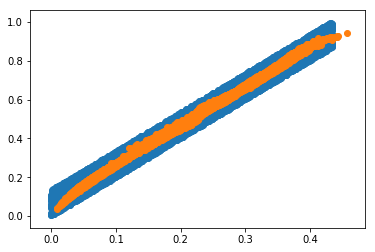

tensor(11.4364, grad_fn=<AddBackward0>)
X_sample tensor([[0.3362, 0.7503],
        [0.3494, 0.7672],
        [0.2745, 0.6174],
        ...,
        [0.2633, 0.5984],
        [0.3983, 0.8944],
        [0.3782, 0.8283]])


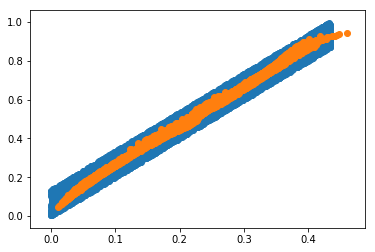

tensor(11.4266, grad_fn=<AddBackward0>)
X_sample tensor([[0.1783, 0.4279],
        [0.2786, 0.6342],
        [0.0666, 0.1985],
        ...,
        [0.1899, 0.4461],
        [0.0770, 0.2223],
        [0.3584, 0.7910]])


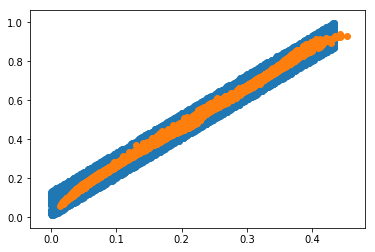

tensor(11.4794, grad_fn=<AddBackward0>)
X_sample tensor([[0.2654, 0.6000],
        [0.3497, 0.7768],
        [0.1927, 0.4542],
        ...,
        [0.2564, 0.5877],
        [0.0474, 0.1542],
        [0.3428, 0.7570]])


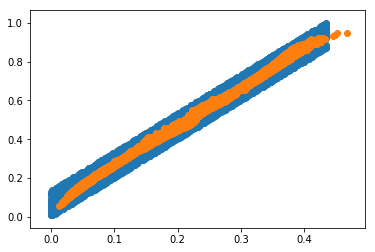

tensor(11.4043, grad_fn=<AddBackward0>)
X_sample tensor([[0.3255, 0.7165],
        [0.3105, 0.6871],
        [0.3318, 0.7343],
        ...,
        [0.0908, 0.2508],
        [0.0502, 0.1582],
        [0.0265, 0.0938]])


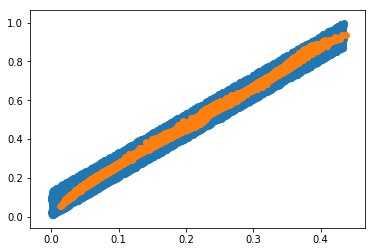

tensor(11.4165, grad_fn=<AddBackward0>)
X_sample tensor([[0.4043, 0.9021],
        [0.3109, 0.6873],
        [0.3659, 0.8351],
        ...,
        [0.2062, 0.4757],
        [0.3048, 0.6877],
        [0.0382, 0.1329]])


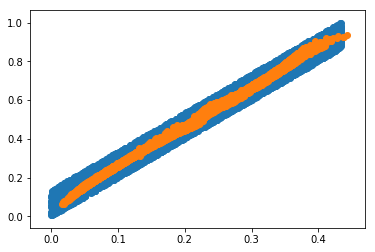

tensor(11.4127, grad_fn=<AddBackward0>)
X_sample tensor([[0.2758, 0.6136],
        [0.0591, 0.1760],
        [0.1779, 0.4148],
        ...,
        [0.3552, 0.7708],
        [0.0624, 0.1842],
        [0.2997, 0.6627]])


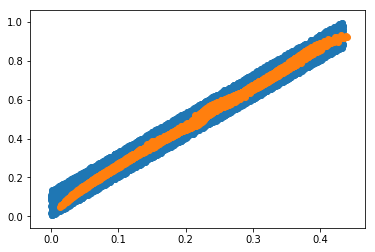

tensor(11.4229, grad_fn=<AddBackward0>)
X_sample tensor([[0.2726, 0.6109],
        [0.3188, 0.7021],
        [0.3321, 0.7241],
        ...,
        [0.2716, 0.6006],
        [0.0478, 0.1409],
        [0.3573, 0.7720]])


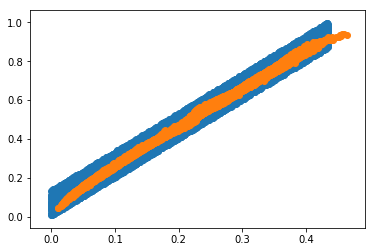

tensor(11.4222, grad_fn=<AddBackward0>)
X_sample tensor([[0.2333, 0.5347],
        [0.2355, 0.5453],
        [0.3869, 0.8378],
        ...,
        [0.1185, 0.3005],
        [0.3001, 0.6600],
        [0.4175, 0.8924]])


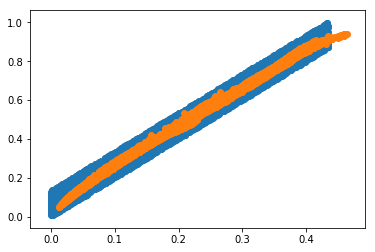

tensor(11.4088, grad_fn=<AddBackward0>)
X_sample tensor([[0.3018, 0.6861],
        [0.2549, 0.5696],
        [0.1245, 0.3183],
        ...,
        [0.1638, 0.3961],
        [0.0687, 0.2001],
        [0.0689, 0.2044]])


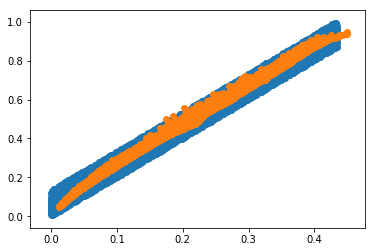

tensor(11.3877, grad_fn=<AddBackward0>)
X_sample tensor([[0.1259, 0.3290],
        [0.2716, 0.6011],
        [0.3288, 0.7424],
        ...,
        [0.2520, 0.5972],
        [0.2813, 0.6481],
        [0.0519, 0.1660]])


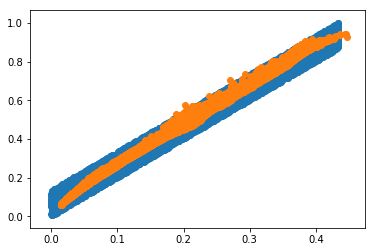

tensor(11.4469, grad_fn=<AddBackward0>)
X_sample tensor([[0.2971, 0.6623],
        [0.1134, 0.3023],
        [0.1549, 0.4056],
        ...,
        [0.0677, 0.2001],
        [0.1552, 0.3823],
        [0.3640, 0.8078]])


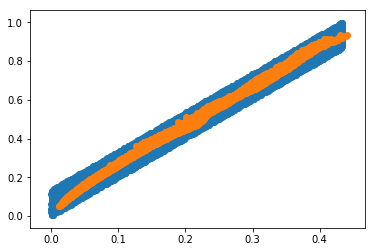

tensor(11.4495, grad_fn=<AddBackward0>)
X_sample tensor([[0.1546, 0.3797],
        [0.3356, 0.7260],
        [0.3368, 0.7392],
        ...,
        [0.1820, 0.4290],
        [0.3897, 0.8379],
        [0.3806, 0.8136]])


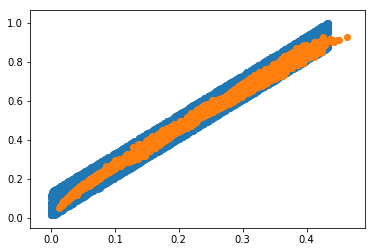

tensor(11.4501, grad_fn=<AddBackward0>)
X_sample tensor([[0.2788, 0.6178],
        [0.2298, 0.5222],
        [0.0598, 0.1779],
        ...,
        [0.3892, 0.8408],
        [0.1497, 0.3386],
        [0.1223, 0.3189]])


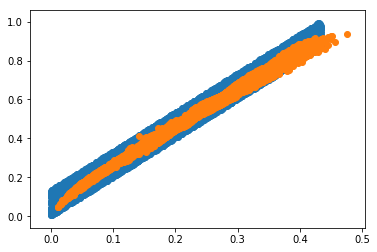

tensor(11.4534, grad_fn=<AddBackward0>)
X_sample tensor([[0.1480, 0.3617],
        [0.1945, 0.4444],
        [0.3604, 0.7892],
        ...,
        [0.0451, 0.1489],
        [0.3459, 0.7596],
        [0.1227, 0.3184]])


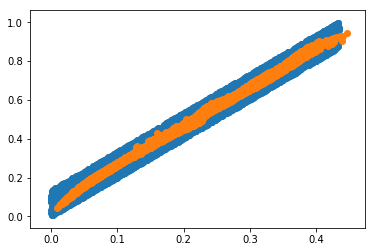

tensor(11.4108, grad_fn=<AddBackward0>)
X_sample tensor([[0.2086, 0.4865],
        [0.2533, 0.5772],
        [0.0860, 0.2354],
        ...,
        [0.1278, 0.3324],
        [0.3436, 0.7864],
        [0.2709, 0.6188]])


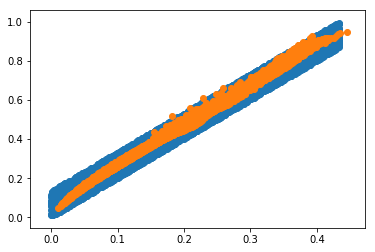

tensor(11.4153, grad_fn=<AddBackward0>)
X_sample tensor([[0.0675, 0.2017],
        [0.3825, 0.8424],
        [0.3705, 0.8255],
        ...,
        [0.2464, 0.5797],
        [0.3235, 0.7213],
        [0.0886, 0.2487]])


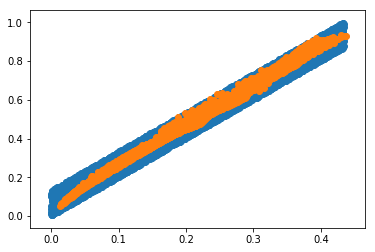

tensor(11.4285, grad_fn=<AddBackward0>)
X_sample tensor([[0.1912, 0.4471],
        [0.2814, 0.6239],
        [0.1382, 0.3532],
        ...,
        [0.0786, 0.2216],
        [0.1452, 0.3628],
        [0.2164, 0.4828]])


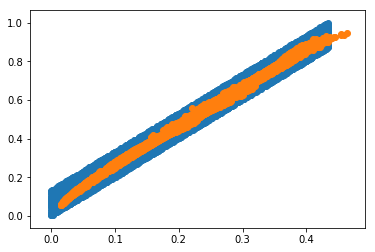

tensor(11.3987, grad_fn=<AddBackward0>)
X_sample tensor([[0.3801, 0.8253],
        [0.3893, 0.8311],
        [0.0466, 0.1460],
        ...,
        [0.2625, 0.5967],
        [0.3349, 0.7192],
        [0.2089, 0.4747]])


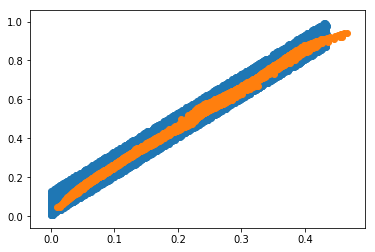

tensor(11.4040, grad_fn=<AddBackward0>)
X_sample tensor([[0.2440, 0.5589],
        [0.1739, 0.4029],
        [0.2079, 0.4636],
        ...,
        [0.1269, 0.3134],
        [0.3823, 0.8400],
        [0.2186, 0.4775]])


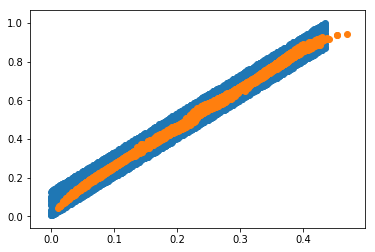

tensor(11.4044, grad_fn=<AddBackward0>)
X_sample tensor([[0.1633, 0.3953],
        [0.0269, 0.0960],
        [0.0671, 0.2056],
        ...,
        [0.1047, 0.2762],
        [0.3599, 0.7938],
        [0.1298, 0.3301]])


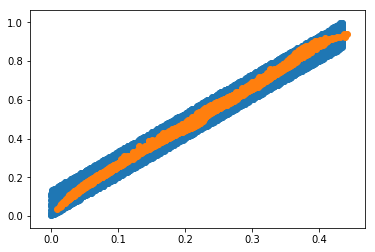

tensor(11.4672, grad_fn=<AddBackward0>)
X_sample tensor([[0.0655, 0.1932],
        [0.3524, 0.7947],
        [0.3119, 0.7107],
        ...,
        [0.0883, 0.2435],
        [0.1820, 0.4288],
        [0.0930, 0.2487]])


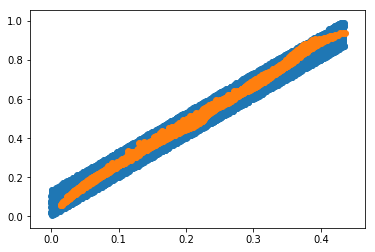

tensor(11.4258, grad_fn=<AddBackward0>)
X_sample tensor([[0.0278, 0.1038],
        [0.2905, 0.6662],
        [0.0725, 0.2123],
        ...,
        [0.3462, 0.7787],
        [0.2697, 0.6086],
        [0.3640, 0.8032]])


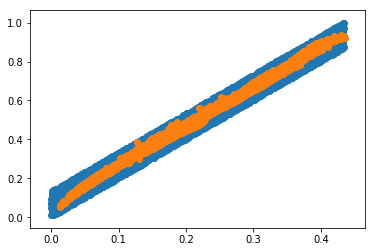

tensor(11.3851, grad_fn=<AddBackward0>)
X_sample tensor([[0.1367, 0.3517],
        [0.3480, 0.7576],
        [0.3438, 0.7517],
        ...,
        [0.3002, 0.6541],
        [0.2255, 0.5139],
        [0.2945, 0.6364]])


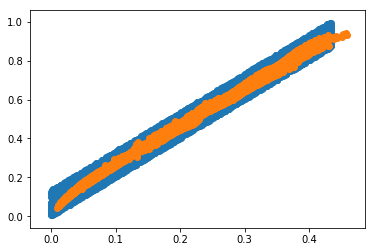

tensor(11.4041, grad_fn=<AddBackward0>)
X_sample tensor([[0.0823, 0.2352],
        [0.2135, 0.4866],
        [0.0826, 0.2301],
        ...,
        [0.3808, 0.8288],
        [0.3786, 0.8242],
        [0.2885, 0.6493]])


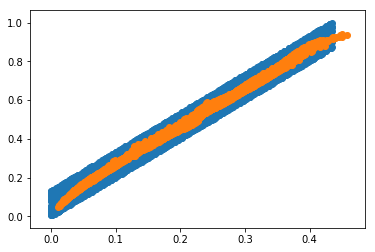

tensor(11.4362, grad_fn=<AddBackward0>)
X_sample tensor([[0.3689, 0.8227],
        [0.3165, 0.7102],
        [0.2142, 0.4920],
        ...,
        [0.2936, 0.6524],
        [0.3036, 0.6849],
        [0.3018, 0.6824]])


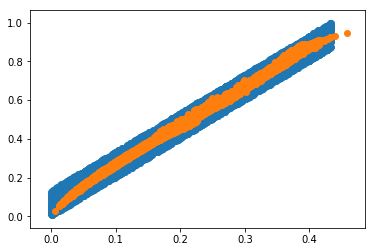

tensor(11.4268, grad_fn=<AddBackward0>)
X_sample tensor([[0.3602, 0.7975],
        [0.3015, 0.6654],
        [0.2985, 0.6604],
        ...,
        [0.3704, 0.8098],
        [0.2377, 0.5307],
        [0.2418, 0.5688]])


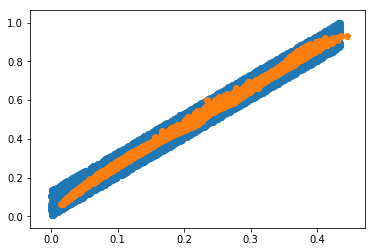

tensor(11.4144, grad_fn=<AddBackward0>)
X_sample tensor([[0.3004, 0.6666],
        [0.0696, 0.2052],
        [0.3894, 0.8409],
        ...,
        [0.2729, 0.6102],
        [0.3036, 0.6758],
        [0.0958, 0.2606]])


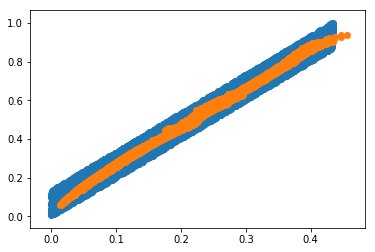

tensor(11.4454, grad_fn=<AddBackward0>)
X_sample tensor([[0.3001, 0.6666],
        [0.1973, 0.4696],
        [0.1478, 0.3615],
        ...,
        [0.3422, 0.7510],
        [0.0675, 0.2010],
        [0.2465, 0.5658]])


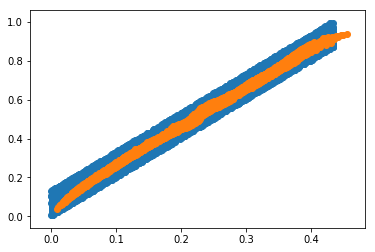

tensor(11.4362, grad_fn=<AddBackward0>)
X_sample tensor([[0.3663, 0.8067],
        [0.0516, 0.1607],
        [0.1214, 0.3155],
        ...,
        [0.3431, 0.7657],
        [0.0724, 0.2082],
        [0.3582, 0.8066]])


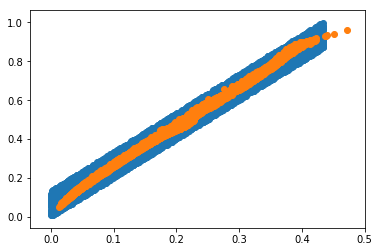

tensor(11.4336, grad_fn=<AddBackward0>)
X_sample tensor([[0.1322, 0.3398],
        [0.1955, 0.4656],
        [0.3204, 0.7296],
        ...,
        [0.1350, 0.3356],
        [0.2368, 0.5558],
        [0.2323, 0.5312]])


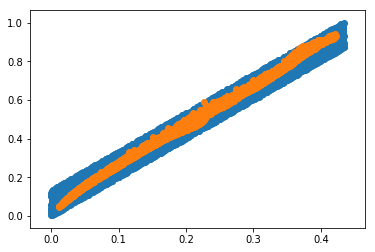

tensor(11.4502, grad_fn=<AddBackward0>)
X_sample tensor([[0.2599, 0.5961],
        [0.1436, 0.3577],
        [0.3184, 0.7051],
        ...,
        [0.0842, 0.2323],
        [0.3573, 0.7869],
        [0.0700, 0.2001]])


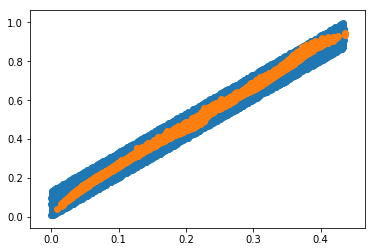

tensor(11.3592, grad_fn=<AddBackward0>)
X_sample tensor([[0.3061, 0.6844],
        [0.0681, 0.2025],
        [0.2283, 0.5138],
        ...,
        [0.2053, 0.4697],
        [0.2973, 0.6582],
        [0.0895, 0.2427]])


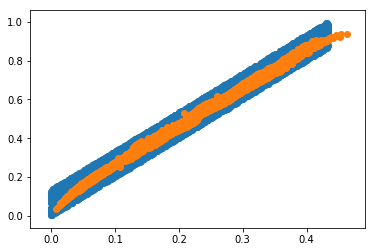

tensor(11.4156, grad_fn=<AddBackward0>)
X_sample tensor([[0.0675, 0.1988],
        [0.4108, 0.8752],
        [0.3680, 0.7442],
        ...,
        [0.1154, 0.3033],
        [0.1684, 0.4020],
        [0.0972, 0.2665]])


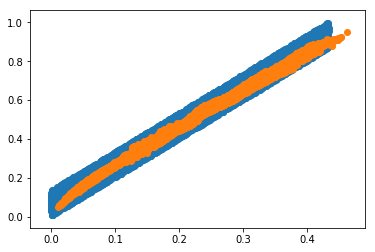

tensor(11.4648, grad_fn=<AddBackward0>)
X_sample tensor([[0.1421, 0.3602],
        [0.2828, 0.6336],
        [0.3788, 0.8169],
        ...,
        [0.3401, 0.7502],
        [0.0341, 0.1214],
        [0.2645, 0.5919]])


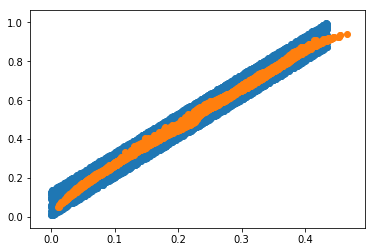

tensor(11.4341, grad_fn=<AddBackward0>)
X_sample tensor([[0.1452, 0.3606],
        [0.0272, 0.1023],
        [0.3386, 0.7514],
        ...,
        [0.3281, 0.7346],
        [0.3457, 0.7663],
        [0.3534, 0.8070]])


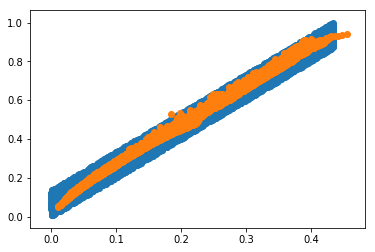

tensor(11.4515, grad_fn=<AddBackward0>)
X_sample tensor([[0.3229, 0.7461],
        [0.1393, 0.3459],
        [0.0463, 0.1608],
        ...,
        [0.1508, 0.3717],
        [0.0546, 0.1729],
        [0.3092, 0.6834]])


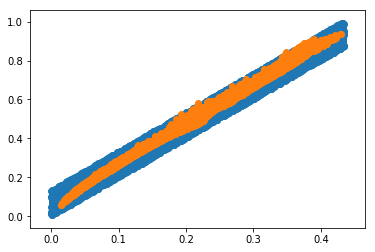

tensor(11.4251, grad_fn=<AddBackward0>)
X_sample tensor([[0.2656, 0.5991],
        [0.3342, 0.7461],
        [0.3204, 0.7205],
        ...,
        [0.3604, 0.7953],
        [0.0492, 0.1549],
        [0.3505, 0.7796]])


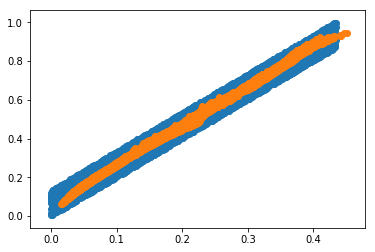

tensor(11.4280, grad_fn=<AddBackward0>)
X_sample tensor([[0.0408, 0.1303],
        [0.0560, 0.1669],
        [0.1899, 0.4513],
        ...,
        [0.0647, 0.1865],
        [0.2313, 0.5146],
        [0.1406, 0.3475]])


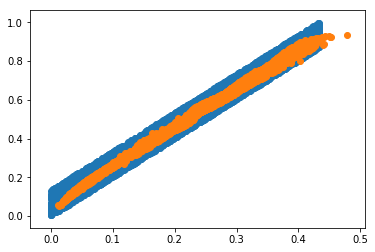

tensor(11.4075, grad_fn=<AddBackward0>)
X_sample tensor([[0.1122, 0.2878],
        [0.1878, 0.4208],
        [0.2807, 0.6228],
        ...,
        [0.0152, 0.0569],
        [0.1287, 0.3221],
        [0.1730, 0.4119]])


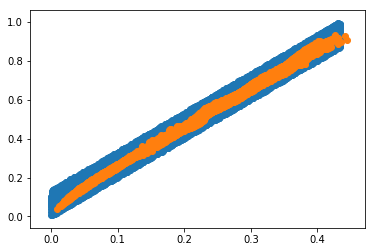

tensor(11.4060, grad_fn=<AddBackward0>)
X_sample tensor([[0.1464, 0.3580],
        [0.3661, 0.8090],
        [0.1397, 0.3457],
        ...,
        [0.1166, 0.2944],
        [0.3239, 0.7171],
        [0.3145, 0.7087]])


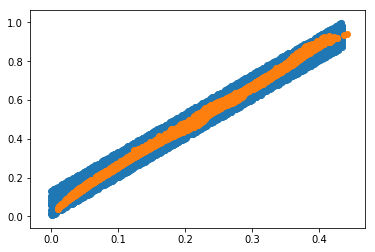

tensor(11.4381, grad_fn=<AddBackward0>)
X_sample tensor([[0.1553, 0.3760],
        [0.2964, 0.6688],
        [0.2240, 0.5016],
        ...,
        [0.1616, 0.3913],
        [0.2936, 0.6733],
        [0.1268, 0.3188]])


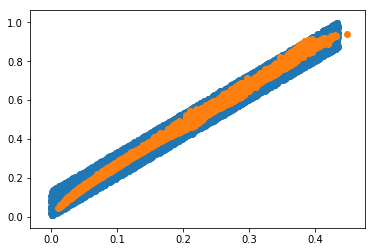

tensor(11.4308, grad_fn=<AddBackward0>)
X_sample tensor([[0.1036, 0.2797],
        [0.3632, 0.7910],
        [0.3388, 0.7454],
        ...,
        [0.3400, 0.7492],
        [0.2036, 0.4751],
        [0.0865, 0.2397]])


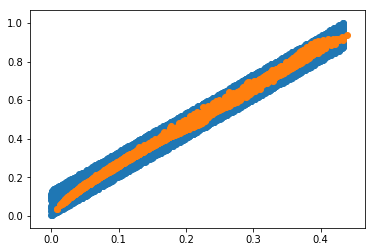

tensor(11.4143, grad_fn=<AddBackward0>)
X_sample tensor([[0.1913, 0.4382],
        [0.2773, 0.6183],
        [0.3013, 0.6656],
        ...,
        [0.2582, 0.5788],
        [0.0357, 0.1244],
        [0.3819, 0.8401]])


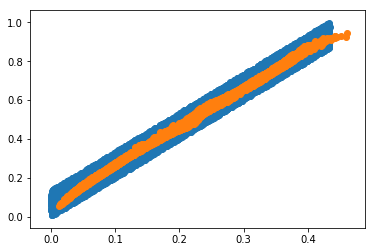

tensor(11.4495, grad_fn=<AddBackward0>)
X_sample tensor([[0.1816, 0.4265],
        [0.0469, 0.1563],
        [0.1541, 0.3784],
        ...,
        [0.3191, 0.7085],
        [0.3353, 0.7113],
        [0.1779, 0.4155]])


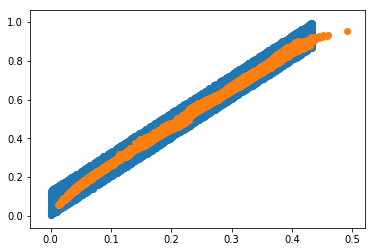

tensor(11.4304, grad_fn=<AddBackward0>)
X_sample tensor([[0.3030, 0.6655],
        [0.0561, 0.1763],
        [0.3586, 0.7670],
        ...,
        [0.1524, 0.3767],
        [0.2992, 0.6728],
        [0.3356, 0.7408]])


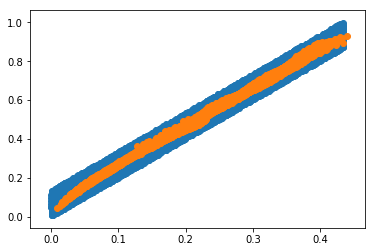

tensor(11.4190, grad_fn=<AddBackward0>)
X_sample tensor([[0.3546, 0.7790],
        [0.2963, 0.6679],
        [0.4218, 0.9209],
        ...,
        [0.3787, 0.8466],
        [0.1432, 0.3624],
        [0.2017, 0.4727]])


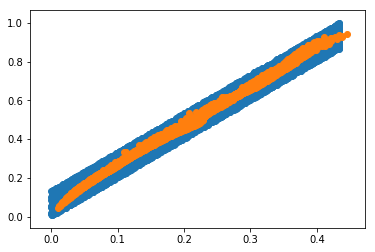

tensor(11.4032, grad_fn=<AddBackward0>)
X_sample tensor([[0.1314, 0.3383],
        [0.0588, 0.1862],
        [0.0879, 0.2401],
        ...,
        [0.1892, 0.4565],
        [0.1807, 0.4269],
        [0.2292, 0.5298]])


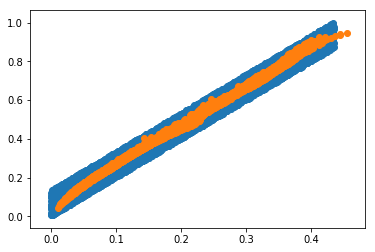

tensor(11.4083, grad_fn=<AddBackward0>)
X_sample tensor([[0.0652, 0.1961],
        [0.1433, 0.3587],
        [0.3731, 0.8130],
        ...,
        [0.1562, 0.3780],
        [0.2704, 0.6115],
        [0.1482, 0.3728]])


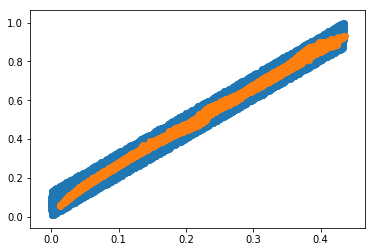

tensor(11.4399, grad_fn=<AddBackward0>)
X_sample tensor([[0.1952, 0.4503],
        [0.3772, 0.8064],
        [0.0504, 0.1631],
        ...,
        [0.2113, 0.4875],
        [0.3814, 0.8385],
        [0.2734, 0.6102]])


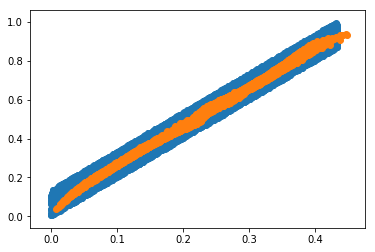

tensor(11.4450, grad_fn=<AddBackward0>)
X_sample tensor([[0.2197, 0.4986],
        [0.3483, 0.7572],
        [0.2276, 0.5397],
        ...,
        [0.2911, 0.6513],
        [0.1107, 0.2846],
        [0.1150, 0.3002]])


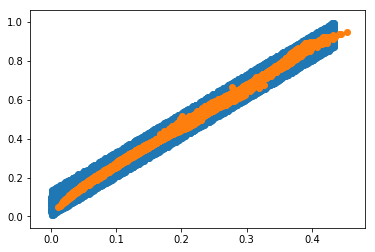

tensor(11.4762, grad_fn=<AddBackward0>)
X_sample tensor([[0.2176, 0.5077],
        [0.2936, 0.6585],
        [0.3462, 0.7644],
        ...,
        [0.3300, 0.7362],
        [0.1370, 0.3474],
        [0.2933, 0.6498]])


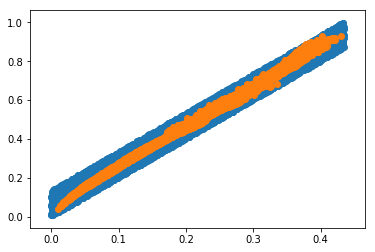

tensor(11.4336, grad_fn=<AddBackward0>)
X_sample tensor([[0.1333, 0.3384],
        [0.2312, 0.5223],
        [0.3432, 0.7511],
        ...,
        [0.0863, 0.2301],
        [0.2952, 0.6494],
        [0.2082, 0.4763]])


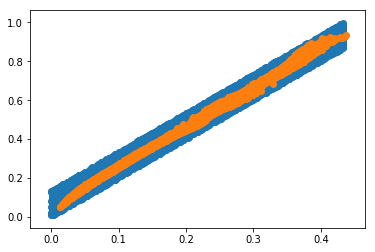

tensor(11.4080, grad_fn=<AddBackward0>)
X_sample tensor([[0.1329, 0.3379],
        [0.1567, 0.3804],
        [0.1798, 0.4271],
        ...,
        [0.0560, 0.1697],
        [0.3170, 0.6816],
        [0.0937, 0.2588]])


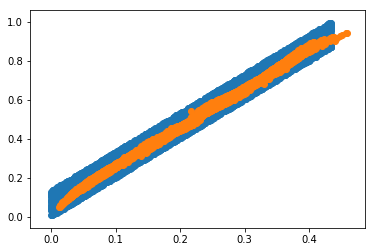

tensor(11.4132, grad_fn=<AddBackward0>)
X_sample tensor([[0.1658, 0.3849],
        [0.0550, 0.1658],
        [0.3085, 0.6867],
        ...,
        [0.1571, 0.3800],
        [0.3788, 0.8156],
        [0.3481, 0.7474]])


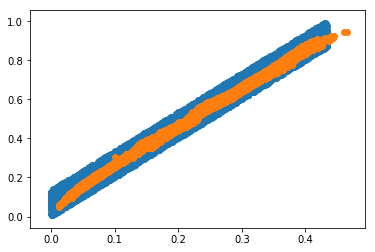

tensor(11.4269, grad_fn=<AddBackward0>)
X_sample tensor([[0.1179, 0.3037],
        [0.0754, 0.2104],
        [0.2757, 0.6130],
        ...,
        [0.0248, 0.0922],
        [0.2645, 0.5924],
        [0.0615, 0.1930]])


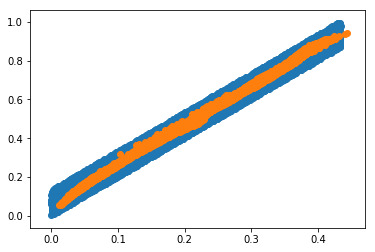

tensor(11.4136, grad_fn=<AddBackward0>)
X_sample tensor([[0.2185, 0.5210],
        [0.1027, 0.2782],
        [0.1843, 0.4415],
        ...,
        [0.2217, 0.5182],
        [0.0608, 0.1867],
        [0.3650, 0.8307]])


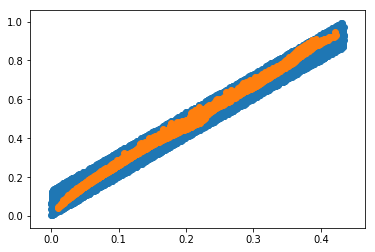

tensor(11.4193, grad_fn=<AddBackward0>)
X_sample tensor([[0.2812, 0.6316],
        [0.0656, 0.1973],
        [0.3478, 0.7708],
        ...,
        [0.2042, 0.4847],
        [0.2610, 0.5998],
        [0.1600, 0.3967]])


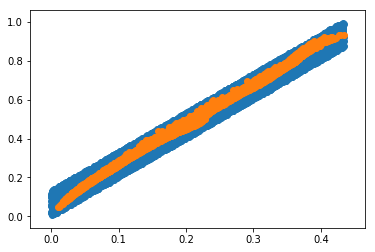

tensor(11.4020, grad_fn=<AddBackward0>)
X_sample tensor([[0.0962, 0.2561],
        [0.1332, 0.3349],
        [0.1877, 0.4430],
        ...,
        [0.1816, 0.4482],
        [0.2944, 0.6541],
        [0.0698, 0.2060]])


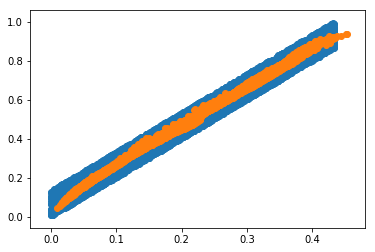

tensor(11.4292, grad_fn=<AddBackward0>)
X_sample tensor([[0.0969, 0.2621],
        [0.2869, 0.6340],
        [0.0598, 0.1903],
        ...,
        [0.3651, 0.7896],
        [0.2123, 0.4843],
        [0.3122, 0.6796]])


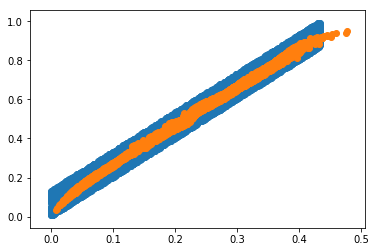

tensor(11.4110, grad_fn=<AddBackward0>)
X_sample tensor([[0.2422, 0.5552],
        [0.3545, 0.7808],
        [0.3809, 0.8599],
        ...,
        [0.0798, 0.2147],
        [0.3328, 0.7336],
        [0.3112, 0.6915]])


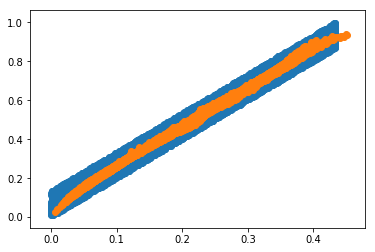

tensor(11.4622, grad_fn=<AddBackward0>)
X_sample tensor([[0.2724, 0.6278],
        [0.3553, 0.7861],
        [0.3057, 0.6953],
        ...,
        [0.3777, 0.8179],
        [0.1515, 0.3627],
        [0.0304, 0.1058]])


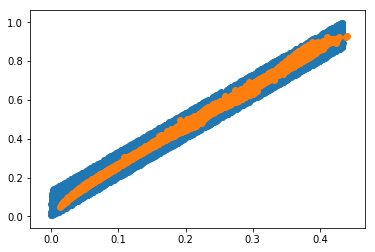

tensor(11.4297, grad_fn=<AddBackward0>)
X_sample tensor([[0.3029, 0.6672],
        [0.2743, 0.6272],
        [0.2938, 0.6603],
        ...,
        [0.2834, 0.6331],
        [0.2486, 0.5513],
        [0.3115, 0.6864]])


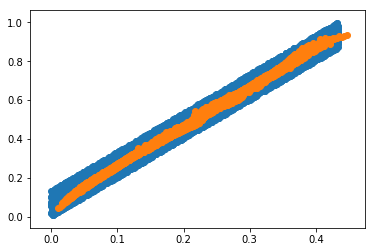

tensor(11.4715, grad_fn=<AddBackward0>)
X_sample tensor([[0.3266, 0.7091],
        [0.2045, 0.4606],
        [0.0521, 0.1618],
        ...,
        [0.3182, 0.6993],
        [0.3891, 0.8429],
        [0.3263, 0.7190]])


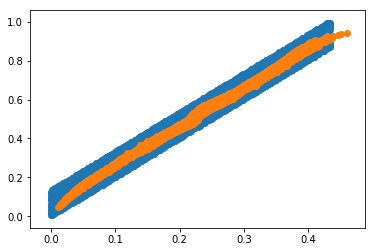

tensor(11.4122, grad_fn=<AddBackward0>)
X_sample tensor([[0.2497, 0.5826],
        [0.1228, 0.3140],
        [0.2787, 0.6260],
        ...,
        [0.0828, 0.2293],
        [0.2204, 0.4971],
        [0.3064, 0.6713]])


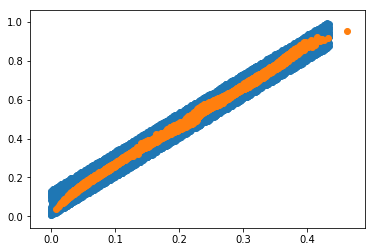

tensor(11.4329, grad_fn=<AddBackward0>)
X_sample tensor([[0.3475, 0.7634],
        [0.3597, 0.8012],
        [0.2829, 0.6430],
        ...,
        [0.1500, 0.3720],
        [0.3213, 0.7024],
        [0.0631, 0.1989]])


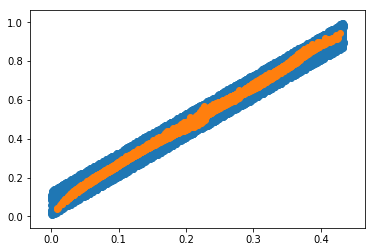

tensor(11.4718, grad_fn=<AddBackward0>)
X_sample tensor([[0.3128, 0.6797],
        [0.0321, 0.1167],
        [0.1237, 0.3262],
        ...,
        [0.1087, 0.2871],
        [0.2953, 0.6673],
        [0.2722, 0.6199]])


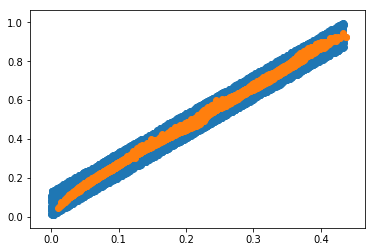

tensor(11.4608, grad_fn=<AddBackward0>)
X_sample tensor([[0.1139, 0.3034],
        [0.1945, 0.4510],
        [0.1457, 0.3578],
        ...,
        [0.1314, 0.3370],
        [0.3873, 0.8460],
        [0.3539, 0.7684]])


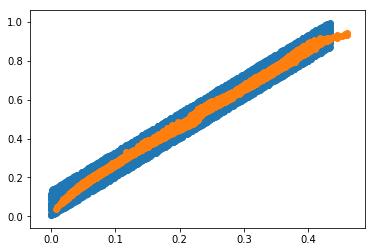

tensor(11.4127, grad_fn=<AddBackward0>)
X_sample tensor([[0.0316, 0.1122],
        [0.2405, 0.5442],
        [0.0952, 0.2659],
        ...,
        [0.0816, 0.2267],
        [0.1106, 0.2899],
        [0.2034, 0.4747]])


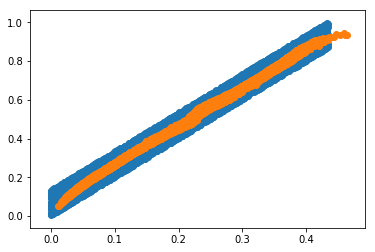

tensor(11.4388, grad_fn=<AddBackward0>)
X_sample tensor([[0.2230, 0.5033],
        [0.2404, 0.5380],
        [0.1517, 0.3692],
        ...,
        [0.2016, 0.4567],
        [0.1934, 0.4579],
        [0.2845, 0.6370]])


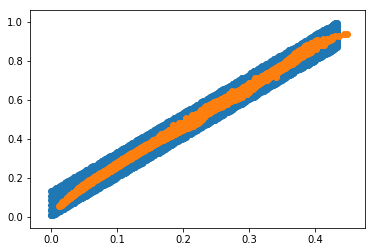

tensor(11.4557, grad_fn=<AddBackward0>)
X_sample tensor([[0.2296, 0.5212],
        [0.3209, 0.7095],
        [0.4377, 0.9303],
        ...,
        [0.2939, 0.6688],
        [0.1251, 0.3092],
        [0.2050, 0.4756]])


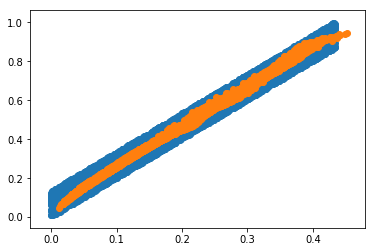

tensor(11.4198, grad_fn=<AddBackward0>)
X_sample tensor([[0.1698, 0.3971],
        [0.3350, 0.7392],
        [0.2558, 0.5921],
        ...,
        [0.3212, 0.7076],
        [0.1447, 0.3555],
        [0.0780, 0.2253]])


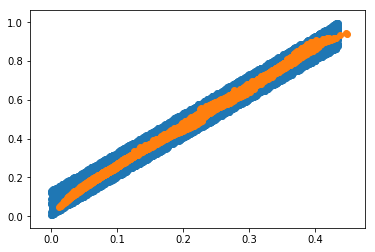

tensor(11.4260, grad_fn=<AddBackward0>)
X_sample tensor([[0.2936, 0.6390],
        [0.2947, 0.6615],
        [0.3745, 0.7945],
        ...,
        [0.3502, 0.7673],
        [0.2004, 0.4540],
        [0.3823, 0.8366]])


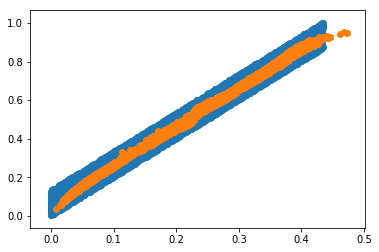

tensor(11.4067, grad_fn=<AddBackward0>)
X_sample tensor([[0.1639, 0.3977],
        [0.3776, 0.8315],
        [0.3839, 0.8505],
        ...,
        [0.3508, 0.7726],
        [0.3245, 0.7200],
        [0.3862, 0.8502]])


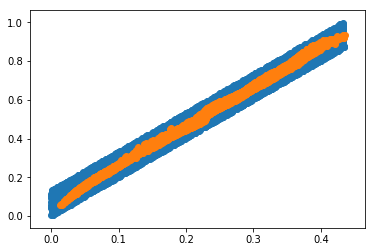

tensor(11.3857, grad_fn=<AddBackward0>)
X_sample tensor([[0.1980, 0.4536],
        [0.2118, 0.4847],
        [0.1286, 0.3328],
        ...,
        [0.2894, 0.6581],
        [0.0711, 0.2060],
        [0.0293, 0.1026]])


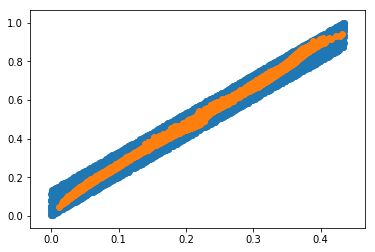

tensor(11.4372, grad_fn=<AddBackward0>)
X_sample tensor([[0.0862, 0.2305],
        [0.3555, 0.7938],
        [0.1507, 0.3671],
        ...,
        [0.2161, 0.4926],
        [0.2137, 0.4874],
        [0.2710, 0.6174]])


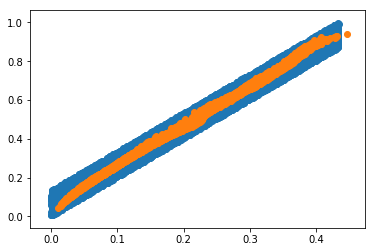

tensor(11.3962, grad_fn=<AddBackward0>)
X_sample tensor([[0.2955, 0.6420],
        [0.0891, 0.2476],
        [0.2726, 0.6160],
        ...,
        [0.1647, 0.3967],
        [0.1745, 0.4177],
        [0.3492, 0.7629]])


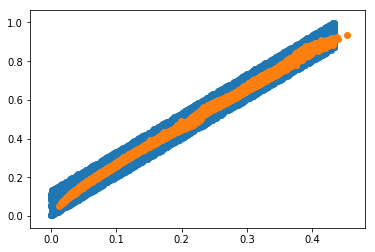

tensor(11.4178, grad_fn=<AddBackward0>)
X_sample tensor([[0.1991, 0.4663],
        [0.2190, 0.5077],
        [0.2136, 0.4806],
        ...,
        [0.2561, 0.5824],
        [0.4059, 0.8668],
        [0.0974, 0.2575]])


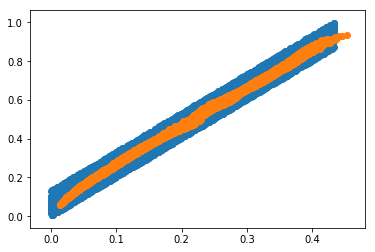

tensor(11.4391, grad_fn=<AddBackward0>)
X_sample tensor([[0.1398, 0.3636],
        [0.2697, 0.6168],
        [0.2031, 0.4773],
        ...,
        [0.2613, 0.5978],
        [0.2814, 0.6290],
        [0.3713, 0.8238]])


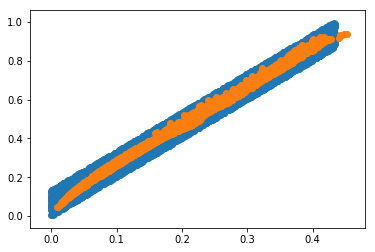

tensor(11.4040, grad_fn=<AddBackward0>)
X_sample tensor([[0.0932, 0.2521],
        [0.3638, 0.7907],
        [0.2951, 0.6582],
        ...,
        [0.3309, 0.7304],
        [0.1151, 0.3051],
        [0.1322, 0.3323]])


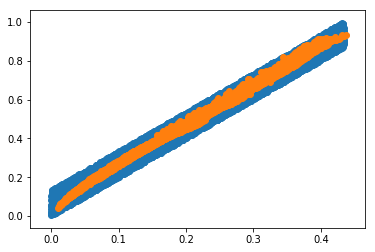

tensor(11.4074, grad_fn=<AddBackward0>)
X_sample tensor([[0.3986, 0.8652],
        [0.0662, 0.1965],
        [0.3543, 0.7795],
        ...,
        [0.1934, 0.4488],
        [0.1550, 0.3754],
        [0.2414, 0.5659]])


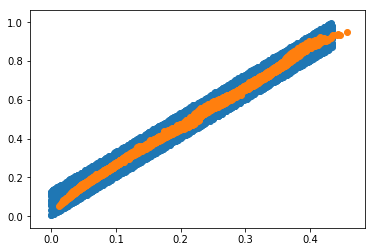

tensor(11.4012, grad_fn=<AddBackward0>)
X_sample tensor([[0.2283, 0.5158],
        [0.0527, 0.1621],
        [0.3169, 0.6908],
        ...,
        [0.1481, 0.3447],
        [0.1926, 0.4497],
        [0.3017, 0.6627]])


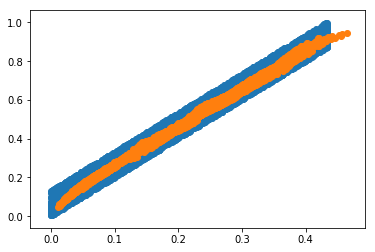

tensor(11.4332, grad_fn=<AddBackward0>)
X_sample tensor([[0.2035, 0.4503],
        [0.0716, 0.2178],
        [0.2118, 0.4968],
        ...,
        [0.2561, 0.5721],
        [0.3642, 0.7908],
        [0.0559, 0.1720]])


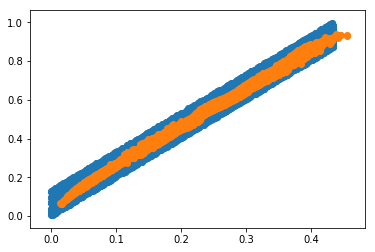

tensor(11.4407, grad_fn=<AddBackward0>)
X_sample tensor([[0.2234, 0.5149],
        [0.1507, 0.3700],
        [0.1974, 0.4572],
        ...,
        [0.3204, 0.7082],
        [0.3780, 0.8404],
        [0.2491, 0.5638]])


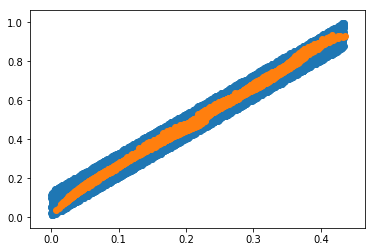

tensor(11.4395, grad_fn=<AddBackward0>)
X_sample tensor([[0.3971, 0.8814],
        [0.3820, 0.8580],
        [0.2494, 0.5730],
        ...,
        [0.2345, 0.5356],
        [0.1566, 0.3809],
        [0.3419, 0.7687]])


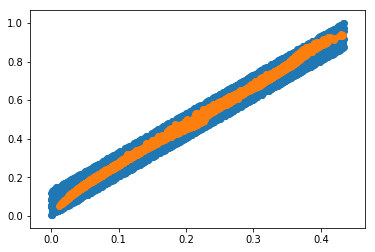

tensor(11.4330, grad_fn=<AddBackward0>)
X_sample tensor([[0.0444, 0.1458],
        [0.0715, 0.2015],
        [0.3416, 0.7639],
        ...,
        [0.2686, 0.6085],
        [0.3254, 0.7218],
        [0.2189, 0.5001]])


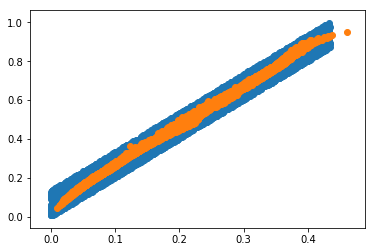

tensor(11.3911, grad_fn=<AddBackward0>)
X_sample tensor([[0.1870, 0.4266],
        [0.2989, 0.6651],
        [0.0882, 0.2402],
        ...,
        [0.3940, 0.8741],
        [0.0406, 0.1337],
        [0.3106, 0.6760]])


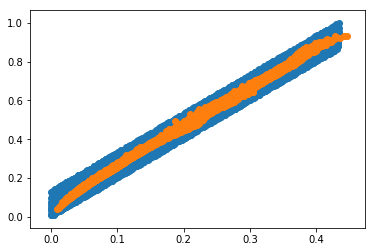

tensor(11.4006, grad_fn=<AddBackward0>)
X_sample tensor([[0.0577, 0.1748],
        [0.3073, 0.6785],
        [0.4315, 0.9153],
        ...,
        [0.3047, 0.6659],
        [0.1445, 0.3527],
        [0.2531, 0.5575]])


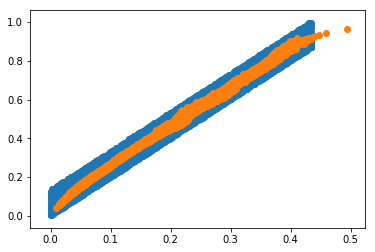

tensor(11.4288, grad_fn=<AddBackward0>)
X_sample tensor([[0.2724, 0.6094],
        [0.3732, 0.8044],
        [0.3632, 0.7841],
        ...,
        [0.1518, 0.3688],
        [0.0157, 0.0612],
        [0.2274, 0.5168]])


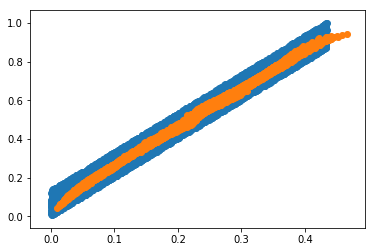

tensor(11.4532, grad_fn=<AddBackward0>)
X_sample tensor([[0.1751, 0.4151],
        [0.1450, 0.3593],
        [0.1866, 0.4300],
        ...,
        [0.0934, 0.2599],
        [0.2269, 0.5126],
        [0.1379, 0.3448]])


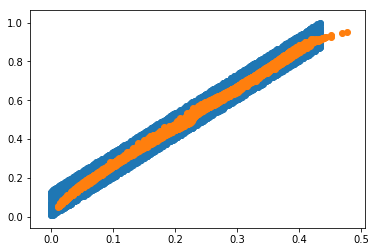

tensor(11.4183, grad_fn=<AddBackward0>)
X_sample tensor([[0.2387, 0.5443],
        [0.0638, 0.1945],
        [0.2480, 0.5652],
        ...,
        [0.3336, 0.7411],
        [0.2303, 0.5244],
        [0.0661, 0.1987]])


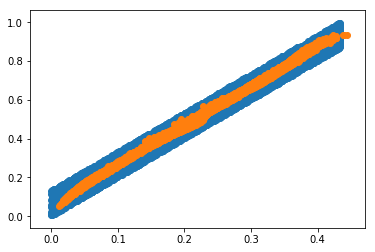

tensor(11.3946, grad_fn=<AddBackward0>)
X_sample tensor([[0.3085, 0.6899],
        [0.2844, 0.6468],
        [0.1071, 0.2845],
        ...,
        [0.0774, 0.2179],
        [0.0882, 0.2431],
        [0.2724, 0.6228]])


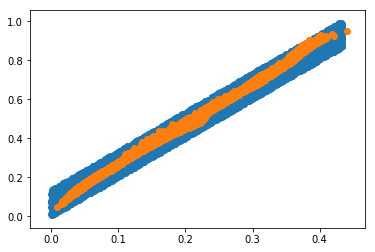

tensor(11.4111, grad_fn=<AddBackward0>)
X_sample tensor([[0.3461, 0.7829],
        [0.3446, 0.7780],
        [0.1226, 0.3151],
        ...,
        [0.2904, 0.6455],
        [0.3048, 0.6838],
        [0.0799, 0.2254]])


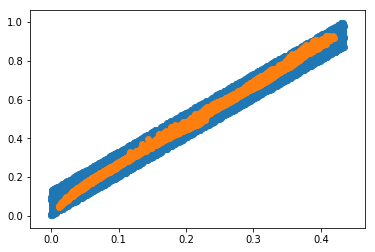

tensor(11.3895, grad_fn=<AddBackward0>)
X_sample tensor([[0.1648, 0.3937],
        [0.1779, 0.4124],
        [0.0555, 0.1676],
        ...,
        [0.1547, 0.3742],
        [0.3594, 0.7920],
        [0.0370, 0.1213]])


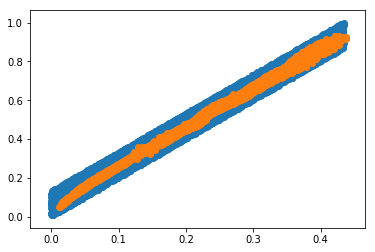

tensor(11.4082, grad_fn=<AddBackward0>)
X_sample tensor([[0.1121, 0.2922],
        [0.1288, 0.3205],
        [0.3748, 0.8009],
        ...,
        [0.3282, 0.7118],
        [0.1943, 0.4441],
        [0.3285, 0.7005]])


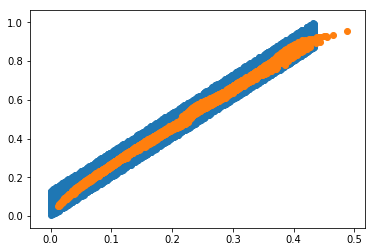

tensor(11.4400, grad_fn=<AddBackward0>)
X_sample tensor([[0.2055, 0.4809],
        [0.3670, 0.8079],
        [0.1219, 0.3108],
        ...,
        [0.2300, 0.5354],
        [0.3380, 0.7378],
        [0.2879, 0.6399]])


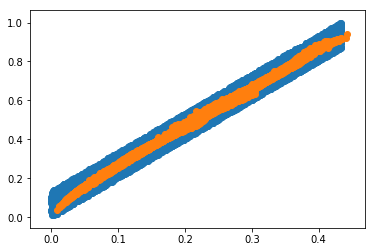

tensor(11.4373, grad_fn=<AddBackward0>)
X_sample tensor([[0.1304, 0.3404],
        [0.3550, 0.7870],
        [0.1993, 0.4626],
        ...,
        [0.1970, 0.4813],
        [0.3507, 0.7921],
        [0.1871, 0.4323]])


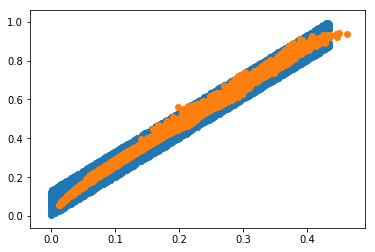

tensor(11.4309, grad_fn=<AddBackward0>)
X_sample tensor([[0.3212, 0.7019],
        [0.1407, 0.3584],
        [0.0618, 0.1856],
        ...,
        [0.3371, 0.7377],
        [0.1692, 0.4008],
        [0.1507, 0.3738]])


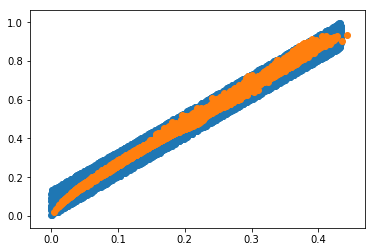

tensor(11.4412, grad_fn=<AddBackward0>)
X_sample tensor([[0.3908, 0.8808],
        [0.0520, 0.1671],
        [0.0337, 0.1202],
        ...,
        [0.1107, 0.2880],
        [0.2922, 0.6540],
        [0.0805, 0.2222]])


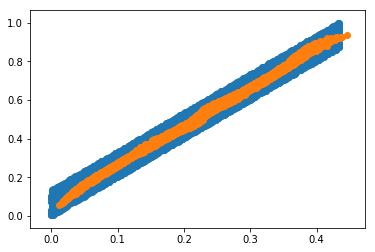

tensor(11.4406, grad_fn=<AddBackward0>)
X_sample tensor([[0.1629, 0.3954],
        [0.2753, 0.5963],
        [0.1647, 0.3994],
        ...,
        [0.1114, 0.2912],
        [0.3529, 0.7791],
        [0.2803, 0.6307]])


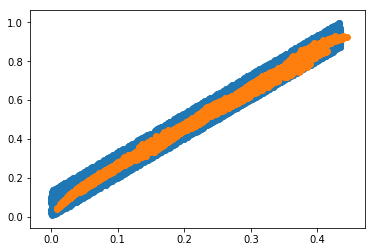

tensor(11.4476, grad_fn=<AddBackward0>)
X_sample tensor([[0.1897, 0.4301],
        [0.1385, 0.3463],
        [0.3582, 0.7853],
        ...,
        [0.3315, 0.7027],
        [0.2066, 0.4676],
        [0.0668, 0.1969]])


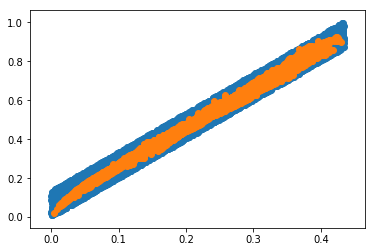

tensor(11.4466, grad_fn=<AddBackward0>)
X_sample tensor([[0.3390, 0.7612],
        [0.3489, 0.8000],
        [0.1677, 0.3934],
        ...,
        [0.2270, 0.5213],
        [0.1506, 0.3700],
        [0.0548, 0.1737]])


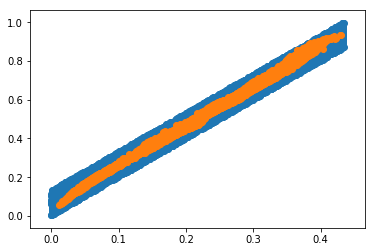

tensor(11.4910, grad_fn=<AddBackward0>)
X_sample tensor([[0.1466, 0.3646],
        [0.1482, 0.3610],
        [0.2577, 0.5900],
        ...,
        [0.1296, 0.3352],
        [0.1292, 0.3274],
        [0.1785, 0.4303]])


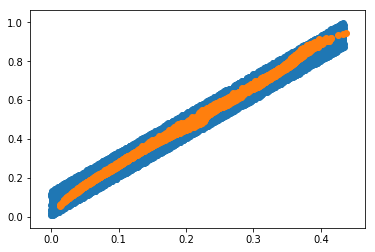

tensor(11.4590, grad_fn=<AddBackward0>)
X_sample tensor([[0.1175, 0.2988],
        [0.0789, 0.2177],
        [0.0794, 0.2265],
        ...,
        [0.3603, 0.7890],
        [0.3832, 0.8600],
        [0.3465, 0.7755]])


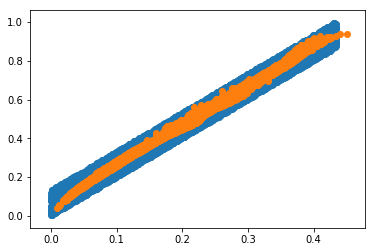

tensor(11.4217, grad_fn=<AddBackward0>)
X_sample tensor([[0.3307, 0.7219],
        [0.3130, 0.6861],
        [0.1689, 0.4107],
        ...,
        [0.1108, 0.2881],
        [0.3256, 0.7158],
        [0.3479, 0.7476]])


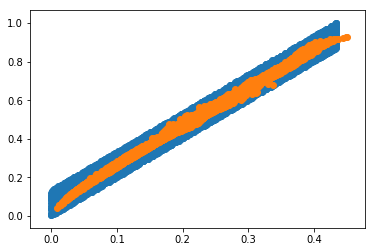

tensor(11.4212, grad_fn=<AddBackward0>)
X_sample tensor([[0.2978, 0.6650],
        [0.1563, 0.3700],
        [0.1434, 0.3648],
        ...,
        [0.3760, 0.8024],
        [0.2222, 0.5031],
        [0.0640, 0.1916]])


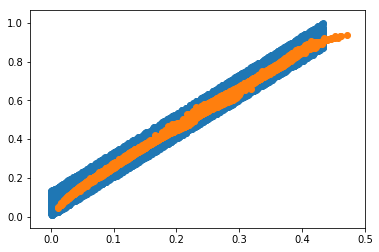

tensor(11.4227, grad_fn=<AddBackward0>)
X_sample tensor([[0.2795, 0.6191],
        [0.1201, 0.3023],
        [0.1917, 0.4466],
        ...,
        [0.3265, 0.7136],
        [0.3672, 0.7861],
        [0.1462, 0.3556]])


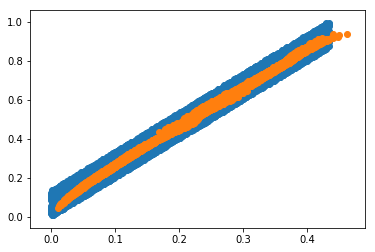

tensor(11.4495, grad_fn=<AddBackward0>)
X_sample tensor([[0.2386, 0.5386],
        [0.1652, 0.3993],
        [0.1835, 0.4421],
        ...,
        [0.2204, 0.5024],
        [0.2196, 0.5250],
        [0.3072, 0.6920]])


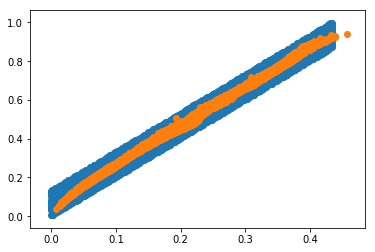

tensor(11.4532, grad_fn=<AddBackward0>)
X_sample tensor([[0.1517, 0.3761],
        [0.3378, 0.7609],
        [0.0862, 0.2388],
        ...,
        [0.2230, 0.4848],
        [0.0844, 0.2357],
        [0.2344, 0.5454]])


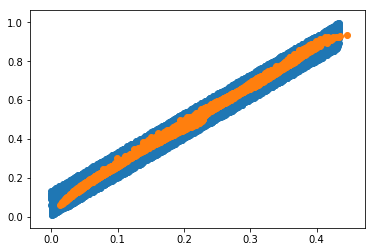

tensor(11.4658, grad_fn=<AddBackward0>)
X_sample tensor([[0.1953, 0.4540],
        [0.3288, 0.7392],
        [0.2941, 0.6637],
        ...,
        [0.3603, 0.7932],
        [0.2005, 0.4718],
        [0.3448, 0.7785]])


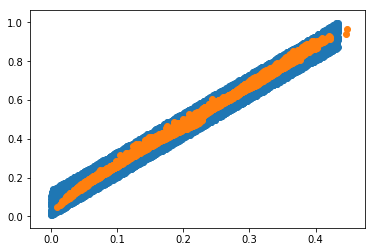

tensor(11.4350, grad_fn=<AddBackward0>)
X_sample tensor([[0.2473, 0.5847],
        [0.3655, 0.8065],
        [0.1116, 0.2905],
        ...,
        [0.1640, 0.3963],
        [0.1929, 0.4368],
        [0.0956, 0.2589]])


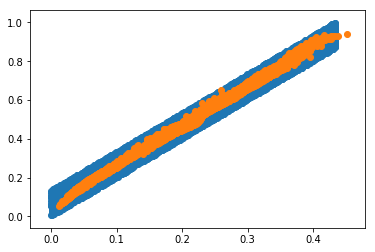

tensor(11.4118, grad_fn=<AddBackward0>)
X_sample tensor([[0.0995, 0.2672],
        [0.0489, 0.1548],
        [0.0720, 0.2082],
        ...,
        [0.1737, 0.4151],
        [0.1644, 0.3995],
        [0.3514, 0.7726]])


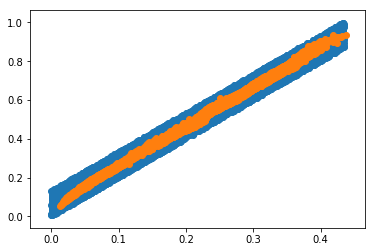

tensor(11.4240, grad_fn=<AddBackward0>)
X_sample tensor([[0.0570, 0.1748],
        [0.1643, 0.3947],
        [0.1997, 0.4609],
        ...,
        [0.2260, 0.5394],
        [0.1032, 0.2598],
        [0.3068, 0.6763]])


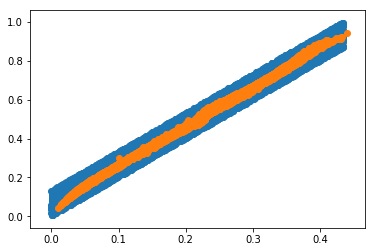

tensor(11.4255, grad_fn=<AddBackward0>)
X_sample tensor([[0.2768, 0.6189],
        [0.3821, 0.8424],
        [0.2412, 0.5358],
        ...,
        [0.1123, 0.2860],
        [0.2764, 0.6138],
        [0.1877, 0.4408]])


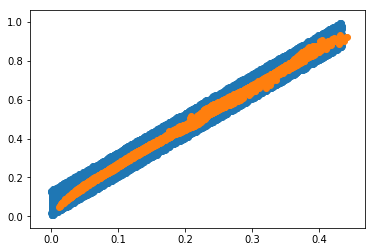

tensor(11.4351, grad_fn=<AddBackward0>)
X_sample tensor([[0.1070, 0.2768],
        [0.2972, 0.6546],
        [0.1235, 0.3184],
        ...,
        [0.3393, 0.7380],
        [0.1931, 0.4492],
        [0.1115, 0.2949]])


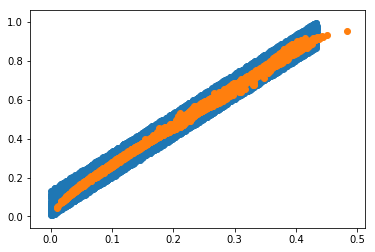

tensor(11.4634, grad_fn=<AddBackward0>)
X_sample tensor([[0.2851, 0.6348],
        [0.2503, 0.5804],
        [0.2352, 0.5262],
        ...,
        [0.2892, 0.6528],
        [0.3103, 0.6847],
        [0.3248, 0.7377]])


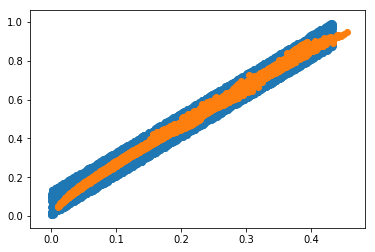

tensor(11.4310, grad_fn=<AddBackward0>)
X_sample tensor([[0.0419, 0.1457],
        [0.1069, 0.2842],
        [0.1695, 0.4055],
        ...,
        [0.1488, 0.3625],
        [0.1559, 0.3777],
        [0.2932, 0.6622]])


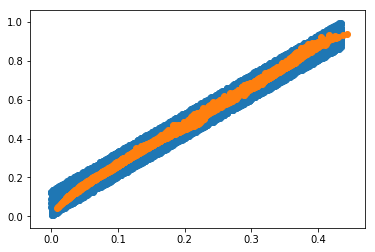

tensor(11.4000, grad_fn=<AddBackward0>)
X_sample tensor([[0.2111, 0.4872],
        [0.2817, 0.6392],
        [0.0967, 0.2652],
        ...,
        [0.2212, 0.5005],
        [0.2906, 0.6627],
        [0.3179, 0.6981]])


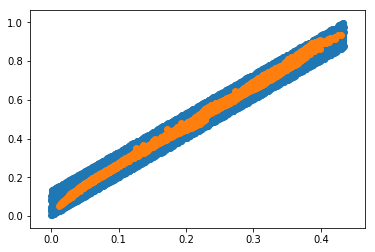

tensor(11.4266, grad_fn=<AddBackward0>)
X_sample tensor([[0.0493, 0.1572],
        [0.0358, 0.1211],
        [0.1594, 0.3772],
        ...,
        [0.1214, 0.3125],
        [0.2292, 0.5114],
        [0.1832, 0.4335]])


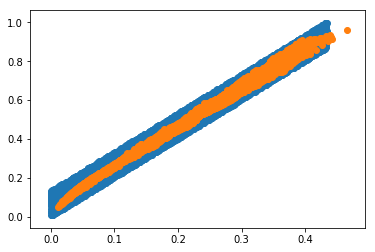

tensor(11.4398, grad_fn=<AddBackward0>)
X_sample tensor([[0.1514, 0.3688],
        [0.0826, 0.2238],
        [0.1257, 0.3249],
        ...,
        [0.1510, 0.3700],
        [0.1521, 0.3720],
        [0.0973, 0.2537]])


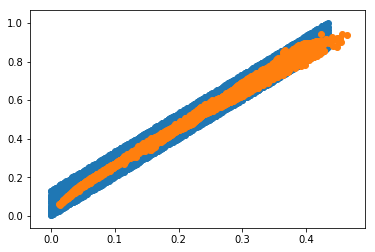

tensor(11.4347, grad_fn=<AddBackward0>)
X_sample tensor([[0.3913, 0.8471],
        [0.2050, 0.4667],
        [0.3709, 0.8230],
        ...,
        [0.3207, 0.6933],
        [0.2616, 0.5916],
        [0.2240, 0.5593]])


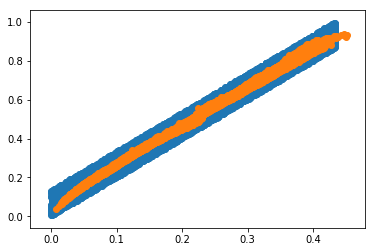

tensor(11.4530, grad_fn=<AddBackward0>)
X_sample tensor([[0.1428, 0.3823],
        [0.1841, 0.4576],
        [0.0754, 0.2171],
        ...,
        [0.3574, 0.7998],
        [0.1338, 0.3274],
        [0.1437, 0.3582]])


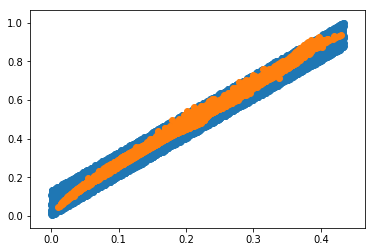

tensor(11.4377, grad_fn=<AddBackward0>)
X_sample tensor([[0.1646, 0.3978],
        [0.1319, 0.3244],
        [0.1191, 0.3294],
        ...,
        [0.3173, 0.7083],
        [0.3610, 0.8103],
        [0.2329, 0.5650]])


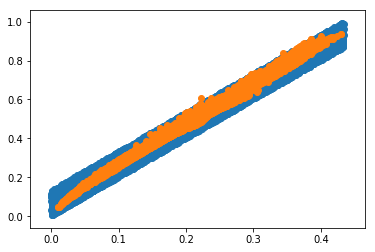

tensor(11.4284, grad_fn=<AddBackward0>)
X_sample tensor([[0.0467, 0.1470],
        [0.3663, 0.8100],
        [0.2464, 0.5589],
        ...,
        [0.2062, 0.4735],
        [0.2737, 0.6225],
        [0.1727, 0.4059]])


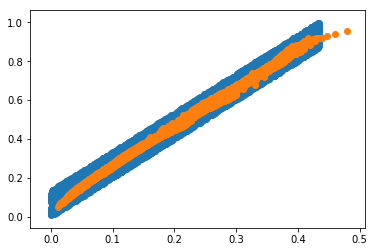

tensor(11.4222, grad_fn=<AddBackward0>)
X_sample tensor([[0.3533, 0.7611],
        [0.4117, 0.8710],
        [0.3249, 0.6993],
        ...,
        [0.1182, 0.3069],
        [0.2678, 0.5992],
        [0.0548, 0.1675]])


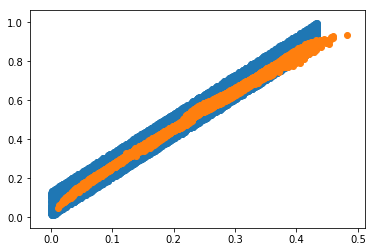

tensor(11.3833, grad_fn=<AddBackward0>)
X_sample tensor([[0.1819, 0.4268],
        [0.1289, 0.3314],
        [0.0522, 0.1605],
        ...,
        [0.1797, 0.4242],
        [0.1447, 0.3626],
        [0.1203, 0.3129]])


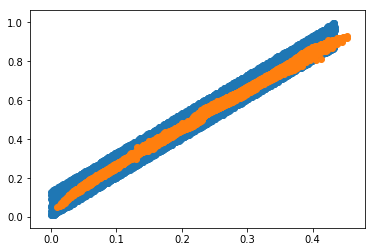

tensor(11.4192, grad_fn=<AddBackward0>)
X_sample tensor([[0.0695, 0.2064],
        [0.2021, 0.4672],
        [0.0572, 0.1770],
        ...,
        [0.1310, 0.3314],
        [0.2491, 0.5908],
        [0.2267, 0.5234]])


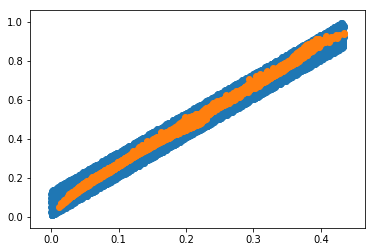

tensor(11.4297, grad_fn=<AddBackward0>)
X_sample tensor([[0.0393, 0.1358],
        [0.0930, 0.2634],
        [0.3415, 0.7603],
        ...,
        [0.2664, 0.6078],
        [0.0699, 0.2053],
        [0.2870, 0.6474]])


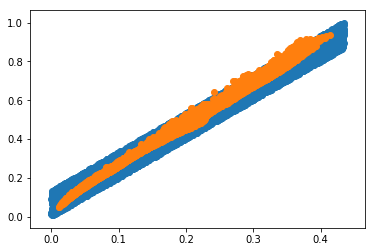

tensor(11.4524, grad_fn=<AddBackward0>)
X_sample tensor([[0.1458, 0.3515],
        [0.3385, 0.7444],
        [0.3395, 0.7712],
        ...,
        [0.0776, 0.2115],
        [0.2400, 0.5477],
        [0.1759, 0.4192]])


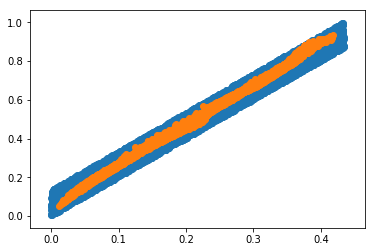

tensor(11.4733, grad_fn=<AddBackward0>)
X_sample tensor([[0.1255, 0.3214],
        [0.3845, 0.8407],
        [0.0567, 0.1668],
        ...,
        [0.0397, 0.1285],
        [0.1246, 0.2986],
        [0.1356, 0.3437]])


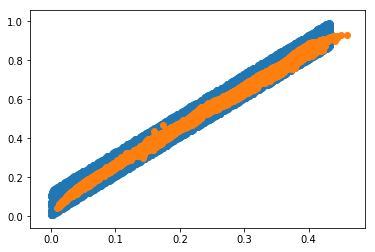

tensor(11.4469, grad_fn=<AddBackward0>)
X_sample tensor([[0.3442, 0.7468],
        [0.1888, 0.4172],
        [0.3467, 0.7380],
        ...,
        [0.3946, 0.8545],
        [0.3663, 0.7954],
        [0.1455, 0.3592]])


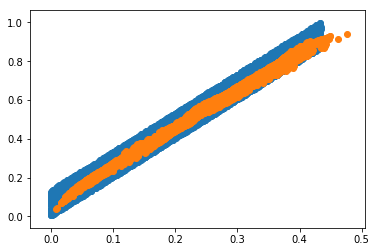

tensor(11.4198, grad_fn=<AddBackward0>)
X_sample tensor([[0.3451, 0.7546],
        [0.3170, 0.6842],
        [0.0513, 0.1627],
        ...,
        [0.1726, 0.4203],
        [0.2570, 0.5795],
        [0.1669, 0.4004]])


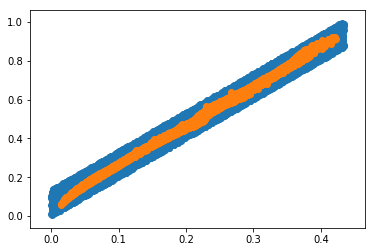

tensor(11.4005, grad_fn=<AddBackward0>)
X_sample tensor([[0.2361, 0.5293],
        [0.1019, 0.2755],
        [0.2264, 0.5185],
        ...,
        [0.1710, 0.4136],
        [0.3525, 0.7987],
        [0.0648, 0.1880]])


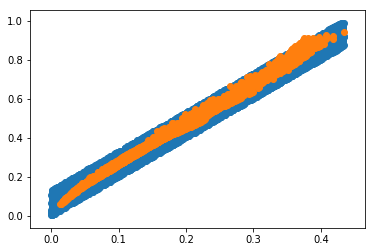

tensor(11.4204, grad_fn=<AddBackward0>)
X_sample tensor([[0.1176, 0.3009],
        [0.1980, 0.4538],
        [0.3621, 0.8084],
        ...,
        [0.1444, 0.3517],
        [0.1018, 0.2677],
        [0.3587, 0.7786]])


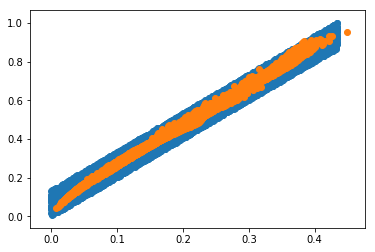

tensor(11.4598, grad_fn=<AddBackward0>)
X_sample tensor([[0.2961, 0.6584],
        [0.3036, 0.6714],
        [0.1130, 0.2972],
        ...,
        [0.2175, 0.4923],
        [0.1072, 0.2768],
        [0.2790, 0.6253]])


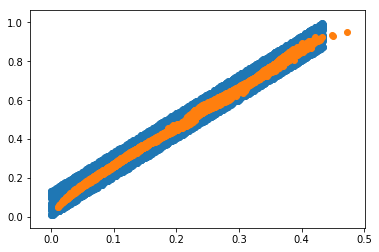

tensor(11.3816, grad_fn=<AddBackward0>)
X_sample tensor([[0.0723, 0.1993],
        [0.2559, 0.5954],
        [0.1744, 0.4134],
        ...,
        [0.3709, 0.7816],
        [0.1863, 0.4380],
        [0.2860, 0.6370]])


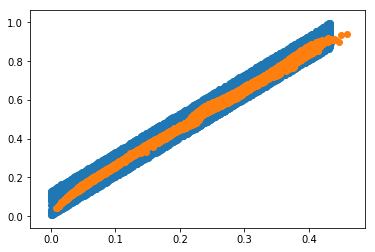

tensor(11.4500, grad_fn=<AddBackward0>)
X_sample tensor([[0.3778, 0.8365],
        [0.0597, 0.1803],
        [0.2466, 0.5515],
        ...,
        [0.3825, 0.8345],
        [0.2232, 0.5103],
        [0.2471, 0.5729]])


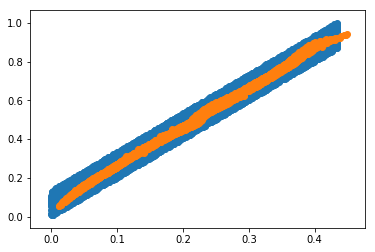

tensor(11.4114, grad_fn=<AddBackward0>)
X_sample tensor([[0.2311, 0.5484],
        [0.1529, 0.3751],
        [0.2744, 0.6360],
        ...,
        [0.0657, 0.2011],
        [0.2898, 0.6571],
        [0.4108, 0.9092]])


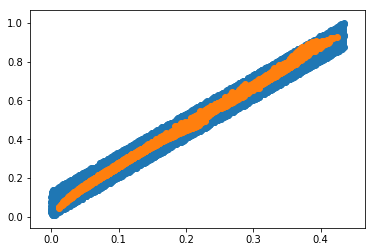

tensor(11.4307, grad_fn=<AddBackward0>)
X_sample tensor([[0.1052, 0.2751],
        [0.4069, 0.8962],
        [0.3652, 0.8027],
        ...,
        [0.0826, 0.2370],
        [0.2867, 0.6508],
        [0.2251, 0.5136]])


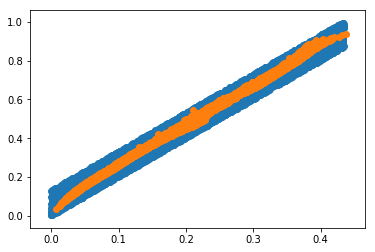

tensor(11.4406, grad_fn=<AddBackward0>)
X_sample tensor([[0.3218, 0.6994],
        [0.2000, 0.4637],
        [0.2848, 0.6408],
        ...,
        [0.1873, 0.4490],
        [0.1573, 0.3838],
        [0.3614, 0.7831]])


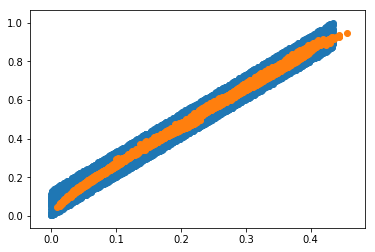

tensor(11.4184, grad_fn=<AddBackward0>)
X_sample tensor([[0.2044, 0.4608],
        [0.0383, 0.1308],
        [0.1041, 0.2771],
        ...,
        [0.0604, 0.1854],
        [0.2244, 0.5037],
        [0.2287, 0.4978]])


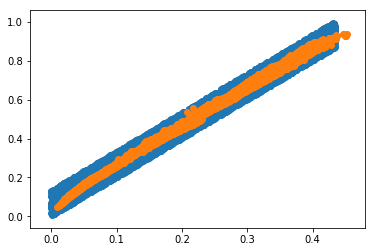

tensor(11.4084, grad_fn=<AddBackward0>)
X_sample tensor([[0.3227, 0.7129],
        [0.2753, 0.6286],
        [0.2769, 0.6206],
        ...,
        [0.2390, 0.5479],
        [0.3817, 0.8368],
        [0.0648, 0.1878]])


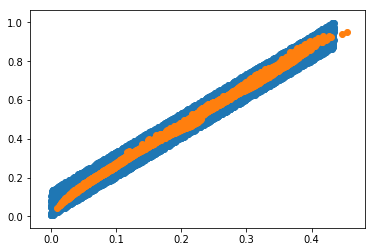

tensor(11.4204, grad_fn=<AddBackward0>)
X_sample tensor([[0.3258, 0.7284],
        [0.3413, 0.7567],
        [0.1606, 0.3903],
        ...,
        [0.3151, 0.7071],
        [0.1359, 0.3432],
        [0.3499, 0.7824]])


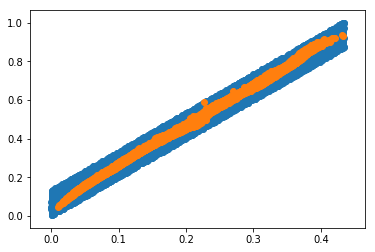

tensor(11.3998, grad_fn=<AddBackward0>)
X_sample tensor([[0.3387, 0.7492],
        [0.0380, 0.1263],
        [0.2167, 0.4717],
        ...,
        [0.1628, 0.3939],
        [0.3350, 0.7311],
        [0.3651, 0.7998]])


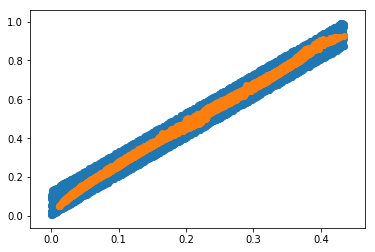

tensor(11.4253, grad_fn=<AddBackward0>)
X_sample tensor([[0.3887, 0.8418],
        [0.1530, 0.3785],
        [0.0622, 0.1798],
        ...,
        [0.3452, 0.7458],
        [0.2210, 0.4889],
        [0.0852, 0.2331]])


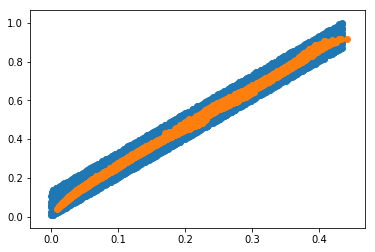

tensor(11.4236, grad_fn=<AddBackward0>)
X_sample tensor([[0.3136, 0.6953],
        [0.1434, 0.3571],
        [0.3170, 0.6958],
        ...,
        [0.0967, 0.2622],
        [0.2521, 0.5710],
        [0.3186, 0.6968]])


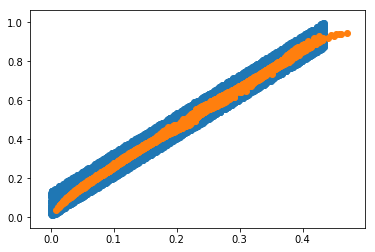

tensor(11.4084, grad_fn=<AddBackward0>)
X_sample tensor([[0.2290, 0.5253],
        [0.3345, 0.7353],
        [0.2950, 0.6550],
        ...,
        [0.0995, 0.2655],
        [0.3771, 0.8163],
        [0.1512, 0.3689]])


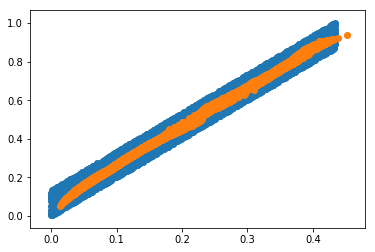

tensor(11.4234, grad_fn=<AddBackward0>)
X_sample tensor([[0.0644, 0.1947],
        [0.1184, 0.3041],
        [0.2733, 0.6178],
        ...,
        [0.3951, 0.8792],
        [0.2327, 0.5383],
        [0.2768, 0.6295]])


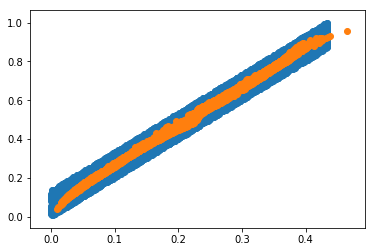

tensor(11.4598, grad_fn=<AddBackward0>)
X_sample tensor([[0.3034, 0.6826],
        [0.1925, 0.4494],
        [0.1250, 0.3239],
        ...,
        [0.1272, 0.3254],
        [0.2906, 0.6620],
        [0.3644, 0.8154]])


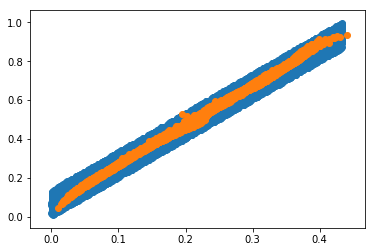

tensor(11.4223, grad_fn=<AddBackward0>)
X_sample tensor([[0.0707, 0.2141],
        [0.3475, 0.7757],
        [0.2614, 0.6065],
        ...,
        [0.2056, 0.4745],
        [0.0746, 0.2124],
        [0.2396, 0.5547]])


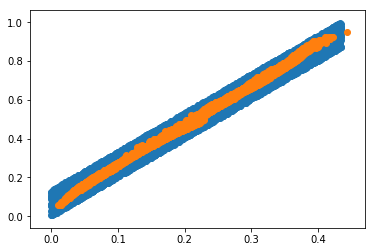

tensor(11.4264, grad_fn=<AddBackward0>)
X_sample tensor([[0.1304, 0.3285],
        [0.2399, 0.5507],
        [0.1622, 0.3947],
        ...,
        [0.1499, 0.3745],
        [0.3027, 0.6893],
        [0.2010, 0.4625]])


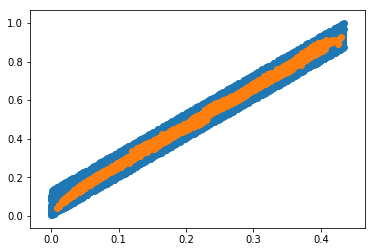

tensor(11.4057, grad_fn=<AddBackward0>)
X_sample tensor([[0.0302, 0.1159],
        [0.3799, 0.8321],
        [0.0755, 0.2248],
        ...,
        [0.1391, 0.3509],
        [0.2457, 0.5482],
        [0.3497, 0.7603]])


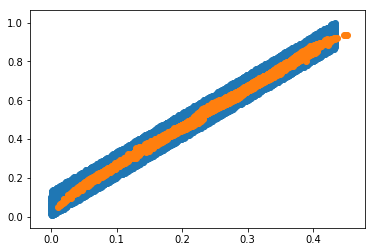

tensor(11.3832, grad_fn=<AddBackward0>)
X_sample tensor([[0.3186, 0.7034],
        [0.3622, 0.7868],
        [0.2204, 0.5061],
        ...,
        [0.0368, 0.1269],
        [0.2696, 0.5873],
        [0.1635, 0.3968]])


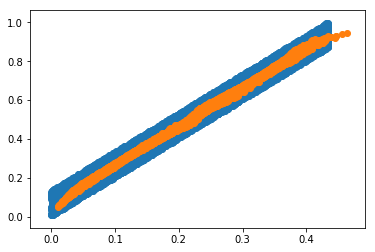

tensor(11.4227, grad_fn=<AddBackward0>)
X_sample tensor([[0.3509, 0.7646],
        [0.1697, 0.4028],
        [0.1448, 0.3524],
        ...,
        [0.1047, 0.2790],
        [0.3543, 0.7927],
        [0.0844, 0.2417]])


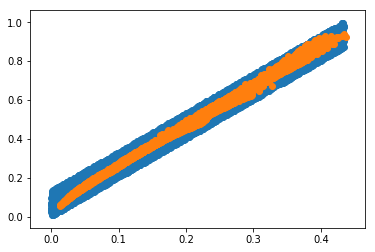

tensor(11.4145, grad_fn=<AddBackward0>)
X_sample tensor([[0.0318, 0.1147],
        [0.3206, 0.7028],
        [0.0531, 0.1604],
        ...,
        [0.3358, 0.7391],
        [0.0671, 0.1995],
        [0.2192, 0.5061]])


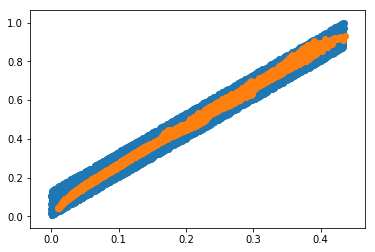

tensor(11.4293, grad_fn=<AddBackward0>)
X_sample tensor([[0.2130, 0.4898],
        [0.2012, 0.4688],
        [0.1208, 0.3122],
        ...,
        [0.2070, 0.4796],
        [0.1189, 0.3054],
        [0.1534, 0.3750]])


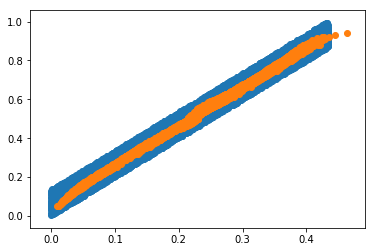

tensor(11.4312, grad_fn=<AddBackward0>)
X_sample tensor([[0.2889, 0.6505],
        [0.3383, 0.7532],
        [0.3010, 0.6727],
        ...,
        [0.0939, 0.2596],
        [0.0921, 0.2426],
        [0.0978, 0.2556]])


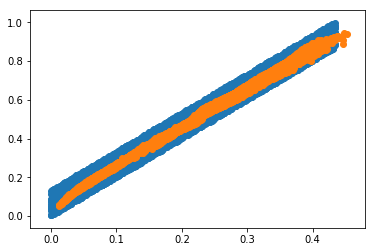

tensor(11.4280, grad_fn=<AddBackward0>)
X_sample tensor([[0.2276, 0.5210],
        [0.3221, 0.7236],
        [0.0855, 0.2320],
        ...,
        [0.1189, 0.3102],
        [0.0529, 0.1634],
        [0.0348, 0.1244]])


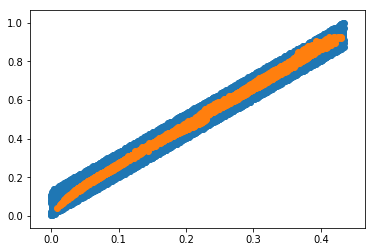

tensor(11.4101, grad_fn=<AddBackward0>)
X_sample tensor([[0.2014, 0.4609],
        [0.0207, 0.0852],
        [0.3480, 0.7787],
        ...,
        [0.0779, 0.2243],
        [0.1906, 0.4395],
        [0.0667, 0.1932]])


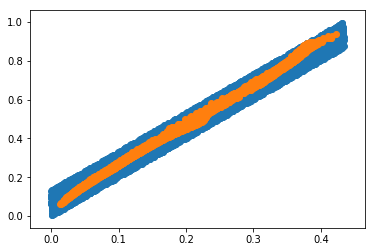

tensor(11.4396, grad_fn=<AddBackward0>)
X_sample tensor([[0.1591, 0.3870],
        [0.0858, 0.2341],
        [0.2738, 0.6109],
        ...,
        [0.2369, 0.5422],
        [0.1629, 0.3996],
        [0.3636, 0.8012]])


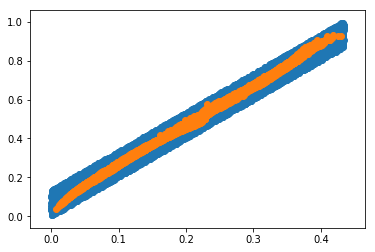

tensor(11.3903, grad_fn=<AddBackward0>)
X_sample tensor([[0.3155, 0.6838],
        [0.3326, 0.7258],
        [0.0315, 0.1178],
        ...,
        [0.3072, 0.6831],
        [0.3099, 0.6889],
        [0.3255, 0.7080]])


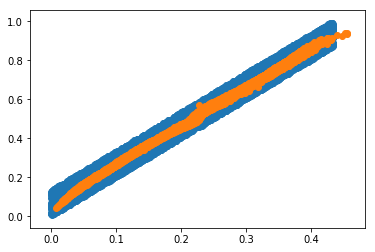

tensor(11.4379, grad_fn=<AddBackward0>)
X_sample tensor([[0.0496, 0.1645],
        [0.1507, 0.3741],
        [0.2321, 0.5295],
        ...,
        [0.0399, 0.1398],
        [0.0527, 0.1672],
        [0.2330, 0.5457]])


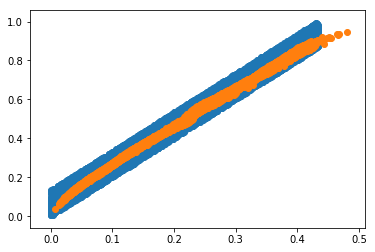

tensor(11.4397, grad_fn=<AddBackward0>)
X_sample tensor([[0.1256, 0.3269],
        [0.0396, 0.1326],
        [0.3891, 0.8403],
        ...,
        [0.1513, 0.3750],
        [0.3407, 0.7480],
        [0.3531, 0.7762]])


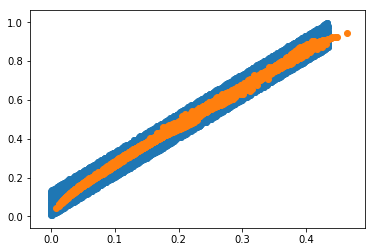

tensor(11.4390, grad_fn=<AddBackward0>)
X_sample tensor([[0.2028, 0.4771],
        [0.3344, 0.7359],
        [0.1841, 0.4383],
        ...,
        [0.2156, 0.4982],
        [0.2989, 0.6676],
        [0.2155, 0.4978]])


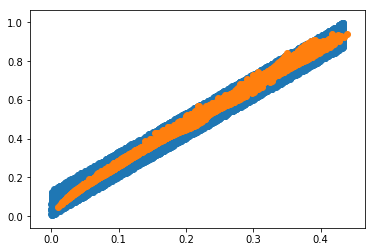

tensor(11.4220, grad_fn=<AddBackward0>)
X_sample tensor([[0.1545, 0.3838],
        [0.0590, 0.1770],
        [0.3659, 0.8524],
        ...,
        [0.2478, 0.5879],
        [0.3527, 0.7858],
        [0.1575, 0.3836]])


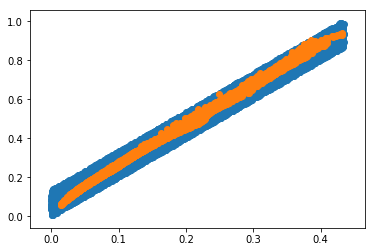

tensor(11.4426, grad_fn=<AddBackward0>)
X_sample tensor([[0.3479, 0.7531],
        [0.0413, 0.1383],
        [0.0900, 0.2302],
        ...,
        [0.0878, 0.2364],
        [0.1203, 0.3129],
        [0.3905, 0.8569]])


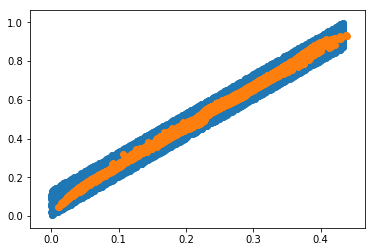

tensor(11.4207, grad_fn=<AddBackward0>)
X_sample tensor([[0.3186, 0.6930],
        [0.0730, 0.2064],
        [0.1384, 0.3488],
        ...,
        [0.3463, 0.7339],
        [0.1362, 0.3398],
        [0.3370, 0.7390]])


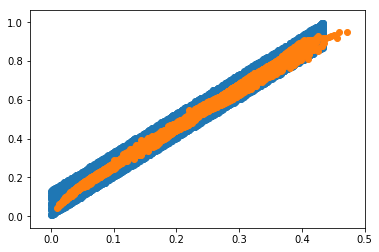

tensor(11.4455, grad_fn=<AddBackward0>)
X_sample tensor([[0.1919, 0.4406],
        [0.0500, 0.1581],
        [0.2300, 0.5183],
        ...,
        [0.2707, 0.5965],
        [0.3348, 0.7381],
        [0.2400, 0.5522]])


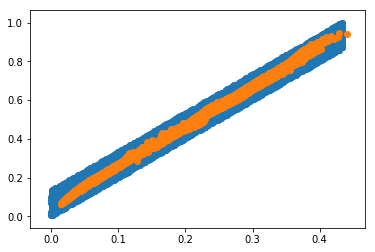

tensor(11.4682, grad_fn=<AddBackward0>)
X_sample tensor([[0.1835, 0.4337],
        [0.2845, 0.6371],
        [0.0545, 0.1642],
        ...,
        [0.0458, 0.1560],
        [0.3212, 0.7167],
        [0.0797, 0.2243]])


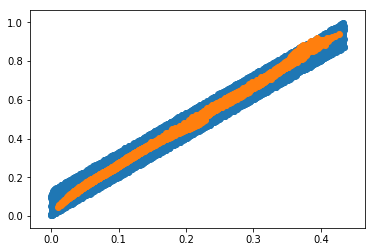

tensor(11.4397, grad_fn=<AddBackward0>)
X_sample tensor([[0.0446, 0.1512],
        [0.1075, 0.2792],
        [0.1634, 0.3933],
        ...,
        [0.2464, 0.5640],
        [0.2096, 0.4862],
        [0.2313, 0.5260]])


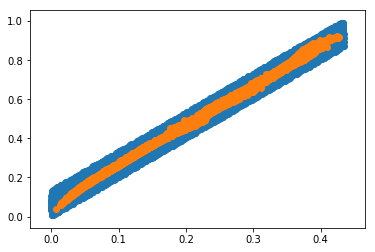

tensor(11.4207, grad_fn=<AddBackward0>)
X_sample tensor([[0.3419, 0.7366],
        [0.0794, 0.2285],
        [0.2524, 0.5837],
        ...,
        [0.3467, 0.7570],
        [0.2429, 0.5568],
        [0.3515, 0.7487]])


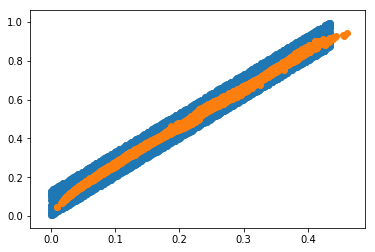

tensor(11.4554, grad_fn=<AddBackward0>)
X_sample tensor([[0.3738, 0.8047],
        [0.0743, 0.2167],
        [0.3665, 0.7991],
        ...,
        [0.0585, 0.1756],
        [0.3649, 0.7823],
        [0.2986, 0.6513]])


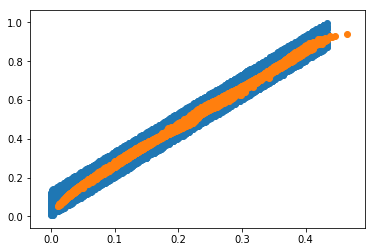

tensor(11.3704, grad_fn=<AddBackward0>)
X_sample tensor([[0.0410, 0.1412],
        [0.3755, 0.8277],
        [0.0828, 0.2441],
        ...,
        [0.3719, 0.8262],
        [0.1995, 0.4642],
        [0.3186, 0.7110]])


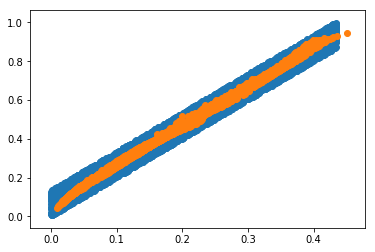

tensor(11.4743, grad_fn=<AddBackward0>)
X_sample tensor([[0.1044, 0.2741],
        [0.2335, 0.5277],
        [0.3230, 0.7134],
        ...,
        [0.0852, 0.2294],
        [0.3660, 0.8079],
        [0.2804, 0.6246]])


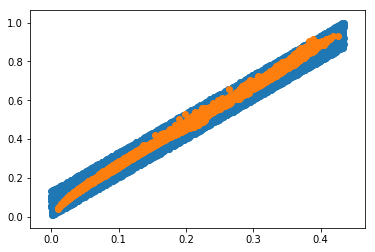

tensor(11.4055, grad_fn=<AddBackward0>)
X_sample tensor([[0.3160, 0.7008],
        [0.1065, 0.2775],
        [0.3667, 0.8133],
        ...,
        [0.3308, 0.7360],
        [0.0551, 0.1704],
        [0.1043, 0.2740]])


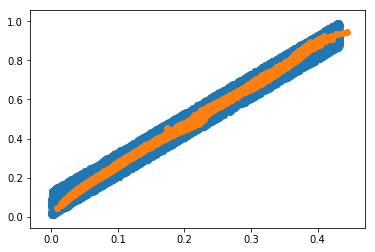

tensor(11.4239, grad_fn=<AddBackward0>)
X_sample tensor([[0.3877, 0.8568],
        [0.0158, 0.0661],
        [0.3104, 0.6982],
        ...,
        [0.2548, 0.5709],
        [0.2508, 0.5750],
        [0.1792, 0.4149]])


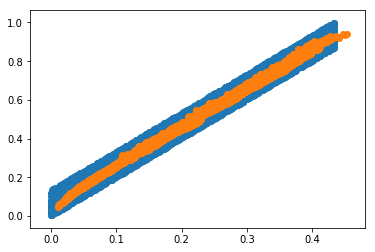

tensor(11.4157, grad_fn=<AddBackward0>)
X_sample tensor([[0.1345, 0.3369],
        [0.2651, 0.5807],
        [0.3456, 0.7643],
        ...,
        [0.3771, 0.8238],
        [0.1405, 0.3503],
        [0.1225, 0.3099]])


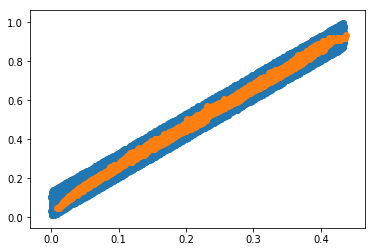

tensor(11.4129, grad_fn=<AddBackward0>)
X_sample tensor([[0.2554, 0.5793],
        [0.3672, 0.8095],
        [0.0362, 0.1271],
        ...,
        [0.2259, 0.5122],
        [0.2906, 0.6462],
        [0.2286, 0.5167]])


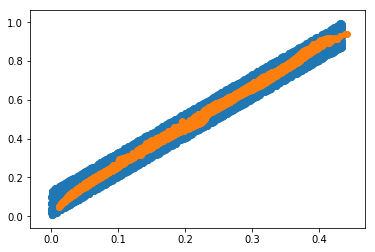

tensor(11.4642, grad_fn=<AddBackward0>)
X_sample tensor([[0.0407, 0.1368],
        [0.0950, 0.2576],
        [0.3179, 0.7089],
        ...,
        [0.0895, 0.2387],
        [0.3577, 0.7795],
        [0.0945, 0.2611]])


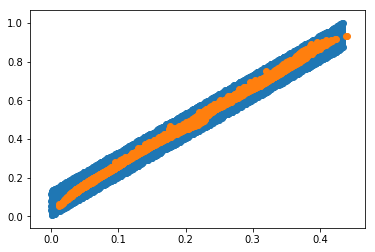

tensor(11.3938, grad_fn=<AddBackward0>)
X_sample tensor([[0.1443, 0.3580],
        [0.3683, 0.8475],
        [0.3521, 0.7818],
        ...,
        [0.3310, 0.7236],
        [0.1089, 0.2884],
        [0.3440, 0.7643]])


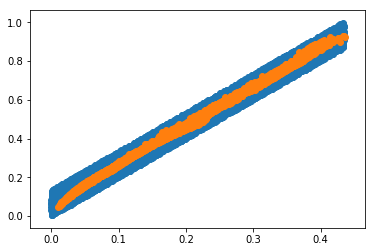

tensor(11.3785, grad_fn=<AddBackward0>)
X_sample tensor([[0.2355, 0.5443],
        [0.0854, 0.2422],
        [0.1900, 0.4336],
        ...,
        [0.0292, 0.1182],
        [0.2412, 0.5463],
        [0.1608, 0.3886]])


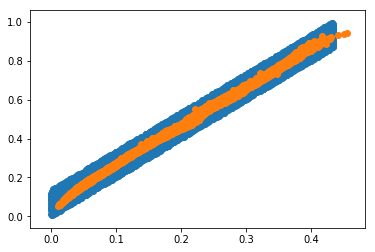

tensor(11.4072, grad_fn=<AddBackward0>)
X_sample tensor([[0.0503, 0.1625],
        [0.2322, 0.5295],
        [0.3257, 0.7097],
        ...,
        [0.3061, 0.6808],
        [0.0981, 0.2584],
        [0.3804, 0.8297]])


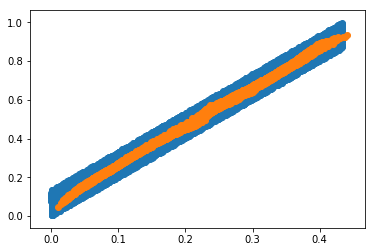

tensor(11.3875, grad_fn=<AddBackward0>)
X_sample tensor([[0.2957, 0.6585],
        [0.1002, 0.2663],
        [0.1370, 0.3451],
        ...,
        [0.3920, 0.8598],
        [0.0976, 0.2669],
        [0.3337, 0.7402]])


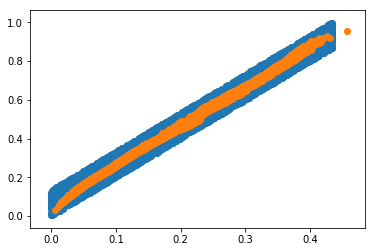

tensor(11.4270, grad_fn=<AddBackward0>)
X_sample tensor([[0.0648, 0.1929],
        [0.3393, 0.7461],
        [0.2801, 0.6232],
        ...,
        [0.0288, 0.1072],
        [0.3872, 0.8511],
        [0.2475, 0.5650]])


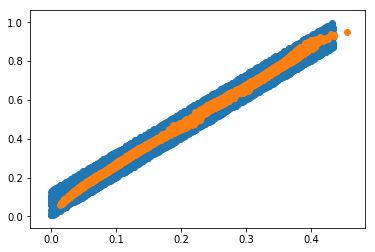

tensor(11.3919, grad_fn=<AddBackward0>)
X_sample tensor([[0.1662, 0.4031],
        [0.3033, 0.6638],
        [0.0647, 0.1854],
        ...,
        [0.3766, 0.8384],
        [0.0714, 0.2070],
        [0.0355, 0.1296]])


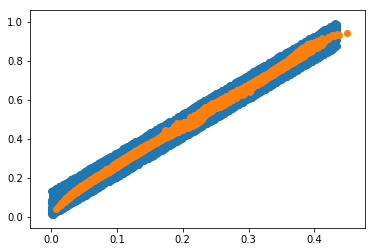

tensor(11.4066, grad_fn=<AddBackward0>)
X_sample tensor([[0.1168, 0.2990],
        [0.1867, 0.4427],
        [0.3413, 0.7482],
        ...,
        [0.0589, 0.1760],
        [0.2795, 0.6291],
        [0.0678, 0.2011]])


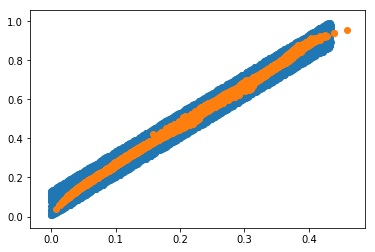

tensor(11.4063, grad_fn=<AddBackward0>)
X_sample tensor([[0.3295, 0.7263],
        [0.1142, 0.2993],
        [0.0510, 0.1666],
        ...,
        [0.2102, 0.5037],
        [0.3439, 0.7607],
        [0.2655, 0.6099]])


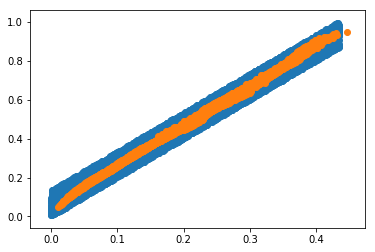

tensor(11.3774, grad_fn=<AddBackward0>)
X_sample tensor([[0.1480, 0.3699],
        [0.0604, 0.1804],
        [0.1804, 0.4314],
        ...,
        [0.1271, 0.3222],
        [0.3252, 0.7169],
        [0.1770, 0.4225]])


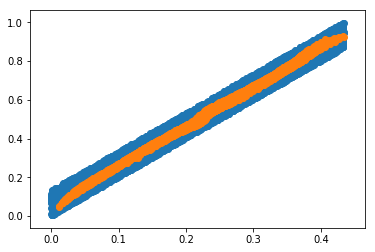

tensor(11.4330, grad_fn=<AddBackward0>)
X_sample tensor([[0.3609, 0.7929],
        [0.1115, 0.2917],
        [0.1382, 0.3429],
        ...,
        [0.0645, 0.1928],
        [0.2691, 0.6108],
        [0.2929, 0.6397]])


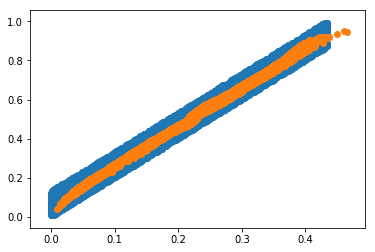

tensor(11.4372, grad_fn=<AddBackward0>)
X_sample tensor([[0.3980, 0.8855],
        [0.1318, 0.3322],
        [0.3905, 0.8662],
        ...,
        [0.0444, 0.1421],
        [0.2263, 0.5100],
        [0.1809, 0.4244]])


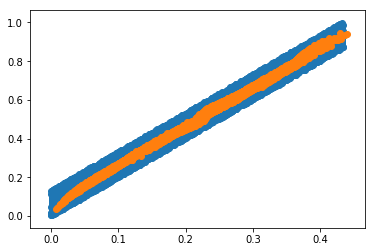

tensor(11.4407, grad_fn=<AddBackward0>)
X_sample tensor([[0.3022, 0.6729],
        [0.3748, 0.8336],
        [0.2250, 0.5105],
        ...,
        [0.3707, 0.8152],
        [0.3173, 0.7087],
        [0.1054, 0.2799]])


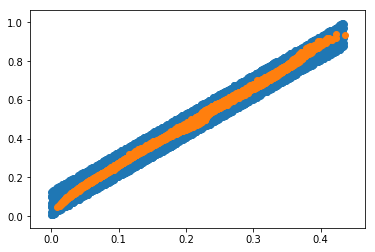

tensor(11.4185, grad_fn=<AddBackward0>)
X_sample tensor([[0.0557, 0.1753],
        [0.2630, 0.5892],
        [0.3581, 0.7867],
        ...,
        [0.1009, 0.2681],
        [0.0193, 0.0819],
        [0.3875, 0.8622]])


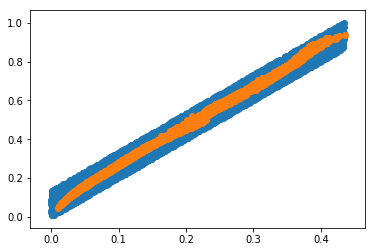

tensor(11.4588, grad_fn=<AddBackward0>)
X_sample tensor([[0.2488, 0.5663],
        [0.3055, 0.6856],
        [0.2225, 0.5022],
        ...,
        [0.0291, 0.1058],
        [0.0751, 0.2184],
        [0.1127, 0.2925]])


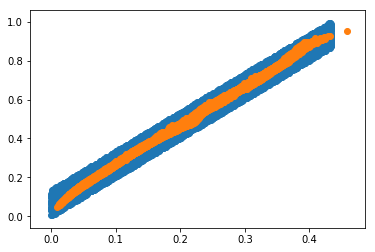

tensor(11.4385, grad_fn=<AddBackward0>)
X_sample tensor([[0.3827, 0.8322],
        [0.2790, 0.6245],
        [0.3463, 0.7517],
        ...,
        [0.0630, 0.1924],
        [0.3285, 0.7226],
        [0.4054, 0.8946]])


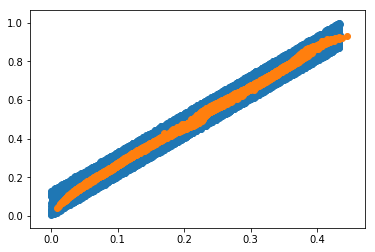

tensor(11.4269, grad_fn=<AddBackward0>)
X_sample tensor([[0.1932, 0.4562],
        [0.3305, 0.7252],
        [0.3996, 0.8641],
        ...,
        [0.2275, 0.5231],
        [0.0650, 0.1987],
        [0.1298, 0.3271]])


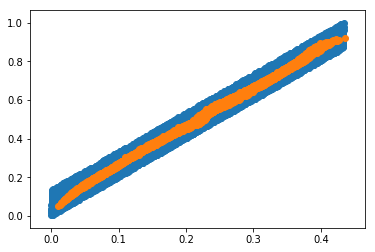

tensor(11.3853, grad_fn=<AddBackward0>)
X_sample tensor([[0.0350, 0.1253],
        [0.1024, 0.2680],
        [0.2060, 0.4808],
        ...,
        [0.1825, 0.4379],
        [0.0403, 0.1396],
        [0.3497, 0.7562]])


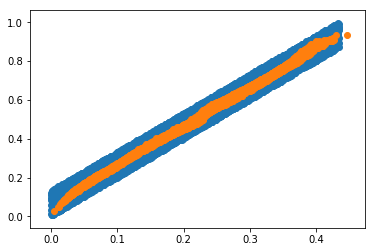

tensor(11.4226, grad_fn=<AddBackward0>)
X_sample tensor([[0.3894, 0.8512],
        [0.3570, 0.7920],
        [0.3734, 0.8116],
        ...,
        [0.1810, 0.4279],
        [0.0728, 0.2034],
        [0.2713, 0.6062]])


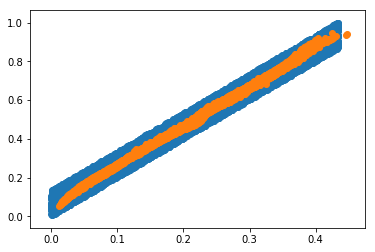

tensor(11.4083, grad_fn=<AddBackward0>)
X_sample tensor([[0.1237, 0.3327],
        [0.3407, 0.7415],
        [0.1371, 0.3487],
        ...,
        [0.2281, 0.5215],
        [0.1266, 0.3249],
        [0.1798, 0.4210]])


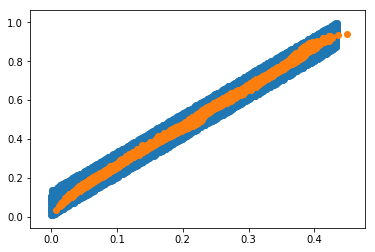

tensor(11.4522, grad_fn=<AddBackward0>)
X_sample tensor([[0.4124, 0.9033],
        [0.1954, 0.4515],
        [0.0412, 0.1457],
        ...,
        [0.2442, 0.5557],
        [0.1284, 0.3297],
        [0.3895, 0.8750]])


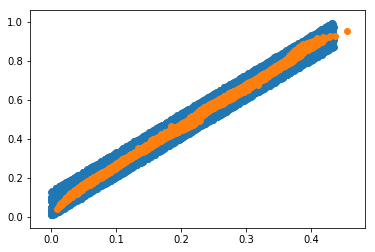

tensor(11.4261, grad_fn=<AddBackward0>)
X_sample tensor([[0.3514, 0.7736],
        [0.1522, 0.3756],
        [0.1318, 0.3357],
        ...,
        [0.1984, 0.4628],
        [0.0756, 0.2180],
        [0.3382, 0.7339]])


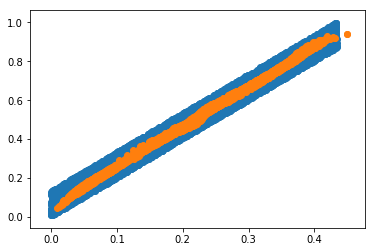

tensor(11.4021, grad_fn=<AddBackward0>)
X_sample tensor([[0.2935, 0.6551],
        [0.2598, 0.5959],
        [0.0698, 0.2008],
        ...,
        [0.2432, 0.5467],
        [0.3926, 0.8692],
        [0.2965, 0.6613]])


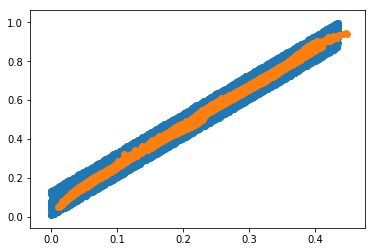

tensor(11.4421, grad_fn=<AddBackward0>)
X_sample tensor([[0.3059, 0.6764],
        [0.3651, 0.7941],
        [0.1247, 0.3198],
        ...,
        [0.2688, 0.6103],
        [0.3461, 0.7637],
        [0.2567, 0.5804]])


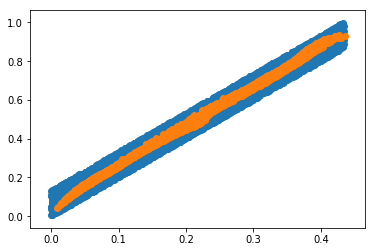

tensor(11.4119, grad_fn=<AddBackward0>)
X_sample tensor([[0.2006, 0.4666],
        [0.2334, 0.5284],
        [0.0500, 0.1643],
        ...,
        [0.1175, 0.3043],
        [0.0971, 0.2582],
        [0.3221, 0.7099]])


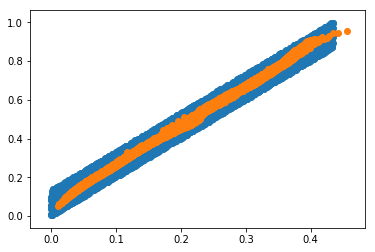

tensor(11.4113, grad_fn=<AddBackward0>)
X_sample tensor([[0.2570, 0.5944],
        [0.1621, 0.3895],
        [0.0782, 0.2263],
        ...,
        [0.3645, 0.8045],
        [0.2307, 0.5186],
        [0.3075, 0.6867]])


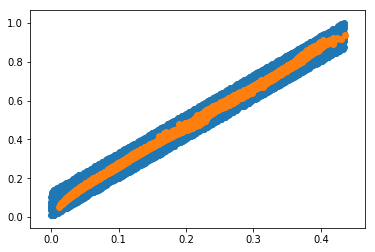

tensor(11.4218, grad_fn=<AddBackward0>)
X_sample tensor([[0.3422, 0.7378],
        [0.3737, 0.8258],
        [0.1120, 0.2932],
        ...,
        [0.3464, 0.7560],
        [0.3546, 0.7691],
        [0.2349, 0.5380]])


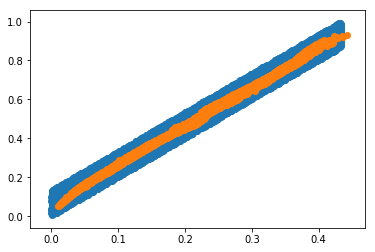

tensor(11.4039, grad_fn=<AddBackward0>)
X_sample tensor([[0.1011, 0.2713],
        [0.1614, 0.3958],
        [0.3413, 0.7346],
        ...,
        [0.1896, 0.4414],
        [0.1526, 0.3703],
        [0.1473, 0.3691]])


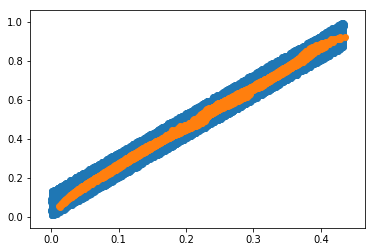

tensor(11.3791, grad_fn=<AddBackward0>)
X_sample tensor([[0.1062, 0.2781],
        [0.3263, 0.7222],
        [0.0875, 0.2315],
        ...,
        [0.3354, 0.7286],
        [0.1714, 0.4075],
        [0.0586, 0.1732]])


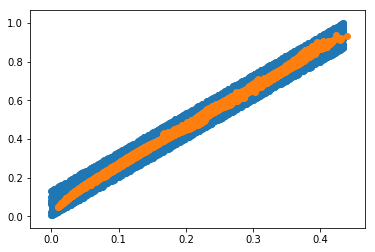

tensor(11.4347, grad_fn=<AddBackward0>)
X_sample tensor([[0.1619, 0.3887],
        [0.1575, 0.3774],
        [0.1702, 0.4080],
        ...,
        [0.3431, 0.7534],
        [0.2393, 0.5456],
        [0.2297, 0.5448]])


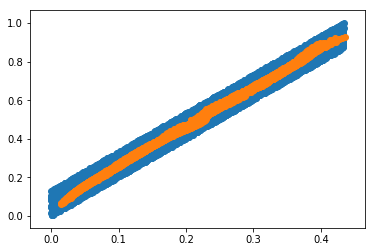

tensor(11.4367, grad_fn=<AddBackward0>)
X_sample tensor([[0.1979, 0.4633],
        [0.0616, 0.1807],
        [0.1359, 0.3374],
        ...,
        [0.1117, 0.2994],
        [0.0974, 0.2557],
        [0.0502, 0.1620]])


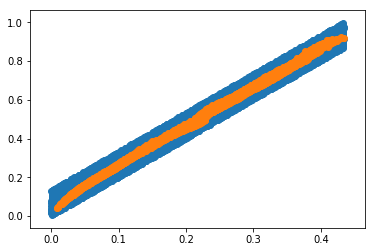

tensor(11.4199, grad_fn=<AddBackward0>)
X_sample tensor([[0.2509, 0.5677],
        [0.2019, 0.4520],
        [0.0509, 0.1584],
        ...,
        [0.0920, 0.2549],
        [0.3153, 0.6936],
        [0.0497, 0.1632]])


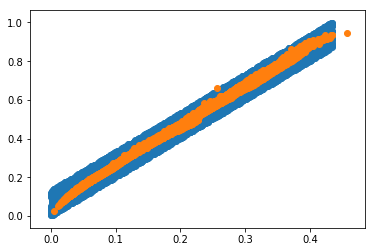

tensor(11.4386, grad_fn=<AddBackward0>)
X_sample tensor([[0.4047, 0.9047],
        [0.2913, 0.6548],
        [0.1553, 0.3827],
        ...,
        [0.3005, 0.6788],
        [0.2213, 0.5057],
        [0.2387, 0.5393]])


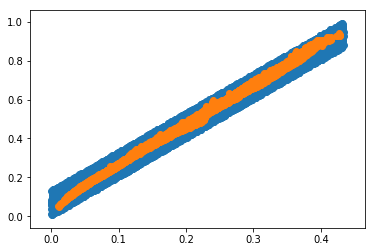

tensor(11.4272, grad_fn=<AddBackward0>)
X_sample tensor([[0.3704, 0.8283],
        [0.1616, 0.3913],
        [0.1521, 0.3778],
        ...,
        [0.3269, 0.7463],
        [0.1572, 0.3865],
        [0.2501, 0.5661]])


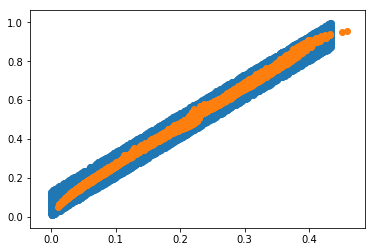

tensor(11.4536, grad_fn=<AddBackward0>)
X_sample tensor([[0.1357, 0.3443],
        [0.1294, 0.3363],
        [0.3535, 0.7598],
        ...,
        [0.3328, 0.7149],
        [0.2499, 0.5744],
        [0.1432, 0.3540]])


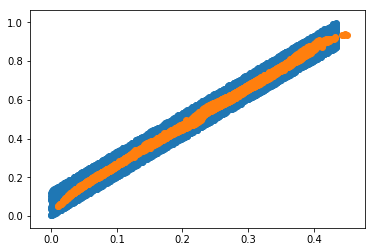

tensor(11.4238, grad_fn=<AddBackward0>)
X_sample tensor([[0.0637, 0.1912],
        [0.2474, 0.5639],
        [0.2405, 0.5664],
        ...,
        [0.0784, 0.2168],
        [0.2889, 0.6434],
        [0.3041, 0.6668]])


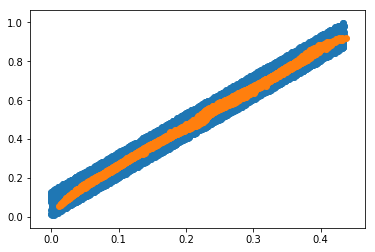

tensor(11.4524, grad_fn=<AddBackward0>)
X_sample tensor([[0.3201, 0.7105],
        [0.0932, 0.2514],
        [0.3629, 0.7930],
        ...,
        [0.1695, 0.3991],
        [0.2852, 0.6336],
        [0.0560, 0.1695]])


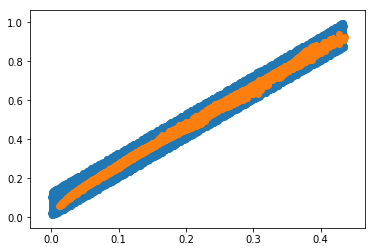

tensor(11.4428, grad_fn=<AddBackward0>)
X_sample tensor([[0.1677, 0.4022],
        [0.3744, 0.8349],
        [0.3905, 0.8608],
        ...,
        [0.1892, 0.4477],
        [0.2883, 0.6579],
        [0.2711, 0.6037]])


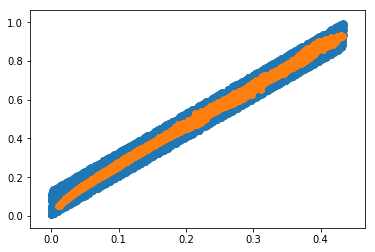

tensor(11.4443, grad_fn=<AddBackward0>)
X_sample tensor([[0.3170, 0.7008],
        [0.3511, 0.7607],
        [0.3948, 0.8802],
        ...,
        [0.2772, 0.6359],
        [0.3518, 0.7840],
        [0.0906, 0.2436]])


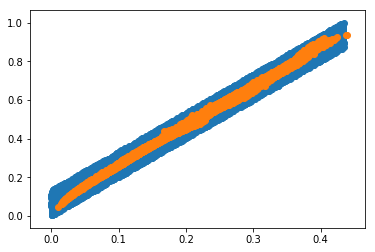

tensor(11.4641, grad_fn=<AddBackward0>)
X_sample tensor([[0.3255, 0.7143],
        [0.2286, 0.5287],
        [0.1876, 0.4374],
        ...,
        [0.3861, 0.8619],
        [0.1359, 0.3417],
        [0.2498, 0.5745]])


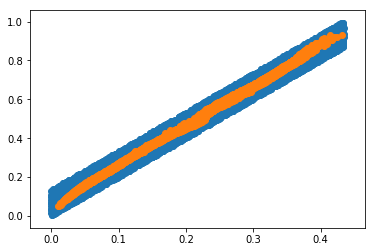

tensor(11.3918, grad_fn=<AddBackward0>)
X_sample tensor([[0.2767, 0.6248],
        [0.2707, 0.6155],
        [0.2318, 0.5272],
        ...,
        [0.1326, 0.3403],
        [0.3840, 0.8530],
        [0.1957, 0.4523]])


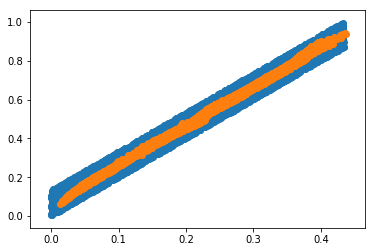

tensor(11.3753, grad_fn=<AddBackward0>)
X_sample tensor([[0.3515, 0.7710],
        [0.2139, 0.4931],
        [0.0327, 0.1174],
        ...,
        [0.3777, 0.8316],
        [0.1127, 0.2913],
        [0.3546, 0.7778]])


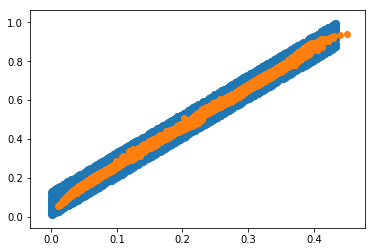

tensor(11.4538, grad_fn=<AddBackward0>)
X_sample tensor([[0.0380, 0.1322],
        [0.2242, 0.5187],
        [0.2270, 0.5251],
        ...,
        [0.3850, 0.8517],
        [0.1784, 0.4256],
        [0.2317, 0.5304]])


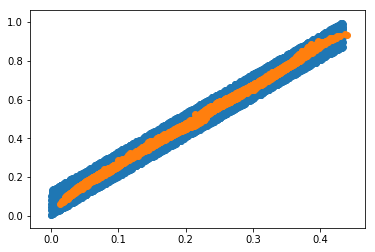

tensor(11.4389, grad_fn=<AddBackward0>)
X_sample tensor([[0.2440, 0.5584],
        [0.0549, 0.1812],
        [0.2941, 0.6577],
        ...,
        [0.1542, 0.3763],
        [0.2572, 0.5863],
        [0.3840, 0.8552]])


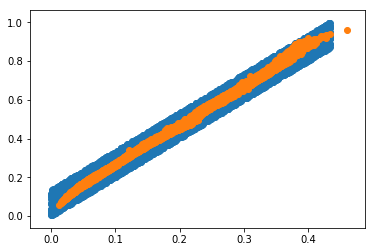

tensor(11.4045, grad_fn=<AddBackward0>)
X_sample tensor([[0.3571, 0.8001],
        [0.1147, 0.2961],
        [0.1578, 0.3896],
        ...,
        [0.1353, 0.3441],
        [0.3289, 0.7237],
        [0.3664, 0.8001]])


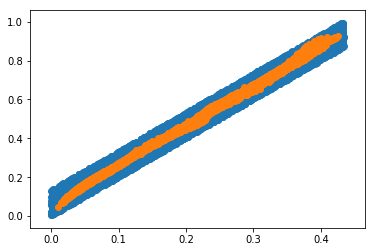

tensor(11.3878, grad_fn=<AddBackward0>)
X_sample tensor([[0.3576, 0.7648],
        [0.3585, 0.7755],
        [0.1101, 0.2835],
        ...,
        [0.1596, 0.3792],
        [0.1063, 0.2737],
        [0.3898, 0.8459]])


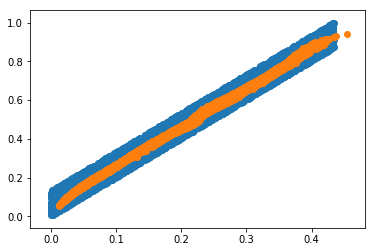

tensor(11.3899, grad_fn=<AddBackward0>)
X_sample tensor([[0.3503, 0.7522],
        [0.2084, 0.4811],
        [0.3034, 0.6556],
        ...,
        [0.3205, 0.7003],
        [0.3374, 0.7316],
        [0.0822, 0.2269]])


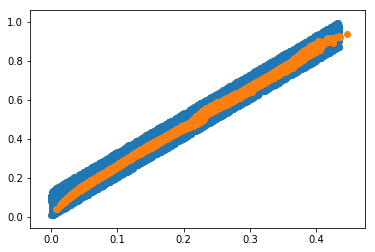

tensor(11.4753, grad_fn=<AddBackward0>)
X_sample tensor([[0.0516, 0.1635],
        [0.2711, 0.6074],
        [0.1432, 0.3592],
        ...,
        [0.3531, 0.7756],
        [0.3641, 0.7976],
        [0.1867, 0.4378]])


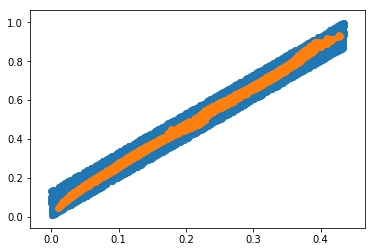

tensor(11.4491, grad_fn=<AddBackward0>)
X_sample tensor([[0.2650, 0.6050],
        [0.1007, 0.2692],
        [0.3276, 0.7153],
        ...,
        [0.3364, 0.7409],
        [0.3440, 0.7681],
        [0.0673, 0.1969]])


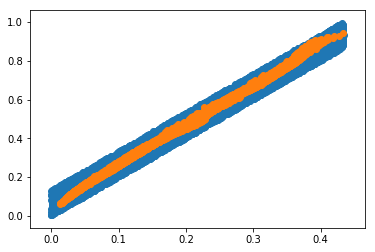

tensor(11.4622, grad_fn=<AddBackward0>)
X_sample tensor([[0.1979, 0.4630],
        [0.1641, 0.4088],
        [0.0434, 0.1447],
        ...,
        [0.1948, 0.4573],
        [0.2494, 0.5739],
        [0.3147, 0.6923]])


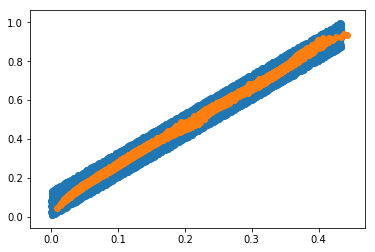

tensor(11.4358, grad_fn=<AddBackward0>)
X_sample tensor([[0.1479, 0.3666],
        [0.0730, 0.2134],
        [0.4061, 0.8751],
        ...,
        [0.3757, 0.8206],
        [0.0478, 0.1641],
        [0.2971, 0.6644]])


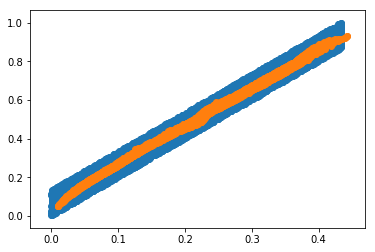

tensor(11.4649, grad_fn=<AddBackward0>)
X_sample tensor([[0.2633, 0.5896],
        [0.0264, 0.1078],
        [0.0565, 0.1716],
        ...,
        [0.1026, 0.2748],
        [0.3092, 0.6770],
        [0.0547, 0.1767]])


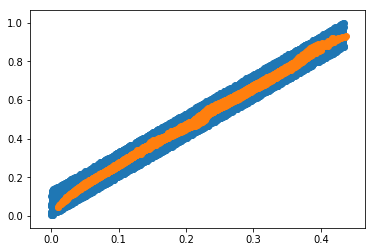

tensor(11.3983, grad_fn=<AddBackward0>)
X_sample tensor([[0.0661, 0.1976],
        [0.1714, 0.4041],
        [0.3439, 0.7558],
        ...,
        [0.0785, 0.2215],
        [0.2663, 0.6056],
        [0.3602, 0.7850]])


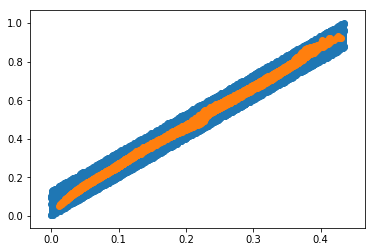

tensor(11.4296, grad_fn=<AddBackward0>)
X_sample tensor([[0.3476, 0.7575],
        [0.3500, 0.7592],
        [0.2399, 0.5510],
        ...,
        [0.1264, 0.3134],
        [0.0383, 0.1304],
        [0.0592, 0.1745]])


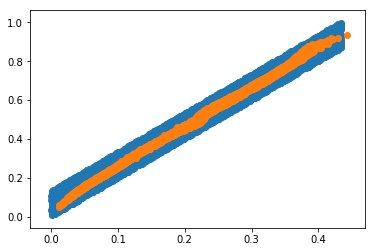

tensor(11.4036, grad_fn=<AddBackward0>)
X_sample tensor([[0.3435, 0.7468],
        [0.2356, 0.5372],
        [0.2843, 0.6436],
        ...,
        [0.2987, 0.6718],
        [0.1128, 0.2883],
        [0.1687, 0.4018]])


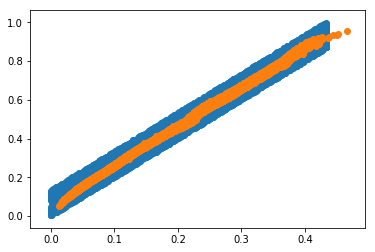

tensor(11.4248, grad_fn=<AddBackward0>)
X_sample tensor([[0.2019, 0.4535],
        [0.2790, 0.6304],
        [0.3786, 0.8355],
        ...,
        [0.1612, 0.3968],
        [0.2580, 0.5941],
        [0.2521, 0.5900]])


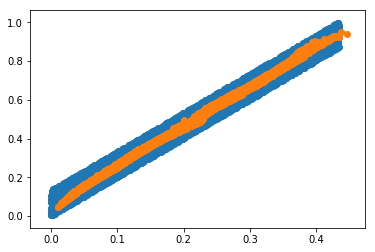

tensor(11.3921, grad_fn=<AddBackward0>)
X_sample tensor([[0.2759, 0.6309],
        [0.1645, 0.3964],
        [0.1691, 0.4072],
        ...,
        [0.3318, 0.7429],
        [0.2537, 0.5917],
        [0.3586, 0.7903]])


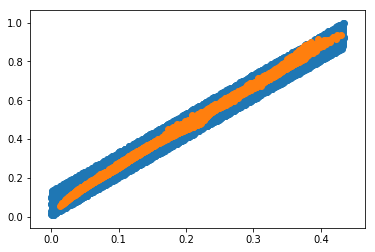

tensor(11.4374, grad_fn=<AddBackward0>)
X_sample tensor([[0.1191, 0.3007],
        [0.0346, 0.1178],
        [0.1076, 0.2816],
        ...,
        [0.3074, 0.6804],
        [0.2224, 0.5080],
        [0.1934, 0.4425]])


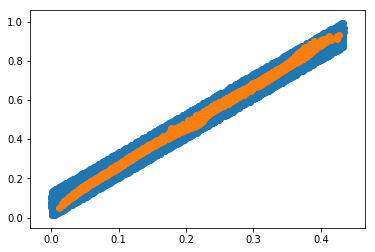

tensor(11.4273, grad_fn=<AddBackward0>)
X_sample tensor([[0.3796, 0.8245],
        [0.0821, 0.2249],
        [0.2203, 0.5012],
        ...,
        [0.3677, 0.8071],
        [0.3296, 0.7270],
        [0.3084, 0.6824]])


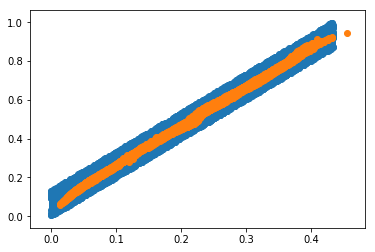

tensor(11.3929, grad_fn=<AddBackward0>)
X_sample tensor([[0.3007, 0.6574],
        [0.3872, 0.8474],
        [0.2887, 0.6276],
        ...,
        [0.2343, 0.5506],
        [0.2208, 0.4995],
        [0.0678, 0.2000]])


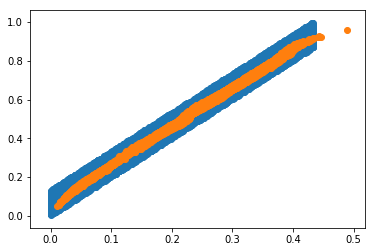

tensor(11.3707, grad_fn=<AddBackward0>)
X_sample tensor([[0.3591, 0.7712],
        [0.0971, 0.2575],
        [0.3029, 0.6761],
        ...,
        [0.0631, 0.1970],
        [0.1747, 0.4300],
        [0.3839, 0.8273]])


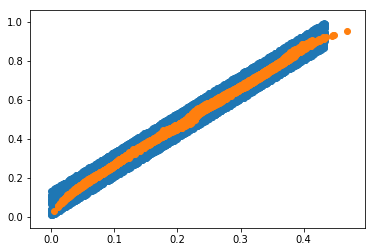

tensor(11.3887, grad_fn=<AddBackward0>)
X_sample tensor([[0.3946, 0.8612],
        [0.2659, 0.5999],
        [0.1246, 0.3238],
        ...,
        [0.2208, 0.5200],
        [0.1131, 0.2981],
        [0.0900, 0.2448]])


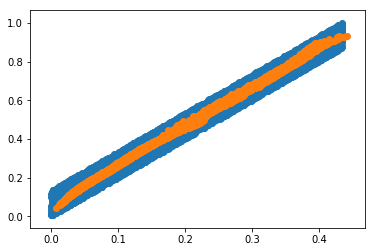

tensor(11.4350, grad_fn=<AddBackward0>)
X_sample tensor([[0.3354, 0.7562],
        [0.2373, 0.5431],
        [0.2677, 0.6098],
        ...,
        [0.1970, 0.4843],
        [0.0511, 0.1631],
        [0.3000, 0.6676]])


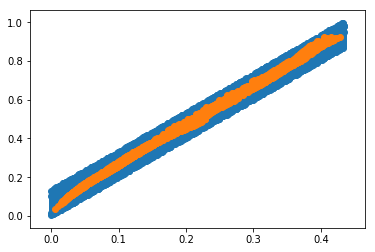

tensor(11.4356, grad_fn=<AddBackward0>)
X_sample tensor([[0.3598, 0.7943],
        [0.3417, 0.7507],
        [0.0554, 0.1650],
        ...,
        [0.1251, 0.3280],
        [0.1089, 0.2877],
        [0.3388, 0.7530]])


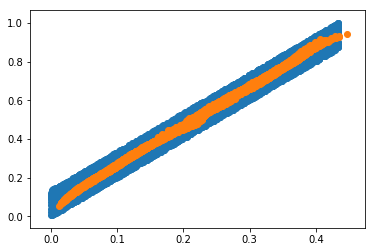

tensor(11.4783, grad_fn=<AddBackward0>)
X_sample tensor([[0.2467, 0.5638],
        [0.2948, 0.6505],
        [0.3989, 0.8768],
        ...,
        [0.0913, 0.2455],
        [0.1383, 0.3495],
        [0.1694, 0.4012]])


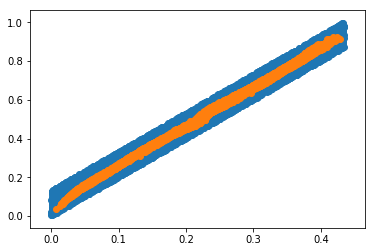

tensor(11.3856, grad_fn=<AddBackward0>)
X_sample tensor([[0.1698, 0.4048],
        [0.2153, 0.4968],
        [0.2419, 0.5473],
        ...,
        [0.0913, 0.2466],
        [0.2772, 0.6073],
        [0.1897, 0.4374]])


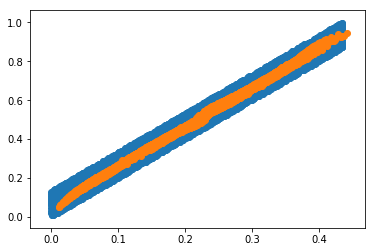

tensor(11.3978, grad_fn=<AddBackward0>)
X_sample tensor([[0.1319, 0.3362],
        [0.3471, 0.7599],
        [0.0757, 0.2180],
        ...,
        [0.3743, 0.8217],
        [0.0564, 0.1745],
        [0.1098, 0.2876]])


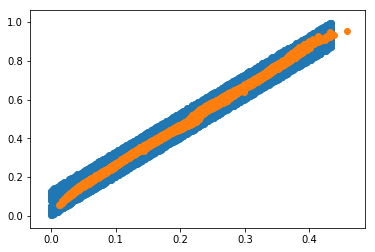

tensor(11.4270, grad_fn=<AddBackward0>)
X_sample tensor([[0.1313, 0.3323],
        [0.1767, 0.4155],
        [0.1606, 0.3935],
        ...,
        [0.3751, 0.8267],
        [0.2558, 0.5814],
        [0.1238, 0.3117]])


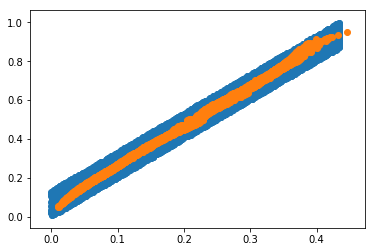

tensor(11.4050, grad_fn=<AddBackward0>)
X_sample tensor([[0.1378, 0.3445],
        [0.2291, 0.5186],
        [0.0727, 0.2141],
        ...,
        [0.1960, 0.4633],
        [0.3772, 0.8383],
        [0.0853, 0.2358]])


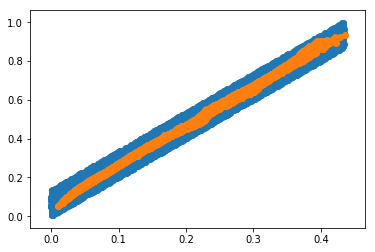

tensor(11.4241, grad_fn=<AddBackward0>)
X_sample tensor([[0.3252, 0.7083],
        [0.1038, 0.2787],
        [0.3407, 0.7510],
        ...,
        [0.3256, 0.7196],
        [0.0593, 0.1806],
        [0.2937, 0.6568]])


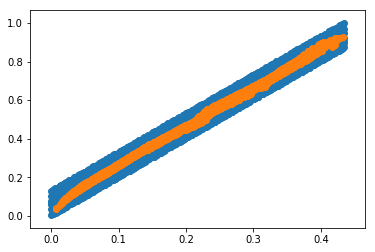

tensor(11.4065, grad_fn=<AddBackward0>)
X_sample tensor([[0.1883, 0.4402],
        [0.2313, 0.5283],
        [0.1865, 0.4371],
        ...,
        [0.2935, 0.6493],
        [0.0890, 0.2452],
        [0.1331, 0.3334]])


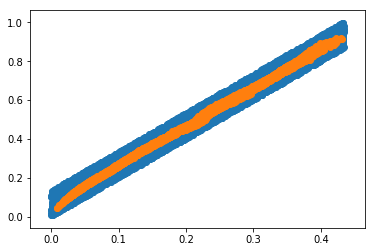

tensor(11.4777, grad_fn=<AddBackward0>)
X_sample tensor([[0.1246, 0.3216],
        [0.2497, 0.5780],
        [0.1805, 0.4327],
        ...,
        [0.0780, 0.2135],
        [0.1751, 0.4206],
        [0.2301, 0.5263]])


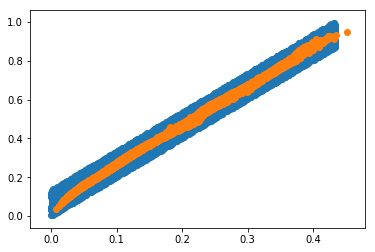

tensor(11.3855, grad_fn=<AddBackward0>)
X_sample tensor([[0.2000, 0.4677],
        [0.1830, 0.4377],
        [0.1148, 0.2978],
        ...,
        [0.1107, 0.2883],
        [0.1510, 0.3745],
        [0.0432, 0.1399]])


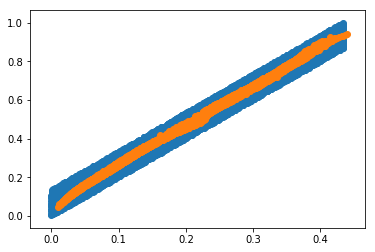

tensor(11.4311, grad_fn=<AddBackward0>)
X_sample tensor([[0.3824, 0.8560],
        [0.0982, 0.2673],
        [0.0722, 0.2102],
        ...,
        [0.2649, 0.5900],
        [0.3647, 0.7970],
        [0.0984, 0.2614]])


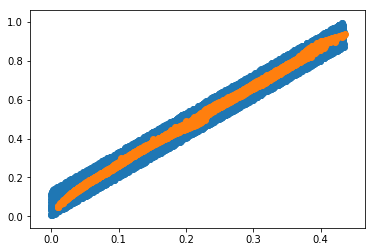

tensor(11.4199, grad_fn=<AddBackward0>)
X_sample tensor([[0.0877, 0.2451],
        [0.1833, 0.4407],
        [0.2442, 0.5491],
        ...,
        [0.0824, 0.2290],
        [0.0695, 0.2060],
        [0.2291, 0.4981]])


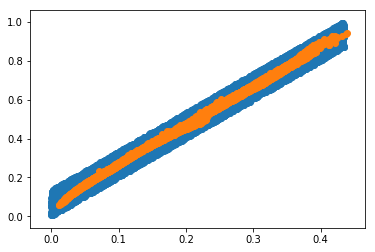

tensor(11.4134, grad_fn=<AddBackward0>)
X_sample tensor([[0.2248, 0.5199],
        [0.2101, 0.4806],
        [0.3343, 0.7477],
        ...,
        [0.2473, 0.5760],
        [0.0508, 0.1634],
        [0.1145, 0.3000]])


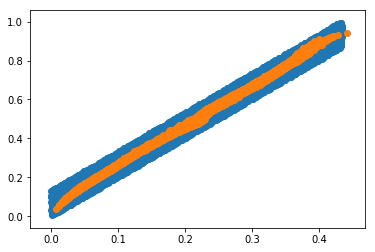

tensor(11.4152, grad_fn=<AddBackward0>)
X_sample tensor([[0.3864, 0.8667],
        [0.2856, 0.6389],
        [0.1591, 0.3905],
        ...,
        [0.2280, 0.5200],
        [0.3689, 0.8036],
        [0.3663, 0.7986]])


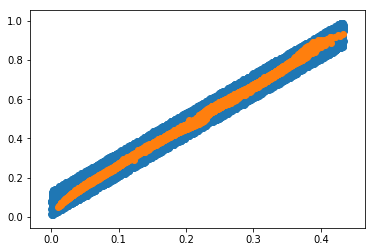

tensor(11.4066, grad_fn=<AddBackward0>)
X_sample tensor([[0.3255, 0.7077],
        [0.0807, 0.2146],
        [0.3701, 0.8186],
        ...,
        [0.2765, 0.6190],
        [0.1906, 0.4402],
        [0.2074, 0.4753]])


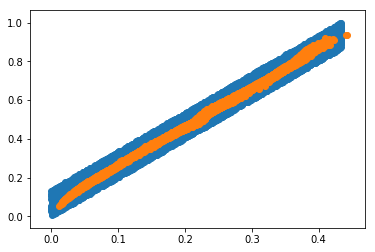

tensor(11.4199, grad_fn=<AddBackward0>)
X_sample tensor([[0.0834, 0.2294],
        [0.3339, 0.7262],
        [0.2313, 0.5199],
        ...,
        [0.0315, 0.1178],
        [0.1009, 0.2689],
        [0.2795, 0.6324]])


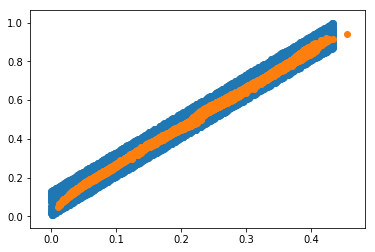

tensor(11.4471, grad_fn=<AddBackward0>)
X_sample tensor([[0.1607, 0.3879],
        [0.3571, 0.7869],
        [0.3491, 0.7669],
        ...,
        [0.2453, 0.5542],
        [0.0972, 0.2595],
        [0.3705, 0.8045]])


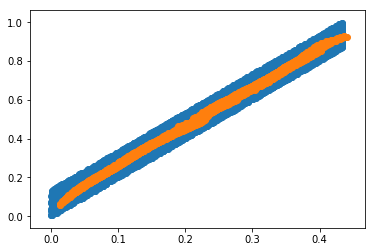

tensor(11.4263, grad_fn=<AddBackward0>)
X_sample tensor([[0.3252, 0.7141],
        [0.2359, 0.5336],
        [0.2757, 0.6295],
        ...,
        [0.3053, 0.7017],
        [0.2286, 0.5208],
        [0.1660, 0.4077]])


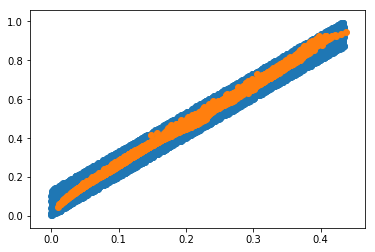

tensor(11.4205, grad_fn=<AddBackward0>)
X_sample tensor([[0.0841, 0.2300],
        [0.2196, 0.4971],
        [0.3734, 0.8664],
        ...,
        [0.1096, 0.2793],
        [0.0766, 0.2183],
        [0.1920, 0.4566]])


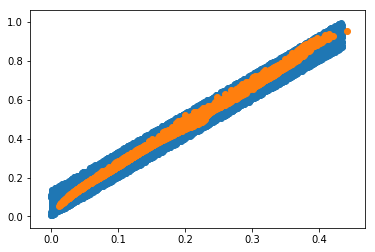

tensor(11.4273, grad_fn=<AddBackward0>)
X_sample tensor([[0.3465, 0.7623],
        [0.0346, 0.1217],
        [0.3124, 0.6889],
        ...,
        [0.2013, 0.4669],
        [0.2499, 0.5769],
        [0.1635, 0.3925]])


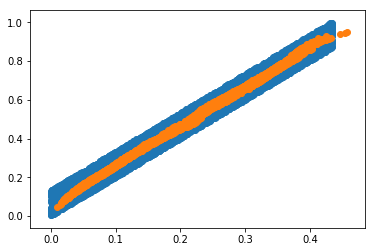

tensor(11.4114, grad_fn=<AddBackward0>)
X_sample tensor([[0.3743, 0.8094],
        [0.2295, 0.5107],
        [0.3329, 0.7181],
        ...,
        [0.2053, 0.4771],
        [0.2413, 0.5513],
        [0.2449, 0.5552]])


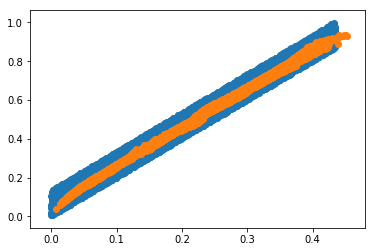

tensor(11.4158, grad_fn=<AddBackward0>)
X_sample tensor([[0.2844, 0.6370],
        [0.3657, 0.7992],
        [0.2090, 0.4832],
        ...,
        [0.2142, 0.4847],
        [0.3097, 0.6793],
        [0.0582, 0.1776]])


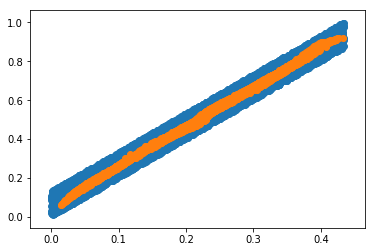

tensor(11.4054, grad_fn=<AddBackward0>)
X_sample tensor([[0.1895, 0.4429],
        [0.1621, 0.3970],
        [0.3613, 0.8182],
        ...,
        [0.1607, 0.3981],
        [0.0731, 0.2078],
        [0.2566, 0.5953]])


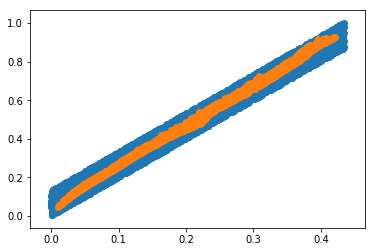

tensor(11.4457, grad_fn=<AddBackward0>)
X_sample tensor([[0.3713, 0.8189],
        [0.1925, 0.4575],
        [0.2660, 0.6055],
        ...,
        [0.3292, 0.7381],
        [0.1518, 0.3704],
        [0.2694, 0.6155]])


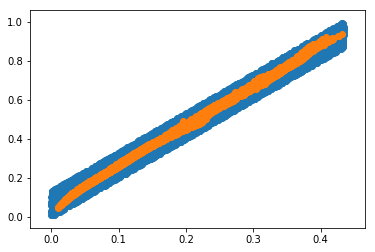

tensor(11.4738, grad_fn=<AddBackward0>)
X_sample tensor([[0.1207, 0.3116],
        [0.3487, 0.7552],
        [0.0659, 0.2001],
        ...,
        [0.3235, 0.7159],
        [0.3733, 0.7961],
        [0.1924, 0.4528]])


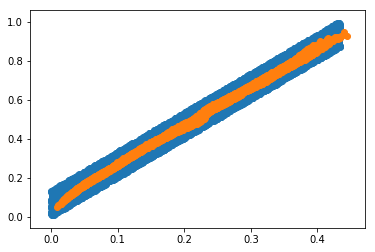

tensor(11.4051, grad_fn=<AddBackward0>)
X_sample tensor([[0.3732, 0.8119],
        [0.1971, 0.4677],
        [0.2077, 0.4786],
        ...,
        [0.1403, 0.3491],
        [0.3021, 0.6752],
        [0.4079, 0.8861]])


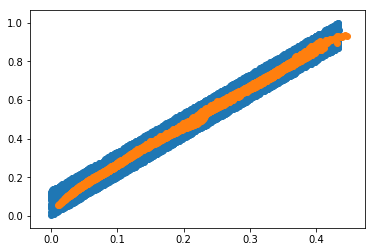

tensor(11.4155, grad_fn=<AddBackward0>)
X_sample tensor([[0.3317, 0.7337],
        [0.1466, 0.3643],
        [0.3638, 0.7961],
        ...,
        [0.3283, 0.7161],
        [0.3568, 0.7836],
        [0.2776, 0.6323]])


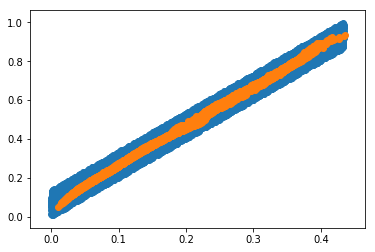

tensor(11.4404, grad_fn=<AddBackward0>)
X_sample tensor([[0.2716, 0.6124],
        [0.1090, 0.2949],
        [0.3641, 0.8051],
        ...,
        [0.3400, 0.7433],
        [0.0879, 0.2432],
        [0.1352, 0.3332]])


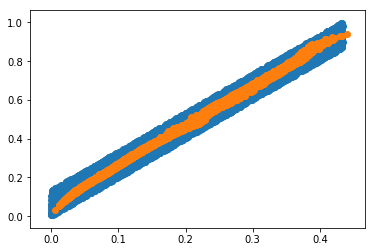

tensor(11.4208, grad_fn=<AddBackward0>)
X_sample tensor([[0.3130, 0.6956],
        [0.3419, 0.7575],
        [0.3995, 0.8871],
        ...,
        [0.2266, 0.5154],
        [0.1711, 0.4111],
        [0.3618, 0.7919]])


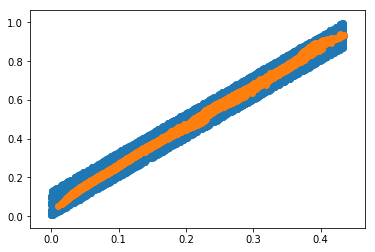

tensor(11.4339, grad_fn=<AddBackward0>)
X_sample tensor([[0.2557, 0.5706],
        [0.0995, 0.2589],
        [0.2629, 0.5948],
        ...,
        [0.2936, 0.6627],
        [0.2406, 0.5674],
        [0.2548, 0.5767]])


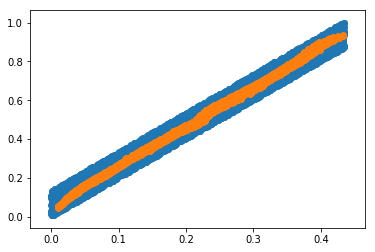

tensor(11.3968, grad_fn=<AddBackward0>)
X_sample tensor([[0.1318, 0.3314],
        [0.3703, 0.8144],
        [0.2003, 0.4623],
        ...,
        [0.0490, 0.1645],
        [0.1358, 0.3372],
        [0.3562, 0.7867]])


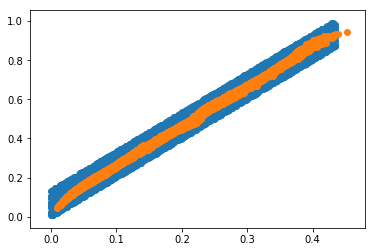

tensor(11.4747, grad_fn=<AddBackward0>)
X_sample tensor([[0.0984, 0.2622],
        [0.2488, 0.5763],
        [0.3742, 0.8309],
        ...,
        [0.1678, 0.4053],
        [0.1946, 0.4616],
        [0.3412, 0.7514]])


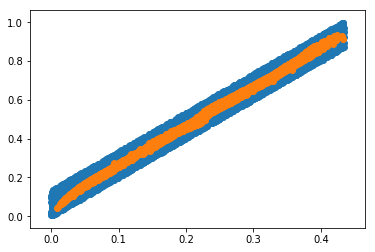

tensor(11.4352, grad_fn=<AddBackward0>)
X_sample tensor([[0.0347, 0.1231],
        [0.2603, 0.5965],
        [0.3057, 0.6870],
        ...,
        [0.0778, 0.2197],
        [0.1577, 0.3858],
        [0.1905, 0.4466]])


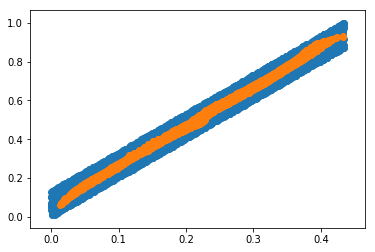

tensor(11.4500, grad_fn=<AddBackward0>)
X_sample tensor([[0.1795, 0.4251],
        [0.0439, 0.1497],
        [0.1586, 0.3825],
        ...,
        [0.0934, 0.2529],
        [0.0215, 0.0907],
        [0.1061, 0.2814]])


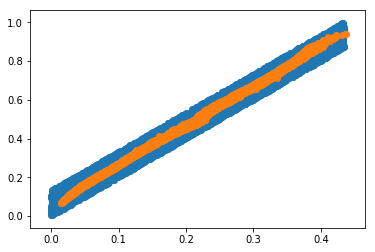

tensor(11.3604, grad_fn=<AddBackward0>)
X_sample tensor([[0.1498, 0.3712],
        [0.3550, 0.7813],
        [0.0446, 0.1527],
        ...,
        [0.2747, 0.6126],
        [0.1334, 0.3367],
        [0.1621, 0.3975]])


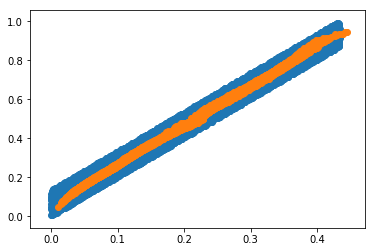

tensor(11.3801, grad_fn=<AddBackward0>)
X_sample tensor([[0.2000, 0.4604],
        [0.2798, 0.6292],
        [0.1899, 0.4348],
        ...,
        [0.0761, 0.2135],
        [0.3020, 0.6663],
        [0.2260, 0.5083]])


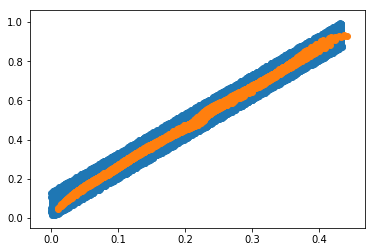

tensor(11.4401, grad_fn=<AddBackward0>)
X_sample tensor([[0.3959, 0.8671],
        [0.0784, 0.2167],
        [0.1986, 0.4502],
        ...,
        [0.2098, 0.4795],
        [0.3914, 0.8523],
        [0.2795, 0.6303]])


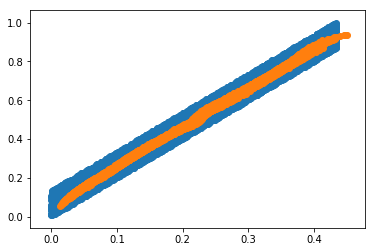

tensor(11.4269, grad_fn=<AddBackward0>)
X_sample tensor([[0.3349, 0.7387],
        [0.1986, 0.4659],
        [0.4267, 0.9157],
        ...,
        [0.0944, 0.2533],
        [0.2582, 0.5976],
        [0.2610, 0.5964]])


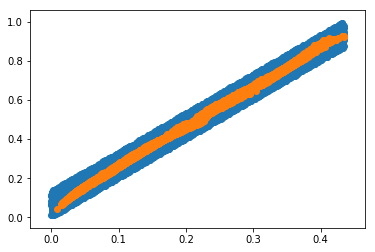

tensor(11.3907, grad_fn=<AddBackward0>)
X_sample tensor([[0.3983, 0.8928],
        [0.3337, 0.7388],
        [0.2178, 0.5116],
        ...,
        [0.2133, 0.4885],
        [0.3834, 0.8516],
        [0.3763, 0.8384]])


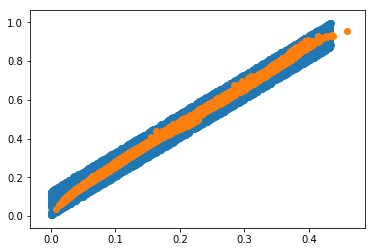

tensor(11.3766, grad_fn=<AddBackward0>)
X_sample tensor([[0.0581, 0.1721],
        [0.3434, 0.7596],
        [0.2065, 0.4764],
        ...,
        [0.3395, 0.7479],
        [0.3730, 0.8314],
        [0.1209, 0.3052]])


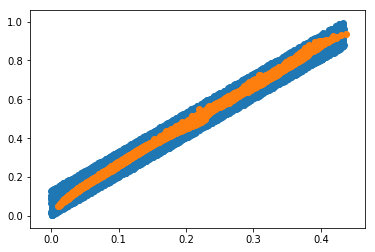

tensor(11.4016, grad_fn=<AddBackward0>)
X_sample tensor([[0.1179, 0.2998],
        [0.1247, 0.3216],
        [0.2658, 0.6070],
        ...,
        [0.3435, 0.7606],
        [0.0613, 0.1823],
        [0.0389, 0.1304]])


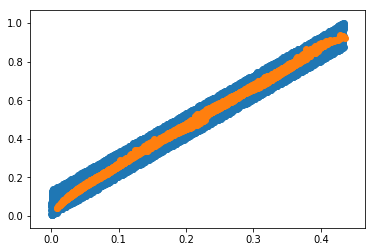

tensor(11.4347, grad_fn=<AddBackward0>)
X_sample tensor([[0.2551, 0.5887],
        [0.1709, 0.4110],
        [0.3538, 0.7774],
        ...,
        [0.3360, 0.7279],
        [0.2818, 0.6357],
        [0.0889, 0.2409]])


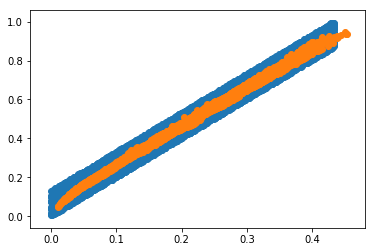

tensor(11.4099, grad_fn=<AddBackward0>)
X_sample tensor([[0.2573, 0.5825],
        [0.3503, 0.7728],
        [0.1367, 0.3464],
        ...,
        [0.0588, 0.1858],
        [0.1353, 0.3429],
        [0.2733, 0.6073]])


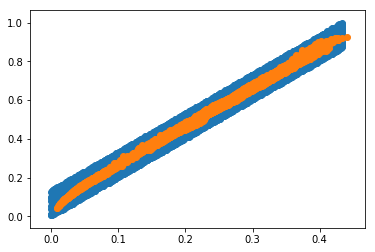

tensor(11.4048, grad_fn=<AddBackward0>)
X_sample tensor([[0.1136, 0.3056],
        [0.3175, 0.7090],
        [0.2873, 0.6388],
        ...,
        [0.1750, 0.4190],
        [0.2631, 0.6070],
        [0.3203, 0.7050]])


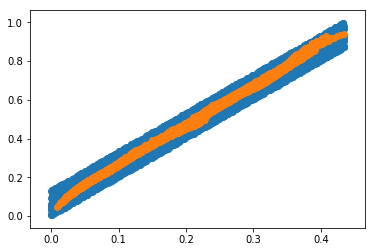

tensor(11.4424, grad_fn=<AddBackward0>)
X_sample tensor([[0.2839, 0.6438],
        [0.3579, 0.7941],
        [0.1280, 0.3268],
        ...,
        [0.0518, 0.1660],
        [0.0700, 0.2046],
        [0.3159, 0.6948]])


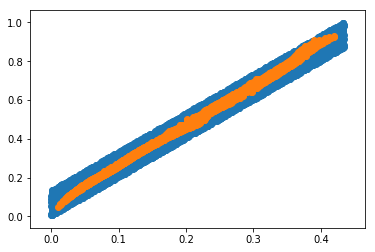

tensor(11.4303, grad_fn=<AddBackward0>)
X_sample tensor([[0.0724, 0.2079],
        [0.2423, 0.5512],
        [0.2849, 0.6349],
        ...,
        [0.1870, 0.4348],
        [0.1414, 0.3507],
        [0.2899, 0.6487]])


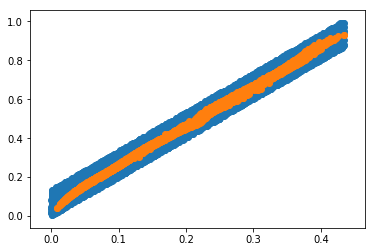

tensor(11.4849, grad_fn=<AddBackward0>)
X_sample tensor([[0.3465, 0.7456],
        [0.0887, 0.2375],
        [0.0279, 0.1070],
        ...,
        [0.1968, 0.4532],
        [0.2066, 0.4721],
        [0.2300, 0.5210]])


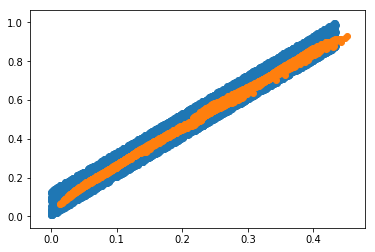

tensor(11.4518, grad_fn=<AddBackward0>)
X_sample tensor([[0.1181, 0.3025],
        [0.3984, 0.8604],
        [0.3588, 0.7742],
        ...,
        [0.3649, 0.7959],
        [0.2022, 0.4686],
        [0.1420, 0.3556]])


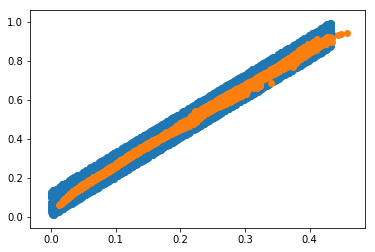

tensor(11.3993, grad_fn=<AddBackward0>)
X_sample tensor([[0.1129, 0.2946],
        [0.3226, 0.7111],
        [0.2684, 0.6063],
        ...,
        [0.2079, 0.4710],
        [0.1793, 0.4232],
        [0.0637, 0.1856]])


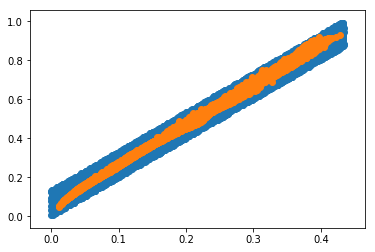

tensor(11.4368, grad_fn=<AddBackward0>)
X_sample tensor([[0.1200, 0.3054],
        [0.2656, 0.5883],
        [0.1750, 0.4162],
        ...,
        [0.2049, 0.4821],
        [0.3049, 0.6842],
        [0.3574, 0.8245]])


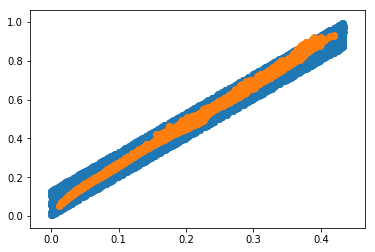

tensor(11.4234, grad_fn=<AddBackward0>)
X_sample tensor([[0.3847, 0.8504],
        [0.3479, 0.7755],
        [0.2217, 0.4837],
        ...,
        [0.1213, 0.3036],
        [0.3661, 0.8051],
        [0.3954, 0.8701]])


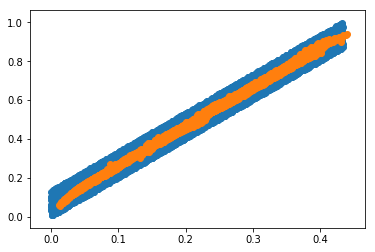

tensor(11.4656, grad_fn=<AddBackward0>)
X_sample tensor([[0.3396, 0.7224],
        [0.1249, 0.3172],
        [0.1031, 0.2782],
        ...,
        [0.2800, 0.6121],
        [0.0486, 0.1603],
        [0.3228, 0.7002]])


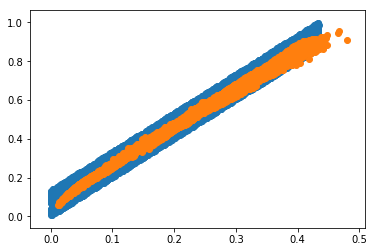

tensor(11.4461, grad_fn=<AddBackward0>)
X_sample tensor([[0.1632, 0.3974],
        [0.2452, 0.5749],
        [0.2269, 0.5163],
        ...,
        [0.0508, 0.1675],
        [0.1863, 0.4306],
        [0.3616, 0.8052]])


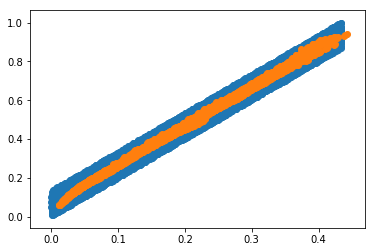

tensor(11.4522, grad_fn=<AddBackward0>)
X_sample tensor([[0.1406, 0.3496],
        [0.3491, 0.7858],
        [0.1890, 0.4424],
        ...,
        [0.2995, 0.6783],
        [0.0416, 0.1447],
        [0.0967, 0.2624]])


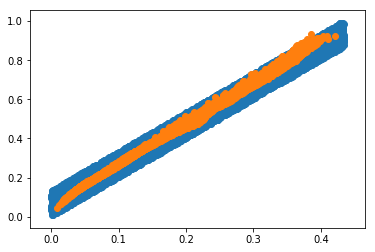

tensor(11.4197, grad_fn=<AddBackward0>)
X_sample tensor([[0.3098, 0.6879],
        [0.0914, 0.2430],
        [0.0475, 0.1608],
        ...,
        [0.0658, 0.1918],
        [0.0530, 0.1736],
        [0.0767, 0.2141]])


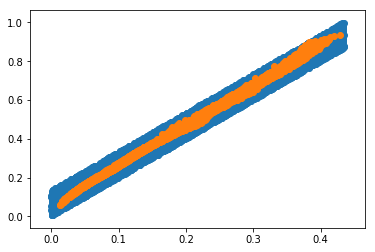

tensor(11.4312, grad_fn=<AddBackward0>)
X_sample tensor([[0.3757, 0.8038],
        [0.0825, 0.2283],
        [0.0211, 0.0883],
        ...,
        [0.0988, 0.2609],
        [0.2531, 0.5842],
        [0.4312, 0.9092]])


KeyboardInterrupt: ignored

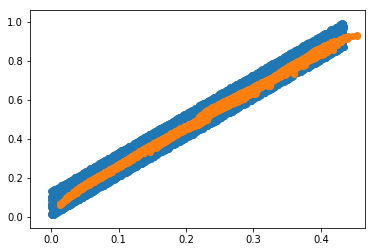

In [0]:
# =============================== TRAINING ====================================

params = [Wxh, bxh, Whz_mu, bhz_mu, Whz_var, bhz_var,
          Wzh, bzh, Whx, bhx]

solver = optim.Adam(params, lr=lr)

losses = []

for it in range(1000):
    perm = torch.randperm(100000)
    idx = perm[:mb_size]
    samples = XX[idx]
    X = samples
    
    # Forward
    z_mu, z_var = Q(X)
    z = sample_z(z_mu, z_var)
    X_sample = P(z)

    if it == 1:
      print('idx',idx)
      print('X',X)
      print('X_sample',X_sample)
      
    # Loss
    recon_loss = nn.binary_cross_entropy(X_sample, X, size_average=False) / mb_size
    kl_loss = torch.mean(0.5 * torch.sum(torch.exp(z_var) + z_mu**2 - 1. - z_var, 1))
    loss = 10*recon_loss + kl_loss

    # Backward
    loss.backward()

    # Update
    solver.step()

    # Housekeeping
    for p in params:
        if p.grad is not None:
            data = p.grad.data
            p.grad = Variable(data.new().resize_as_(data).zero_())

    # Print and plot every now and then
    if it % 1 == 0:
      #print(X_sample)
      print(loss)
      losses.append(loss.detach().numpy())
      plt.scatter(X.numpy().T[0],X.numpy().T[1])
      print('X_sample',X_sample.detach())
      plt.scatter(X_sample.detach().numpy().T[0],X_sample.detach().numpy().T[1])
      plt.show()

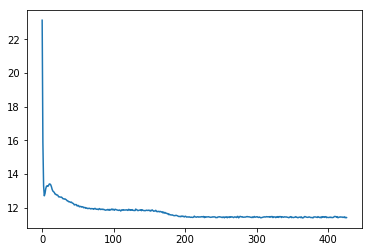

In [0]:
plt.plot([_ for _ in range(427)],losses)

/usr/local/lib/python3.6/dist-packages/torch/nn/functional.py:1350: UserWarning: nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.
  warnings.warn("nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.")


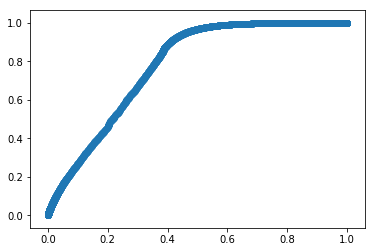

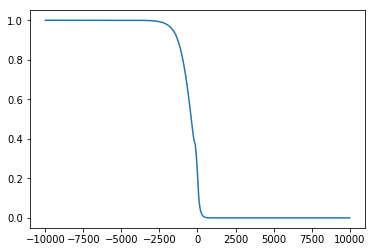

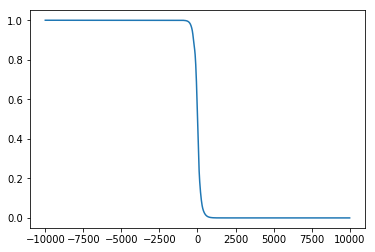

In [0]:
optx = []
opty = []
I = []
for i in range(-10000, 10000):
  I.append(i)
  optx.append(P(torch.Tensor([i/100])).detach().numpy()[0][0])
  opty.append(P(torch.Tensor([i/100])).detach().numpy()[0][1]) 

plt.scatter(optx,opty)
plt.show()
plt.plot(I,optx)
plt.show()
plt.plot(I,opty)
plt.show()

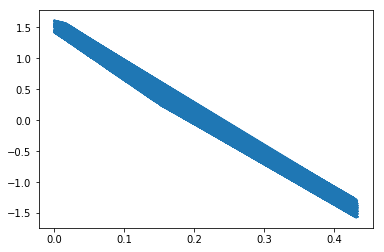

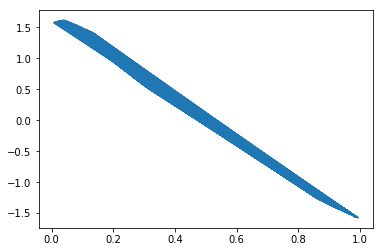

In [0]:
zs = []
xs = []
ys = []
for i in X:
  xs.append(i.numpy()[0])
  ys.append(i.numpy()[1])
  zs.append(Q(i)[0][0].item())

plt.plot(xs,zs)
plt.show()
plt.plot(ys,zs)
plt.show()